In [2]:
import os, cv2
from skimage.io import imread, imshow, imsave
from skimage.draw import line
from skimage.morphology import skeletonize, dilation
from scipy.ndimage import label, find_objects
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymorph
import mahotas as mh
from scipy import spatial
from bresenham import bresenham
import networkx as nx
from collections import deque
import pickle
import concurrent.futures
import random, math
from pysal.explore import esda
from pysal.lib import weights
import warnings; warnings.filterwarnings('ignore')

def add_node0(G1, pos1, rand=False):
    def get_random_edge_length(G):
        edge = random.choice(list(G.edges()))
        node1, node2 = edge
        length = math.sqrt((node1[0] - node2[0]) ** 2 + (node1[1] - node2[1]) ** 2)
        return length
    G1p = G1.copy()
    pos1p = pos1.copy()
    length = get_random_edge_length(G1p)
    if rand:
        existing_node = random.choice(list(G1p.nodes()))
        offset_x = random.uniform(-length, length)
        offset_y = random.uniform(-length, length)
        if type(max(G1p.nodes()))==type((3,4)):
            new_node_id = (max(G1p.nodes())[0] + 1, max(G1p.nodes())[1] + 1)
        else:
            new_node_id = max(G1p.nodes()) + 1
        G1p.add_node(new_node_id)
        G1p.add_edge(new_node_id, existing_node)
        new_node_position = (pos1p[existing_node][0] + offset_x, pos1p[existing_node][1] + offset_y)
        pos1p[new_node_id] = new_node_position
    else:
        existing_node = list(G1p.nodes())[-1]
        new_node_id = (existing_node[0], existing_node[1] + 1)
        G1p.add_node(new_node_id)
        G1p.add_edge(new_node_id, existing_node)
        new_node_position = (pos1p[existing_node][0] + length, pos1p[existing_node][1] - length)
        pos1p[new_node_id] = new_node_position
    return [G1p, pos1p]

def grapher(tp, out=None, clean=False, pad=True):
    def skel_to_graph(skeIm, connectivity=2):
        assert(len(skeIm.shape) == 2)
        skeImPos = np.stack(np.where(skeIm))
        skeImPosIm = np.zeros_like(skeIm, dtype=np.int32)
        skeImPosIm[skeImPos[0], skeImPos[1]] = np.arange(0, skeImPos.shape[1])
        g = nx.Graph()
        if connectivity == 1:
            neigh = np.array([[0, 1], [0, -1], [1, 0], [-1, 0]])
        elif connectivity == 2:
            neigh = np.array([[0, 1], [0, -1], [1, 0], [-1, 0], [1, 1], [1, -1], [-1, 1], [-1, -1]])
        else:
            raise ValueError(f'unsupported connectivity {connectivity}')
        for idx in range(skeImPos[0].shape[0]):
            for neighIdx in range(neigh.shape[0]):
                curNeighPos = skeImPos[:, idx] + neigh[neighIdx]
                if np.any(curNeighPos<0) or np.any(curNeighPos>=skeIm.shape):
                    continue
                if skeIm[curNeighPos[0], curNeighPos[1]] > 0:
                    g.add_edge(skeImPosIm[skeImPos[0, idx], skeImPos[1, idx]], skeImPosIm[curNeighPos[0], curNeighPos[1]], weight=np.linalg.norm(neigh[neighIdx]))
        return g
    
    def skeletonizer(img):
        (thresh, bw) = cv2.threshold(img, 0, 1, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
        skeleton_lee = skeletonize(bw, method='lee')
        return skeleton_lee
    
    def branchedPoints(skel):
        branch1=np.array([[2, 1, 2], [1, 1, 1], [2, 2, 2]])
        branch2=np.array([[1, 2, 1], [2, 1, 2], [1, 2, 1]])
        branch3=np.array([[1, 2, 1], [2, 1, 2], [1, 2, 2]])
        branch4=np.array([[2, 1, 2], [1, 1, 2], [2, 1, 2]])
        branch5=np.array([[1, 2, 2], [2, 1, 2], [1, 2, 1]])
        branch6=np.array([[2, 2, 2], [1, 1, 1], [2, 1, 2]])
        branch7=np.array([[2, 2, 1], [2, 1, 2], [1, 2, 1]])
        branch8=np.array([[2, 1, 2], [2, 1, 1], [2, 1, 2]])
        branch9=np.array([[1, 2, 1], [2, 1, 2], [2, 2, 1]])
        br1=mh.morph.hitmiss(skel,branch1)
        br2=mh.morph.hitmiss(skel,branch2)
        br3=mh.morph.hitmiss(skel,branch3)
        br4=mh.morph.hitmiss(skel,branch4)
        br5=mh.morph.hitmiss(skel,branch5)
        br6=mh.morph.hitmiss(skel,branch6)
        br7=mh.morph.hitmiss(skel,branch7)
        br8=mh.morph.hitmiss(skel,branch8)
        br9=mh.morph.hitmiss(skel,branch9)
        return br1+br2+br3+br4+br5+br6+br7+br8+br9
    
    def endPoints(skel):
        endpoint1=np.array([[0, 0, 0],
                            [0, 1, 0],
                            [2, 1, 2]])
        
        endpoint2=np.array([[0, 0, 0],
                            [0, 1, 2],
                            [0, 2, 1]])
        
        endpoint3=np.array([[0, 0, 2],
                            [0, 1, 1],
                            [0, 0, 2]])
        
        endpoint4=np.array([[0, 2, 1],
                            [0, 1, 2],
                            [0, 0, 0]])
        
        endpoint5=np.array([[2, 1, 2],
                            [0, 1, 0],
                            [0, 0, 0]])
        
        endpoint6=np.array([[1, 2, 0],
                            [2, 1, 0],
                            [0, 0, 0]])
        
        endpoint7=np.array([[2, 0, 0],
                            [1, 1, 0],
                            [2, 0, 0]])
        
        endpoint8=np.array([[0, 0, 0],
                            [2, 1, 0],
                            [1, 2, 0]])
        
        endpoint9=np.array([[0, 0, 0],
                            [0, 1, 0],
                            [0, 0, 0]])
        
        ep1=mh.morph.hitmiss(skel,endpoint1)
        ep2=mh.morph.hitmiss(skel,endpoint2)
        ep3=mh.morph.hitmiss(skel,endpoint3)
        ep4=mh.morph.hitmiss(skel,endpoint4)
        ep5=mh.morph.hitmiss(skel,endpoint5)
        ep6=mh.morph.hitmiss(skel,endpoint6)
        ep7=mh.morph.hitmiss(skel,endpoint7)
        ep8=mh.morph.hitmiss(skel,endpoint8)
        ep9=mh.morph.hitmiss(skel,endpoint9)
        ep = ep1+ep2+ep3+ep4+ep5+ep6+ep7+ep8+ep9
        return ep
    def pruning(skeleton, size):
        for i in range(0, size):
            endpoints = endPoints(skeleton)
            endpoints = np.logical_not(endpoints)
            skeleton = np.logical_and(skeleton,endpoints)
        return skeleton
    
    def shuffle(a):
        a = list(a)
        random.shuffle(a)
        return a 
    def normalize(arr, upper_bound=255, uint8 = True):
        if arr.max() != arr.min():
            if uint8:
                return ((arr - arr.min())*(upper_bound/(arr.max()-arr.min()))).astype('uint8')
            else:
                return (arr - arr.min())*(upper_bound/(arr.max()-arr.min()))
        else:
            if uint8:
                return arr.astype('uint8')
            else: 
                return arr
    
    def detect_tails2(mask, ep_val=3, bp_vals=[2], out_px_value=5, min_line_length=10):
        mask_bi = cv2.threshold(mask, 0, 1, 8)
        mask = mask_bi[1]
        skel = mh.thin(mask)
        skel = pruning(skel,3)
        bp = branchedPoints(skel)
        ep = endPoints(skel)
        edge = skel-bp
        bps = np.where(bp>0, 1, 0)
        eps = np.where(ep>0, 2, 0)
        combined = bps+eps+skel #ep_val becomes 3 here as a result of combination
        data = combined.copy()
        ep_coords = np.argwhere(data == ep_val)
        lines=dict()
        for p in ep_coords:
            lines.update({f'{list(p)}':[]})
        for point in ep_coords:
            center = point
            lines[f'{list(center)}'].append(list(point))
            no_bp = True
            counter = 0
            while no_bp:
                counter+=1
                tl = [point[0]-1, point[1]-1]
                t = [point[0]-1, point[1]]
                tr = [point[0]-1, point[1]+1]
                l = [point[0], point[1]-1]
                c = [point[0], point[1]]
                r = [point[0], point[1]+1]
                bl = [point[0]+1, point[1]-1]
                b = [point[0]+1, point[1]]
                br = [point[0]+1, point[1]+1]
                ker = [t, r, b, l]
                try:
                    for j in ker:
                        if (data[j[0], j[1]] ==1) & (list(j) not in lines[f'{list(center)}']):
                            lines[f'{list(center)}'].append(list(j))
                            point = j
                        elif data[j[0], j[1]] in bp_vals: #branch points
                            no_bp = False
                    if counter > len(data):
                        no_bp = False
                except:
                    no_bp = False
        filterred_lines = {}
        eliminated_lines = {}
        for key in lines.keys():
            for p in lines[key]:
                if len(lines[key])>=3:
                    if len(lines[key])>=min_line_length:
                        data[p[0],p[1]] = out_px_value
                        filterred_lines.update({key:lines[key]})
                    else:
                        data[p[0],p[1]] = 0
                        ind = list(np.array(key.replace(' ', '').replace('[', '').replace(']', '').split(',')).astype(int))
                        combined[ind[0], ind[1]]=4
                        eliminated_lines.update({key:lines[key]})
                else:
                    data[p[0],p[1]] = 0
        return combined, data, filterred_lines, eliminated_lines
    
    def closeness_loss2(mask, min_line_length=1):
        img, data, lines, eliminated_lines = detect_tails2(mask, ep_val=3, bp_vals=[2], out_px_value=5, min_line_length=min_line_length)
        leaves = len(np.where(img==3)[0])
        branch_points = len(np.where(img==2)[0])
        if branch_points != 0:
            ratio = (leaves/branch_points)*10
            y = 1-(np.e**(-3*ratio))
        else:
            y = 1
        return [leaves, len(np.where(img==1)[0]), ratio, y]
    
    def dynamic_threshold(mask):
        if len(mask.shape) == 3:
            mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
        _, binary_mask = cv2.threshold(mask, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        return binary_mask
    
    def collapse_twos(grid):
        grid0 = grid.copy()
        structure = np.ones((3, 3), dtype=int)  
        labeled_array, num_features = label(grid == 2, structure=structure)
        for i in range(1, num_features + 1):
            slices = find_objects(labeled_array == i)[0]
            top_left = (slices[0].start, slices[1].start)
            grid[labeled_array == i] = 0
            grid[top_left] = 2
        grid1 = np.where((grid + grid0)>3,1,0) + np.where(grid0>0,1,0)
        grid1 = grid1.astype(np.uint8)
        return grid1
    
    def pad_one(image):
        image[0, :] = 255
        image[-1, :] = 255
        image[:, 0] = 255
        image[:, -1] = 255
        return image
    
    def proximity_checker(mask, point, start, end):
        tl = [point[0]-1, point[1]-1]
        t = [point[0]-1, point[1]]
        tr = [point[0]-1, point[1]+1]
        l = [point[0], point[1]-1]
        c = [point[0], point[1]]
        r = [point[0], point[1]+1]
        bl = [point[0]+1, point[1]-1]
        b = [point[0]+1, point[1]]
        br = [point[0]+1, point[1]+1]
        ker = [t, r, b, l, tl, tr, bl, br]
        flag = False
        for j in ker:
            if 0 <= j[0] < mask.shape[0] and 0 <= j[1] < mask.shape[1]:
                if (mask[j[0], j[1]] ==2) & ((j[0], j[1]) != end) & ((j[0], j[1]) != start):
                    flag = True
        return flag
    
    def bfs(start, end, grid):
        if start == end:
            return True
        rows, cols = grid.shape
        queue = deque([start])
        visited = set()
        visited.add(start)
        directions = [(-1, 0), (1, 0), (0, -1), (0, 1), (1,1), (-1,1), (1,-1), (-1,-1)]
        while queue:
            x, y = queue.popleft()
            for dx, dy in directions:
                nx, ny = x + dx, y + dy
                if 0 <= nx < rows and 0 <= ny < cols and (nx, ny) not in visited and not proximity_checker(grid, (nx, ny), start, end):
                    if (nx, ny) == end:
                        return True
                    if grid[nx][ny] == 1:
                        visited.add((nx, ny))
                        queue.append((nx, ny))
        return False
    
    def find_connections(grid):
        vertices = np.argwhere(grid == 2)
        results = []
        for i in range(len(vertices)):
            for j in range(i + 1, len(vertices)):
                if bfs(tuple(vertices[i]), tuple(vertices[j]), grid):
                    results.append((tuple(vertices[i]), tuple(vertices[j]), 1))
                else:
                    results.append((tuple(vertices[i]), tuple(vertices[j]), 0))
        return results
    
    def create_graph(connections):
        G = nx.Graph()
        for start, end, connected in connections:
            if connected:
                G.add_edge(start, end)
        nodes = set([node for edge in connections for node in edge[:2]])
        for node in nodes:
            if node not in G:
                G.add_node(node)
        pos = {node: (node[1], -node[0]) for node in nodes}  # Position nodes based on their grid positions
    #     nx.draw(G, pos, with_labels=False, node_color='skyblue', node_size=50, edge_color='k')
    #     plt.show()
        return G, pos

    if len(imread(tp).shape)>2:
        tim = imread(tp)[:,:,-1]
    else:
        tim = imread(tp)
        
    # tim = (tim/tim.max()).astype('uint8')
    inp = dynamic_threshold(tim)
    p = tp.split('/')[-1]
    if pad:
        inp = pad_one(inp)

    inp = dilation(inp)
    a, b, c, d = detect_tails2(inp, ep_val=3, bp_vals=[2], out_px_value=5, min_line_length=0)
            
    if clean:
        b2 = np.where(b==5, 0 , b)
    else:
        b2 = np.where(a==1, 1, 0) + np.where(a>1, 2, 0)
        
    b2_collapsed = collapse_twos(b2.copy())
    connections_tp = find_connections(b2_collapsed)
    G, pos = create_graph(connections_tp)
    # with open(f'graphs/{out}/graph/{p[:-4]}.pickle', 'wb') as f:
    #     pickle.dump((G, pos), f)
    # imsave(f'graphs/{out}/mask/{p[:-4]}.png', b2_collapsed)

    with open(f'clover175x240_padded.pickle', 'wb') as f:
        pickle.dump((G, pos), f)
    # imsave(f'example.png', b2_collapsed)
# tp = '../clover175x240.png'
# grapher(tp, clean=True, pad=True)

def process_path(p):
    # tp = f"topo/gen_start_scale=0/{p}"
    # tp = f"/mmfs1/home/jacks.local/mohsen.ahmadkhani/imageprocessing/singan/outputs/toposamples/Output_1029/RandomSamples/dendro_skel/gen_start_scale=0/{p}"
    # grapher(tp, out="padded_cleaned_topo", clean=True, pad=True)
    # grapher(tp, out="padded_dirty_topo", clean=False, pad=True)
    # grapher(tp, out="cleaned_topo", clean=True, pad=False)
    # grapher(tp, out="dirty_topo", clean=False, pad=False)
    
    # sp = f"simple/gen_start_scale=0/{p}"
    sp = f"/mmfs1/home/jacks.local/mohsen.ahmadkhani/imageprocessing/simple_singan/Output_1356/RandomSamples/dendro_skel/dendro_singan/{p}"
    # # grapher(sp, out="padded_cleaned_simple", clean=True, pad=True)
    grapher(sp, out="padded_dirty_simple", clean=False, pad=True)
    # # grapher(sp, out="cleaned_simple", clean=True, pad=False)
    # grapher(sp, out="dirty_simple", clean=False, pad=False)


# simple_dendro_p = "/mmfs1/home/jacks.local/mohsen.ahmadkhani/imageprocessing/simple_singan/Output_1356/RandomSamples/dendro_skel/gen_start_scale=0/"
# simple_dendro_p = "/mmfs1/home/jacks.local/mohsen.ahmadkhani/imageprocessing/simple_singan/Output_1356/RandomSamples/dendro_skel/dendro_singan/"
# # topo_dendro_p = "/mmfs1/home/jacks.local/mohsen.ahmadkhani/imageprocessing/singan/outputs/toposamples/Output_1029/RandomSamples/dendro_skel/gen_start_scale=0"

# # t_paths = [p for p in os.listdir('topo/gen_start_scale=0') if p.endswith('m.png')]
# t_paths = [p for p in os.listdir(simple_dendro_p) if p.endswith('m.png')]
# with concurrent.futures.ProcessPoolExecutor() as executor:
#     count = 0
#     with open('count_log-parallel.txt', 'a') as filelog:
#         # Use executor.map to apply 'process_path' to each element in 't_paths'.
#         for _ in executor.map(process_path, t_paths):
#             count += 1
#             filelog.write(f'{count}, ')
#             filelog.flush()



In [128]:

def lisa_aggr(pdir, mode='escape_distance'):
    results_df = pd.DataFrame(columns=['HH', 'LH', 'LL', 'HL'])
    for peg in os.listdir(pdir):
        if peg.endswith('.pickle'):
            try:
                with open(pdir+peg, 'rb') as f:
                    G, pos = pickle.load(f)
                # g = add_node0(G, pos, Random=True)
                # pos = g[1]
                # G = g[0]
                if mode=='escape_distance':
                    distances = distance_to_nearest_degree_one(G)
                    values = np.array(list(distances.values()))
                elif mode=='node_degree':
                    node_degrees = G.degree()
                    values = [degree for node, degree in node_degrees]
                # values = 1 / (values + 1)
                res = localMoran(G, pos, values, plot=False)
                # Cluster Percentages
                dfff_p = (100 * res[res['p_sim'] <= 0.05].groupby('q').count() / len(res)).reset_index().iloc[:, 0:2]
                for i in [1, 2, 3, 4]:
                    if i not in list(dfff_p['q']):
                        new_row = pd.DataFrame({'q': [i], 'Node': [0]})
                        dfff_p = pd.concat([dfff_p, new_row], ignore_index=True)
                replacement_map = {
                    1: 'HH',
                    2: 'LH',
                    3: 'LL',
                    4: 'HL'
                }
                dfff_p['q'] = dfff_p['q'].replace(replacement_map)
                dfff_p.set_index('q', inplace=True)
                results_df = results_df._append(dfff_p.transpose())
            except Exception as e:
                print(e)
    results_df.reset_index(drop=True, inplace=True)
    return results_df

def localMoran(G, pos, values, plot=False, title=None, font_size = 14):
    # Create a weights matrix based on adjacency (topological)
    W = weights.contiguity.Queen.from_networkx(G)
    W.transform = 'R'
    #np.random.seed(1)
    local_moran = esda.moran.Moran_Local(values, W)
    if plot:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))  
        for node, value, p_val, quadrant in zip(G.nodes, values, local_moran.p_sim, local_moran.q):
            if p_val <= 0.05:  
                if quadrant == 1:
                    node_color = 'red'    # HH
                elif quadrant == 2:
                    node_color = 'lightblue'   # LH
                elif quadrant == 3:
                    node_color = 'blue'  # LL
                elif quadrant == 4:
                    node_color = 'pink'   # HL
            else:
                node_color = 'grey'  # Not significant
            nx.draw_networkx_nodes(G, pos, nodelist=[node], node_color=node_color, node_size=30, ax=ax2)
        nx.draw_networkx_edges(G, pos, ax=ax2)
        red_patch = plt.Line2D([], [], color='red', marker='o', markersize=10, label='HH')
        lightblue_patch = plt.Line2D([], [], color='lightblue', marker='o', markersize=10, label='LH')
        blue_patch = plt.Line2D([], [], color='blue', marker='o', markersize=10, label='LL')
        pink_patch = plt.Line2D([], [], color='pink', marker='o', markersize=10, label='HL')
        grey_patch = plt.Line2D([], [], color='grey', marker='o', markersize=10, label='N/S')
        ax2.legend(handles=[red_patch, lightblue_patch, blue_patch, pink_patch, grey_patch], loc='upper left', bbox_to_anchor=(1.05, 1), fontsize=font_size)
        ax2.set_title(title, fontsize=font_size)
        ax2.axis('off')
        # Quartile analysis bar plot on the second subplot
        res = pd.DataFrame(zip(G.nodes, values, local_moran.p_sim, local_moran.q), columns=['Node', 'Degree', 'p_sim', 'q'])
        dfff_p = (100 * res[res['p_sim'] <= 0.05].groupby('q').count() / len(res)).reset_index().iloc[:, 0:2]
        for i in [1, 2, 3, 4]:
            if i not in list(dfff_p['q']):
                new_row = pd.DataFrame({'q': [i], 'Node': [0]})
                dfff_p = pd.concat([dfff_p, new_row], ignore_index=True)
        replacement_map = {1: 'HH', 2: 'LH', 3: 'LL', 4: 'HL'}
        dfff_p['q'] = dfff_p['q'].replace(replacement_map)
        order = ['HH', 'LH', 'LL', 'HL']
        dfff_p['q'] = pd.Categorical(dfff_p['q'], categories=order, ordered=False)
        dfff_p = dfff_p.sort_values('q')
        dfff_p.set_index('q')['Node'].plot(kind='bar', color=['red', 'lightblue', 'blue', 'pink'], ax=ax1)
        ax1.set_title("Local Moran's I Quartile Analysis for GT", fontsize=font_size)
        ax1.set_ylabel('Percentage', fontsize=font_size)
        ax1.set_xlabel('Quartile Type', fontsize=font_size)
        ax1.set_xticklabels(order, rotation=0, fontsize=font_size)
        ax1.tick_params(axis='y', labelsize=font_size)
        plt.show()
    else: 
        res = pd.DataFrame(zip(G.nodes, values, local_moran.p_sim, local_moran.q), columns=['Node', 'Degree', 'p_sim', 'q'])
        dfff_p = (100 * res[res['p_sim'] <= 0.05].groupby('q').count() / len(res)).reset_index().iloc[:, 0:2]
        for i in [1, 2, 3, 4]:
            if i not in list(dfff_p['q']):
                new_row = pd.DataFrame({'q': [i], 'Node': [0]})
                dfff_p = pd.concat([dfff_p, new_row], ignore_index=True)
        replacement_map = {1: 'HH', 2: 'LH', 3: 'LL', 4: 'HL'}
        dfff_p['q'] = dfff_p['q'].replace(replacement_map)
    return res, dfff_p.set_index('q')

def distance_to_nearest_degree_one(G):
    G.remove_nodes_from([node for node, degree in dict(G.degree()).items() if degree == 0])
    degree_one_nodes = [node for node in G.nodes if G.degree(node) == 1]
    distances = {node: None for node in G.nodes()}
    if not degree_one_nodes:
        return distances
    queue = [(node, 0) for node in degree_one_nodes]
    visited = set()
    while queue:
        current_node, dist = queue.pop(0)
        if distances[current_node] is not None and distances[current_node] <= dist:
            continue
        distances[current_node] = dist
        for neighbor in G.neighbors(current_node):
            if neighbor not in visited or (distances[neighbor] is None or distances[neighbor] > dist + 1):
                queue.append((neighbor, dist + 1))
                visited.add(neighbor)
    return distances

def plot_graph_with_escape_dist_color(G, pos, plot=False, title=None):
    dist_val_list = []
    distances = distance_to_nearest_degree_one(G)
    dist_values = [dist for dist in distances.values() if dist is not None]
    avg_dist = np.mean(dist_values)
    print("Average Escape Distance: ", avg_dist)
    if not dist_values:  
        print("No nodes with degree 1 found. Cannot determine escape distances.")
        return
    dist_val_list.append(dist_values)
    if plot:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))  
        norm = plt.Normalize(vmin=min(dist_values), vmax=max(dist_values))
        cmap = plt.cm.coolwarm
        node_colors = [cmap(norm(dist if dist is not None else min(dist_values))) for dist in distances.values()] 
        nx.draw(G, pos, ax=ax1, node_color=node_colors, with_labels=False,
                node_size=30, edge_color='gray', linewidths=0.5, font_size=8)
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax1, orientation='vertical')
        cbar.set_label('Escape Distance')
        ax1.set_title(f"Graph Visualization by Escape Distance - {title}")
        ax2.hist(dist_values, bins='auto', color='blue', alpha=0.7)  # 'auto' lets matplotlib decide the number of bins
        ax2.set_title(f'Histogram of Escape Distances - {title}')
        ax2.set_xlabel('Escape Distance')
        ax2.set_ylabel('Frequency')
        plt.tight_layout()
        plt.show()
        return dist_val_list
    else:
        return dist_val_list

def lisa_quartile(G2, pos2):
    distances = distance_to_nearest_degree_one(G2)
    dist_values = [dist for dist in distances.values() if dist is not None]
    res = localMoran(G2, pos2, dist_values)
    dfff = (100*res[res['p_sim']<=0.05].groupby('q').count()/len(res)).reset_index().iloc[:,0:2]
    for i in [1,2,3,4]:
        if i not in list(dfff['q']):
            new_row = {'q':i, 'Node':0}
            dfff = dfff._append(new_row, ignore_index=True)
    replacement_map = {
            1: 'HH',
            2: 'LH',
            3: 'LL',
            4: 'HL'
        }
    dfff['q'] = dfff['q'].replace(replacement_map)
    return dfff

def make_graph(num_new_nodes, mode = "random", plot = False):
    G = nx.grid_2d_graph(15, 15)
    pos = {node: (node[0], node[1]) for node in G.nodes()}
    
    if mode == "random":
        node_list = list(G.nodes())
        selected_nodes = random.sample(node_list, min(num_new_nodes, len(node_list)))
        new_nodes = []
        for node in selected_nodes:
            new_node = (node[0] + 0.5, node[1] + 0.5)
            G.add_node(new_node)
            G.add_edge(node, new_node)
            pos[new_node] = new_node
            new_nodes.append(new_node)
        remaining_nodes = num_new_nodes - len(new_nodes)
        for _ in range(remaining_nodes):
            node = random.choice(node_list)
            #new_node = (node[0] + random.uniform(-0.5, 0.5), node[1] + random.uniform(-0.5, 0.5))
            new_node = (node[0] + 0.5, node[1] + 0.5)
            G.add_node(new_node)
            G.add_edge(node, new_node)
            pos[new_node] = new_node
            
    elif mode == "dispersed":
        node_list = list(G.nodes())
        selected_nodes = []
        selected_nodes.append(random.choice(node_list))
        
        for _ in range(1, min(num_new_nodes, len(node_list))):
            max_min_distance = -1
            best_node = None
            for node in node_list:
                if node not in selected_nodes:
                    min_distance = min(nx.shortest_path_length(G, node, selected_node) for selected_node in selected_nodes)
                    if min_distance > max_min_distance:
                        max_min_distance = min_distance
                        best_node = node
            selected_nodes.append(best_node)
        
        new_nodes = []
        for node in selected_nodes:
            new_node = (node[0] + 0.5, node[1] + 0.5)
            G.add_node(new_node)
            G.add_edge(node, new_node)
            pos[new_node] = new_node
            new_nodes.append(new_node)
        
        remaining_nodes = num_new_nodes - len(new_nodes)
        for _ in range(remaining_nodes):
            node = random.choice(selected_nodes)
            new_node = (node[0] + random.uniform(-0.5, 0.5), node[1] + random.uniform(-0.5, 0.5))
            G.add_node(new_node)
            G.add_edge(node, new_node)
            pos[new_node] = new_node
            
    elif mode == "clustered_web":
        GL = add_node0(G, pos, rand=False)
        G = GL[0]
        pos = GL[1]
        num_clusters = random.randint(1,4)
        total_new_nodes = num_new_nodes
        cluster_centers = random.sample(list(G.nodes()), num_clusters)
        nodes_per_cluster = []
        remaining_nodes = total_new_nodes
        for i in range(num_clusters):
            if i == num_clusters - 1:
                nodes_per_cluster.append(remaining_nodes)
            else:
                nodes_this_cluster = random.randint(1, remaining_nodes - (num_clusters - i - 1))
                nodes_per_cluster.append(nodes_this_cluster)
                remaining_nodes -= nodes_this_cluster
        new_nodes = []
        added_nodes = set()
        for index, center in enumerate(cluster_centers):
            num_new_nodes = nodes_per_cluster[index]
            available_nodes = [center]
            for _ in range(num_new_nodes):
                if not available_nodes:
                    break
                current_node = min(available_nodes, key=lambda x: nx.shortest_path_length(G, source=center, target=x))
                available_nodes.remove(current_node)
                #new_node = (current_node[0] + random.uniform(-1, 1), current_node[1] + random.uniform(-1, 1))
                new_node = (center[0] + 0.5, center[1] + 0.5)
                G.add_node(new_node)
                G.add_edge(current_node, new_node)
                pos[new_node] = new_node
                new_nodes.append(new_node)
                added_nodes.add(current_node)
                for neighbor in G.neighbors(current_node):
                    if neighbor not in added_nodes and neighbor not in new_nodes:
                        available_nodes.append(neighbor)
        remaining_nodes = total_new_nodes - len(new_nodes)
        for _ in range(remaining_nodes):
            center = random.choice(cluster_centers)
            new_node = (current_node[0] + random.uniform(0, 1), current_node[1] + random.uniform(0, 1))
            G.add_node(new_node)
            G.add_edge(center, new_node)
            pos[new_node] = new_node
            new_nodes.append(new_node)

    elif mode == "clustered":
        num_clusters = random.randint(1,4)
        total_new_nodes = num_new_nodes
        cluster_centers = random.sample(list(G.nodes()), num_clusters)
        nodes_per_cluster = []
        remaining_nodes = total_new_nodes
        for i in range(num_clusters):
            if i == num_clusters - 1:
                nodes_per_cluster.append(remaining_nodes)
            else:
                nodes_this_cluster = random.randint(1, remaining_nodes - (num_clusters - i - 1))
                nodes_per_cluster.append(nodes_this_cluster)
                remaining_nodes -= nodes_this_cluster
        new_nodes = []
        added_nodes = set()
        for index, center in enumerate(cluster_centers):
            num_new_nodes_cluster = nodes_per_cluster[index]
            available_nodes = [center]
            for _ in range(num_new_nodes_cluster):
                if not available_nodes:
                    break
                current_node = min(available_nodes, key=lambda x: nx.shortest_path_length(G, source=center, target=x))
                available_nodes.remove(current_node)
                new_node = (current_node[0] + random.uniform(0, 1), current_node[1] + random.uniform(0, 1))
                G.add_node(new_node)
                G.add_edge(current_node, new_node)
                pos[new_node] = new_node
                new_nodes.append(new_node)
                added_nodes.add(current_node)
                for neighbor in G.neighbors(current_node):
                    if neighbor not in added_nodes and neighbor not in new_nodes:
                        available_nodes.append(neighbor)
                        
    elif mode == "clustered_star":
        num_clusters = random.randint(1,4)
        nodes_per_cluster = num_new_nodes // num_clusters
        cluster_centers = random.sample(list(G.nodes()), num_clusters)
        new_nodes = []
        for center in cluster_centers:
            for _ in range(nodes_per_cluster):
                new_node = (center[0] + random.uniform(-1, 1), center[1] + random.uniform(-1, 1))
                G.add_node(new_node)
                G.add_edge(center, new_node)
                pos[new_node] = new_node
                new_nodes.append(new_node)
        # Add any remaining nodes if num_new_nodes is not perfectly divisible by num_clusters
        remaining_nodes = num_new_nodes - nodes_per_cluster * num_clusters
        for _ in range(remaining_nodes):
            center = random.choice(cluster_centers)
            new_node = (center[0] + random.uniform(-1, 1), center[1] + random.uniform(-1, 1))
            G.add_node(new_node)
            G.add_edge(center, new_node)
            pos[new_node] = new_node
            new_nodes.append(new_node)
                
    elif mode == "split":
        edges_to_split = random.sample(list(G.edges()), num_new_nodes)
        for edge in edges_to_split:
            node1, node2 = edge
            G.remove_edge(node1, node2)
            new_node1 = (node1[0] + 0.5, node1[1] + 0.5)
            new_node2 = (node2[0] + 0.5, node2[1] + 0.5)
            G.add_node(new_node1)
            G.add_edge(node1, new_node1)
            pos[new_node1] = new_node1
            G.add_node(new_node2)
            G.add_edge(node2, new_node2)
            pos[new_node2] = new_node2

    elif mode == "independent":
        GL = add_node0(G, pos, rand=False)
        G = GL[0]
        pos = GL[1]
        max_independent_edges = num_new_nodes // 2  # Each edge adds two nodes
        grid_size = 10
        
        def get_random_position():
            return (random.uniform(0, grid_size), random.uniform(0, grid_size))
        
        independent_nodes = []
        attempts = 0
        while len(independent_nodes) < num_new_nodes and attempts < 1000:
            node1 = get_random_position()
            angle = random.uniform(0, 2 * math.pi)
            node2 = (node1[0] + math.cos(angle), node1[1] + math.sin(angle))
            if 0 <= node2[0] <= grid_size and 0 <= node2[1] <= grid_size:
                if node1 not in G and node2 not in G:
                    G.add_node(node1)
                    G.add_node(node2)
                    G.add_edge(node1, node2)
                    pos[node1] = node1
                    pos[node2] = node2
                    independent_nodes.extend([node1, node2])
            attempts += 1
            
    if plot:
        nx.draw(G, pos, with_labels=False, node_size=50, node_color='skyblue')
        if mode != "split":
            if mode == "independent":
                nx.draw_networkx_nodes(G, pos, nodelist=independent_nodes, node_size=50, node_color='green')
            else:
                nx.draw_networkx_nodes(G, pos, nodelist=new_nodes, node_size=50, node_color='green')
        plt.title(f"Grid Graph with 36 {mode}ly Added Nodes")
        plt.show()
    return G, pos


import networkx as nx
import matplotlib.pyplot as plt
from tabulate import tabulate
import math
import collections

def max_cycles3_count(n):
    return math.factorial(n) / (math.factorial(n-3) * math.factorial(3))
def normalized_closeness_centrality(G):
    N = len(G)
    closeness_centrality = nx.closeness_centrality(G)
    normalized_centrality = {node: (N-1) * centrality for node, centrality in closeness_centrality.items()}
    return normalized_centrality

def average_harmonic_centrality(G):
    harmonic_centrality_values = nx.harmonic_centrality(G)
    return sum(harmonic_centrality_values.values()) / len(harmonic_centrality_values)

def cl_cn(G):
    closeness_centrality = nx.closeness_centrality(G)
    normalized_closeness_centrality = {}
    n = len(G)
    for node in G.nodes:
        sum_of_distances = sum(nx.shortest_path_length(G, source=node).values())
        if sum_of_distances > 0:  # Avoid division by zero
            normalized_closeness_centrality[node] = (n-1) / sum_of_distances
        else:
            normalized_closeness_centrality[node] = 0
    return normalized_closeness_centrality
        
# Function to calculate metrics
def calculate_metrics(G):
    degrees = np.array([d for n, d in G.degree()])
    mean_deg = np.mean(degrees)
    std_deg = np.std(degrees)
    min_deg = np.min(degrees)
    max_deg = np.max(degrees)

    # Defining intervals
    boundaries = sorted({min_deg, mean_deg - std_deg, mean_deg, mean_deg + std_deg, max_deg})
    intervals = []
    for i in range(len(boundaries) - 1):
        midpoint = (boundaries[i] + boundaries[i + 1]) / 2
        intervals.extend([(boundaries[i], midpoint), (midpoint, boundaries[i + 1])])

    # Histogram to get probabilities
    bin_edges = [b[0] for b in intervals] + [intervals[-1][1]]
    hist, _ = np.histogram(degrees, bins=bin_edges)
    interval_probs = hist / sum(hist)  # Normalize to get probabilities

    # Compute additional network features
    density = nx.density(G)
    avg_clustering = nx.average_clustering(G)
    transitivity = nx.transitivity(G)
    
    # Compute modularity using community detection
    communities = nx.algorithms.community.greedy_modularity_communities(G)
    modularity = nx.algorithms.community.modularity(G, communities)
    
    # Compute assortativity (degree correlation)
    assortativity = nx.degree_assortativity_coefficient(G)

    # Cycle basis and normalized cycles
    cycles = list(nx.cycle_basis(G))
    normalized_cycles = len(cycles) / (G.number_of_nodes() * density) if density > 0 else 0

    # Terminal node percentage
    degree_counts = nx.degree_histogram(G)
    num_degree_0 = degree_counts[0] if len(degree_counts) > 0 else 0
    num_degree_1 = degree_counts[1] if len(degree_counts) > 1 else 0
    terminal_percentage = 100 * ((num_degree_0 + num_degree_1) / G.number_of_nodes())

    # Centrality measures
    betweenness_avg = sum(nx.betweenness_centrality(G).values()) / G.number_of_nodes()
    closeness_avg = sum(nx.closeness_centrality(G).values()) / G.number_of_nodes()

    # Combine all features into a single list
    features = list(interval_probs) + [density, avg_clustering, transitivity, modularity, assortativity,
                                       normalized_cycles, terminal_percentage, betweenness_avg, closeness_avg]

    column_names = [f"Interval_{i+1}" for i in range(8)] + ["Density", "Avg_Clustering", "Transitivity", "Modularity",
                                                       "Assortativity", "Normalized_Cycles", "Terminal_Node_Percentage", "Betweenness_Avg", "Closeness_Avg"]
    df = pd.DataFrame([features], columns=column_names)
    return df
    

def mass_stats_gt(sample_size, metric='escape'):
    G_rand = []
    lisa_l = []
    # pg1 = 'dendro_skel.pickle'
    # pg1 = 'clover175x240_padded.pickle'
    pg1 = '../clover175x240.pickle'
    with open(pg1, 'rb') as f:
        G1, pos1 = pickle.load(f)
    for i in range(sample_size):
        Gl = add_node0(G1, pos1, rand=True)
        G = Gl[0]
        pos = Gl[1]
        G_rand.append([G, pos])
    for gl in G_rand:
        G = gl[0]
        pos = gl[1]
        if metric == 'escape':
            distances = distance_to_nearest_degree_one(G)
            values = np.array(list(distances.values()))
        elif metric == 'node_degree':
            node_degrees = G.degree()
            values = [degree for node, degree in node_degrees]  
        res = localMoran(G, pos, values, plot=False)
        
        lisa_l.append(res[1]['Node'])
    df = pd.DataFrame(lisa_l)
    average_series = df.mean()
    std_dev_series = df.std()
    result = pd.DataFrame({
        'avg': average_series,
        'std': std_dev_series})
    df = result.copy()
    df = df.reindex(['HH', 'LH', 'LL', 'HL'])
    fig, ax = plt.subplots(figsize=(8, 6))
    fig.tight_layout(pad=5.0)
    average_values = df['avg']
    std_dev_values = df['std']
    average_values.plot(kind='bar', yerr=std_dev_values, capsize=4, color=['red', 'lightblue', 'blue', 'pink'], ax=ax)
    ax.set_title(f'LISA for GT Agriculture with 1000 random added point - {metric}', fontsize=14)
    ax.set_xlabel('')
    ax.set_ylabel('Percent', fontsize=14)
    ax.set_ylim(df['avg'].min() - 1, df['avg'].max() + 2)
    ax.yaxis.set_major_locator(plt.MaxNLocator(nbins=10))
    ax.tick_params(axis='x', labelsize=14, rotation=0)
    ax.tick_params(axis='y', labelsize=12, rotation=0)
    plt.show()
    return result
    
def mass_stats(graphs_dir = None, sample_size = 1000, mode='clustered', metric='escape'):
    global G_rand, lisa_l, values, G, pos
    G_rand = []
    lisa_l = []
    if graphs_dir == None:
        for i in range(sample_size):
            node_quant = random.randint(15,60)
            G, pos = make_graph(num_new_nodes=node_quant, mode=mode, plot=False)
            G_rand.append([G, pos])
    else:
        if os.path.isdir(graphs_dir):
            for l in os.listdir(graphs_dir):
                if l.endswith('.pickle'):
                    with open(os.path.join(graphs_dir, l), 'rb') as f:
                        G, pos = pickle.load(f)
                        degree_one_nodes = [node for node in G.nodes if G.degree(node) == 1]
                        if len(degree_one_nodes) == 0:
                            Gl = add_node0(G, pos, rand=False)
                            G = Gl[0]
                            pos = Gl[1]
                        G_rand.append([G, pos])
        else:
            with open(graphs_dir, 'rb') as f:
                G, pos = pickle.load(f)
                degree_one_nodes = [node for node in G.nodes if G.degree(node) == 1]
                if len(degree_one_nodes) == 0:
                    Gl = add_node0(G, pos, rand=False)
                    G = Gl[0]
                    pos = Gl[1]
                G_rand.append([G, pos])
    for gl in G_rand:
        try:
            G = gl[0]
            pos = gl[1]
            if metric in ['escape', 'Escape Distance']:
                distances = distance_to_nearest_degree_one(G)
                values = np.array(list(distances.values()))
            elif metric in ['node_degree', 'Node Degree']:
                node_degrees = G.degree()
                values = [degree for node, degree in node_degrees]  
            res = localMoran(G, pos, values, plot=False)
            gstat_df = calculate_metrics(G)
            df_moran=res[1].transpose().reset_index(drop=True)
            concat_df = pd.concat([df_moran, gstat_df], axis=1)
            lisa_l.append(concat_df)
        except Exception as e:
            print(e)
            continue
    df = pd.concat(lisa_l, ignore_index=True)
    average_series = df.mean()
    std_dev_series = df.std()
    result = pd.DataFrame({
        'avg': average_series,
        'std': std_dev_series})
    return result, df

def plot_single(mode, metric):
    title = f'LISA Clusters: {mode.capitalize()} - {metric.capitalize()}'
    G, pos = make_graph(num_new_nodes = 36, mode = mode, plot = False)
    if metric == 'Escape Distance':
        distances = distance_to_nearest_degree_one(G)
        values = np.array(list(distances.values()))
    elif metric == 'Node Degree':
        node_degrees = G.degree()
        values = [degree for node, degree in node_degrees]
    res = localMoran(G, pos, values, plot=True, title = title, font_size = 14)
# n = 0
# while n <10:
#     for mode in modes:
#         for metric in metrics:
#             if mode == 'clustered':# and metric == 'Escape Distance':
#                 plot_single(mode, metric)
#                 n+=1

# modes = ['random', 'dispersed', 'clustered', 'clustered_star', 'independent']#, 'split']
# # metrics = ['Escape Distance', 'Node Degree']
# metrics = ['escape', 'node_degree']
# ress = []
# ress2 = []
# for mode in modes:
#     for metric in metrics:
#         avg_std = mass_stats(graphs_dir = None, sample_size = 5, mode = mode, metric = metric)
#         ress.append([mode + '_' + metric, avg_std])
        
#         avg_std2 = avg_std.transpose()
#         avg_std2.index = [f"{mode}_{metric}_{i}" for i in ['avg', 'std']]
#         ress2.append(avg_std2)

# ress_df = pd.concat(ress2)


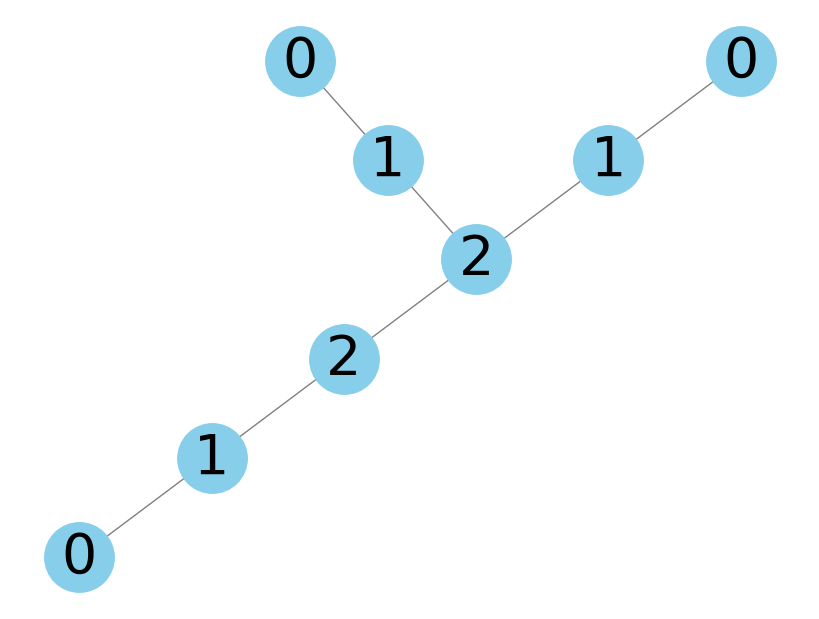

In [175]:
import networkx as nx
import matplotlib.pyplot as plt

def distance_to_nearest_degree_one(G):
    degree_one_nodes = [node for node in G.nodes if G.degree(node) == 1]
    distances = {node: None for node in G.nodes()}
    if not degree_one_nodes:
        return distances
    queue = [(node, 0) for node in degree_one_nodes]
    visited = set()
    while queue:
        current_node, dist = queue.pop(0)
        if distances[current_node] is not None and distances[current_node] <= dist:
            continue
        distances[current_node] = dist
        for neighbor in G.neighbors(current_node):
            if neighbor not in visited or (distances[neighbor] is None or distances[neighbor] > dist + 1):
                queue.append((neighbor, dist + 1))
                visited.add(neighbor)
    return distances

# Create a graph
G = nx.Graph()
edges = [(0, 1), (1, 2), (2, 3), (3, 4), (4, 5), (3, 6), (6, 7)]
G.add_edges_from(edges)

# Specify node positions manually
pos = {
    0: (0, 0),
    1: (1-0.4, 1-0.4),
    2: (2-0.8, 2-0.8),
    3: (3-1.2, 3-1.2),
    4: (4-1.6, 4-1.6),
    5: (5-2, 5-2),
    6: (3-1.6, 4-1.6),  
    7: (3-2, 5-2),
}

# Compute distances to the nearest degree-one node
distances = distance_to_nearest_degree_one(G)

# Draw the graph
labels = {node: dist for node, dist in distances.items()}  # Create labels based on distances
# labels=labels,
plt.figure(figsize=(8, 6))
nx.draw(G, pos, with_labels=True, labels=labels, node_color='skyblue', node_size=2500, font_size=40, font_color='black', edge_color='gray')
plt.show()


dispersed


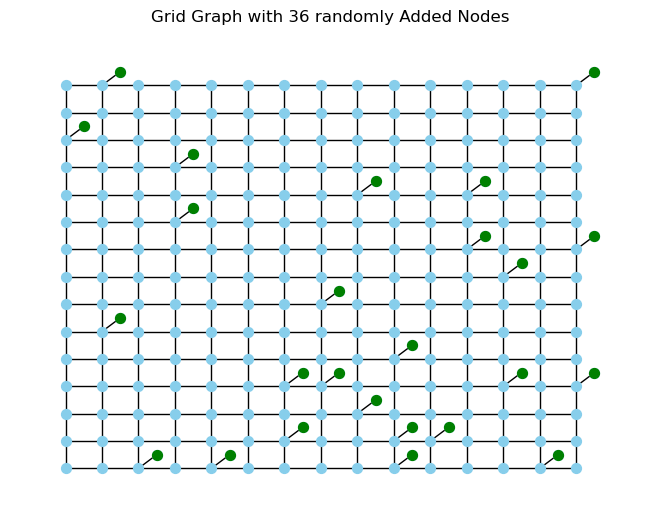

In [4]:
print('dispersed')
# G2, pos2 = make_graph(num_new_nodes = 25, mode = 'random', plot = True)
G2, pos2 = make_graph(num_new_nodes = 25, mode = 'random', plot = True)

clustered_star


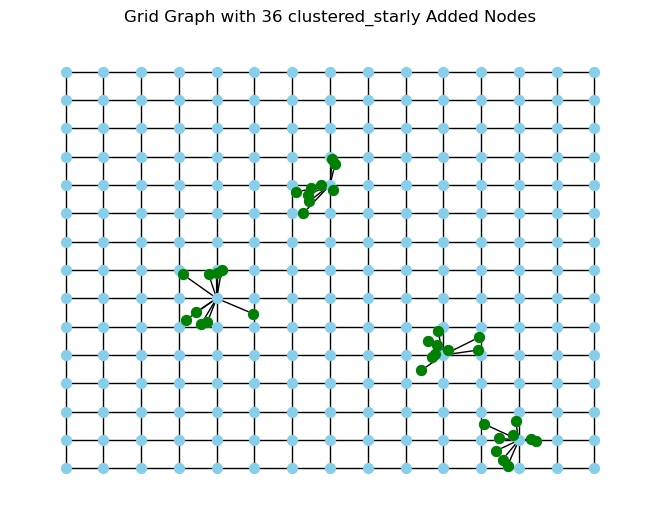

clustered_web


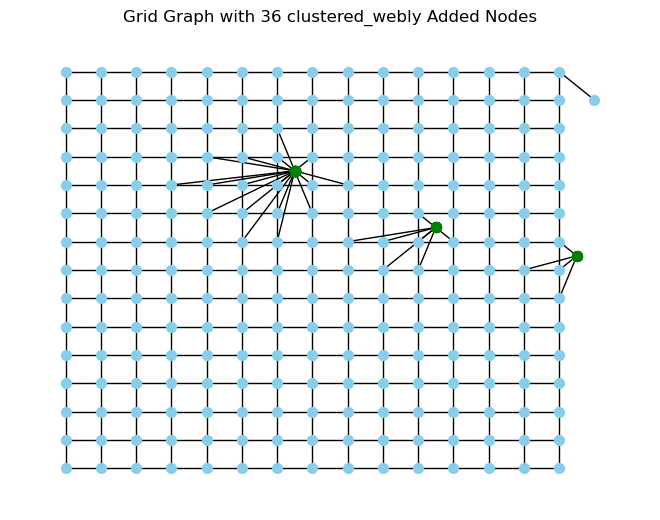

clustered


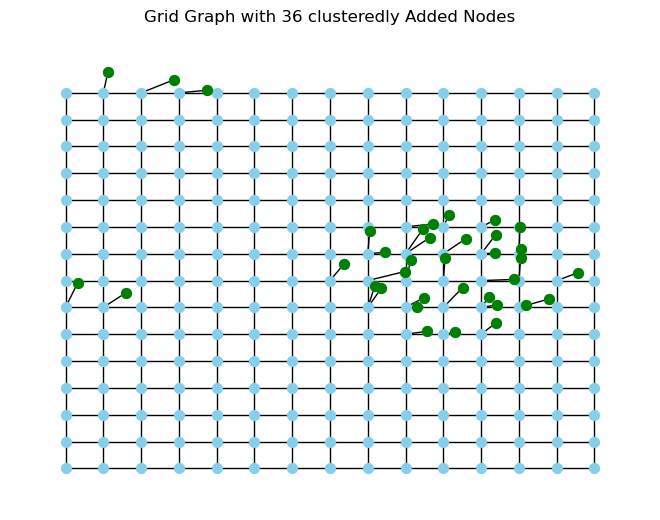

dispersed


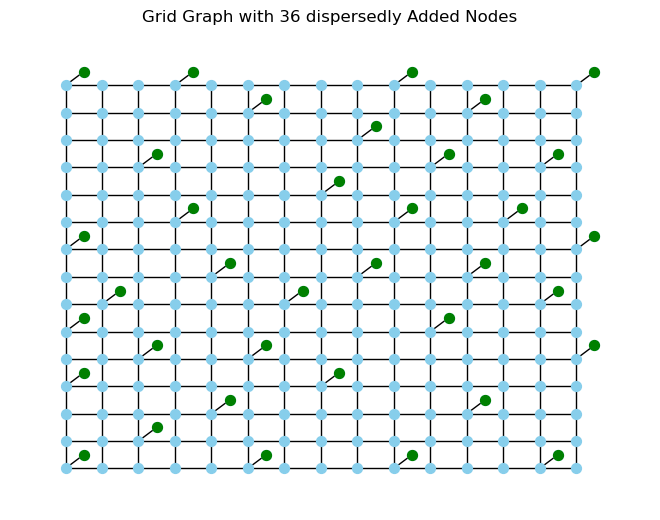

random


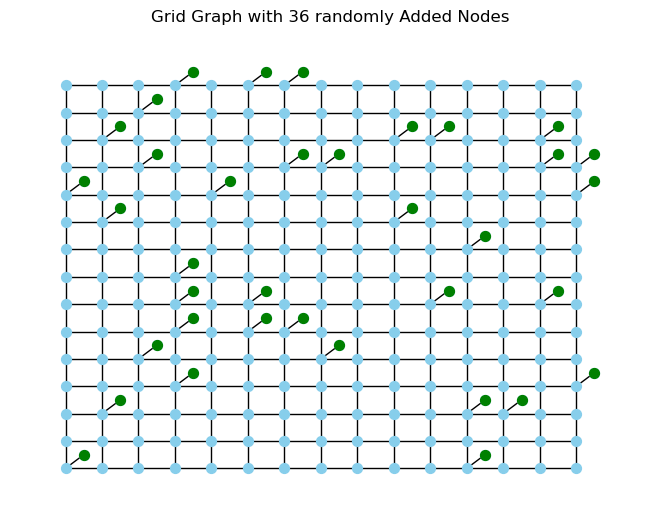

split


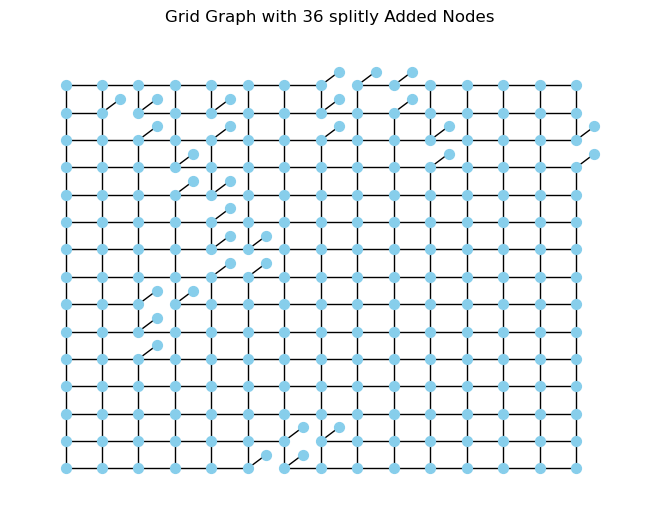

independent


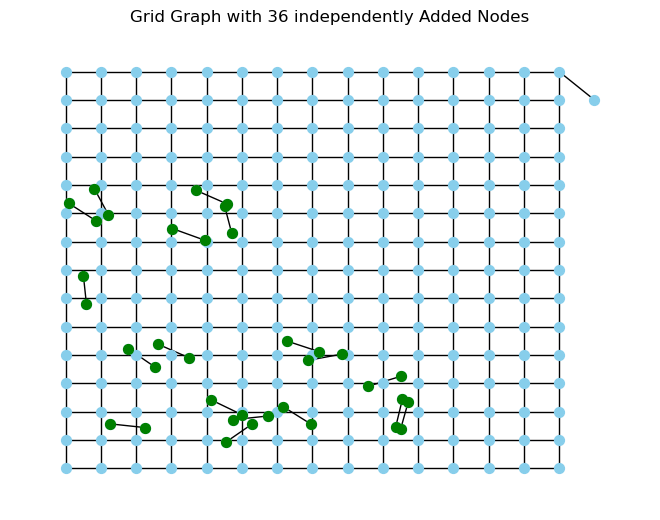

In [123]:
modes = ['random', 'dispersed', 'clustered', 'clustered_star', 'clustered_web', 'independent', 'split']
metrics = ['escape']
# for mode in modes:
#     for metric in metrics:
#         # if mode == 'clustered':# and metric == 'Escape Distance':
#         plot_single(mode, metric)

print('clustered_star')
G1, pos1 = make_graph(num_new_nodes = 36, mode = 'clustered_star', plot = True)

print('clustered_web')
G1, pos1 = make_graph(num_new_nodes = 36, mode = 'clustered_web', plot = True)

print('clustered')
G2, pos2 = make_graph(num_new_nodes = 36, mode = 'clustered', plot = True)

print('dispersed')
G2, pos2 = make_graph(num_new_nodes = 36, mode = 'dispersed', plot = True)

print('random')
G2, pos2 = make_graph(num_new_nodes = 36, mode = 'random', plot = True)

print('split')
G2, pos2 = make_graph(num_new_nodes = 16, mode = 'split', plot = True)

print('independent')
G1, pos1 = make_graph(num_new_nodes = 36, mode = 'independent', plot = True)

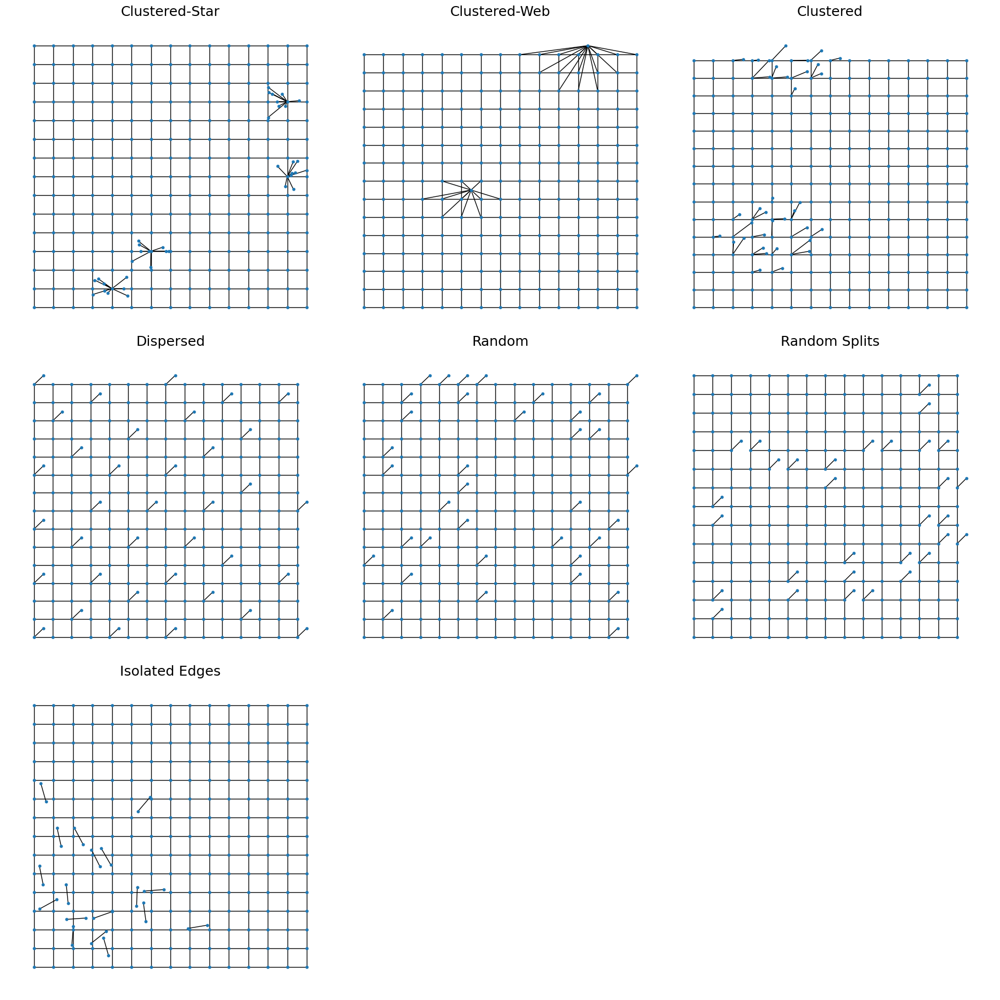

In [142]:
import matplotlib.pyplot as plt
import networkx as nx

# Assuming the function make_graph is defined elsewhere

# Function to create subplots
def plot_graphs_in_subplots():
    modes = ['clustered_star', 'clustered_web', 'clustered', 'dispersed', 'random', 'split', 'independent']
    titles = {
        'clustered_star': 'Clustered-Star', 'clustered_web': 'Clustered-Web', 'clustered': 'Clustered', 
        'dispersed': 'Dispersed', 'random': 'Random', 'split': 'Random Splits', 'independent': 'Isolated Edges'
    }
    num_new_nodes = [36, 36, 36, 36, 36, 16, 36]

    fig, axs = plt.subplots(3, 3, figsize=(18, 18))
    axs = axs.flatten()

    for i, mode in enumerate(modes):
        title = titles[mode]
        G, pos = make_graph(num_new_nodes=num_new_nodes[i], mode=mode, plot=False)
        ax = axs[i]
        ax.set_title(title, fontsize=18, pad=1)
        nx.draw(G, pos, with_labels=False, node_size=10, ax=ax)
    
    for i in range(len(modes), len(axs)):
        fig.delaxes(axs[i])  # Remove empty subplots

    #plt.subplots_adjust(wspace=0.005, hspace=0.005)  # Reduce space between plots
    plt.tight_layout(pad=0.0001, w_pad=0.0001, h_pad=0.0001)
    plt.show()

plot_graphs_in_subplots()


In [7]:
gtag_ress_p = []
gtag_ress2_p = []
metrics = ['escape']#, 'node_degree']
pg1 = 'clover175x240_padded.pickle'
# pg1 = 'dendro_skel.pickle'
for metric in metrics:
    avg_std_agri_p, df = mass_stats(graphs_dir=pg1, metric=metric)
    gtag_ress_p.append(['padded_gt' + '_' + metric, avg_std_agri_p])
        
    gtag_2_p = avg_std_agri_p.transpose()
    gtag_2_p.index = [f"padded_gt_{metric}_{i}" for i in ['avg', 'std']]
    gtag_ress2_p.append(gtag_2_p)

gtag_ress2_df_p = pd.concat(gtag_ress2_p)
gt_p_ag_deg = gtag_ress2_df_p[gtag_ress2_df_p.index.str.endswith('degree_avg')]
gt_p_ag_esc = gtag_ress2_df_p[gtag_ress2_df_p.index.str.endswith('escape_avg')]
gt_p_ag_esc

,HH,LL,LH,HL,Interval_1,Interval_2,Interval_3,Interval_4,Interval_5,Interval_6,...,Interval_8,Density,Avg_Clustering,Transitivity,Modularity,Assortativity,Normalized_Cycles,Terminal_Node_Percentage,Betweenness_Avg,Closeness_Avg
padded_gt_escape_avg,18.553459,21.383648,0.0,0.0,0.003145,0.0,0.025157,0.754717,0.04717,0.056604,...,0.040881,0.013293,0.23118,0.534928,0.815697,0.783558,83.508209,0.314465,0.027756,0.105222


In [8]:
# c_topo = "../graphs/cleaned_topo/graph"
# pc_topo = "../graphs/padded_cleaned_topo/graph"
# d_simple = "../graphs/dirty_simple/graph"
# pc_simple = "../graphs/padded_cleaned_simple/graph"
# pd_topo = "../graphs/padded_dirty_topo/graph"
# d_topo = "../graphs/dirty_topo/graph"
# c_simple = "../graphs/cleaned_simple/graph"
# pd_simple = "../graphs/padded_dirty_simple/graph"


# dendro_s_gpath = 'graphs/padded_dirty_simple/graph'
# dendro_t_gpath = 'graphs/padded_cleaned_topo/graph'
# dendro_gt_gpath = 'dendro_skel.pickle'
# pc_topo = dendro_t_gpath
# pd_simple = dendro_s_gpath

pc_topo = "../graphs/padded_cleaned_topo/graph"
pd_simple = "../graphs/padded_dirty_simple/graph"

# folds = {'c_topo':c_topo, 'pc_topo':pc_topo, 'd_simple':d_simple, 'pc_simple':pc_simple, 'pd_topo':pd_topo, 'd_topo':d_topo, 'c_simple':c_simple, 'pd_simple':pd_simple}
folds = {'pc_topo':pc_topo, 'pd_simple':pd_simple}
metrics = ['escape']#, 'node_degree']
agri_res = []
agri_res2 = []
DFs = []
for metric in metrics:
    for n, d in folds.items():
        print(n, metric)
        avg_std, df = mass_stats(graphs_dir=d, metric=metric)

        DFs.append(df)
        
        agri_res.append([n + '_' + metric, avg_std])

        avg_std2 = avg_std.transpose()
        avg_std2.index = [f"{n}_{metric}_{i}" for i in ['avg', 'std']]
        agri_res2.append(avg_std2)
        
agri_ress2 = pd.concat(agri_res2)
# dendro_gt_gpath = 'dendro_skel.pickle'

pc_topo escape
pd_simple escape
unsupported operand type(s) for +: 'int' and 'NoneType'


In [9]:
agri_ress2

,HH,LL,LH,HL,Interval_1,Interval_2,Interval_3,Interval_4,Interval_5,Interval_6,...,Interval_8,Density,Avg_Clustering,Transitivity,Modularity,Assortativity,Normalized_Cycles,Terminal_Node_Percentage,Betweenness_Avg,Closeness_Avg
pc_topo_escape_avg,21.771608,21.299037,0.0,0.0,0.002364,0.030168,0.441359,0.184982,0.138423,0.074734,...,0.028298,0.009243,0.268536,0.460049,0.825819,0.662166,115.924994,0.249824,0.023628,0.087890
pc_topo_escape_std,2.442223,2.535210,0.0,0.0,0.000972,0.017857,0.155453,0.218416,0.075507,0.038327,...,0.012660,0.000799,0.022175,0.098421,0.010574,0.112921,10.244046,0.076497,0.001526,0.003993
pd_simple_escape_avg,14.960342,7.758799,0.0,0.0,0.097631,0.011029,0.045843,0.438275,0.190186,0.087074,...,0.027340,0.009718,0.257392,0.442788,0.831774,0.589476,93.437374,10.202733,0.024919,0.092285
pd_simple_escape_std,2.746999,3.818391,0.0,0.0,0.025343,0.017371,0.081616,0.098747,0.050130,0.039245,...,0.012311,0.000726,0.022252,0.072731,0.011835,0.118098,8.243766,1.526072,0.001700,0.004561


In [15]:


import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import euclidean, cityblock

def calculate_cosine_similarity(gt, observations):
    similarity_scores = cosine_similarity(gt, observations)
    return similarity_scores.flatten()

def calculate_euclidean_distance(gt, observations):
    distances = observations.apply(lambda row: euclidean(gt.values.flatten(), row.values), axis=1)
    return distances

def calculate_manhattan_distance(gt, observations):
    distances = observations.apply(lambda row: cityblock(gt.values.flatten(), row.values), axis=1)
    return distances

def measure_similarity(df_gt, df_obs):
    df_obs = df_obs[df_gt.columns]
    cosine_similarity_scores = calculate_cosine_similarity(df_gt, df_obs)
    euclidean_distances = calculate_euclidean_distance(df_gt, df_obs)
    manhattan_distances = calculate_manhattan_distance(df_gt, df_obs)
    similarity_df = pd.DataFrame({
        'Cosine Similarity': cosine_similarity_scores,
        'Euclidean Distance': euclidean_distances,
        'Manhattan Distance': manhattan_distances
    })
    return [similarity_df.mean(), similarity_df.std()]


tes = DFs[0]
ses = DFs[1]

# tno = DFs[2]
# sno = DFs[3]

GT_AG_ESC_LISA = gt_p_ag_esc[['HH', 'LL', 'LH', 'HL']]
# GT_AG_DEG_LISA = gt_p_ag_deg[['HH', 'LL', 'LH', 'HL']]

In [16]:
GSTATS_esc = gt_p_ag_esc.loc[:, ~gt_p_ag_esc.columns.isin(['HH', 'LL', 'LH', 'HL'])]
# GSTATS_deg = gt_p_ag_deg.loc[:, ~gt_p_ag_deg.columns.isin(['HH', 'LL', 'LH', 'HL'])]
GSTATS_esc

,Interval_1,Interval_2,Interval_3,Interval_4,Interval_5,Interval_6,Interval_7,Interval_8,Density,Avg_Clustering,Transitivity,Modularity,Assortativity,Normalized_Cycles,Terminal_Node_Percentage,Betweenness_Avg,Closeness_Avg
padded_gt_escape_avg,0.003145,0.0,0.025157,0.754717,0.04717,0.056604,0.072327,0.040881,0.013293,0.23118,0.534928,0.815697,0.783558,83.508209,0.314465,0.027756,0.105222


In [17]:
measure_similarity(GSTATS_esc, ses)

[Cosine Similarity      0.994076
 Euclidean Distance    15.547024
 Manhattan Distance    21.828493
 dtype: float64,
 Cosine Similarity     0.002563
 Euclidean Distance    4.921969
 Manhattan Distance    6.523316
 dtype: float64]

In [18]:
measure_similarity(GSTATS_esc, tes)

[Cosine Similarity      0.999947
 Euclidean Distance    32.428861
 Manhattan Distance    34.056450
 dtype: float64,
 Cosine Similarity      0.000017
 Euclidean Distance    10.237057
 Manhattan Distance    10.009011
 dtype: float64]

In [19]:
measure_similarity(GT_AG_ESC_LISA, ses)

[Cosine Similarity      0.906220
 Euclidean Distance    14.384420
 Manhattan Distance    17.494243
 dtype: float64,
 Cosine Similarity     0.084052
 Euclidean Distance    3.686096
 Manhattan Distance    4.256037
 dtype: float64]

In [20]:
measure_similarity(GT_AG_ESC_LISA, tes)

[Cosine Similarity     0.993778
 Euclidean Distance    4.269152
 Manhattan Distance    5.393304
 dtype: float64,
 Cosine Similarity     0.007367
 Euclidean Distance    2.090281
 Manhattan Distance    2.669077
 dtype: float64]

In [21]:
#GT_AG_ESC_LISA

measure_similarity(gt_p_ag_esc, tes)


[Cosine Similarity      0.996804
 Euclidean Distance    32.809884
 Manhattan Distance    39.449754
 dtype: float64,
 Cosine Similarity      0.001615
 Euclidean Distance    10.119261
 Manhattan Distance    10.397142
 dtype: float64]

In [35]:
import concurrent.futures
ress = []
ress2 = []
DF1000s = []
# modes = ['random', 'dispersed', 'clustered', 'clustered_star', 'independent']#, 'split']
modes = ['random', 'dispersed', 'clustered', 'clustered_star', 'clustered_web', 'independent', 'split']
# metrics = ['Escape Distance', 'Node Degree']
metrics = ['escape']

def process_mode_metric(mode, metric):
    avg_std, df1000 = mass_stats(sample_size=1000, mode=mode, metric=metric)
    res = [mode + '_' + metric, avg_std]
    
    avg_std2 = avg_std.transpose()
    avg_std2.index = [f"{mode}_{metric}_{i}" for i in ['avg', 'std']]
    return res, avg_std2, df1000

# Using ProcessPoolExecutor for CPU-bound tasks
with concurrent.futures.ProcessPoolExecutor() as executor:
    futures = [executor.submit(process_mode_metric, mode, metric) for mode in modes for metric in metrics]
    for future in concurrent.futures.as_completed(futures):
        res, avg_std2, df1000 = future.result()
        DF1000s.append(df1000)
        ress.append(res)
        ress2.append(avg_std2)

# ress
ress2_df = pd.concat(ress2)
ress2_df

unsupported operand type(s) for +: 'NoneType' and 'NoneType'
unsupported operand type(s) for +: 'NoneType' and 'NoneType'
unsupported operand type(s) for +: 'NoneType' and 'NoneType'
unsupported operand type(s) for +: 'NoneType' and 'NoneType'
unsupported operand type(s) for +: 'NoneType' and 'NoneType'
unsupported operand type(s) for +: 'NoneType' and 'NoneType'
unsupported operand type(s) for +: 'NoneType' and 'NoneType'
unsupported operand type(s) for +: 'NoneType' and 'NoneType'
unsupported operand type(s) for +: 'NoneType' and 'NoneType'
unsupported operand type(s) for +: 'NoneType' and 'NoneType'
unsupported operand type(s) for +: 'NoneType' and 'NoneType'
unsupported operand type(s) for +: 'NoneType' and 'NoneType'
unsupported operand type(s) for +: 'NoneType' and 'NoneType'
unsupported operand type(s) for +: 'NoneType' and 'NoneType'
unsupported operand type(s) for +: 'NoneType' and 'NoneType'
unsupported operand type(s) for +: 'NoneType' and 'NoneType'
unsupported operand type

,HH,LL,LH,HL,Interval_1,Interval_2,Interval_3,Interval_4,Interval_5,Interval_6,...,Interval_8,Density,Avg_Clustering,Transitivity,Modularity,Assortativity,Normalized_Cycles,Terminal_Node_Percentage,Betweenness_Avg,Closeness_Avg
independent_escape_avg,21.594317,9.204462,0.000000,0.000000,0.144596,0.010489,0.039684,0.162728,0.000000,0.000000,...,0.000000,0.012777,0.000000,0.000000,0.736202,0.850291,58.501418,14.459646,0.025765,0.075996
independent_escape_std,1.183497,5.803359,0.000000,0.000000,0.043726,0.003280,0.082696,0.076386,0.000000,0.000000,...,0.000000,0.001114,0.000000,0.000000,0.005479,0.035226,2.102537,4.372557,0.003966,0.007591
clustered_web_escape_avg,21.234733,20.763989,0.008075,0.000000,0.009327,0.056701,0.166958,0.026678,0.643961,0.054668,...,0.005500,0.017135,0.033482,0.063141,0.708991,0.194199,55.726630,0.639593,0.036941,0.109472
clustered_web_escape_std,2.535670,2.000928,0.146542,0.000000,0.009056,0.083410,0.089731,0.124954,0.139664,0.056782,...,0.002069,0.000320,0.010247,0.016927,0.013196,0.120300,0.946432,0.738568,0.001573,0.004725
random_escape_avg,11.547606,2.411698,0.061913,0.006704,0.137193,0.012946,0.065569,0.104360,0.576991,0.000000,...,0.102940,0.013471,0.000000,0.000000,0.723909,-0.112382,55.883584,13.719328,0.035788,0.099787
random_escape_std,3.023655,3.539446,0.914291,0.049544,0.044165,0.003200,0.091385,0.076313,0.058865,0.000000,...,0.034390,0.000987,0.000000,0.000000,0.008222,0.072041,1.235071,4.416537,0.001541,0.001046
clustered_star_escape_avg,19.777027,6.192436,0.002537,0.000000,0.104454,0.004549,0.067810,0.176056,0.637517,0.000000,...,0.009594,0.013371,0.000000,0.000000,0.729324,-0.309961,56.007866,14.166304,0.035207,0.100976
clustered_star_escape_std,2.532793,3.920527,0.046960,0.000000,0.064513,0.007231,0.088114,0.057767,0.032490,0.000000,...,0.004258,0.000968,0.000000,0.000000,0.008944,0.086026,1.212842,4.336142,0.002058,0.003392
clustered_escape_avg,19.443040,12.706536,0.014771,0.000000,0.138903,0.012367,0.064845,0.118892,0.581790,0.000000,...,0.027439,0.013433,0.000000,0.000000,0.725775,-0.117429,55.930765,13.890301,0.035208,0.101224
clustered_escape_std,2.595009,2.037869,0.197675,0.000000,0.043601,0.005364,0.091394,0.082174,0.055463,0.000000,...,0.015694,0.000973,0.000000,0.000000,0.008717,0.099121,1.220328,4.360103,0.001970,0.002495


In [36]:
# ress2_df.to_csv('ress2_df_15x15.csv', index=False)

In [37]:
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

# modes = ['random', 'dispersed', 'clustered', 'clustered_star', 'independent']
modes = ['random', 'dispersed', 'clustered', 'clustered_star', 'clustered_web', 'independent', 'split']
# print(len(DF1000s))

DF1000s_new = []
df0 = DF1000s[0]
df0['label'] = 'random'
df1 = DF1000s[1]
df1['label'] = 'dispersed'
df2 = DF1000s[2]
df2['label'] = 'clustered'
df3 = DF1000s[3]
df3['label'] = 'clustered_star'
df4 = DF1000s[4]
df4['label'] = 'clustered_web'
df5 = DF1000s[5]
df5['label'] = 'independent'
df6 = DF1000s[6]
df6['label'] = 'split'
DF1000s_new = [df0, df1, df2, df3, df4, df5, df6]
df = pd.concat(DF1000s_new).reset_index(drop=True)

label_encoder = LabelEncoder()
df['label_encoded'] = label_encoder.fit_transform(df['label'])
df = df.loc[:, (df != 0).any(axis=0)]
# df.to_csv('DF1000s_15x15.csv', index=False)
df

,HH,LL,LH,HL,Interval_1,Interval_2,Interval_3,Interval_4,Interval_5,Interval_6,...,Avg_Clustering,Transitivity,Modularity,Assortativity,Normalized_Cycles,Terminal_Node_Percentage,Betweenness_Avg,Closeness_Avg,label,label_encoded
0,23.426573,3.846154,0.0,0.0,0.213287,0.000000,0.010490,0.185315,0.000000,0.0,...,0.0,0.0,0.745658,0.895459,61.929047,21.328671,0.019867,0.064382,random,5
1,21.031746,9.523810,0.0,0.0,0.107143,0.011905,0.000000,0.210317,0.000000,0.0,...,0.0,0.0,0.730396,0.824282,56.677419,10.714286,0.029084,0.082429,random,5
2,21.031746,7.539683,0.0,0.0,0.107143,0.011905,0.000000,0.210317,0.000000,0.0,...,0.0,0.0,0.730396,0.824282,56.677419,10.714286,0.029084,0.082429,random,5
3,22.962963,4.814815,0.0,0.0,0.166667,0.011111,0.000000,0.196296,0.000000,0.0,...,0.0,0.0,0.738671,0.871454,59.507901,16.666667,0.023627,0.072034,random,5
4,21.544715,10.162602,0.0,0.0,0.085366,0.012195,0.215447,0.000000,0.000000,0.0,...,0.0,0.0,0.731168,0.799013,55.707657,8.536585,0.031273,0.086408,random,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6968,6.967213,0.409836,0.0,0.0,0.077869,0.012295,0.184426,0.000000,0.684426,0.0,...,0.0,0.0,0.727959,0.014132,54.246014,7.786885,0.038067,0.100350,split,6
6969,15.261044,0.000000,0.0,0.0,0.096386,0.008032,0.184739,0.000000,0.654618,0.0,...,0.0,0.0,0.724688,-0.044944,54.738739,9.638554,0.037618,0.099563,split,6
6970,9.122807,0.000000,0.0,0.0,0.210526,0.003509,0.000000,0.143860,0.491228,0.0,...,0.0,0.0,0.733830,-0.242614,57.983333,21.052632,0.033301,0.098297,split,6
6971,15.302491,0.000000,0.0,0.0,0.199288,0.003559,0.000000,0.145907,0.512456,0.0,...,0.0,0.0,0.727465,-0.234906,57.647059,19.928826,0.033905,0.097941,split,6


In [38]:
from sklearn.preprocessing import StandardScaler

X = df.drop(columns=['label', 'label_encoded'])#, 'Number of Components', 'HL', 'Clustering Coefficient'])
y = df['label_encoded']

scaler = StandardScaler()
X_standardized = scaler.fit_transform(X)

X_standardized_df = pd.DataFrame(X_standardized, columns=X.columns)

df_standardized = pd.concat([X_standardized_df, y.reset_index(drop=True)], axis=1)
df_standardized


,HH,LL,LH,HL,Interval_1,Interval_2,Interval_3,Interval_4,Interval_5,Interval_6,...,Density,Avg_Clustering,Transitivity,Modularity,Assortativity,Normalized_Cycles,Terminal_Node_Percentage,Betweenness_Avg,Closeness_Avg,label_encoded
0,1.227423,-0.475243,-0.048019,-0.090473,1.133486,-0.424674,-0.626169,0.695277,-1.635911,-0.268317,...,-1.199342,-0.38244,-0.386883,0.932735,2.247894,2.524947,1.099052,-3.405013,-3.208728,5
1,0.820105,0.272935,-0.048019,-0.090473,-0.287456,-0.092676,-0.738397,0.952250,-1.635911,-0.268317,...,0.128060,-0.38244,-0.386883,0.063111,2.052976,0.444234,-0.363852,-1.191132,-1.458002,5
2,0.820105,0.011475,-0.048019,-0.090473,-0.287456,-0.092676,-0.738397,0.952250,-1.635911,-0.268317,...,0.128060,-0.38244,-0.386883,0.063111,2.052976,0.444234,-0.363852,-1.191132,-1.458002,5
3,1.148571,-0.347597,-0.048019,-0.090473,0.509386,-0.114810,-0.738397,0.808144,-1.635911,-0.268317,...,-0.633414,-0.38244,-0.386883,0.534642,2.182155,1.565681,0.456522,-2.501805,-2.466469,5
4,0.907352,0.357113,-0.048019,-0.090473,-0.578983,-0.084579,1.566681,-1.209350,-1.635911,-0.268317,...,0.417557,-0.38244,-0.386883,0.107092,1.983776,0.060010,-0.663989,-0.665190,-1.072014,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6968,-1.572022,-0.928068,-0.048019,-0.090473,-0.679345,-0.081791,1.234787,-1.209350,0.892327,-0.268317,...,0.670252,-0.38244,-0.386883,-0.075759,-0.165629,-0.519098,-0.767315,0.966712,0.280486,6
6969,-0.161389,-0.982074,-0.048019,-0.090473,-0.431463,-0.200676,1.238133,-1.209350,0.782218,-0.268317,...,0.456426,-0.38244,-0.386883,-0.262177,-0.327411,-0.323878,-0.512112,0.858968,0.204148,6
6970,-1.205394,-0.982074,-0.048019,-0.090473,1.096533,-0.326822,-0.738397,0.269210,0.178662,-0.268317,...,-0.802379,-0.38244,-0.386883,0.258794,-0.868732,0.961642,1.061008,-0.178158,0.081379,6
6971,-0.154339,-0.982074,-0.048019,-0.090473,0.946089,-0.325430,-0.738397,0.290258,0.257075,-0.268317,...,-0.682963,-0.38244,-0.386883,-0.103939,-0.847624,0.828408,0.906122,-0.032897,0.046862,6


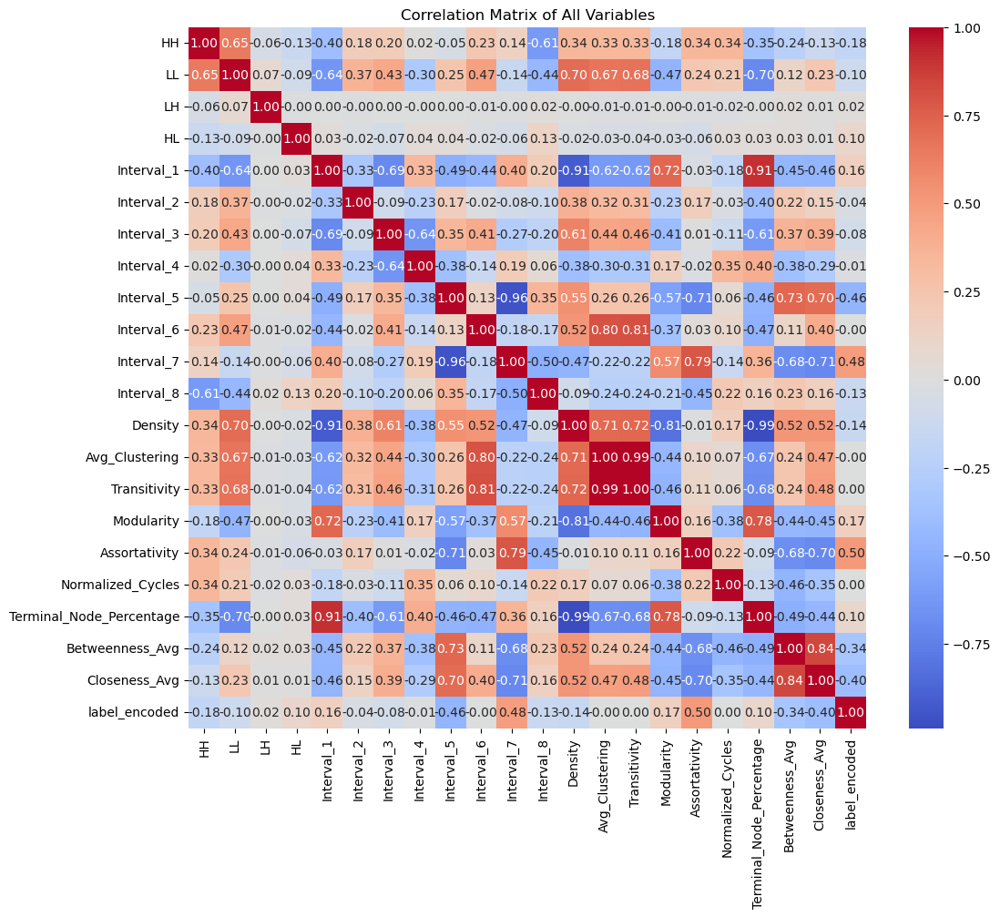

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

# X = df_standardized.drop(columns='label_encoded')

corr_matrix = df_standardized.corr()

# Plot heatmap of correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of All Variables')
plt.show()


In [40]:
corr_matrix['label_encoded'].sort_values(ascending=False)

label_encoded               1.000000e+00
Assortativity               4.996283e-01
Interval_7                  4.798053e-01
Modularity                  1.681780e-01
Interval_1                  1.641248e-01
HL                          1.010206e-01
Terminal_Node_Percentage    9.556923e-02
LH                          2.113490e-02
Normalized_Cycles           4.076798e-03
Transitivity                7.152542e-17
Interval_6                 -3.060925e-16
Avg_Clustering             -5.052863e-16
Interval_4                 -1.334076e-02
Interval_2                 -3.726003e-02
Interval_3                 -7.945531e-02
LL                         -1.035962e-01
Interval_8                 -1.324408e-01
Density                    -1.435878e-01
HH                         -1.758483e-01
Betweenness_Avg            -3.415922e-01
Closeness_Avg              -4.000855e-01
Interval_5                 -4.583262e-01
Name: label_encoded, dtype: float64

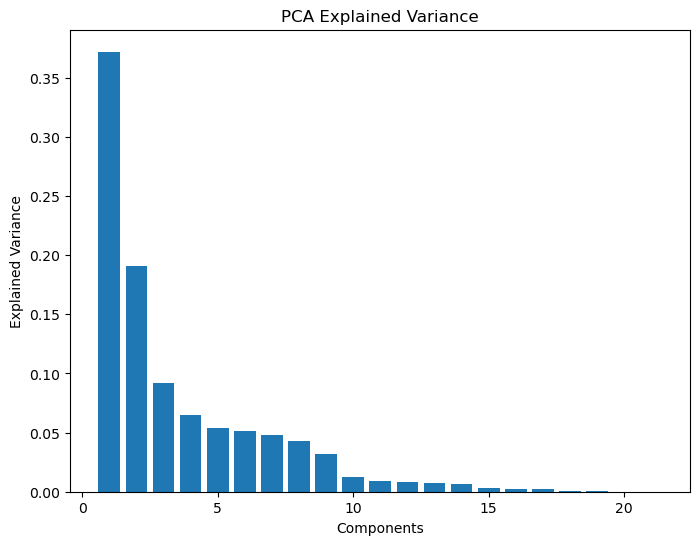

In [41]:
from sklearn.decomposition import PCA

# Standardize features before PCA
from sklearn.preprocessing import StandardScaler


features = df_standardized.drop(columns=['label_encoded'])
# features = df_standardized.drop(columns=['label_encoded', 'HH', 'LH', 'LL'])
# Apply PCA
pca = PCA(n_components=len(features.columns))
pca.fit(features)

# Plot the explained variance ratio of each principal component
plt.figure(figsize=(8, 6))
plt.bar(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_)
plt.ylabel('Explained Variance')
plt.xlabel('Components')
plt.title('PCA Explained Variance')
plt.show()


                               PC1       PC2       PC3       PC4
Assortativity            -0.067052  0.440863  0.011173 -0.152609
Interval_7               -0.212452  0.345837  0.206453 -0.019856
HH                        0.110579  0.329721 -0.123783 -0.111413
LL                        0.254463  0.244970 -0.028951 -0.080565
Transitivity              0.285034  0.164653  0.068547  0.330720
Avg_Clustering            0.281993  0.164431  0.066941  0.329648
Normalized_Cycles         0.023372  0.137080 -0.656516  0.015555
Interval_6                0.218941  0.133950  0.024822  0.574742
Interval_2                0.126938  0.078078  0.022110 -0.425200
Density                   0.339140  0.060255 -0.084863 -0.114265
Modularity               -0.274273  0.048601  0.318958  0.102124
Interval_3                0.239422  0.039207  0.221308 -0.036757
Interval_4               -0.168772  0.028967 -0.380321  0.268967
LH                        0.001348 -0.011728  0.013500 -0.031128
HL                       

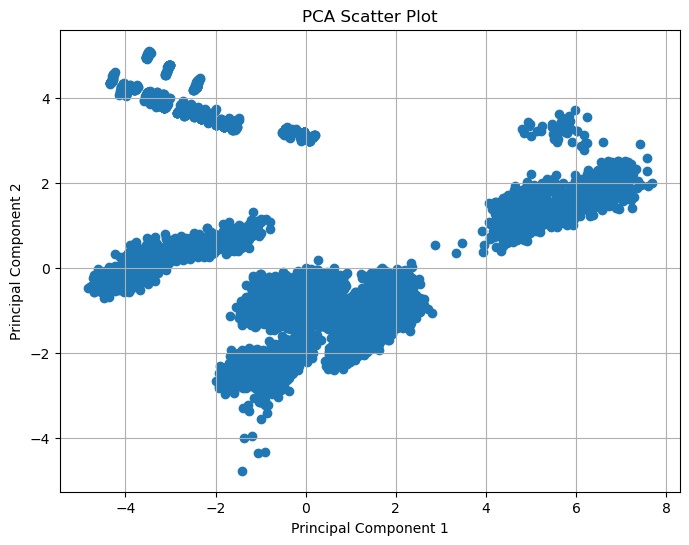

In [43]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

features_scaled = features.copy()
# Applying PCA
pca = PCA(n_components=4)  # Adjust based on your choice
principal_components = pca.fit_transform(features_scaled)
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3', 'PC4'])

# Loadings or the contribution of each feature to the components
loadings = pd.DataFrame(pca.components_.T, columns=['PC1', 'PC2', 'PC3', 'PC4'], index=features_scaled.columns[:])
print(loadings.sort_values('PC2', ascending=False))

# Scatter plot of the first two PCs
plt.figure(figsize=(8, 6))
plt.scatter(pca_df['PC1'], pca_df['PC2'])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Scatter Plot')
plt.grid(True)
plt.show()


In [52]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import accuracy_score

# Assuming df is your DataFrame and 'label' is the column name for your target variable
X = df_standardized.drop('label_encoded', axis=1)  # Features
y = df_standardized['label_encoded']  # Target variable

# X = df[['LL', 'HH', 'HL', 'LH']]
# Splitting data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a multinomial logistic regression classifier
model = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=200)

# RFE for feature selection
rfe = RFE(estimator=model, n_features_to_select=8)
rfe.fit(X_train, y_train)

# Mask of selected features
selected_features = rfe.support_

# Model with selected features
X_train_selected = rfe.transform(X_train)
X_test_selected = rfe.transform(X_test)

# Train a new model on the selected features
model.fit(X_train_selected, y_train)

# Predict and evaluate the model
y_pred = model.predict(X_test_selected)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy with selected features:", accuracy)
print("Selected features:", X.columns[selected_features])


Accuracy with selected features: 0.9713261648745519
Selected features: Index(['HH', 'LL', 'Interval_2', 'Interval_5', 'Interval_8', 'Transitivity',
       'Assortativity', 'Normalized_Cycles'],
      dtype='object')


In [63]:
prev_attrs = ['Density', 'Avg_Clustering', 'Transitivity', 'Modularity', 'Assortativity', 'Interval_1', 'Interval_2', 'Interval_3',
       'Interval_4', 'Interval_5', 'Interval_6', 'Interval_7', 'Interval_8']
X[prev_attrs]

,Density,Avg_Clustering,Transitivity,Modularity,Assortativity,Interval_1,Interval_2,Interval_3,Interval_4,Interval_5,Interval_6,Interval_7,Interval_8
0,-1.199342,-0.38244,-0.386883,0.932735,2.247894,1.133486,-0.424674,-0.626169,0.695277,-1.635911,-0.268317,1.522415,-0.746512
1,0.128060,-0.38244,-0.386883,0.063111,2.052976,-0.287456,-0.092676,-0.738397,0.952250,-1.635911,-0.268317,1.821555,-0.746512
2,0.128060,-0.38244,-0.386883,0.063111,2.052976,-0.287456,-0.092676,-0.738397,0.952250,-1.635911,-0.268317,1.821555,-0.746512
3,-0.633414,-0.38244,-0.386883,0.534642,2.182155,0.509386,-0.114810,-0.738397,0.808144,-1.635911,-0.268317,1.653802,-0.746512
4,0.417557,-0.38244,-0.386883,0.107092,1.983776,-0.578983,-0.084579,1.566681,-1.209350,-1.635911,-0.268317,1.882928,-0.746512
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6968,0.670252,-0.38244,-0.386883,-0.075759,-0.165629,-0.679345,-0.081791,1.234787,-1.209350,0.892327,-0.268317,-0.694742,0.158006
6969,0.456426,-0.38244,-0.386883,-0.262177,-0.327411,-0.431463,-0.200676,1.238133,-1.209350,0.782218,-0.268317,-0.694742,0.494385
6970,-0.802379,-0.38244,-0.386883,0.258794,-0.868732,1.096533,-0.326822,-0.738397,0.269210,0.178662,-0.268317,-0.694742,2.583383
6971,-0.682963,-0.38244,-0.386883,-0.103939,-0.847624,0.946089,-0.325430,-0.738397,0.290258,0.257075,-0.268317,-0.694742,2.316616


In [64]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import accuracy_score
prev_attrs = ['Density', 'Avg_Clustering', 'Transitivity', 'Modularity', 'Assortativity', 'Interval_1', 'Interval_2', 'Interval_3',
       'Interval_4', 'Interval_5', 'Interval_6', 'Interval_7', 'Interval_8']

# X = df_standardized.drop('label_encoded', axis=1)  # Features
X = X[prev_attrs]
y = df_standardized['label_encoded']  

# Splitting data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a multinomial logistic regression classifier
model = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=200)
for n in range(1, len(X.columns)):
    # RFE for feature selection
    rfe = RFE(estimator=model, n_features_to_select=n)
    rfe.fit(X_train, y_train)
    
    # Mask of selected features
    selected_features = rfe.support_
    
    # Model with selected features
    X_train_selected = rfe.transform(X_train)
    X_test_selected = rfe.transform(X_test)
    
    # Train a new model on the selected features
    model.fit(X_train_selected, y_train)
    
    # Predict and evaluate the model
    y_pred = model.predict(X_test_selected)
    accuracy = accuracy_score(y_test, y_pred)
    print(f"Accuracy with {n} features:", accuracy)
    print("Selected features:", X.columns[selected_features])


Accuracy with 1 features: 0.578494623655914
Selected features: Index(['Interval_8'], dtype='object')
Accuracy with 2 features: 0.9168458781362007
Selected features: Index(['Assortativity', 'Interval_8'], dtype='object')
Accuracy with 3 features: 0.9369175627240144
Selected features: Index(['Assortativity', 'Interval_2', 'Interval_8'], dtype='object')
Accuracy with 4 features: 0.9577060931899641
Selected features: Index(['Assortativity', 'Interval_2', 'Interval_5', 'Interval_8'], dtype='object')
Accuracy with 5 features: 0.9670250896057347
Selected features: Index(['Assortativity', 'Interval_1', 'Interval_2', 'Interval_5',
       'Interval_8'],
      dtype='object')
Accuracy with 6 features: 0.967741935483871
Selected features: Index(['Assortativity', 'Interval_1', 'Interval_2', 'Interval_5', 'Interval_7',
       'Interval_8'],
      dtype='object')
Accuracy with 7 features: 0.967741935483871
Selected features: Index(['Transitivity', 'Assortativity', 'Interval_1', 'Interval_2',
       '

In [65]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import accuracy_score

prev_attrs = ['Density', 'Avg_Clustering', 'Transitivity', 'Modularity', 'Assortativity', 'Interval_1', 'Interval_2', 'Interval_3',
       'Interval_4', 'Interval_5', 'Interval_6', 'Interval_7', 'Interval_8']

# X = df_standardized.drop('label_encoded', axis=1)  # Features
X = X[prev_attrs]
y = df_standardized['label_encoded']  

# Splitting data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a multinomial logistic regression classifier
model = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=200)

# RFE for feature selection
rfe = RFE(estimator=model, n_features_to_select=5)  # Adjust the number of features
rfe.fit(X_train, y_train)

# Mask of selected features
selected_features = rfe.support_

# Ranking of all features
feature_ranking = rfe.ranking_

# Create a DataFrame to hold feature names and their rankings
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Ranking': feature_ranking
})

# Sort features by their ranking (lower is more important)
sorted_features = feature_importance_df.sort_values(by='Ranking')

# Model with selected features
X_train_selected = rfe.transform(X_train)
X_test_selected = rfe.transform(X_test)

# Train a new model on the selected features
model.fit(X_train_selected, y_train)

# Predict and evaluate the model
y_pred = model.predict(X_test_selected)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy with selected features:", accuracy)
print("Selected features and their rankings:")
print(sorted_features)


Accuracy with selected features: 0.9670250896057347
Selected features and their rankings:
           Feature  Ranking
5       Interval_1        1
6       Interval_2        1
4    Assortativity        1
9       Interval_5        1
12      Interval_8        1
11      Interval_7        2
2     Transitivity        3
8       Interval_4        4
7       Interval_3        5
0          Density        6
1   Avg_Clustering        7
3       Modularity        8
10      Interval_6        9


In [67]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.metrics import accuracy_score

# Assuming df_standardized is your DataFrame and has been standardized

prev_attrs = ['Density', 'Avg_Clustering', 'Transitivity', 'Modularity', 'Assortativity', 'Interval_1', 'Interval_2', 'Interval_3',
              'Interval_4', 'Interval_5', 'Interval_6', 'Interval_7', 'Interval_8']

X = df_standardized[prev_attrs]  # Features
y = df_standardized['label_encoded']  # Target

# Splitting data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# SelectKBest for feature selection
selector = SelectKBest(score_func=f_classif, k=5)  # Adjust the number of features to select
X_train_selected = selector.fit_transform(X_train, y_train)
X_test_selected = selector.transform(X_test)

# Get selected feature names
selected_features = X.columns[selector.get_support()]

# Create a K-Nearest Neighbors classifier
knn = KNeighborsClassifier(n_neighbors=5)  # Adjust n_neighbors as needed

# Train the KNN model on the selected features
knn.fit(X_train_selected, y_train)

# Predict and evaluate the model
y_pred = knn.predict(X_test_selected)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy with selected features:", accuracy)
print("Selected features:")
print(selected_features)


Accuracy with selected features: 0.9419354838709677
Selected features:
Index(['Avg_Clustering', 'Transitivity', 'Assortativity', 'Interval_5',
       'Interval_7'],
      dtype='object')


In [80]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.metrics import accuracy_score

# Assuming df_standardized is your DataFrame and has been standardized

prev_attrs = ['HH', 'LL', 'LH', 'HL', 'Density', 'Avg_Clustering', 'Transitivity', 'Modularity', 'Assortativity', 'Interval_1', 'Interval_2', 'Interval_3',
              'Interval_4', 'Interval_5', 'Interval_6', 'Interval_7', 'Interval_8']

# X = df_standardized.drop('label_encoded', axis=1)
X = df_standardized[prev_attrs]  # Features
y = df_standardized['label_encoded']  # Target

# Splitting data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# List to store accuracy and feature information
results = []

for n in range(1, len(X.columns) + 1):
    selector = SelectKBest(score_func=f_classif, k=n)  # Adjust the number of features to select
    X_train_selected = selector.fit_transform(X_train, y_train)
    X_test_selected = selector.transform(X_test)
    
    # Get selected feature names
    selected_features = X.columns[selector.get_support()]
    
    for nn in range(1, 20):
        knn = KNeighborsClassifier(n_neighbors=nn)  # Adjust n_neighbors as needed
        
        # Train the KNN model on the selected features
        knn.fit(X_train_selected, y_train)
        
        # Predict and evaluate the model
        y_pred = knn.predict(X_test_selected)
        accuracy = accuracy_score(y_test, y_pred)
        
        # Store the results
        results.append((accuracy, list(selected_features), n, nn))

# Sort the results by accuracy in descending order and get the top 5
top_5_results = sorted(results, key=lambda x: x[0], reverse=True)[:5]

# Print the top 5 results
for accuracy, features, num_features, n_neighbors in top_5_results:
    print(f"Accuracy: {accuracy:.4f}, Number of features: {num_features}, Neighbors: {n_neighbors}")
    print(f"Selected features: {features}")
    print('\n')


Accuracy: 0.9935, Number of features: 6, Neighbors: 1
Selected features: ['Avg_Clustering', 'Transitivity', 'Assortativity', 'Interval_5', 'Interval_7', 'Interval_8']


Accuracy: 0.9935, Number of features: 7, Neighbors: 1
Selected features: ['LL', 'Avg_Clustering', 'Transitivity', 'Assortativity', 'Interval_5', 'Interval_7', 'Interval_8']


Accuracy: 0.9928, Number of features: 6, Neighbors: 2
Selected features: ['Avg_Clustering', 'Transitivity', 'Assortativity', 'Interval_5', 'Interval_7', 'Interval_8']


Accuracy: 0.9914, Number of features: 6, Neighbors: 3
Selected features: ['Avg_Clustering', 'Transitivity', 'Assortativity', 'Interval_5', 'Interval_7', 'Interval_8']


Accuracy: 0.9914, Number of features: 6, Neighbors: 4
Selected features: ['Avg_Clustering', 'Transitivity', 'Assortativity', 'Interval_5', 'Interval_7', 'Interval_8']




In [91]:
df

,HH,LL,LH,HL,Interval_1,Interval_2,Interval_3,Interval_4,Interval_5,Interval_6,...,Avg_Clustering,Transitivity,Modularity,Assortativity,Normalized_Cycles,Terminal_Node_Percentage,Betweenness_Avg,Closeness_Avg,label,label_encoded
0,23.426573,3.846154,0.0,0.0,0.213287,0.000000,0.010490,0.185315,0.000000,0.0,...,0.0,0.0,0.745658,0.895459,61.929047,21.328671,0.019867,0.064382,random,5
1,21.031746,9.523810,0.0,0.0,0.107143,0.011905,0.000000,0.210317,0.000000,0.0,...,0.0,0.0,0.730396,0.824282,56.677419,10.714286,0.029084,0.082429,random,5
2,21.031746,7.539683,0.0,0.0,0.107143,0.011905,0.000000,0.210317,0.000000,0.0,...,0.0,0.0,0.730396,0.824282,56.677419,10.714286,0.029084,0.082429,random,5
3,22.962963,4.814815,0.0,0.0,0.166667,0.011111,0.000000,0.196296,0.000000,0.0,...,0.0,0.0,0.738671,0.871454,59.507901,16.666667,0.023627,0.072034,random,5
4,21.544715,10.162602,0.0,0.0,0.085366,0.012195,0.215447,0.000000,0.000000,0.0,...,0.0,0.0,0.731168,0.799013,55.707657,8.536585,0.031273,0.086408,random,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6968,6.967213,0.409836,0.0,0.0,0.077869,0.012295,0.184426,0.000000,0.684426,0.0,...,0.0,0.0,0.727959,0.014132,54.246014,7.786885,0.038067,0.100350,split,6
6969,15.261044,0.000000,0.0,0.0,0.096386,0.008032,0.184739,0.000000,0.654618,0.0,...,0.0,0.0,0.724688,-0.044944,54.738739,9.638554,0.037618,0.099563,split,6
6970,9.122807,0.000000,0.0,0.0,0.210526,0.003509,0.000000,0.143860,0.491228,0.0,...,0.0,0.0,0.733830,-0.242614,57.983333,21.052632,0.033301,0.098297,split,6
6971,15.302491,0.000000,0.0,0.0,0.199288,0.003559,0.000000,0.145907,0.512456,0.0,...,0.0,0.0,0.727465,-0.234906,57.647059,19.928826,0.033905,0.097941,split,6


In [143]:
import pandas as pd
import numpy as np
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

prev_attrs = ['HH', 'LL', 'LH', 'HL', 'Density', 'Avg_Clustering', 'Transitivity', 'Modularity', 'Assortativity', 'Interval_1', 'Interval_2', 'Interval_3',
              'Interval_4', 'Interval_5', 'Interval_6', 'Interval_7', 'Interval_8']

# features = ['Average_Clustering', 'Average_Path_Length', 'Assortativity', 'Modularity']
features = ['Density', 'Avg_Clustering', 'Transitivity', 'Modularity', 'Assortativity']
DDQC = ['Interval_1', 'Interval_2', 'Interval_3',
              'Interval_4', 'Interval_5', 'Interval_6', 'Interval_7', 'Interval_8']
lis_cols = ['HH', 'LL', 'HL', 'LH']
features_DDQC = features + DDQC

features_lisa = features + lis_cols

features_lisa_DDQC = features + DDQC + lis_cols


feature_sets = {
    "Features": features,
    "Features+DDQC": features_DDQC,
    # "Features+LISA": features_lisa,
    "Features+DDQC+NTC": features_lisa_DDQC
}

y = df_standardized['label_encoded']  
# SVM classifier with 10-fold cross-validation
svm = SVC(kernel='linear')

# Evaluate each feature set
results = {}

for feature_set_name, feature_set in feature_sets.items():
    X = df_standardized[feature_set]  
    # Create a pipeline with standard scaler and SVM
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('svm', svm)
    ])
    
    # Perform 10-fold cross-validation
    scores = cross_val_score(pipeline, X, y, cv=10)
    
    # Store the mean accuracy
    results[feature_set_name] = scores.mean()

# Print the results
for feature_set_name, accuracy in results.items():
    print(f"Accuracy with {feature_set_name}: {accuracy:.4f}")

feature_set_names = list(results.keys())
accuracies = list(results.values())
accuracies = [0.7134686930890883, 0.9473433421170552, 0.9839393553214142]



Accuracy with Features: 0.7135
Accuracy with Features+DDQC: 0.9773
Accuracy with Features+DDQC+NTC: 0.9839


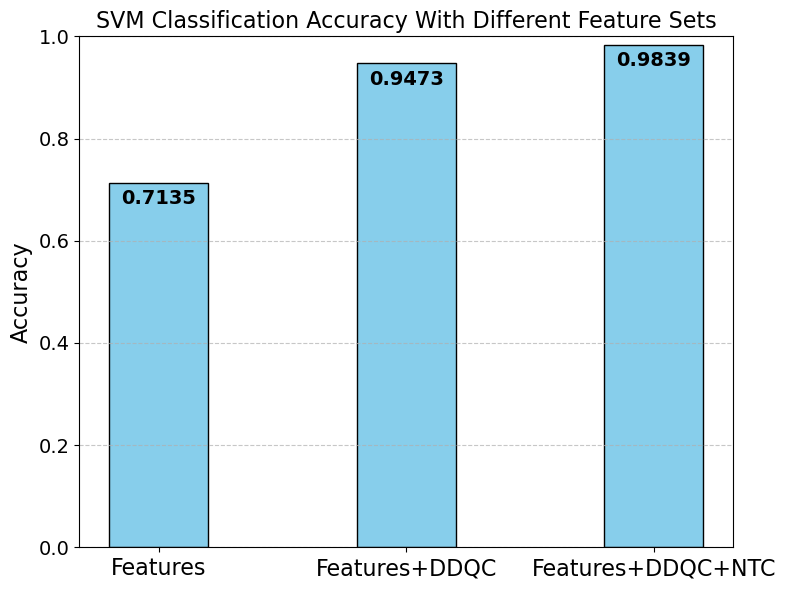

In [144]:
accuracies = [0.7134686930890883, 0.9473433421170552, 0.9839393553214142]
# plt.figure(figsize=(12, 8))
plt.figure(figsize=(8, 6))
bar_width = 0.4
bars = plt.bar(feature_set_names, accuracies, width=bar_width, color='skyblue', edgecolor='black')

# Add accuracy labels on top of the bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2.0, height - 0.05, f'{height:.4f}', ha='center', va='bottom', fontsize=14, color='black', fontweight='bold')

# plt.xlabel('Feature Set', fontsize=16, fontweight='bold')
plt.ylabel('Accuracy', fontsize=16)
plt.title('SVM Classification Accuracy With Different Feature Sets', fontsize=16)
plt.xticks(rotation=0, ha='center', fontsize=16)
plt.yticks(fontsize=14)
plt.ylim(0, 1)  # Ensure the y-axis goes from 0 to 1
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('feature_set_accuracies.png', dpi=300, bbox_inches='tight')  # Save the figure for publication
plt.show()


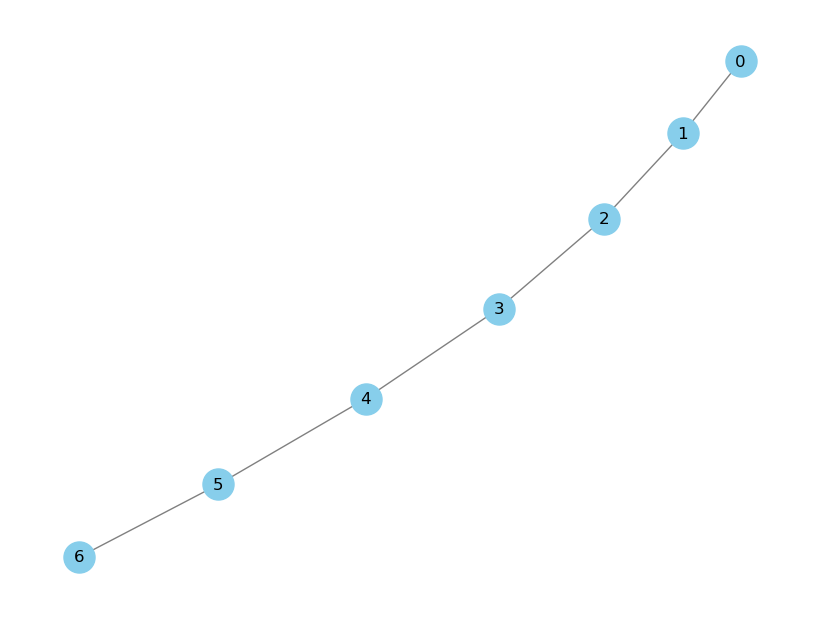

In [145]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a graph
G = nx.path_graph(7)  # Creates a path graph with 7 nodes

# Compute distances from node 0
distances = nx.shortest_path_length(G, source=0)

# Draw the graph
pos = nx.spring_layout(G)  # Position the nodes using the spring layout
labels = {node: dist for node, dist in distances.items()}  # Create labels based on distances

# Draw the graph with labels
plt.figure(figsize=(8, 6))
nx.draw(G, pos, with_labels=True, labels=labels, node_color='skyblue', node_size=500, font_size=12, font_color='black', edge_color='gray')
plt.show()


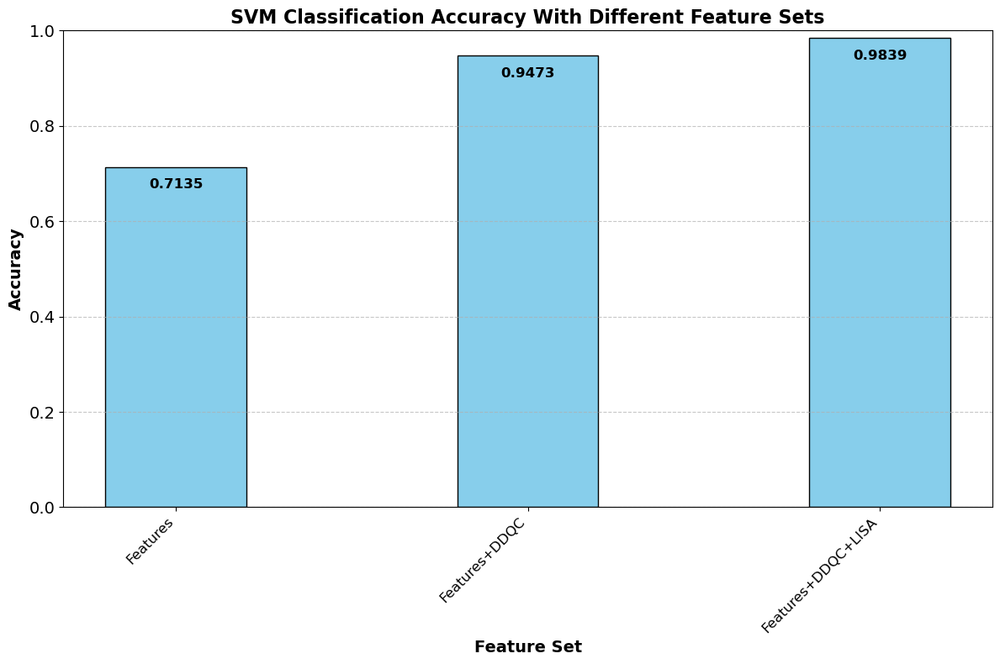

In [113]:
bar_width = 0.4
indices = np.arange(len(feature_set_names))

plt.figure(figsize=(12, 8))
bars = plt.bar(indices, accuracies, width=bar_width, color='skyblue', edgecolor='black')

# Add accuracy labels on top of the bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2.0, height - 0.05, f'{height:.4f}', ha='center', va='bottom', fontsize=12, color='black', fontweight='bold')

plt.xlabel('Feature Set', fontsize=14, fontweight='bold')
plt.ylabel('Accuracy', fontsize=14, fontweight='bold')
plt.title('SVM Classification Accuracy With Different Feature Sets', fontsize=16, fontweight='bold')
plt.xticks(indices, feature_set_names, rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=14)
plt.ylim(0, 1)  # Ensure the y-axis goes from 0 to 1
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('feature_set_accuracies.png', dpi=300, bbox_inches='tight')  # Save the figure for publication
plt.show()

In [81]:
top_5_results = sorted(results, key=lambda x: x[0], reverse=True)[:10]

# Print the top 5 results
for accuracy, features, num_features, n_neighbors in top_5_results:
    print(f"Accuracy: {accuracy:.4f}, Number of features: {num_features}, Neighbors: {n_neighbors}")
    print(f"Selected features: {features}")
    print('\n')

Accuracy: 0.9935, Number of features: 6, Neighbors: 1
Selected features: ['Avg_Clustering', 'Transitivity', 'Assortativity', 'Interval_5', 'Interval_7', 'Interval_8']


Accuracy: 0.9935, Number of features: 7, Neighbors: 1
Selected features: ['LL', 'Avg_Clustering', 'Transitivity', 'Assortativity', 'Interval_5', 'Interval_7', 'Interval_8']


Accuracy: 0.9928, Number of features: 6, Neighbors: 2
Selected features: ['Avg_Clustering', 'Transitivity', 'Assortativity', 'Interval_5', 'Interval_7', 'Interval_8']


Accuracy: 0.9914, Number of features: 6, Neighbors: 3
Selected features: ['Avg_Clustering', 'Transitivity', 'Assortativity', 'Interval_5', 'Interval_7', 'Interval_8']


Accuracy: 0.9914, Number of features: 6, Neighbors: 4
Selected features: ['Avg_Clustering', 'Transitivity', 'Assortativity', 'Interval_5', 'Interval_7', 'Interval_8']


Accuracy: 0.9892, Number of features: 6, Neighbors: 5
Selected features: ['Avg_Clustering', 'Transitivity', 'Assortativity', 'Interval_5', 'Interval_

In [220]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import accuracy_score

X = df_standardized.drop('label_encoded', axis=1)  # Features
y = df_standardized['label_encoded']  # Target variable

# Splitting data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a multinomial logistic regression classifier
model = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=200)

# RFE for feature selection
rfe = RFE(estimator=model, n_features_to_select=5)  # Adjust the number of features
rfe.fit(X_train, y_train)

# Mask of selected features
selected_features = rfe.support_

# Ranking of all features
feature_ranking = rfe.ranking_

# Create a DataFrame to hold feature names and their rankings
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Ranking': feature_ranking
})

# Sort features by their ranking (lower is more important)
sorted_features = feature_importance_df.sort_values(by='Ranking')

# Model with selected features
X_train_selected = rfe.transform(X_train)
X_test_selected = rfe.transform(X_test)

# Train a new model on the selected features
model.fit(X_train_selected, y_train)

# Predict and evaluate the model
y_pred = model.predict(X_test_selected)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy with selected features:", accuracy)
print("Selected features and their rankings:")
print(sorted_features)


Accuracy with selected features: 1.0
Selected features and their rankings:
                     Feature  Ranking
0                         HH        1
5                 Interval_3        1
10                Interval_8        1
11                   Density        1
14         Normalized_Cycles        1
17             Closeness_Avg        2
7                 Interval_5        3
1                         LL        4
6                 Interval_4        5
15  Terminal_Node_Percentage        6
8                 Interval_6        7
3                 Interval_1        8
9                 Interval_7        9
13             Assortativity       10
16           Betweenness_Avg       11
4                 Interval_2       12
12                Modularity       13
2                         LH       14


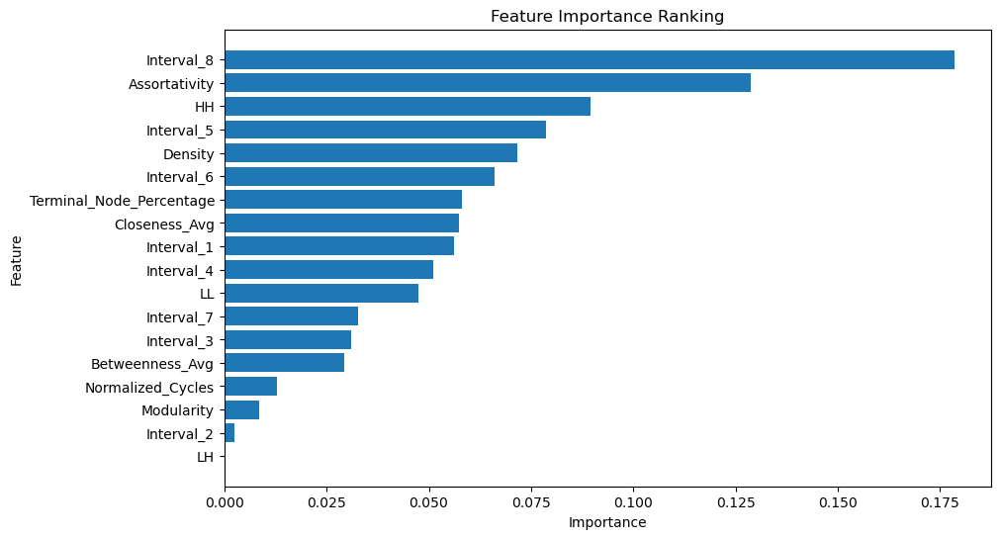

In [224]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

X = df_standardized.drop('label_encoded', axis=1)  # Features
y = df_standardized['label_encoded']  # Target variable

# Train a Random Forest classifier
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X, y)

# Extract feature importances
importances = rf.feature_importances_

# Create a DataFrame for feature importances
feature_importances = pd.DataFrame({
    'feature': X.columns,
    'importance': importances
})

# Sort the DataFrame by importance
feature_importances = feature_importances.sort_values(by='importance', ascending=False)

# Display the feature importances
# import ace_tools as tools; tools.display_dataframe_to_user(name="Feature Importances", dataframe=feature_importances)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['feature'], feature_importances['importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance Ranking')
plt.gca().invert_yaxis()
plt.show()


# Persistance Homology Jakesh

In [113]:
G1, pos1 = make_graph(num_new_nodes = 36, mode = 'independent', plot = False)

G2, pos2 = make_graph(num_new_nodes = 36, mode = 'clustered', plot = False)

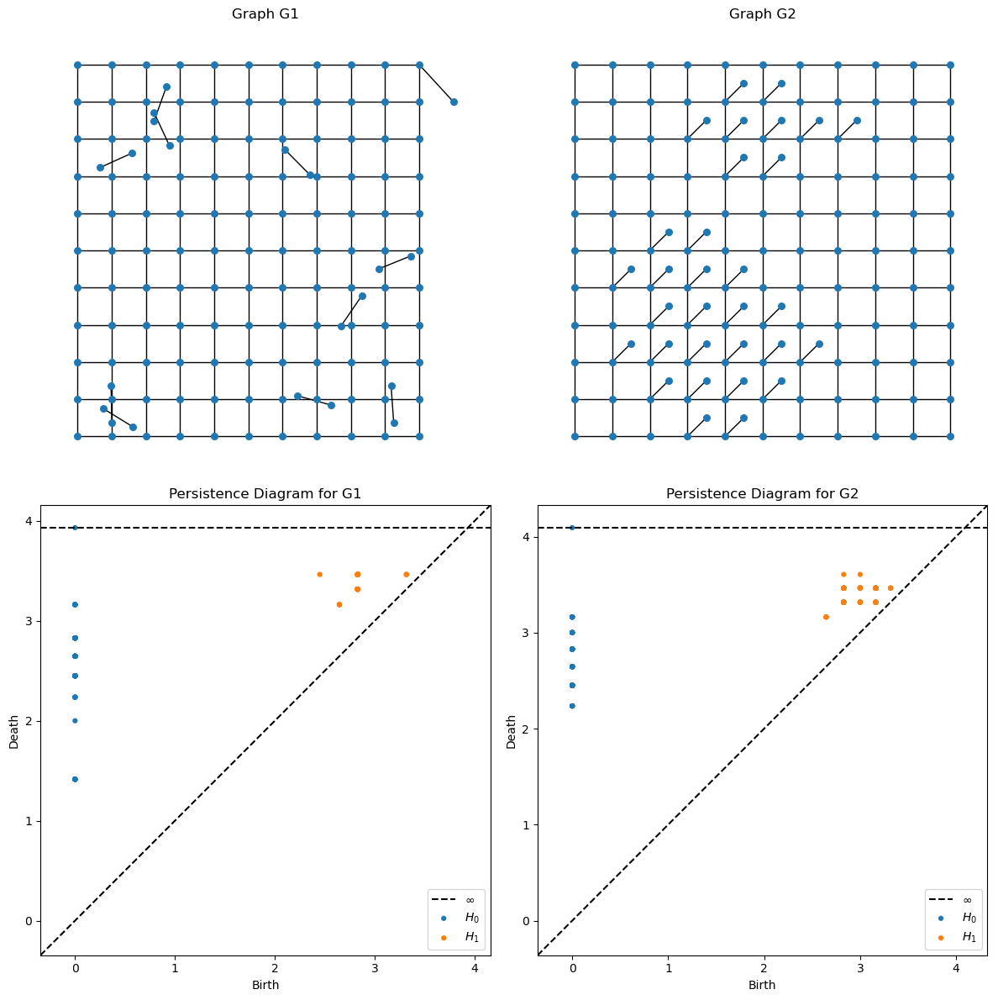

In [225]:
import numpy as np
import networkx as nx
from ripser import ripser
from persim import plot_diagrams
import matplotlib.pyplot as plt

def plot_graph_persistence_and_graphs(G1, G2):
    global diagrams1, diagrams2
    plt.rcParams["text.usetex"] = False

    def compute_persistence_diagram(G):
        global adj_matrixb
        # Convert graph to adjacency matrix
        adj_matrix = nx.adjacency_matrix(G).toarray()
        adj_matrixb = adj_matrix.copy()
        # Convert adjacency matrix to distance matrix for Ripser
        distance_matrix = np.where(adj_matrix == 0, 2, 1)
        np.fill_diagonal(distance_matrix, 0)  # No self-loops, hence distance is zero

        # Calculate the persistence diagram
        return ripser(distance_matrix, maxdim=1)['dgms']

    # Compute persistence diagrams for both graphs
    diagrams1 = compute_persistence_diagram(G1)
    diagrams2 = compute_persistence_diagram(G2)

    # Create figure and subplots
    fig, ax = plt.subplots(2, 2, figsize=(12, 12))  # Adjust the size as needed

    # Plot the graphs
    plt.sca(ax[0, 0])
    nx.draw(G1, pos1, node_size=30, with_labels=False)
    ax[0, 0].set_title('Graph G1')

    plt.sca(ax[0, 1])
    nx.draw(G2, pos2, node_size=30, with_labels=False)
    ax[0, 1].set_title('Graph G2')

    # Plot persistence diagrams
    plt.sca(ax[1, 0])
    plot_diagrams(diagrams1, show=False)
    ax[1, 0].set_title('Persistence Diagram for G1')

    plt.sca(ax[1, 1])
    plot_diagrams(diagrams2, show=False)
    ax[1, 1].set_title('Persistence Diagram for G2')

    # Show the plots
    plt.tight_layout()
    plt.show()


plot_graph_persistence_and_graphs(G1, G2)


In [162]:
import gudhi as gd

# Persistence diagrams for both graphs
diagram1_1d = diagrams1[1] # Extract the 1-dimensional part
diagram2_1d = diagrams2[1]

print("Diagram 1 1D Shape:", diagram1_1d.shape)
print("Diagram 2 1D Shape:", diagram2_1d.shape)

# Compute the 1-Wasserstein distance between the 1-dimensional features
wasserstein_distance = gd.wasserstein.wasserstein_distance(diagram1_1d, diagram2_1d, order=1)

print("Wasserstein Distance:", wasserstein_distance)



Diagram 1 1D Shape: (103, 2)
Diagram 2 1D Shape: (129, 2)
Wasserstein Distance: 14.706475019454956


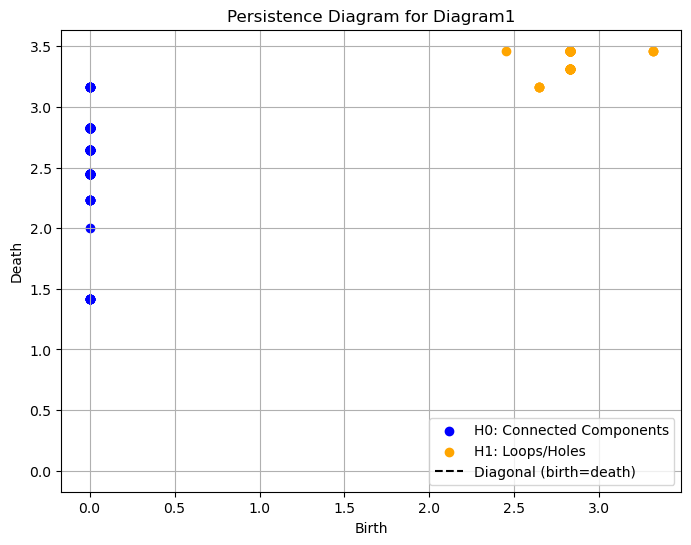

In [164]:
import matplotlib.pyplot as plt
import numpy as np

# Assume diagrams1 is already loaded and contains the necessary data
# Example setup (you should replace these with your actual data if different)
diagram1_0d = diagrams1[0]  # 0-dimensional features (connected components)
diagram1_1d = diagrams1[1]  # 1-dimensional features (loops or holes)

# Plotting the persistence diagram
plt.figure(figsize=(8, 6))
plt.scatter(diagram1_0d[:, 0], diagram1_0d[:, 1], color='blue', label='H0: Connected Components')
plt.scatter(diagram1_1d[:, 0], diagram1_1d[:, 1], color='orange', label='H1: Loops/Holes')

# Infinite death times handling
infinite_mask_0d = np.isinf(diagram1_0d[:, 1])
infinite_mask_1d = np.isinf(diagram1_1d[:, 1])
plt.scatter(diagram1_0d[infinite_mask_0d][:, 0], [max(diagram1_0d[:, 1])*1.1]*sum(infinite_mask_0d), color='blue', marker='>')
plt.scatter(diagram1_1d[infinite_mask_1d][:, 0], [max(diagram1_1d[:, 1])*1.1]*sum(infinite_mask_1d), color='orange', marker='>')

# Line of equality to indicate births equal deaths (usually diagnoal where features are irrelevant)
plt.plot([0, max(np.max(diagram1_0d), np.max(diagram1_1d))], 
         [0, max(np.max(diagram1_0d), np.max(diagram1_1d))], 
         'k--', label='Diagonal (birth=death)')

plt.xlabel('Birth')
plt.ylabel('Death')
plt.title('Persistence Diagram for Diagram1')
plt.legend()
plt.grid(True)
plt.show()



In [180]:
import numpy as np
from scipy.spatial.distance import cdist

def gaussian_kernel(x, y, sigma):
    """ Gaussian kernel function between two points. """
    return np.exp(-np.linalg.norm(x - y)**2 / (2 * sigma**2))

def persistence_weight(point):
    """ Weight function based on persistence (death - birth). """
    birth, death = point
    return death - birth

def persistence_weighted_gaussian_kernel(D1, D2, sigma=1.0):
    """ Compute the Persistence Weighted Gaussian Kernel between two diagrams. """
    # Ensure D1 and D2 are 2D arrays
    D1 = np.asarray(D1)
    D2 = np.asarray(D2)
    
    # Compute pairwise Gaussian kernel
    pairwise_kernels = cdist(D1, D2, metric=lambda u, v: gaussian_kernel(u, v, sigma))
    
    # Weights for each point in both diagrams
    weights_D1 = np.array([persistence_weight(p) for p in D1])
    weights_D2 = np.array([persistence_weight(p) for p in D2])
    
    # Weighted kernel matrix
    weighted_kernel_matrix = np.outer(weights_D1, weights_D2) * pairwise_kernels
    
    # Sum of all weighted kernels
    return np.sum(weighted_kernel_matrix)


kernel_value = persistence_weighted_gaussian_kernel(D1[1], D2[1], sigma=0.5)
print("Persistence Weighted Gaussian Kernel:", kernel_value)


Persistence Weighted Gaussian Kernel: 3355.98111914944


In [186]:
import networkx as nx
import numpy as np
import pandas as pd
import scipy

def compute_network_features(G):
    degrees = np.array([d for n, d in G.degree()])
    mean_deg = np.mean(degrees)
    std_deg = np.std(degrees)
    min_deg = np.min(degrees)
    max_deg = np.max(degrees)

    # Defining intervals
    boundaries = sorted({min_deg, mean_deg - std_deg, mean_deg, mean_deg + std_deg, max_deg})
    intervals = []
    for i in range(len(boundaries) - 1):
        midpoint = (boundaries[i] + boundaries[i + 1]) / 2
        intervals.extend([(boundaries[i], midpoint), (midpoint, boundaries[i + 1])])

    # Histogram to get probabilities
    bin_edges = [b[0] for b in intervals] + [intervals[-1][1]]
    hist, _ = np.histogram(degrees, bins=bin_edges)
    interval_probs = hist / sum(hist)  # Normalize to get probabilities

    # Other network features
    density = nx.density(G)
    avg_clustering = nx.average_clustering(G)

    # Combine all features into a single list
    features = list(interval_probs) + [density, avg_clustering]
    return features

# Example usage
graphs = [nx.erdos_renyi_graph(100, p) for p in np.linspace(0.01, 0.1, 10)]
features_list = [compute_network_features(G) for G in graphs]

# Creating a DataFrame
column_names = [f"Interval_{i+1}" for i in range(8)] + ["Density", "Avg_Clustering"]
df = pd.DataFrame(features_list, columns=column_names)
df


,Interval_1,Interval_2,Interval_3,Interval_4,Interval_5,Interval_6,Interval_7,Interval_8,Density,Avg_Clustering
0,0.37,0.00,0.00,0.00,0.37,0.00,0.16,0.10,0.010101,0.000000
1,0.08,0.00,0.21,0.35,0.00,0.21,0.09,0.06,0.022424,0.000000
2,0.04,0.13,0.20,0.22,0.20,0.00,0.11,0.10,0.032121,0.056714
3,0.09,0.15,0.17,0.16,0.21,0.07,0.13,0.02,0.041414,0.047444
4,0.02,0.06,0.35,0.13,0.16,0.08,0.12,0.08,0.052727,0.056222
5,0.04,0.16,0.16,0.17,0.14,0.12,0.17,0.04,0.055556,0.059084
6,0.01,0.13,0.12,0.34,0.15,0.07,0.15,0.03,0.071111,0.080757
7,0.04,0.16,0.10,0.22,0.20,0.09,0.15,0.04,0.074949,0.077950
8,0.05,0.09,0.14,0.30,0.12,0.15,0.11,0.04,0.094141,0.095301
9,0.06,0.10,0.11,0.29,0.11,0.14,0.15,0.04,0.104848,0.108605


In [188]:
import networkx as nx
import numpy as np
import pandas as pd

def compute_network_features(G):
    degrees = np.array([d for n, d in G.degree()])
    mean_deg = np.mean(degrees)
    std_deg = np.std(degrees)
    min_deg = np.min(degrees)
    max_deg = np.max(degrees)

    # Defining intervals
    boundaries = sorted({min_deg, mean_deg - std_deg, mean_deg, mean_deg + std_deg, max_deg})
    intervals = []
    for i in range(len(boundaries) - 1):
        midpoint = (boundaries[i] + boundaries[i + 1]) / 2
        intervals.extend([(boundaries[i], midpoint), (midpoint, boundaries[i + 1])])

    # Histogram to get probabilities
    bin_edges = [b[0] for b in intervals] + [intervals[-1][1]]
    hist, _ = np.histogram(degrees, bins=bin_edges)
    interval_probs = hist / sum(hist)  # Normalize to get probabilities

    # Compute additional network features
    density = nx.density(G)
    avg_clustering = nx.average_clustering(G)
    transitivity = nx.transitivity(G)
    
    # Compute modularity using community detection
    communities = nx.algorithms.community.greedy_modularity_communities(G)
    modularity = nx.algorithms.community.modularity(G, communities)
    
    # Compute assortativity (degree correlation)
    assortativity = nx.degree_assortativity_coefficient(G)

    # Combine all features into a single list
    features = list(interval_probs) + [density, avg_clustering, transitivity, modularity, assortativity]
    return features

# Example usage
graphs = [nx.erdos_renyi_graph(100, p) for p in np.linspace(0.01, 0.1, 10)]
features_list = [compute_network_features(G) for G in graphs]

# Creating a DataFrame
column_names = [f"Interval_{i+1}" for i in range(8)] + ["Density", "Avg_Clustering", "Transitivity", "Modularity", "Assortativity"]
df = pd.DataFrame(features_list, columns=column_names)
df



,Interval_1,Interval_2,Interval_3,Interval_4,Interval_5,Interval_6,Interval_7,Interval_8,Density,Avg_Clustering,Transitivity,Modularity,Assortativity
0,0.00,0.00,0.41,0.00,0.42,0.00,0.12,0.05,0.008283,0.000000,0.000000,0.884295,-0.029680
1,0.12,0.00,0.23,0.30,0.00,0.20,0.13,0.02,0.021414,0.002143,0.013636,0.664738,0.043421
2,0.06,0.17,0.00,0.28,0.18,0.12,0.18,0.01,0.028081,0.016111,0.030457,0.589307,0.030513
3,0.05,0.11,0.26,0.21,0.18,0.00,0.15,0.04,0.041616,0.048635,0.037129,0.435303,0.009948
4,0.04,0.17,0.13,0.22,0.09,0.20,0.12,0.03,0.045657,0.066892,0.069903,0.446775,-0.084062
5,0.09,0.09,0.14,0.19,0.18,0.10,0.15,0.06,0.056768,0.061973,0.051857,0.373045,-0.105078
6,0.13,0.10,0.11,0.18,0.16,0.15,0.08,0.09,0.063838,0.075327,0.079357,0.350149,0.050971
7,0.05,0.13,0.10,0.19,0.31,0.06,0.14,0.02,0.078788,0.075898,0.076220,0.316716,-0.090842
8,0.07,0.07,0.15,0.27,0.16,0.08,0.10,0.10,0.092929,0.084985,0.084405,0.259407,-0.110298
9,0.05,0.14,0.15,0.21,0.09,0.19,0.14,0.03,0.103838,0.104240,0.107366,0.245403,-0.032890


In [195]:
import networkx as nx
import numpy as np
import pandas as pd

def compute_network_features(G):
    degrees = np.array([d for n, d in G.degree()])
    mean_deg = np.mean(degrees)
    std_deg = np.std(degrees)
    min_deg = np.min(degrees)
    max_deg = np.max(degrees)

    # Defining intervals
    boundaries = sorted({min_deg, mean_deg - std_deg, mean_deg, mean_deg + std_deg, max_deg})
    intervals = []
    for i in range(len(boundaries) - 1):
        midpoint = (boundaries[i] + boundaries[i + 1]) / 2
        intervals.extend([(boundaries[i], midpoint), (midpoint, boundaries[i + 1])])

    # Histogram to get probabilities
    bin_edges = [b[0] for b in intervals] + [intervals[-1][1]]
    hist, _ = np.histogram(degrees, bins=bin_edges)
    interval_probs = hist / sum(hist)  # Normalize to get probabilities

    # Compute additional network features
    density = nx.density(G)
    avg_clustering = nx.average_clustering(G)
    transitivity = nx.transitivity(G)
    
    # Compute modularity using community detection
    communities = nx.algorithms.community.greedy_modularity_communities(G)
    modularity = nx.algorithms.community.modularity(G, communities)
    
    # Compute assortativity (degree correlation)
    assortativity = nx.degree_assortativity_coefficient(G)

    # Cycle basis and normalized cycles
    cycles = list(nx.cycle_basis(G))
    normalized_cycles = len(cycles) / (G.number_of_nodes() * density) if density > 0 else 0

    # Terminal node percentage
    degree_counts = nx.degree_histogram(G)
    num_degree_0 = degree_counts[0] if len(degree_counts) > 0 else 0
    num_degree_1 = degree_counts[1] if len(degree_counts) > 1 else 0
    terminal_percentage = 100 * ((num_degree_0 + num_degree_1) / G.number_of_nodes())

    # Centrality measures
    betweenness_avg = sum(nx.betweenness_centrality(G).values()) / G.number_of_nodes()
    closeness_avg = sum(nx.closeness_centrality(G).values()) / G.number_of_nodes()

    # Combine all features into a single list
    features = list(interval_probs) + [density, avg_clustering, transitivity, modularity, assortativity,
                                       normalized_cycles, terminal_percentage, betweenness_avg, closeness_avg]

    column_names = [f"Interval_{i+1}" for i in range(8)] + ["Density", "Avg_Clustering", "Transitivity", "Modularity",
                                                       "Assortativity", "Normalized_Cycles", "Terminal_Node_Percentage", "Betweenness_Avg", "Closeness_Avg"]
    df = pd.DataFrame([features], columns=column_names)
    return df

# Example usage
# graphs = [nx.erdos_renyi_graph(100, p) for p in np.linspace(0.01, 0.1, 10)]
# features_list = [compute_network_features(G) for G in graphs]

# # Creating a DataFrame
# column_names = [f"Interval_{i+1}" for i in range(8)] + ["Density", "Avg_Clustering", "Transitivity", "Modularity",
#                                                        "Assortativity", "Normalized_Cycles", "Terminal_Node_Percentage", "Betweenness_Avg", "Closeness_Avg"]
# df = pd.DataFrame(features_list, columns=column_names)
# df
compute_network_features(graphs[1])

,Interval_1,Interval_2,Interval_3,Interval_4,Interval_5,Interval_6,Interval_7,Interval_8,Density,Avg_Clustering,Transitivity,Modularity,Assortativity,Normalized_Cycles,Terminal_Node_Percentage,Betweenness_Avg,Closeness_Avg
0,0.2,0.0,0.29,0.0,0.25,0.0,0.24,0.02,0.016768,0.016667,0.022388,0.727319,-0.020208,4.174699,49.0,0.02965,0.086031


In [194]:
graphs[1]

In [84]:
import networkx as nx
import numpy as np
from gudhi import SimplexTree
from gudhi.wasserstein import wasserstein_distance

def graph_to_simplicial_complex(G):
    st = SimplexTree()
    node_map = {node: idx for idx, node in enumerate(G.nodes())}
    for node in G.nodes():
        st.insert([node_map[node]], filtration=0)
    for edge in G.edges():
        st.insert([node_map[edge[0]], node_map[edge[1]]], filtration=0)
    return st

def compute_persistence_diagram(G):
    st = graph_to_simplicial_complex(G)
    st.compute_persistence()
    # Convert persistence diagram to the expected format (list of tuples)
    return np.array([(p[1][0], p[1][1]) for p in st.persistence() if p[0] == 1])

def compute_topological_similarity(G1, G2):
    global pd1, pd2
    pd1 = compute_persistence_diagram(G1)
    pd2 = compute_persistence_diagram(G2)
    return wasserstein_distance(pd1, pd2, order=1.)


similarity_index = compute_topological_similarity(G1, G2)
print(f"Topological Similarity Index (Persistence Homology): {similarity_index}")


Topological Similarity Index (Persistence Homology): 0.0


In [116]:
import networkx as nx
import gudhi as gd
import numpy as np

def graph_to_rips_complex(graph, max_dimension, max_edge_length):
    # Convert graph to distance matrix
    distance_matrix = nx.floyd_warshall_numpy(graph)
    # Infinite distance where there is no edge
    np.fill_diagonal(distance_matrix, 0)
    distance_matrix[distance_matrix == np.inf] = max_edge_length + 1
    
    # Construct Rips complex
    rips_complex = gd.RipsComplex(distance_matrix=distance_matrix, max_edge_length=max_edge_length)
    simplex_tree = rips_complex.create_simplex_tree(max_dimension=max_dimension)
    
    # Compute persistence
    persistence = simplex_tree.persistence()
    return simplex_tree.persistence_intervals_in_dimension(1)  # Return 1-dimensional features

def compute_wasserstein_distance(diagram1, diagram2):
    # Calculate Wasserstein distance using GUDHI
    return gd.bottleneck_distance(diagram1, diagram2)

# # Example usage
# G1 = nx.random_geometric_graph(100, 0.125)
# G2 = nx.random_geometric_graph(100, 0.130)

diagram1 = graph_to_rips_complex(G1, max_dimension=2, max_edge_length=5)
diagram2 = graph_to_rips_complex(G2, max_dimension=2, max_edge_length=5)

distance = compute_wasserstein_distance(diagram1, diagram2)
print("Wasserstein Distance:", distance)


Wasserstein Distance: 9.557242109959374e-309


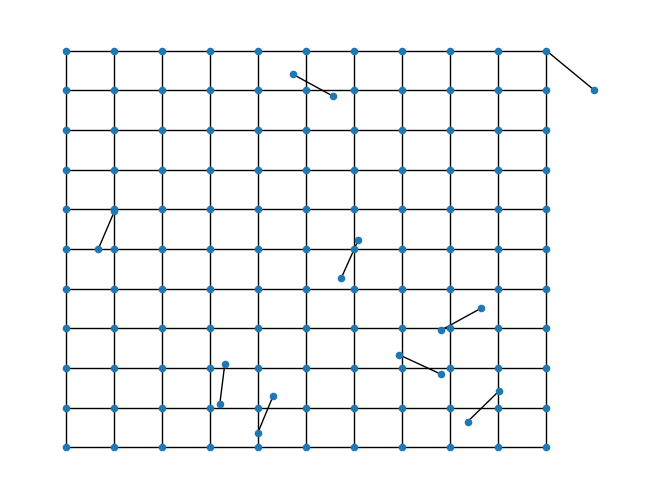

In [114]:
# pos = nx.get_node_attributes(G1, pos1)  # If using geometric graphs
nx.draw(G1, pos1, node_size=20, with_labels=False)
plt.show()

In [98]:
graph, max_dimension, max_edge_length


distance_matrix = nx.floyd_warshall_numpy(graph)
# Infinite distance where there is no edge
np.fill_diagonal(distance_matrix, 0)
distance_matrix[distance_matrix == np.inf] = max_edge_length + 1

# Construct Rips complex
rips_complex = gd.RipsComplex(distance_matrix=distance_matrix, max_edge_length=max_edge_length)
simplex_tree = rips_complex.create_simplex_tree(max_dimension=max_dimension)

# Compute persistence
persistence = simplex_tree.persistence()
simplex_tree.persistence_intervals_in_dimension(1)  # Return 1-dimensional features

array([], shape=(0, 2), dtype=float64)

In [92]:
pd2

array([[ 0., inf]])

In [87]:
st = graph_to_simplicial_complex(G1)
st.compute_persistence()

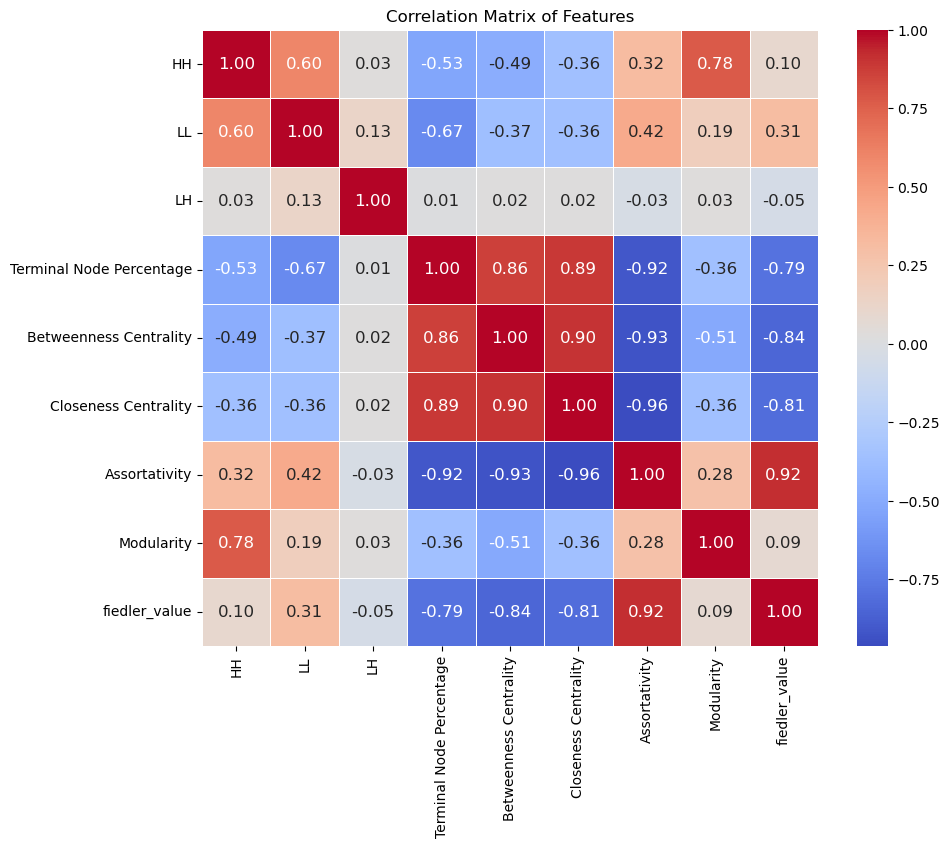

In [31]:
import seaborn as sns
corr = vars.iloc[:,:-1].corr()

# Create a heatmap
plt.figure(figsize=(10, 8))  # You can adjust the size of the figure here
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True,
            linewidths=.5, annot_kws={"size": 12})
plt.title('Correlation Matrix of Features')
plt.show()


In [17]:
df

,HH,LL,LH,HL,Number of Components,Num of Cycles / Num of Nodes,Density,Clustering Coefficient,Terminal Node Percentage,Betweenness Centrality,Closeness Centrality,Assortativity,Modularity,fiedler_value,spectral_gap,label,label_encoded
0,21.739130,7.246377,0.0,0.0,9,0.724638,2.422511,0.0,12.318841,0.506548,15.052390,0.792695,0.536222,7.798613,0.302792,random,4
1,19.014085,6.338028,0.0,0.0,11,0.704225,2.307462,0.0,14.788732,0.478116,14.653741,0.815348,0.541182,7.798613,0.302792,random,4
2,19.014085,6.338028,0.0,0.0,11,0.704225,2.307462,0.0,14.788732,0.478116,14.653741,0.815348,0.541182,7.798613,0.302792,random,4
3,18.571429,5.714286,0.0,0.0,10,0.714286,2.363823,0.0,13.571429,0.492024,14.850198,0.804725,0.538715,7.798613,0.302792,random,4
4,18.571429,5.714286,0.0,0.0,10,0.714286,2.363823,0.0,13.571429,0.492024,14.850198,0.804725,0.538715,7.798613,0.302792,random,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,22.292994,1.910828,0.0,0.0,1,0.636943,2.090479,0.0,22.929936,0.749198,19.114020,-0.454609,0.616936,4.110750,0.738666,independent,3
4996,19.108280,1.910828,0.0,0.0,1,0.636943,2.090479,0.0,22.929936,0.655699,21.541773,-0.403351,0.543694,5.253701,1.906224,independent,3
4997,19.108280,1.910828,0.0,0.0,1,0.636943,2.090479,0.0,22.929936,0.662845,21.239882,-0.388408,0.517433,4.949951,1.993948,independent,3
4998,24.203822,1.910828,0.0,0.0,1,0.636943,2.090479,0.0,22.929936,0.698280,20.402623,-0.432518,0.610214,4.321316,1.713669,independent,3


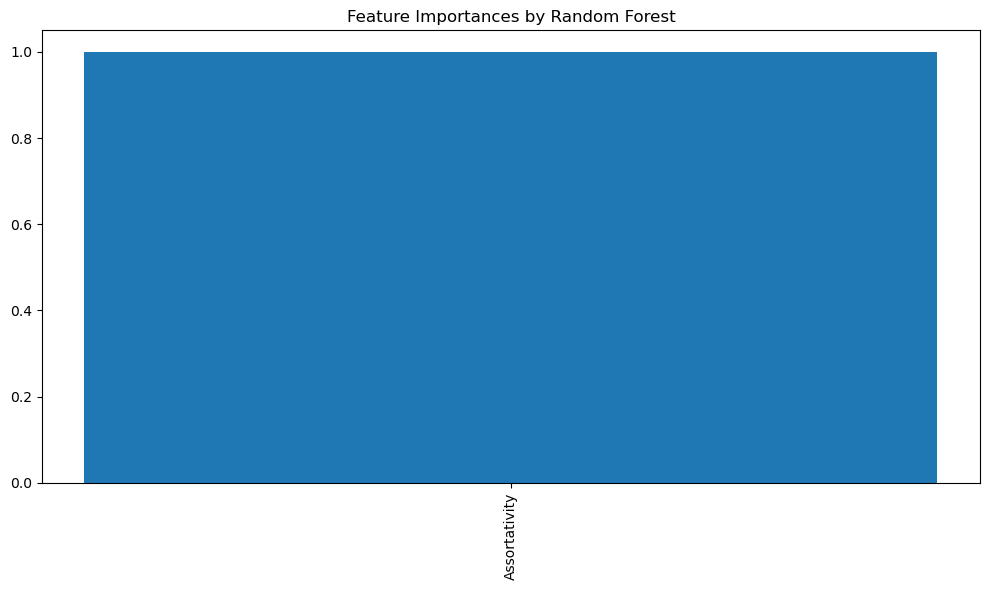

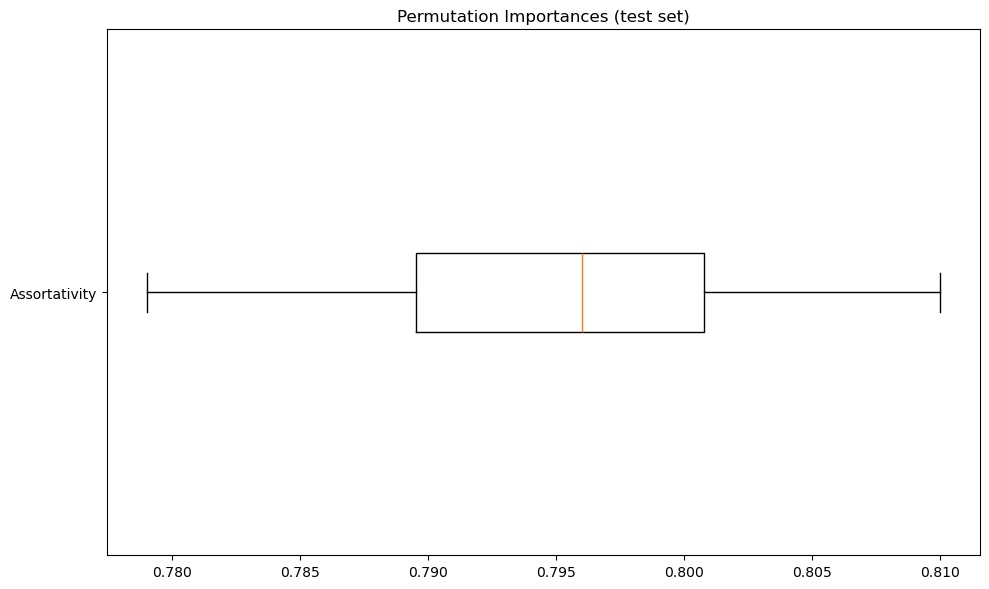

IndexError: index 4 is out of bounds for axis 1 with size 1

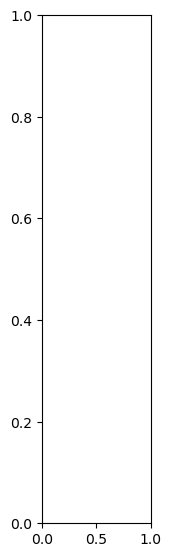

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.inspection import permutation_importance
import shap

# Assuming 'df' is your DataFrame with the last column as the label
X = df_standardized.drop('label', axis=1)  # Features
y = df_standardized['label']  # Target variable

X = df.drop(['label', 'label_encoded', 'Number of Components'], axis=1) 
X = df[['Assortativity']]
y = df['label']  # Target variable

# X = df.iloc[:, :-1]  # All rows, all columns except the last
# y = df.iloc[:, -1]   # All rows, just the last column

# Splitting data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Random Forest classifier
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Feature Importance from Random Forest
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

# Plotting Feature Importances from Random Forest
plt.figure(figsize=(10, 6))
plt.title('Feature Importances by Random Forest')
plt.bar(range(X_train.shape[1]), importances[indices], align='center')
plt.xticks(range(X_train.shape[1]), X_train.columns[indices], rotation=90)
plt.tight_layout()
plt.show()

# Permutation Importance
result = permutation_importance(rf, X_test, y_test, n_repeats=10, random_state=42, n_jobs=-1)
sorted_idx = result.importances_mean.argsort()

# Plotting Permutation Importances
plt.figure(figsize=(10, 6))
plt.boxplot(result.importances[sorted_idx].T, vert=False, labels=X_test.columns[sorted_idx])
plt.title('Permutation Importances (test set)')
plt.tight_layout()
plt.show()

# Calculate and Plot SHAP Values
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test)

# Summary Plot of SHAP Values
shap.summary_plot(shap_values, X_test, plot_type="bar", class_names=['random', 'dispersed', 'clustered', 'clustered_star', 'independent'])


In [21]:
extr = ress2_df[ress2_df.index.str.contains('escape')]
extr

,HH,LH,LL,HL,Number of Components,Num of Cycles / Num of Nodes,Density,Clustering Coefficient,Terminal Node Percentage,Betweenness Centrality,Closeness Centrality,Assortativity,Modularity,fiedler_value,spectral_gap
independent_escape_avg,19.455686,0.000000,6.714498,0.0,9.748000,7.170345e-01,2.379739e+00,0.0,1.323882e+01,4.959823e-01,14.903907,0.800951,0.538074,7.798613e+00,3.027919e-01
independent_escape_std,1.225656,0.000000,1.254674,0.0,1.061896,1.105397e-02,6.283852e-02,0.0,1.337530e+00,1.556164e-02,0.215914,0.013295,0.002652,3.072294e-14,2.205241e-13
clustered_star_escape_avg,19.214013,0.014650,1.996815,0.0,1.000000,6.369427e-01,2.090479e+00,0.0,2.292994e+01,6.737607e-01,21.038238,-0.401606,0.542544,4.871190e+00,1.891686e+00
clustered_star_escape_std,2.910439,0.231941,0.629173,0.0,0.000000,1.110779e-16,4.443114e-16,0.0,1.066347e-14,2.852280e-02,0.794778,0.021744,0.029102,6.180389e-01,9.352530e-01
disperse_escape_avg,0.000000,0.000000,0.000000,0.0,1.000000,6.369427e-01,2.090479e+00,0.0,2.292994e+01,7.001654e-01,20.347141,-0.165469,0.358292,6.007909e+00,3.733125e-13
disperse_escape_std,0.000000,0.000000,0.000000,0.0,0.000000,1.110779e-16,4.443114e-16,0.0,1.066347e-14,3.332336e-16,0.000000,0.000000,0.000000,1.777246e-15,0.000000e+00
clustered_escape_avg,18.024994,0.000000,11.440152,0.0,1.000000,6.735190e-01,2.260848e+00,0.0,1.850420e+01,6.665028e-01,20.099005,-0.027727,0.448095,5.990045e+00,1.280749e+00
clustered_escape_std,2.877403,0.000000,3.296525,0.0,0.000000,1.404972e-02,6.681225e-02,0.0,1.700016e+00,1.706128e-02,0.655240,0.025434,0.038870,4.405852e-01,6.134074e-01
random_escape_avg,9.840764,0.000000,0.040127,0.0,1.000000,6.369427e-01,2.090479e+00,0.0,2.292994e+01,6.853095e-01,20.711067,-0.165749,0.479894,5.936794e+00,3.863172e-01
random_escape_std,3.252999,0.000000,0.179150,0.0,0.000000,1.110779e-16,4.443114e-16,0.0,1.066347e-14,7.271649e-03,0.190999,0.017823,0.033559,1.452973e-01,2.202642e-01


Columns to drop due to multicollinearity: ['Density', 'Betweenness_Centrality', 'Closeness_Centrality', 'Modularity', 'fiedler_value']
ANOVA Results:
HH: F=0.6174146068673558, p=0.75959204096603
HL: F=1.0988525440383958, p=0.4392176675772867
LH: F=1.3560610712974357, p=0.31971999221252506
LL: F=2.41605191177474, p=0.09282383154813759

MANOVA Results:
Key Parameters:                   Multivariate linear model
                                                             
-------------------------------------------------------------
         Intercept        Value  Num DF Den DF F Value Pr > F
-------------------------------------------------------------
            Wilks' lambda 0.2531 4.0000 7.0000  5.1655 0.0295
           Pillai's trace 0.7469 4.0000 7.0000  5.1655 0.0295
   Hotelling-Lawley trace 2.9517 4.0000 7.0000  5.1655 0.0295
      Roy's greatest root 2.9517 4.0000 7.0000  5.1655 0.0295
-------------------------------------------------------------
                             

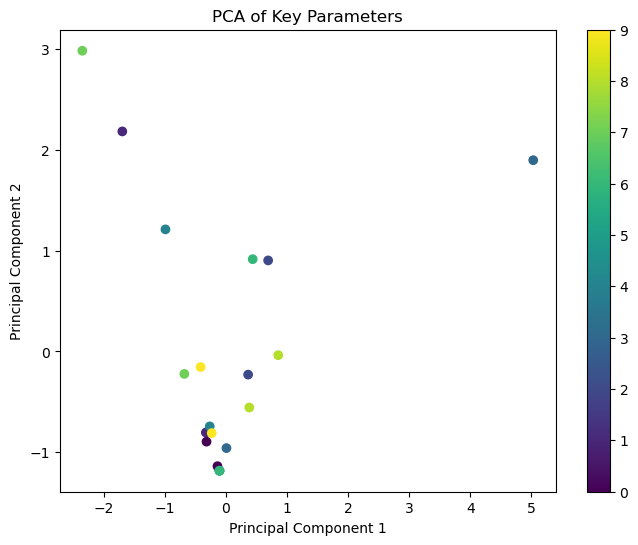

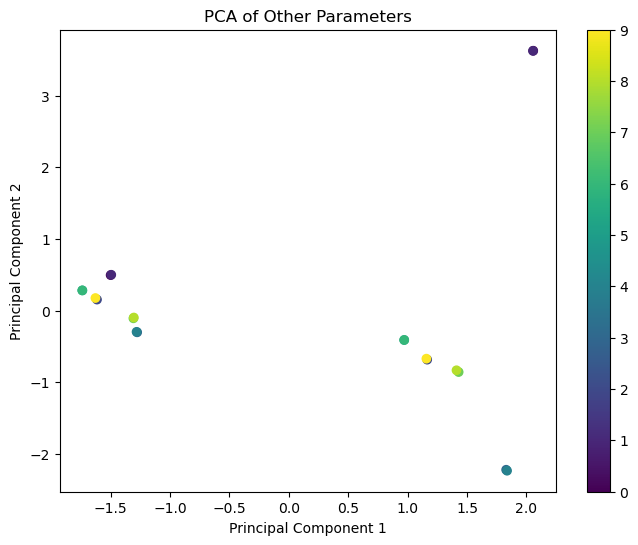

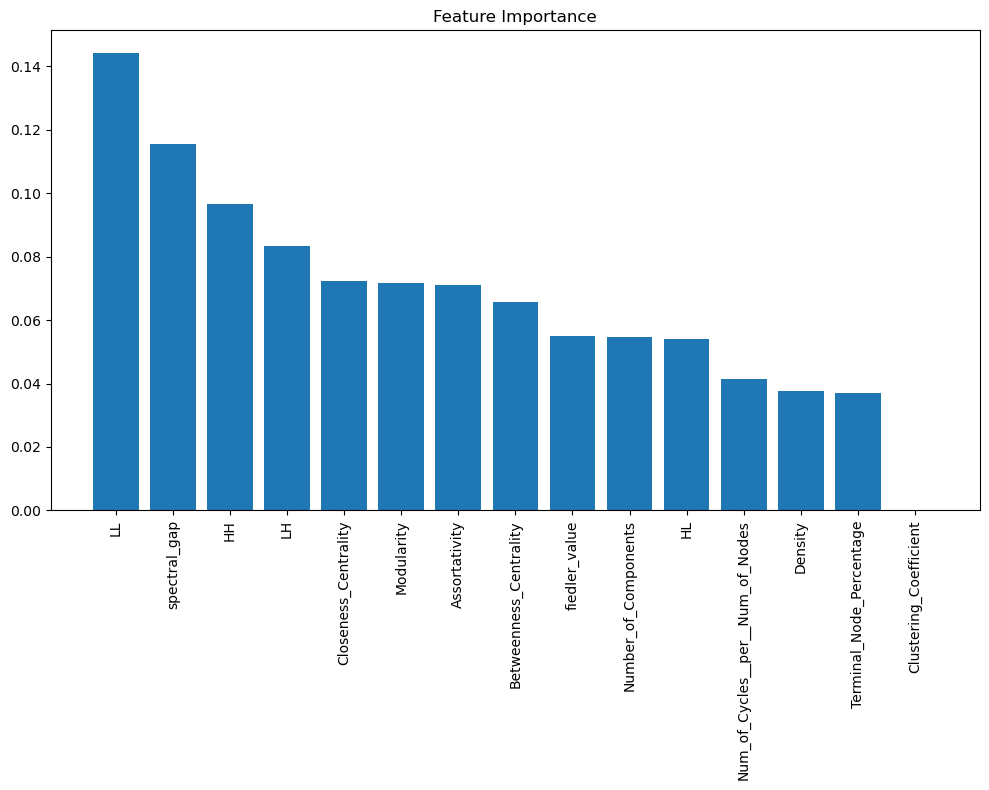

In [35]:
import pandas as pd
import numpy as np
from scipy.stats import f_oneway
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from statsmodels.multivariate.manova import MANOVA
import matplotlib.pyplot as plt

# Assuming df is loaded from your DataFrame
df = ress2_df.copy()

# Create a 'scenario' column from the DataFrame index
df['scenario'] = df.index.str.split('_').str[:-1].str.join('_')

# Rename columns to remove spaces and special characters
df.columns = df.columns.str.replace(' ', '_').str.replace('/', '_per_')

# Splitting the data
key_parameters = df[['HH', 'HL', 'LH', 'LL']]
key_parameters['scenario'] = df['scenario']
other_parameters = df.drop(columns=['HH', 'HL', 'LH', 'LL', 'scenario'])

# Check for multicollinearity and drop highly collinear variables
corr_matrix = other_parameters.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
print(f"Columns to drop due to multicollinearity: {to_drop}")

# Drop the highly collinear variables
other_parameters = other_parameters.drop(columns=to_drop)

# Apply PCA to reduce dimensionality of other parameters
scaler = StandardScaler()
other_params_scaled = scaler.fit_transform(other_parameters)

# Set the number of PCA components to the minimum of the number of samples or features
n_components = min(other_params_scaled.shape[0], other_params_scaled.shape[1])
pca = PCA(n_components=n_components)
other_params_pca = pca.fit_transform(other_params_scaled)

# Create a DataFrame for the PCA-transformed other parameters
other_params_pca_df = pd.DataFrame(other_params_pca, index=other_parameters.index, 
                                   columns=[f'PC{i+1}' for i in range(other_params_pca.shape[1])])
other_params_pca_df['scenario'] = df['scenario']

# ANOVA Test for each parameter
anova_results = {}
for column in ['HH', 'HL', 'LH', 'LL']:
    grouped_data = [key_parameters[key_parameters['scenario'] == scenario][column] for scenario in key_parameters['scenario'].unique()]
    anova_results[column] = f_oneway(*grouped_data)

# Display ANOVA results
print("ANOVA Results:")
for param, result in anova_results.items():
    print(f"{param}: F={result.statistic}, p={result.pvalue}")

# MANOVA
manova1 = MANOVA.from_formula('HH + HL + LH + LL ~ scenario', data=key_parameters)
manova2 = MANOVA.from_formula(' + '.join(other_params_pca_df.columns[:-1]) + ' ~ scenario', data=other_params_pca_df)
print("\nMANOVA Results:")
print("Key Parameters:", manova1.mv_test())
print("Other Parameters:", manova2.mv_test())

# PCA for visualization
pca_for_viz = PCA(n_components=2)

# For key parameters
key_params_scaled = scaler.fit_transform(key_parameters.drop(columns='scenario'))
pca_result_key = pca_for_viz.fit_transform(key_params_scaled)
plt.figure(figsize=(8, 6))
plt.scatter(pca_result_key[:, 0], pca_result_key[:, 1], c=pd.factorize(key_parameters['scenario'])[0])
plt.title('PCA of Key Parameters')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar()
plt.show()

# For other parameters
pca_result_other = pca_for_viz.fit_transform(other_params_scaled)
plt.figure(figsize=(8, 6))
plt.scatter(pca_result_other[:, 0], pca_result_other[:, 1], c=pd.factorize(df['scenario'])[0])
plt.title('PCA of Other Parameters')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar()
plt.show()

# LDA
lda = LinearDiscriminantAnalysis()
lda_key = lda.fit_transform(key_params_scaled, pd.factorize(key_parameters['scenario'])[0])
lda_other = lda.fit_transform(other_params_scaled, pd.factorize(df['scenario'])[0])

# Random Forest for feature importance
rf = RandomForestClassifier()
rf.fit(df.drop(columns='scenario'), pd.factorize(df['scenario'])[0])
importances = rf.feature_importances_
sorted_indices = np.argsort(importances)[::-1]

# Plot feature importance
plt.figure(figsize=(10, 8))
plt.title('Feature Importance')
plt.bar(range(df.shape[1] - 1), importances[sorted_indices], align='center')
plt.xticks(range(df.shape[1] - 1), df.columns[sorted_indices], rotation=90)
plt.tight_layout()
plt.show()


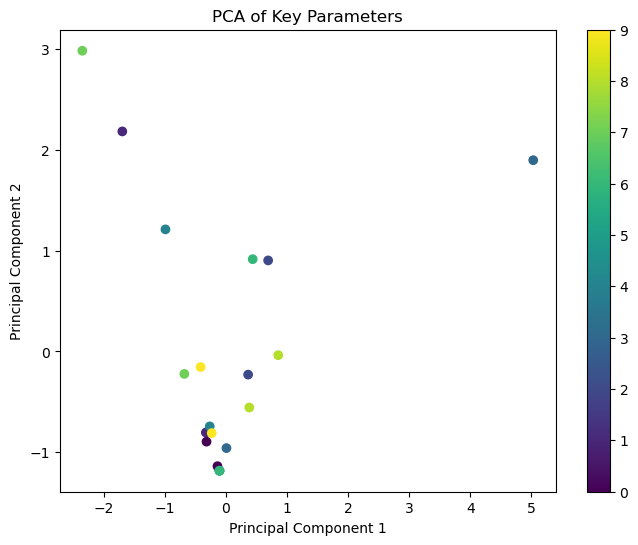

In [40]:
pca_for_viz = PCA(n_components=2)

# For key parameters
key_params_scaled = scaler.fit_transform(key_parameters.drop(columns='scenario'))
pca_result_key = pca_for_viz.fit_transform(key_params_scaled)
plt.figure(figsize=(8, 6))
plt.scatter(pca_result_key[:, 0], pca_result_key[:, 1], c=pd.factorize(key_parameters['scenario'])[0])
plt.title('PCA of Key Parameters')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar()
plt.show()

In [36]:
importances[sorted_indices]

array([0.1441435 , 0.11545237, 0.09645716, 0.08336729, 0.07219641,
       0.07163145, 0.07105351, 0.06585079, 0.05513252, 0.05459008,
       0.05412095, 0.04127666, 0.03758447, 0.03714284, 0.        ])

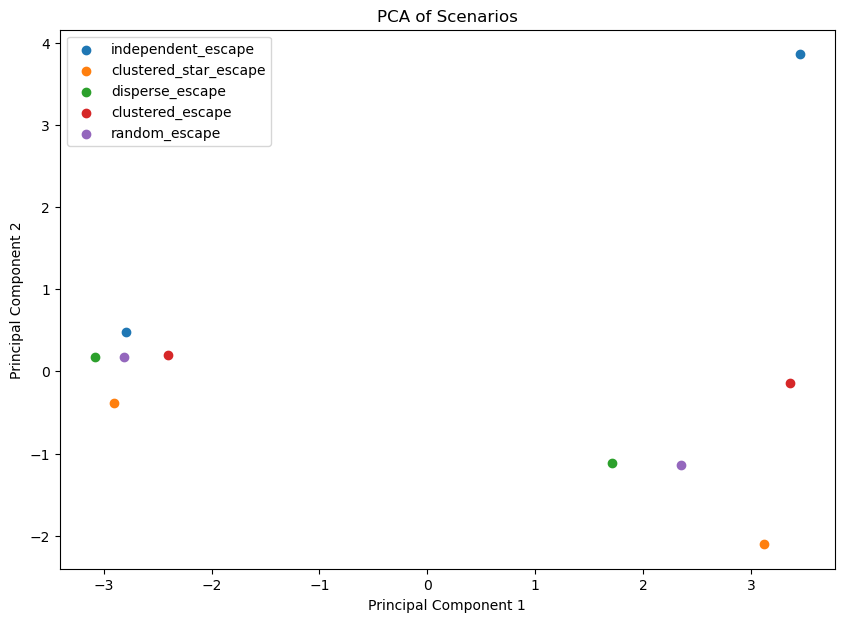

                              importance
LL                              0.170344
spectral_gap                    0.140814
HH                              0.109138
Number of Components            0.097376
Assortativity                   0.073647
Modularity                      0.071405
Betweenness Centrality          0.066734
fiedler_value                   0.056087
Closeness Centrality            0.051863
LH                              0.044913
Density                         0.043405
Terminal Node Percentage        0.039317
Num of Cycles / Num of Nodes    0.034956
HL                              0.000000
Clustering Coefficient          0.000000
                    precision    recall  f1-score   support

   disperse_escape       0.00      0.00      0.00       1.0
independent_escape       0.00      0.00      0.00       1.0
     random_escape       0.00      0.00      0.00       1.0

          accuracy                           0.00       3.0
         macro avg       0.00      0.00   

In [41]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

# Assuming ress2_df is your DataFrame
df = extr.reset_index()

# Extract features and labels
X = df.drop(columns=['index'])
y = df['index'].apply(lambda x: '_'.join(x.split('_')[:-1]))  # Extracting scenario labels

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# PCA for dimensionality reduction
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Plot PCA results
plt.figure(figsize=(10, 7))
for scenario in y.unique():
    plt.scatter(X_pca[y == scenario, 0], X_pca[y == scenario, 1], label=scenario)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.title('PCA of Scenarios')
plt.show()

# Feature importance using Random Forest
clf = RandomForestClassifier()
clf.fit(X, y)
feature_importances = pd.DataFrame(clf.feature_importances_,
                                   index=X.columns,
                                   columns=['importance']).sort_values('importance', ascending=False)

# Print feature importances
print(feature_importances)

# Check classification performance
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))

# Check performance using only HH, HL, LH, LL
selected_features = ['HH', 'HL', 'LH', 'LL']
X_selected = df[selected_features]
X_train_sel, X_test_sel, y_train_sel, y_test_sel = train_test_split(X_selected, y, test_size=0.3, random_state=42)
clf.fit(X_train_sel, y_train_sel)
y_pred_sel = clf.predict(X_test_sel)
print(classification_report(y_test_sel, y_pred_sel))


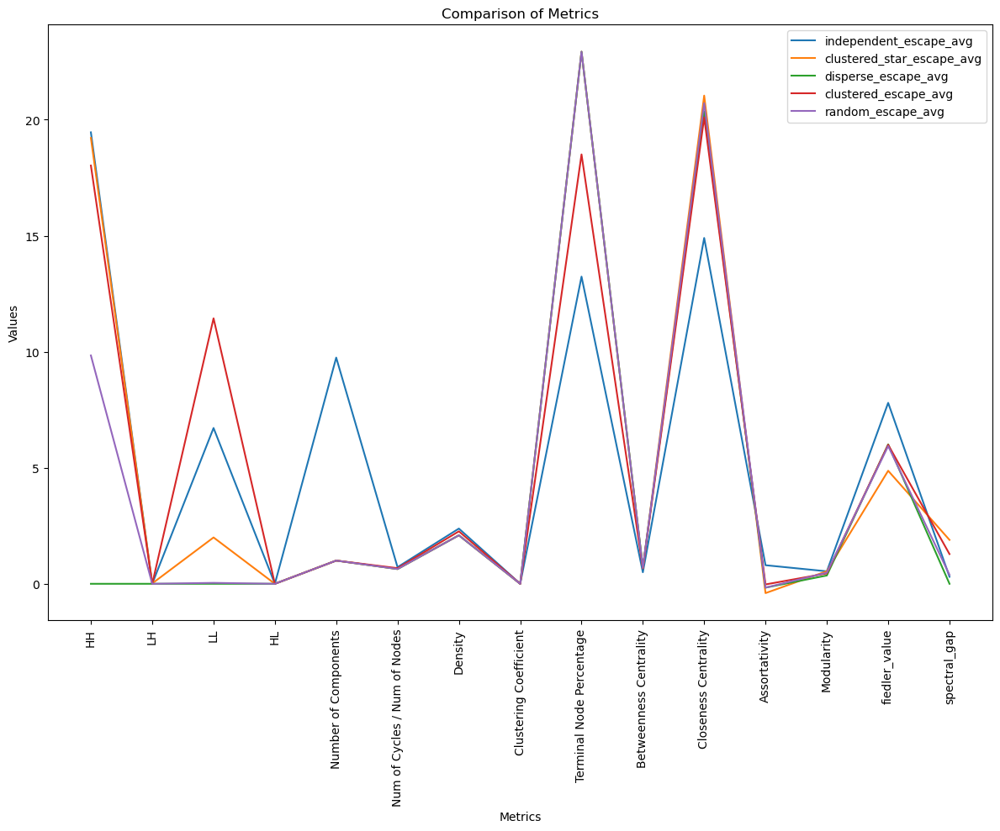

In [20]:

plt.figure(figsize=(12, 10))

for idx in extr.index:
    plt.plot(extr.columns, extr.loc[idx], label=idx)

plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Comparison of Metrics')
plt.legend()
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

In [12]:
gt_p_ag = gtag_ress2_df_p[gtag_ress2_df_p.index.str.endswith('_avg')]
gt_p_ag_esc = gt_p_ag[gt_p_ag.index.str.endswith('escape_avg')]


gt_filtered_df = gtag_ress2_df[gtag_ress2_df.index.str.endswith('_avg')]
gt_np_ag_esc = gt_filtered_df[gt_filtered_df.index.str.endswith('escape_avg')]

filtered_df = agri_ress2[agri_ress2.index.str.endswith('_avg')]
filtered_pd_ag_esc = filtered_df[filtered_df.index.str.endswith('escape_avg')]


total_agri_stat_p = pd.concat([gt_p_ag_esc, filtered_pd_ag_esc])
# total_agri_stat_p

# gt_p_ag_esc
# total_agri_stat_p = gt_p_ag

NameError: name 'gtag_ress2_df' is not defined

In [43]:
GT_AG_ESC_LISA.shape

(1, 4)

In [44]:
ses.shape

(49, 19)

In [51]:
measure_similarity(GT_AG_ESC_LISA, ses)


[Cosine Similarity      0.910118
 Euclidean Distance    15.146254
 Manhattan Distance    18.811405
 dtype: float64,
 Cosine Similarity     0.078217
 Euclidean Distance    3.410644
 Manhattan Distance    4.163500
 dtype: float64]

In [52]:
measure_similarity(GT_AG_ESC_LISA, tes)


[Cosine Similarity     0.995286
 Euclidean Distance    3.942843
 Manhattan Distance    4.965151
 dtype: float64,
 Cosine Similarity     0.005150
 Euclidean Distance    1.813539
 Manhattan Distance    2.230102
 dtype: float64]

In [72]:
measure_similarity(GT_AG_DEG_LISA, sno)


[Cosine Similarity     0.975685
 Euclidean Distance    4.120261
 Manhattan Distance    6.390296
 dtype: float64,
 Cosine Similarity     0.010771
 Euclidean Distance    1.425665
 Manhattan Distance    2.284725
 dtype: float64]

In [73]:
measure_similarity(GT_AG_DEG_LISA, tno)


[Cosine Similarity     0.933661
 Euclidean Distance    5.636088
 Manhattan Distance    7.485508
 dtype: float64,
 Cosine Similarity     0.098519
 Euclidean Distance    4.748427
 Manhattan Distance    5.547460
 dtype: float64]

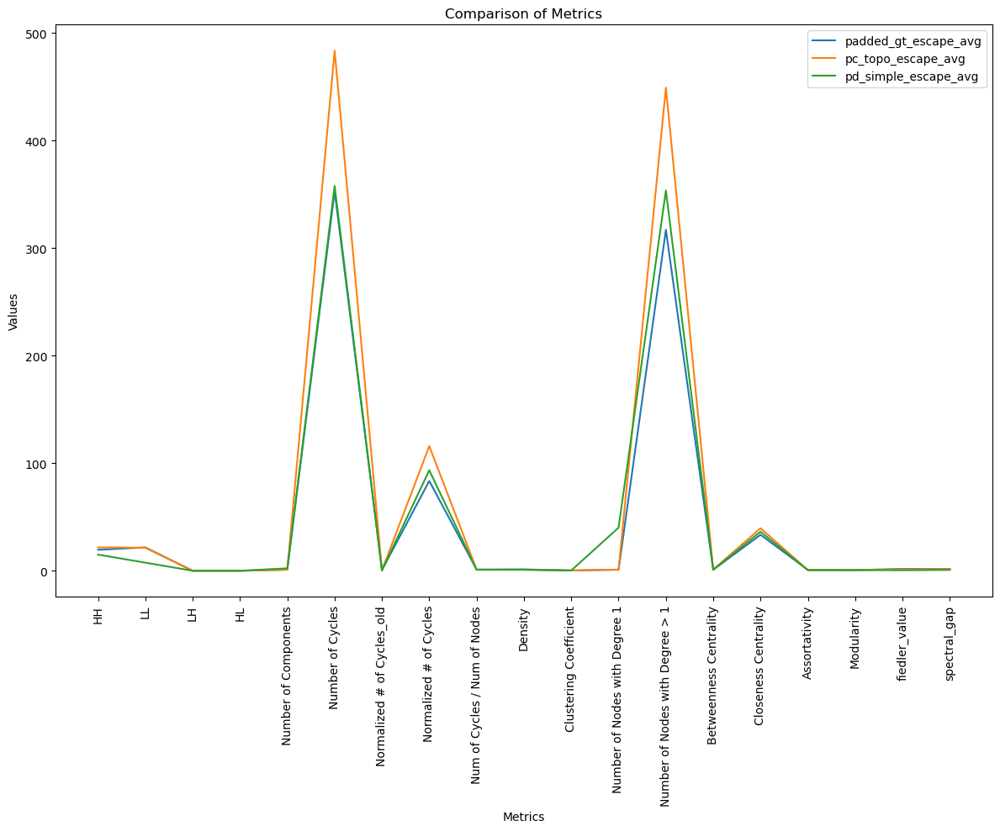

In [7]:

plt.figure(figsize=(12, 10))

for idx in total_agri_stat_p.index:
    plt.plot(total_agri_stat_p.columns, total_agri_stat_p.loc[idx], label=idx)

plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Comparison of Metrics')
plt.legend()
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

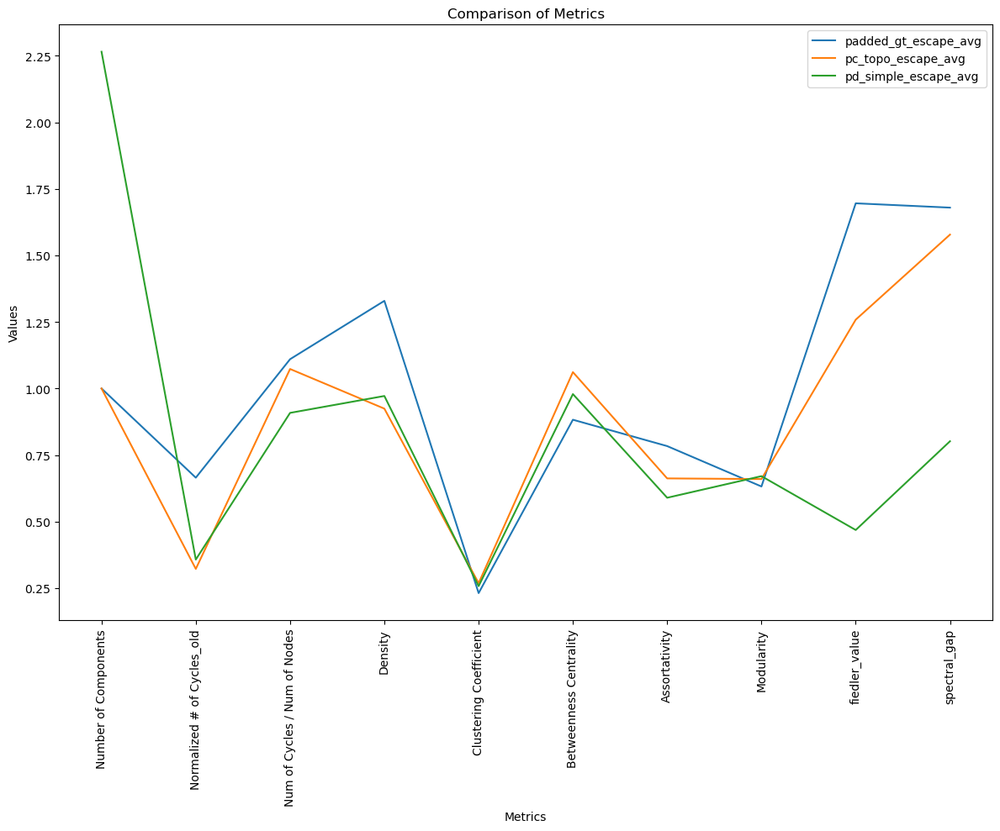

In [74]:
filterred_escape = total_agri_stat_p[['Number of Components', 
       'Normalized # of Cycles_old',
       'Num of Cycles / Num of Nodes', 'Density', 'Clustering Coefficient',
       'Betweenness Centrality', 'Assortativity',
       'Modularity', 'fiedler_value', 'spectral_gap']]

plt.figure(figsize=(12, 10))

for idx in filterred_escape.index:
    plt.plot(filterred_escape.columns, filterred_escape.loc[idx], label=idx)

plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Comparison of Metrics')
plt.legend()
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

In [9]:
filterred_escape

,HH,LL,LH,HL,Number of Components,Normalized # of Cycles_old,Num of Cycles / Num of Nodes,Density,Clustering Coefficient,Betweenness Centrality,Assortativity,Modularity,fiedler_value,spectral_gap
padded_gt_escape_avg,19.496855,21.698113,0.0,0.0,1.000000,0.664894,1.110063,1.329286,0.231180,0.882640,0.783558,0.631806,1.695733,1.679551
pc_topo_escape_avg,21.751192,21.380603,0.0,0.0,1.000000,0.322095,1.073254,0.924284,0.268536,1.061480,0.662166,0.659712,1.258561,1.578199
pd_simple_escape_avg,15.001921,7.537529,0.0,0.0,2.265306,0.357264,0.908363,0.971825,0.257392,0.978966,0.589476,0.670639,0.468292,0.801792


## Node Degree

In [10]:

gt_p_ag_degree = gt_p_ag[gt_p_ag.index.str.endswith('degree_avg')]

gt_np_ag_degree = gt_filtered_df[gt_filtered_df.index.str.endswith('degree_avg')]

filtered_pd_ag_degree = filtered_df[filtered_df.index.str.endswith('degree_avg')]


total_agri_stat_p_degree = pd.concat([gt_p_ag_degree, filtered_pd_ag_degree])
total_agri_stat_p_degree.iloc[:,0:4]

,HH,LL,LH,HL
padded_gt_node_degree_avg,12.893082,3.459119,1.572327,0.000000
pc_topo_node_degree_avg,12.844507,6.437393,2.117633,0.272517
pd_simple_node_degree_avg,14.097827,1.027230,2.337105,0.204408


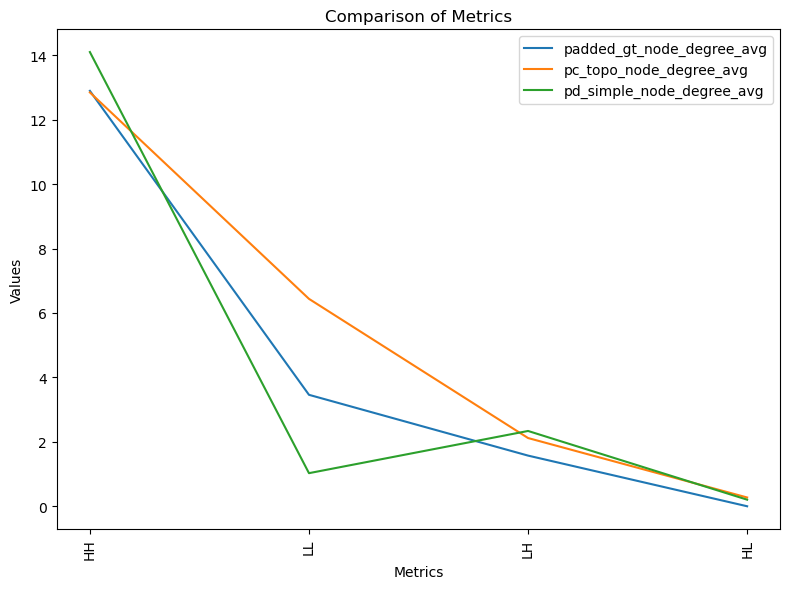

In [11]:

plt.figure(figsize=(8, 6))

for idx in total_agri_stat_p_degree.iloc[:,0:4].index:
    plt.plot(total_agri_stat_p_degree.iloc[:,0:4].columns, total_agri_stat_p_degree.iloc[:,0:4].loc[idx], label=idx)

plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Comparison of Metrics')
plt.legend()
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

## All

In [15]:

total_agri_stat_p_all = pd.concat([gtag_ress2_df_p, gtag_ress2_df, agri_ress2])
total_agri_stat_p_all = total_agri_stat_p_all.drop('padded_gt_escape_std')
total_agri_stat_p_all = total_agri_stat_p_all.drop('padded_gt_node_degree_std')
total_agri_stat_p_all = total_agri_stat_p_all.drop('gt_escape_std')
total_agri_stat_p_all = total_agri_stat_p_all.drop('gt_node_degree_std')
total_agri_stat_p_all

,HH,LL,LH,HL,Number of Components,Number of Cycles,Normalized # of Cycles_old,Normalized # of Cycles,Num of Cycles / Num of Nodes,Density,Clustering Coefficient,Number of Nodes with Degree 1,Number of Nodes with Degree > 1,Betweenness Centrality,Closeness Centrality,Assortativity,Modularity,fiedler_value,spectral_gap
padded_gt_escape_avg,19.496855,21.698113,0.000000,0.000000,1.000000,353.000000,0.664894,83.508209,1.110063,1.329286,0.231180,1.000000,317.000000,0.882640,33.460453,0.783558,0.631806,1.695733e+00,1.679551e+00
padded_gt_node_degree_avg,12.893082,3.459119,1.572327,0.000000,1.000000,353.000000,0.664894,83.508209,1.110063,1.329286,0.231180,1.000000,317.000000,0.882640,33.460453,0.783558,0.631806,1.695733e+00,1.679551e+00
gt_escape_avg,26.279863,17.406143,0.000000,0.000000,5.000000,263.000000,0.633816,69.687840,0.897611,1.288045,0.219925,12.000000,281.000000,0.247882,15.530561,0.657442,0.654486,-4.865755e-14,4.865755e-14
gt_node_degree_avg,17.064846,2.730375,2.047782,0.000000,5.000000,263.000000,0.633816,69.687840,0.897611,1.288045,0.219925,12.000000,281.000000,0.247882,15.530561,0.657442,0.654486,-4.865755e-14,4.865755e-14
pc_topo_escape_avg,21.751192,21.380603,0.000000,0.000000,1.000000,483.600000,0.322095,115.924994,1.073254,0.924284,0.268536,1.120000,449.180000,1.061480,39.554301,0.662166,0.659712,1.258561e+00,1.578199e+00
pc_topo_escape_std,2.684850,2.579760,0.000000,0.000000,0.000000,74.955497,0.054141,10.244046,0.150443,0.079903,0.022175,0.328261,24.774650,0.051845,2.469835,0.112921,0.019182,1.557495e-01,3.759307e-01
pd_simple_escape_avg,15.001921,7.537529,0.000000,0.000000,2.265306,357.816327,0.357264,93.437374,0.908363,0.971825,0.257392,40.061224,353.571429,0.978966,36.289237,0.589476,0.670639,4.682916e-01,8.017915e-01
pd_simple_escape_std,2.785736,3.568682,0.000000,0.000000,1.237866,49.098402,0.054603,8.243766,0.107294,0.072644,0.022252,5.706021,22.298169,0.058636,2.131460,0.118098,0.015703,6.298107e-01,7.208503e-01
pc_topo_node_degree_avg,12.844507,6.437393,2.117633,0.272517,1.020000,483.600000,0.322066,115.930083,1.073213,0.924219,0.268527,1.120000,449.180000,1.061395,39.552567,0.662166,0.659712,1.258561e+00,1.578199e+00
pc_topo_node_degree_std,2.428076,6.136913,1.342057,0.412553,0.141421,74.955497,0.054183,10.249828,0.150454,0.079997,0.022192,0.328261,24.774650,0.051839,2.467075,0.112921,0.019182,1.557495e-01,3.759307e-01


In [65]:
LISAS = total_agri_stat_p_all[['HH', 'LL', 'LH', 'HL']]


In [66]:
GSTATS = total_agri_stat_p_all.loc[:, ~total_agri_stat_p_all.columns.isin(['HH', 'LL', 'LH', 'HL'])]
GSTATS

,Number of Components,Number of Cycles,Normalized # of Cycles_old,Normalized # of Cycles,Num of Cycles / Num of Nodes,Density,Clustering Coefficient,Number of Nodes with Degree 1,Number of Nodes with Degree > 1,Betweenness Centrality,Closeness Centrality,Assortativity,Modularity,fiedler_value,spectral_gap
padded_gt_escape_avg,1.000000,353.000000,0.664894,83.508209,1.110063,1.329286,0.231180,1.000000,317.000000,0.882640,33.460453,0.783558,0.631806,1.695733e+00,1.679551e+00
padded_gt_node_degree_avg,1.000000,353.000000,0.664894,83.508209,1.110063,1.329286,0.231180,1.000000,317.000000,0.882640,33.460453,0.783558,0.631806,1.695733e+00,1.679551e+00
gt_escape_avg,5.000000,263.000000,0.633816,69.687840,0.897611,1.288045,0.219925,12.000000,281.000000,0.247882,15.530561,0.657442,0.654486,-4.865755e-14,4.865755e-14
gt_node_degree_avg,5.000000,263.000000,0.633816,69.687840,0.897611,1.288045,0.219925,12.000000,281.000000,0.247882,15.530561,0.657442,0.654486,-4.865755e-14,4.865755e-14
pc_topo_escape_avg,1.000000,483.600000,0.322095,115.924994,1.073254,0.924284,0.268536,1.120000,449.180000,1.061480,39.554301,0.662166,0.659712,1.258561e+00,1.578199e+00
pc_topo_escape_std,0.000000,74.955497,0.054141,10.244046,0.150443,0.079903,0.022175,0.328261,24.774650,0.051845,2.469835,0.112921,0.019182,1.557495e-01,3.759307e-01
pd_simple_escape_avg,2.265306,357.816327,0.357264,93.437374,0.908363,0.971825,0.257392,40.061224,353.571429,0.978966,36.289237,0.589476,0.670639,4.682916e-01,8.017915e-01
pd_simple_escape_std,1.237866,49.098402,0.054603,8.243766,0.107294,0.072644,0.022252,5.706021,22.298169,0.058636,2.131460,0.118098,0.015703,6.298107e-01,7.208503e-01
pc_topo_node_degree_avg,1.020000,483.600000,0.322066,115.930083,1.073213,0.924219,0.268527,1.120000,449.180000,1.061395,39.552567,0.662166,0.659712,1.258561e+00,1.578199e+00
pc_topo_node_degree_std,0.141421,74.955497,0.054183,10.249828,0.150454,0.079997,0.022192,0.328261,24.774650,0.051839,2.467075,0.112921,0.019182,1.557495e-01,3.759307e-01


In [70]:

GSTATS_nd = GSTATS[GSTATS.index.str.contains('node_degree')]
GSTATS_esc = GSTATS[GSTATS.index.str.contains('esca')]

GSTATS_nd

,Number of Components,Number of Cycles,Normalized # of Cycles_old,Normalized # of Cycles,Num of Cycles / Num of Nodes,Density,Clustering Coefficient,Number of Nodes with Degree 1,Number of Nodes with Degree > 1,Betweenness Centrality,Closeness Centrality,Assortativity,Modularity,fiedler_value,spectral_gap
padded_gt_node_degree_avg,1.000000,353.000000,0.664894,83.508209,1.110063,1.329286,0.231180,1.000000,317.000000,0.882640,33.460453,0.783558,0.631806,1.695733e+00,1.679551e+00
gt_node_degree_avg,5.000000,263.000000,0.633816,69.687840,0.897611,1.288045,0.219925,12.000000,281.000000,0.247882,15.530561,0.657442,0.654486,-4.865755e-14,4.865755e-14
pc_topo_node_degree_avg,1.020000,483.600000,0.322066,115.930083,1.073213,0.924219,0.268527,1.120000,449.180000,1.061395,39.552567,0.662166,0.659712,1.258561e+00,1.578199e+00
pc_topo_node_degree_std,0.141421,74.955497,0.054183,10.249828,0.150454,0.079997,0.022192,0.328261,24.774650,0.051839,2.467075,0.112921,0.019182,1.557495e-01,3.759307e-01
pd_simple_node_degree_avg,2.700000,357.700000,0.356912,93.491891,0.907897,0.970773,0.257584,39.940000,353.400000,0.975354,36.247151,0.588952,0.671096,4.589258e-01,7.857557e-01
pd_simple_node_degree_std,1.581139,48.601776,0.054559,8.147083,0.106579,0.072831,0.022343,5.712178,22.102729,0.058498,2.123487,0.116945,0.015875,6.268591e-01,7.224112e-01


In [71]:
GT_AG_DEG_LISA = pd.DataFrame(LISAS.loc['padded_gt_node_degree_avg', :]).transpose()
GT_AG_DEG_LISA

,HH,LL,LH,HL
padded_gt_node_degree_avg,12.893082,3.459119,1.572327,0.0


In [69]:
GT_AG_ESC_LISA = pd.DataFrame(LISAS.loc['padded_gt_escape_avg', :]).transpose()

,HH,LL,LH,HL
padded_gt_escape_avg,19.496855,21.698113,0.0,0.0


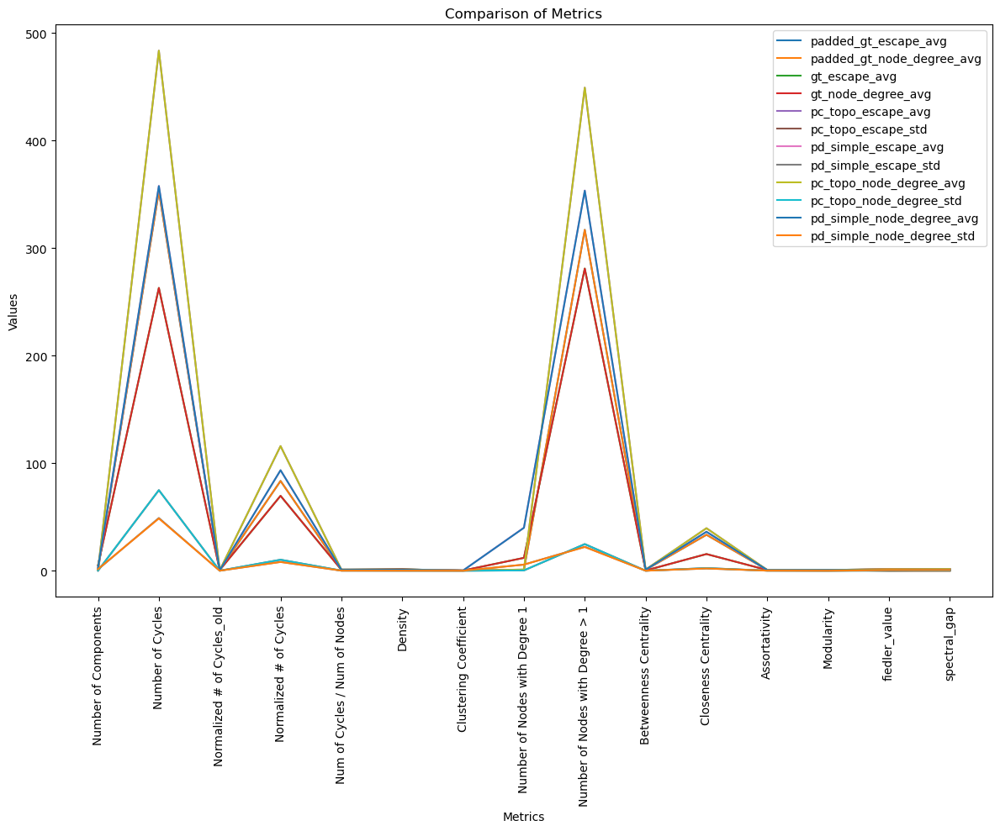

In [18]:
plt.figure(figsize=(12, 10))

for idx in GSTATS.index:
    plt.plot(GSTATS.columns, GSTATS.loc[idx], label=idx)

plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Comparison of Metrics')
plt.legend()
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

In [ ]:
p = "extreme_cases/graphs/dirty/graph"

## Filterred modes

In [192]:
# imageprocessing/GRAPH/other_cases/clover175x240_padded.pickle
!pwd


/mmfs1/home/jacks.local/mohsen.ahmadkhani/imageprocessing/GRAPH/other_cases


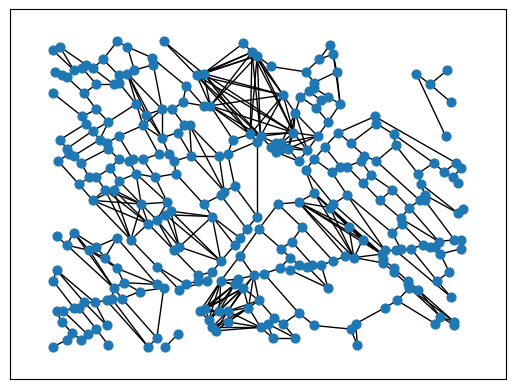

In [190]:
pg1 = '../clover175x240.pickle'
with open(pg1, 'rb') as f:
    G1, pos1 = pickle.load(f)

nx.draw_networkx(G1, pos=pos1, node_size=40,with_labels=False)

In [ ]:
c_topo = "../graphs/cleaned_topo/graph"
pc_topo = "../graphs/padded_cleaned_topo/graph"
d_simple = "../graphs/dirty_simple/graph"
pc_simple = "../graphs/padded_cleaned_simple/graph"
pd_topo = "../graphs/padded_dirty_topo/graph"
d_topo = "../graphs/dirty_topo/graph"
c_simple = "../graphs/cleaned_simple/graph"
pd_simple = "../graphs/padded_dirty_simple/graph"

# folds = {'c_topo':c_topo, 'pc_topo':pc_topo, 'd_simple':d_simple, 'pc_simple':pc_simple, 'pd_topo':pd_topo, 'd_topo':d_topo, 'c_simple':c_simple, 'pd_simple':pd_simple}
folds = {'c_topo':c_topo, 'pc_topo':pc_topo, 'd_simple':d_simple, 'pc_simple':pc_simple, 'pd_topo':pd_topo, 'd_topo':d_topo, 'c_simple':c_simple, 'pd_simple':pd_simple}
metrics = ['escape', 'node_degree']
agri_res = []
agri_res2 = []
for metric in metrics:
    for n, d in folds.items():
        print(n, metric)
        avg_std = mass_stats(graphs_dir=d, metric=metric)
        agri_res.append([n + '_' + metric, avg_std])
        
        avg_std2 = avg_std.transpose()
        avg_std2.index = [f"{n}_{metric}_{i}" for i in ['avg', 'std']]
        agri_res2.append(avg_std2)
        
agri_ress2 = pd.concat(agri_res2)


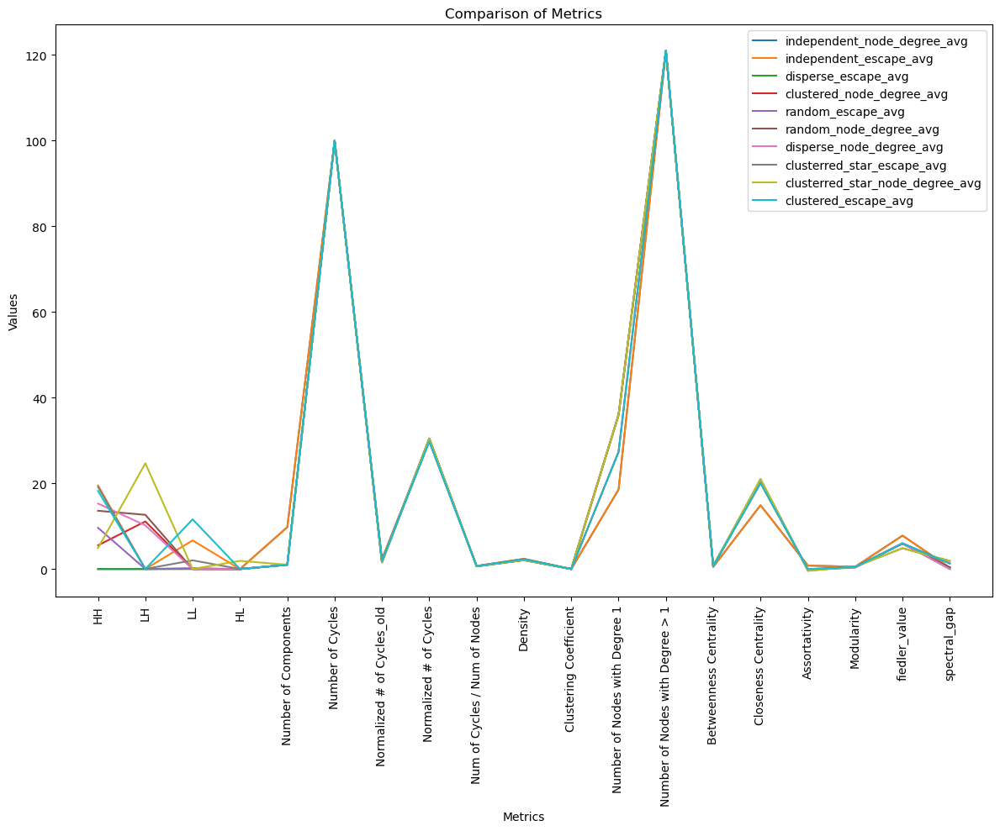

In [87]:

variable = pickle.load(open('data_and_list1000.pkl', 'rb'))
sourcedf = variable[0]

filtered_df = sourcedf[sourcedf.index.str.endswith('_avg')]
plt.figure(figsize=(12, 10))

for idx in filtered_df.index:
    plt.plot(filtered_df.columns, filtered_df.loc[idx], label=idx)

plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Comparison of Metrics')
plt.legend()
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()


In [14]:
fiv = {}
for el in ress:
    fiv.update({el[0]:el[1]})


NameError: name 'ress' is not defined

In [43]:
df_list = []
for key, df in fiv.items():
    df = df.reset_index()
    df['key'] = key
    df_list.append(df)

combined_df = pd.concat(df_list, ignore_index=True)
list(combined_df['key'].unique())

['random_escape',
 'random_node_degree',
 'disperse_escape',
 'disperse_node_degree',
 'clustered_escape',
 'clustered_node_degree',
 'clustered_star_escape',
 'clustered_star_node_degree',
 'independent_escape',
 'independent_node_degree']

In [44]:
combined_df[combined_df['key']=="independent_escape"]

,index,avg,std,key
152,HH,19.293500,1.380520e+00,independent_escape
153,LL,6.145452,6.720926e-01,independent_escape
154,LH,0.000000,0.000000e+00,independent_escape
155,HL,0.000000,0.000000e+00,independent_escape
156,Number of Components,10.000000,7.071068e-01,independent_escape
157,Number of Cycles,100.000000,0.000000e+00,independent_escape
158,Normalized # of Cycles_old,2.235348,6.826111e-02,independent_escape
159,Normalized # of Cycles,30.216864,2.145433e-01,independent_escape
160,Num of Cycles / Num of Nodes,0.714344,7.217290e-03,independent_escape
161,Density,2.364289,4.068116e-02,independent_escape


In [73]:
ress2_df


,HH,LH,LL,HL,Number of Components,Num of Cycles / Num of Nodes,Density,Clustering Coefficient,Betweenness Centrality,Closeness Centrality,Assortativity,Modularity,fiedler_value,spectral_gap
independent_node_degree_avg,0.000000e+00,0.000000e+00,0.241363,0.000000,9.745000,7.170582e-01,2.379857e+00,0.0,4.960105e-01,14.904368,0.800943,0.538067,7.798613e+00,3.027919e-01
independent_node_degree_std,0.000000e+00,0.000000e+00,1.491931,0.000000,1.037811,1.082973e-02,6.163494e-02,0.0,1.526791e-02,0.211538,0.013218,0.002594,3.145867e-14,2.125683e-13
independent_escape_avg,1.952966e+01,0.000000e+00,6.715274,0.000000,9.698000,7.175403e-01,2.382579e+00,0.0,4.966835e-01,14.913784,0.800409,0.537951,7.798613e+00,3.027919e-01
independent_escape_std,1.283991e+00,0.000000e+00,1.240600,0.000000,1.034343,1.076909e-02,6.122253e-02,0.0,1.516164e-02,0.210350,0.012948,0.002583,3.193534e-14,2.130749e-13
clustered_node_degree_avg,5.459522e+00,1.117819e+01,0.000000,0.000000,1.000000,6.744307e-01,2.265214e+00,0.0,6.656052e-01,20.095457,-0.026632,0.450222,6.019768e+00,1.251981e+00
clustered_node_degree_std,3.088754e+00,6.000834e+00,0.000000,0.000000,0.000000,1.505863e-02,7.178681e-02,0.0,1.701171e-02,0.649105,0.027011,0.038122,4.522601e-01,5.987084e-01
clustered_escape_avg,1.812040e+01,1.514625e-02,11.589409,0.000000,1.000000,6.742082e-01,2.264129e+00,0.0,6.666055e-01,20.075036,-0.025838,0.449832,5.982769e+00,1.296331e+00
clustered_escape_std,2.901748e+00,2.927942e-01,3.427250,0.000000,0.000000,1.448905e-02,6.895202e-02,0.0,1.652741e-02,0.637913,0.025809,0.036939,4.351999e-01,5.872438e-01
clustered_star_escape_avg,1.941656e+01,2.484076e-02,2.012102,0.000000,1.000000,6.369427e-01,2.090479e+00,0.0,6.731389e-01,21.060569,-0.401489,0.543514,4.885097e+00,1.892572e+00
clustered_star_escape_std,2.969374e+00,3.066009e-01,0.839571,0.000000,0.000000,1.110779e-16,4.443114e-16,0.0,2.943941e-02,0.823537,0.022242,0.030571,6.285765e-01,9.244087e-01


In [ ]:
import concurrent.futures
ress = []
ress2 = []

modes = ['random', 'dispersed', 'clustered', 'clustered_star', 'independent']#, 'split']
# metrics = ['Escape Distance', 'Node Degree']
metrics = ['escape', 'node_degree']

def process_mode_metric(mode, metric):
    avg_std = mass_stats(sample_size=1000, mode=mode, metric=metric)
    res = [mode + '_' + metric, avg_std]
    
    avg_std2 = avg_std.transpose()
    avg_std2.index = [f"{mode}_{metric}_{i}" for i in ['avg', 'std']]
    return res, avg_std2

# Using ProcessPoolExecutor for CPU-bound tasks
with concurrent.futures.ProcessPoolExecutor() as executor:
    futures = [executor.submit(process_mode_metric, mode, metric) for mode in modes for metric in metrics]
    for future in concurrent.futures.as_completed(futures):
        res, avg_std2 = future.result()
        ress.append(res)
        ress2.append(avg_std2)

ress
ress2_df = pd.concat(ress2)

In [10]:
ress2_df

,HH,LH,LL,HL,Number of Components,Number of Cycles,Normalized # of Cycles_old,Normalized # of Cycles,Num of Cycles / Num of Nodes,Density,Clustering Coefficient,Number of Nodes with Degree 1,Number of Nodes with Degree > 1,Betweenness Centrality,Closeness Centrality,Assortativity,Modularity,fiedler_value,spectral_gap
independent_node_degree_avg,0.000000e+00,0.000000e+00,0.182203,0.000000e+00,9.776000,100.0,2.258937e+00,30.147994,7.167320e-01,2.377992e+00,0.0,18.552000,121.0,4.955481e-01,14.897996,0.801370,0.538145,7.798613e+00,3.027919e-01
independent_node_degree_std,0.000000e+00,0.000000e+00,1.311509,0.000000e+00,1.016296,0.0,1.012257e-01,0.309751,1.053186e-02,5.975258e-02,0.0,2.032591,0.0,1.479036e-02,0.205709,0.012417,0.002534,5.505889e-14,1.148427e-13
independent_escape_avg,1.950817e+01,0.000000e+00,6.684828,0.000000e+00,9.796000,100.0,2.257146e+00,30.154003,7.165348e-01,2.376898e+00,0.0,18.592000,121.0,4.952788e-01,14.894146,0.801552,0.538194,7.798613e+00,3.027919e-01
independent_escape_std,1.254559e+00,0.000000e+00,1.186818,0.000000e+00,1.041859,0.0,1.043046e-01,0.317759,1.082262e-02,6.146886e-02,0.0,2.083717,0.0,1.521921e-02,0.211392,0.012916,0.002600,5.330388e-14,1.112905e-13
disperse_escape_avg,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,1.000000,100.0,1.580503e+00,30.468750,6.369427e-01,2.090479e+00,0.0,36.000000,121.0,7.001654e-01,20.347141,-0.165469,0.358292,6.007909e+00,2.470246e-13
disperse_escape_std,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.0,2.221557e-16,0.000000,1.110779e-16,4.443114e-16,0.0,0.000000,0.0,3.332336e-16,0.000000,0.000000,0.000000,1.777246e-15,0.000000e+00
clustered_node_degree_avg,5.536413e+00,1.111083e+01,0.000000,0.000000e+00,1.000000,100.0,1.880156e+00,29.783776,6.743140e-01,2.264630e+00,0.0,27.366000,121.0,6.662638e-01,20.080412,-0.026708,0.449426,5.989481e+00,1.299326e+00
clustered_node_degree_std,3.034733e+00,5.934574e+00,0.000000,0.000000e+00,0.000000,0.0,1.253852e-01,0.258598,1.452152e-02,6.911492e-02,0.0,3.121825,0.0,1.679585e-02,0.641021,0.025682,0.038556,4.501608e-01,6.015703e-01
random_escape_avg,9.626752e+00,0.000000e+00,0.045860,0.000000e+00,1.000000,100.0,1.580503e+00,30.468750,6.369427e-01,2.090479e+00,0.0,36.000000,121.0,6.859410e-01,20.694873,-0.166945,0.480574,5.925423e+00,3.952982e-01
random_escape_std,3.321777e+00,0.000000e+00,0.192043,0.000000e+00,0.000000,0.0,2.221557e-16,0.000000,1.110779e-16,4.443114e-16,0.0,0.000000,0.0,7.412080e-03,0.194839,0.017328,0.033115,1.475817e-01,2.244553e-01


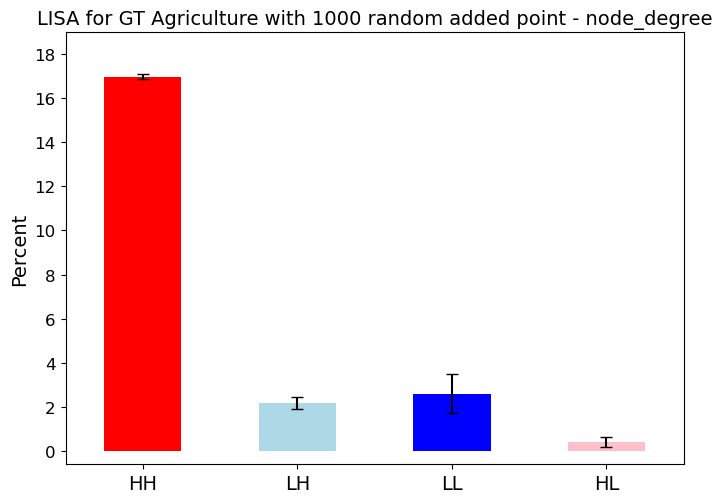

,avg,std
q,,
HH,16.967347,0.132039
LH,2.186395,0.274536
LL,2.608503,0.875946
HL,0.412245,0.221867


In [3]:

randres = mass_stats_gt(sample_size = 1000, metric='node_degree')

randres


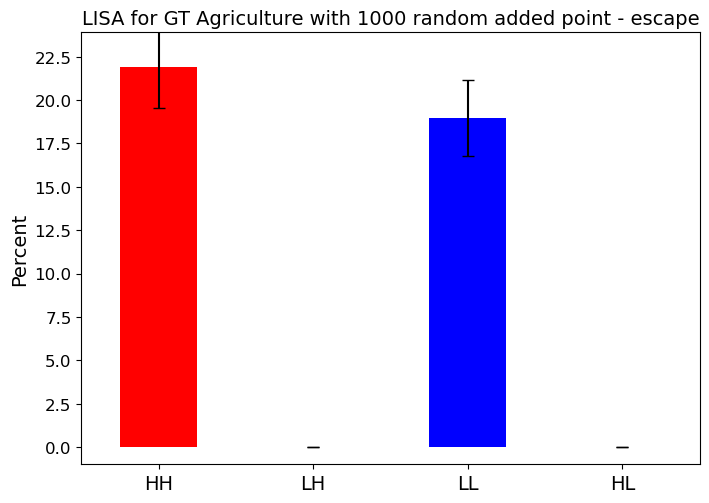

,avg,std
q,,
HH,21.904762,2.341208
LL,18.945578,2.187063
LH,0.000000,0.000000
HL,0.000000,0.000000


In [57]:
randres_esc = mass_stats_gt(sample_size = 100, metric='escape')

randres_esc

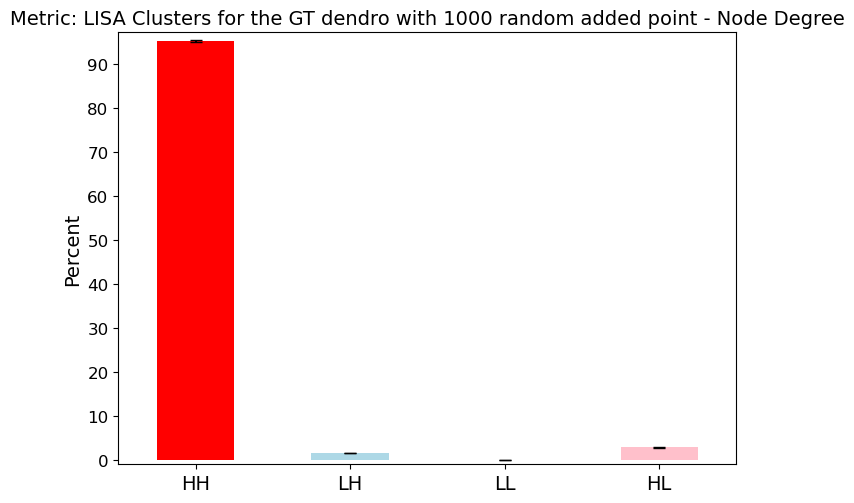

In [22]:
df = randres.copy()
df = df.reindex(['HH', 'LH', 'LL', 'HL'])
fig, ax = plt.subplots(figsize=(8, 6))
fig.tight_layout(pad=5.0)

average_values = df['avg']
std_dev_values = df['std']
average_values.plot(kind='bar', yerr=std_dev_values, capsize=4, color=['red', 'lightblue', 'blue', 'pink'], ax=ax)

ax.set_title('Metric: LISA Clusters for the GT dendro with 1000 random added point - Node Degree', fontsize=14)
ax.set_xlabel('')
ax.set_ylabel('Percent', fontsize=14)
ax.set_ylim(df['avg'].min() - 1, df['avg'].max() + 2)
ax.yaxis.set_major_locator(plt.MaxNLocator(nbins=10))
ax.tick_params(axis='x', labelsize=14, rotation=0)
ax.tick_params(axis='y', labelsize=12, rotation=0)

plt.show()

In [4]:
# modes = ['random', 'dispersed', 'clustered', 'clustered_star', 'independent']
# modes = ['independent']
metrics = ['escape']#, 'node_degree']
ress = []
for mode in modes:
    for metric in metrics:
        avg_std = mass_stats(sample_size = 1000, mode = mode, metric = metric)
        ress.append([mode + '_' + metric, avg_std])
        # plt.show()


In [5]:
ress

[['random_escape',
           avg       std
  q                     
  HH  9.911465  3.393576
  LH  0.000000  0.000000
  LL  0.042038  0.186495
  HL  0.000000  0.000000],
 ['disperse_escape',
      avg  std
  q           
  HH  0.0  0.0
  LH  0.0  0.0
  LL  0.0  0.0
  HL  0.0  0.0],
 ['clustered_escape',
            avg       std
  q                      
  HH  18.248843  2.811128
  LL  11.485810  3.594525
  LH   0.014553  0.243733
  HL   0.000000  0.000000],
 ['clusterred_star_escape',
            avg       std
  q                      
  HH  19.242675  2.889998
  LL   2.033758  0.914143
  LH   0.027389  0.298325
  HL   0.000000  0.000000],
 ['split_escape',
            avg       std
  q                      
  HH  10.364315  3.338544
  LL   0.129067  1.101814
  LH   0.069132  1.096951
  HL   0.000000  0.000000],
 ['independent_escape',
            avg       std
  q                      
  HH  19.486924  1.226174
  LL   6.780764  1.278328
  LH   0.000000  0.000000
  HL   0.000000  0.0

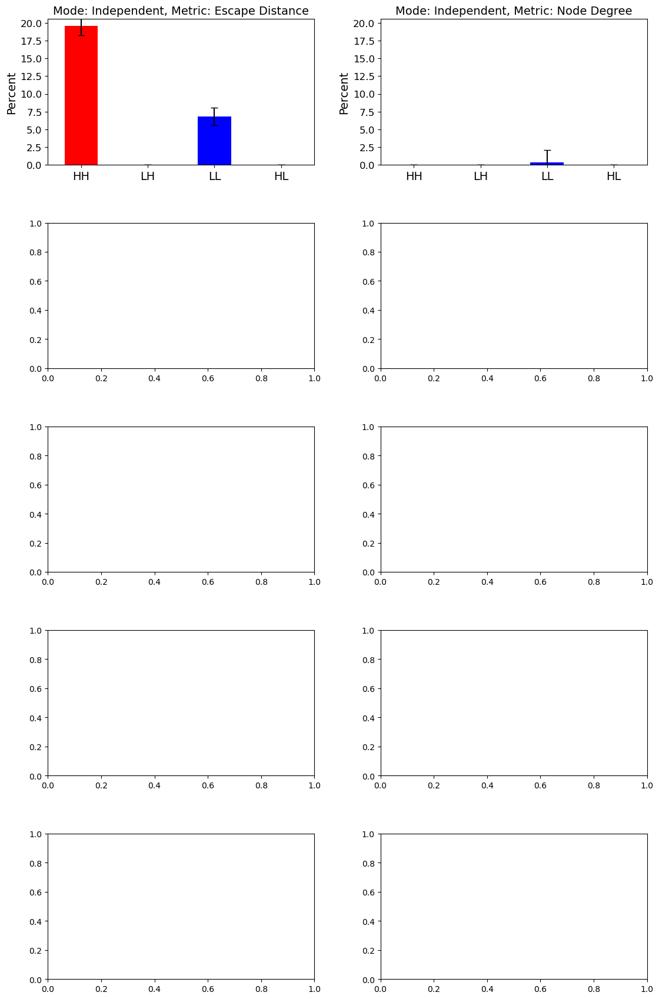

In [4]:
fig, axs = plt.subplots(5, 2, figsize=(12, 18))
fig.tight_layout(pad=5.0)

all_values = pd.concat([series['avg'] for _, series in ress])
y_min, y_max = all_values.min(), all_values.max() + 1

for i, (name, series) in enumerate(ress):
    ax = axs[i // 2, i % 2]
    series = series.reindex(['HH', 'LH', 'LL', 'HL'])
    average_values = series['avg']
    std_dev_values = series['std']
    average_values.plot(kind='bar', yerr=std_dev_values, capsize=4, color=['red', 'lightblue', 'blue', 'pink'], ax=ax)
    if name.split('_')[-1] == 'escape':
        ttl = f"Mode: {name.split('_')[0].capitalize()}, Metric: Escape Distance"
    else:
        ttl = f"Mode: {name.split('_')[0].capitalize()}, Metric: Node Degree"
        
    ax.set_title(ttl, fontsize=14)
    ax.set_xlabel('')
    ax.set_ylabel('Percent', fontsize=14)
    ax.set_ylim(float(y_min), float(y_max))
    ax.yaxis.set_major_locator(plt.MaxNLocator(nbins=10))
    ax.tick_params(axis='x', labelsize=14, rotation=0)
    ax.tick_params(axis='y', labelsize=12, rotation=0)

plt.show()


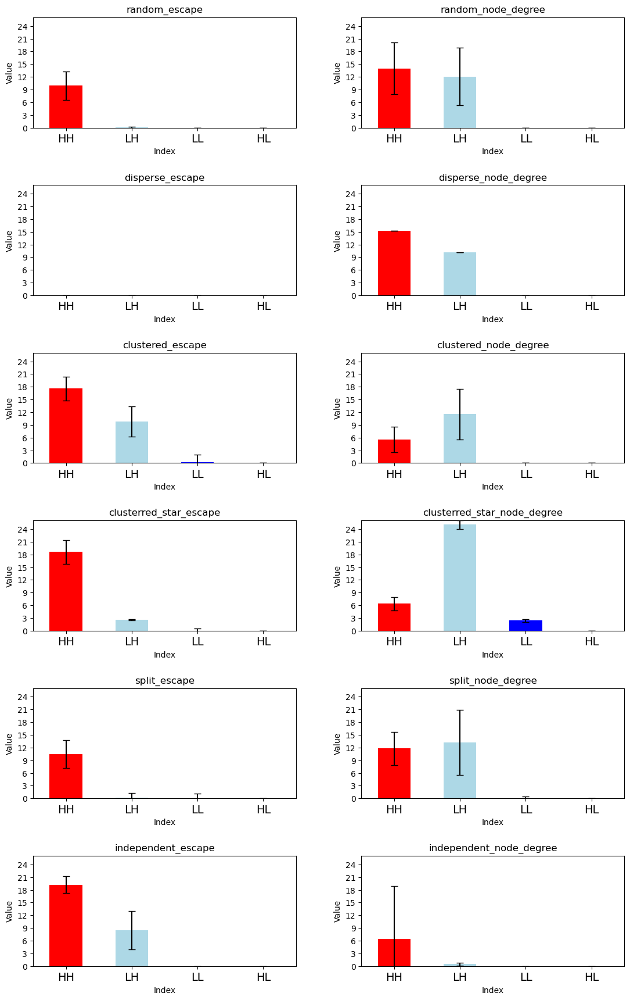

In [100]:
for name, series in ress:
    series.index = ['HH', 'LH', 'LL', 'HL']

fig, axs = plt.subplots(6, 2, figsize=(12, 18))
fig.tight_layout(pad=5.0)

all_values = pd.concat([series['avg'] for _, series in ress])
y_min, y_max = all_values.min(), all_values.max() + 1

for i, (name, series) in enumerate(ress):
    ax = axs[i // 2, i % 2]
    average_values = series['avg']
    std_dev_values = series['std']
    average_values.plot(kind='bar', yerr=std_dev_values, capsize=4, color=['red', 'lightblue', 'blue', 'pink'], ax=ax)
    ax.set_title(name)
    ax.set_xlabel('Index')
    ax.set_ylabel('Value')
    ax.set_ylim(float(y_min), float(y_max))  # Ensure y_min and y_max are float
    ax.yaxis.set_major_locator(plt.MaxNLocator(nbins=10))
    ax.tick_params(axis='x', labelsize=14, rotation=0)

plt.show()


In [6]:
pdir = "/mmfs1/home/jacks.local/mohsen.ahmadkhani/imageprocessing/GRAPH/other_cases/extreme_cases/graphs/dirty/graph/"
res_df = lisa_aggr(pdir, mode='escape_distance')
res_df

/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 26 disconnected components.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)


unsupported operand type(s) for +: 'NoneType' and 'NoneType'
('WARNING: ', 168, ' is an island (no neighbors)')
unsupported operand type(s) for +: 'int' and 'NoneType'
unsupported operand type(s) for +: 'NoneType' and 'NoneType'
unsupported operand type(s) for +: 'NoneType' and 'NoneType'


/tmp/ipykernel_3827872/3118748641.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = results_df._append(dfff_p.transpose())
/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 26 disconnected components.
 There is 1 island with id: 168.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)
/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)


,HH,LH,LL,HL
0,26.923077,0.0,0.000000,0.0
1,26.000000,0.0,14.666667,0.0
2,13.592233,0.0,14.563107,0.0
3,14.371257,0.0,0.000000,0.0
4,7.843137,0.0,6.535948,0.0
5,17.567568,0.0,13.513514,0.0


In [82]:
import networkx as nx
import matplotlib.pyplot as plt
from tabulate import tabulate
import math
import collections

def max_cycles3_count(n):
    return math.factorial(n) / (math.factorial(n-3) * math.factorial(3))
def normalized_closeness_centrality(G):
    N = len(G)
    closeness_centrality = nx.closeness_centrality(G)
    normalized_centrality = {node: (N-1) * centrality for node, centrality in closeness_centrality.items()}
    return normalized_centrality

def average_harmonic_centrality(G):
    harmonic_centrality_values = nx.harmonic_centrality(G)
    return sum(harmonic_centrality_values.values()) / len(harmonic_centrality_values)

def cl_cn(G):
    closeness_centrality = nx.closeness_centrality(G)
    normalized_closeness_centrality = {}
    n = len(G)
    for node in G.nodes:
        sum_of_distances = sum(nx.shortest_path_length(G, source=node).values())
        if sum_of_distances > 0:  # Avoid division by zero
            normalized_closeness_centrality[node] = (n-1) / sum_of_distances
        else:
            normalized_closeness_centrality[node] = 0
    return normalized_closeness_centrality
        
# Function to calculate metrics
def calculate_metrics(G):
    # Basic metrics
    cycles = list(nx.cycle_basis(G))
    density = nx.density(G)
    normalized_cycles = len(cycles) / (G.number_of_nodes() * density) if density > 0 else 0
    
    path_length = nx.average_shortest_path_length(G) if nx.is_connected(G) else float('inf')
    clustering_coeff = nx.average_clustering(G)
    degree_counts = nx.degree_histogram(G)
    num_degree_0 = degree_counts[0] if len(degree_counts) > 0 else 0
    num_degree_1 = degree_counts[1] if len(degree_counts) > 1 else 0
    num_degree_greater_than_1 = sum(degree_counts[2:]) if len(degree_counts) > 2 else 0
    num_components = nx.number_connected_components(G)
    
    # Centrality measures
    betweenness = nx.betweenness_centrality(G)
    closeness = nx.closeness_centrality(G)
    # eigenvector = nx.eigenvector_centrality(G, max_iter=1000)
    
    # Additional metrics
    network_diameter = nx.diameter(G) if nx.is_connected(G) else float('inf')
    assortativity = nx.degree_assortativity_coefficient(G)
    modularity = nx.algorithms.community.modularity(G, nx.algorithms.community.label_propagation_communities(G))

    L = nx.laplacian_matrix(G).astype(float)
    eigenvalues = np.linalg.eigvalsh(L.A)
    eigenvalues.sort()
    zero_eigenvalues = np.count_nonzero(eigenvalues == 0)
    if zero_eigenvalues < len(eigenvalues) - 1:
        fiedler_value = eigenvalues[zero_eigenvalues + 1]
        spectral_gap = eigenvalues[zero_eigenvalues + 2] - fiedler_value
    else:
        fiedler_value = 0
        spectral_gap = 0

    return pd.DataFrame({
        "Number of Components": [num_components],
        "Number of Cycles": [len(cycles)],
        "Normalized # of Cycles_old": [10000 * len(cycles) / max_cycles3_count(G.number_of_nodes())],
        "Normalized # of Cycles": [normalized_cycles],
        "Num of Cycles / Num of Nodes": [len(cycles) / G.number_of_nodes()] ,
        "Density": [100*density], # Density = 2 x # of Edges/((# of nodes)x(# of nodes -1))
        # "Average Path Length": path_length,
        "Clustering Coefficient": [clustering_coeff],
        # "Number of Nodes with Degree 0": num_degree_0,
        "Number of Nodes with Degree 1": [num_degree_1],
        "Number of Nodes with Degree > 1": [num_degree_greater_than_1],
        "Betweenness Centrality": [sum(betweenness.values())/10],
        "Closeness Centrality": [(sum(nx.closeness_centrality(G).values()))],
        # "Closeness Centrality": np.average(list(cl_cn(G).values())), #/G.number_of_nodes(),
        # "Closeness Centrality": average_harmonic_centrality(G),
        # "Eigenvector Centrality": sum(eigenvector.values()),
        # "Network Diameter": network_diameter,
        "Assortativity": [assortativity],
        "Modularity": [modularity],
        "fiedler_value": [fiedler_value*100],
        "spectral_gap": [spectral_gap*100],
        # "Smallest Laplacian Eigenvalue": min(laplacian_spectrum)
    })





In [92]:
modes = ['random', 'dispersed', 'clustered', 'clustered_star', 'split', 'independent']
metrics = ['Escape Distance', 'Node Degree']

def mass_conventional_stats(sample_size, mode):
    G_rand = []
    lisa_l = []
    for i in range(sample_size):
        G, pos = make_graph(num_new_nodes=36, mode=mode, plot=False)
        G_rand.append([G, pos])
    all_metrics = pd.DataFrame()
    for gl in G_rand:
        G = gl[0]
        metrics = calculate_metrics(G)
        all_metrics = pd.concat([all_metrics, metrics], ignore_index=True)
    return all_metrics.mean().to_frame().T
    

In [95]:
# all_modes = pd.DataFrame()
# for mode in modes:
#     all_metrics = mass_conventional_stats(sample_size=1000, mode=mode)
#     all_modes = pd.concat([all_modes, all_metrics], ignore_index=True)

all_modes.round(3)

,Number of Components,Number of Cycles,Normalized # of Cycles_old,Normalized # of Cycles,Num of Cycles / Num of Nodes,Density,Clustering Coefficient,Number of Nodes with Degree 1,Number of Nodes with Degree > 1,Betweenness Centrality,Closeness Centrality,Assortativity,Modularity,fiedler_value,spectral_gap
0,1.000,100.000,1.581,30.469,0.637,2.090,0.0,36.000,121.000,0.686,20.692,-0.166,0.478,5.919,0.410
1,1.000,100.000,1.581,30.469,0.637,2.090,0.0,36.000,121.000,0.700,20.347,-0.165,0.358,6.008,0.000
2,1.000,100.000,1.881,29.782,0.674,2.265,0.0,27.353,121.000,0.666,20.092,-0.026,0.450,6.010,1.265
3,1.000,100.000,1.581,30.469,0.637,2.090,0.0,36.000,121.000,0.673,21.068,-0.402,0.543,4.922,1.834
4,1.355,64.355,0.688,23.659,0.360,1.522,0.0,58.075,120.714,0.746,21.480,0.110,0.442,2.078,1.258
5,9.779,100.000,2.258,30.149,0.717,2.378,0.0,18.558,121.000,0.495,14.897,0.801,0.538,7.799,0.303


In [91]:
all_metrics.mean().to_frame().T


,Number of Components,Number of Cycles,Normalized # of Cycles_old,Normalized # of Cycles,Num of Cycles / Num of Nodes,Density,Clustering Coefficient,Number of Nodes with Degree 1,Number of Nodes with Degree > 1,Betweenness Centrality,Closeness Centrality,Assortativity,Modularity,fiedler_value,spectral_gap
0,1.0,100.0,1.580503,30.46875,0.636943,2.090479,0.0,36.0,121.0,0.686915,20.662072,-0.167643,0.468976,5.910709,0.355569


In [60]:
import pickle
import networkx as nx
# pg = 'graphs/padded_dirty_topo/graph/31_m.pickle'
pg1 = 'clover175x240_padded.pickle'
pg2 = '../disconnected_clover.pickle'
pg3 = '../disconnected_clover2.pickle'
pg4 = '../disconnected_clover4.pickle'
# pg3 = 'disconnected_clover33.pickle'
with open(pg1, 'rb') as f:
    G1, pos1 = pickle.load(f)

with open(pg2, 'rb') as f:
    G2, pos2 = pickle.load(f)

with open(pg3, 'rb') as f:
    G3, pos3 = pickle.load(f)

with open(pg4, 'rb') as f:
    G4, pos4 = pickle.load(f)
# nx.draw(G, pos, with_labels=False, node_color='skyblue', node_size=50, edge_color='k')



Metric                                   G1          G2             G3             G4
-------------------------------  ----------  ----------  -------------  -------------
Number of Components               1           1           3              6
Number of Cycles                 353         335         287            240
Normalized # of Cycles_old         0.671226    0.430816    0.2773         0.223322
Normalized # of Cycles            83.3692     86.7626     83.4449        75.6604
Num of Cycles / Num of Nodes       1.11356     0.927978    0.722922       0.597015
Density                            1.3357      1.06956     0.866346       0.789072
Clustering Coefficient             0.231909    0.23842     0.221652       0.203593
Number of Nodes with Degree 0      0           0           0              0
Number of Nodes with Degree 1      0          39          84            118
Number of Nodes with Degree > 1  317         322         313            284
Betweenness Centrality             

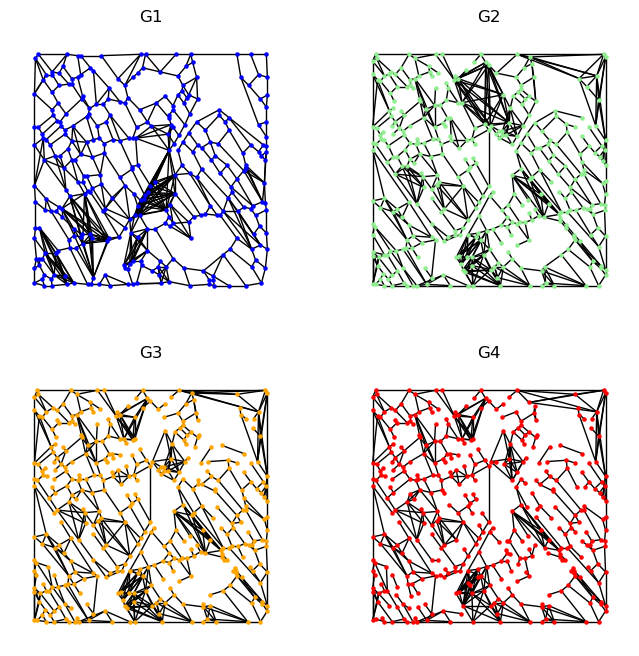

In [61]:
import networkx as nx
import matplotlib.pyplot as plt
from tabulate import tabulate
import math
import collections

def max_cycles3_count(n):
    return math.factorial(n) / (math.factorial(n-3) * math.factorial(3))
def normalized_closeness_centrality(G):
    N = len(G)
    closeness_centrality = nx.closeness_centrality(G)
    normalized_centrality = {node: (N-1) * centrality for node, centrality in closeness_centrality.items()}
    return normalized_centrality

def average_harmonic_centrality(G):
    harmonic_centrality_values = nx.harmonic_centrality(G)
    return sum(harmonic_centrality_values.values()) / len(harmonic_centrality_values)

def cl_cn(G):
    closeness_centrality = nx.closeness_centrality(G)
    normalized_closeness_centrality = {}
    n = len(G)
    for node in G.nodes:
        sum_of_distances = sum(nx.shortest_path_length(G, source=node).values())
        if sum_of_distances > 0:  # Avoid division by zero
            normalized_closeness_centrality[node] = (n-1) / sum_of_distances
        else:
            normalized_closeness_centrality[node] = 0
    return normalized_closeness_centrality
        
# Function to calculate metrics
def calculate_metrics(G):
    # Basic metrics
    cycles = list(nx.cycle_basis(G))
    density = nx.density(G)
    normalized_cycles = len(cycles) / (G.number_of_nodes() * density) if density > 0 else 0
    
    path_length = nx.average_shortest_path_length(G) if nx.is_connected(G) else float('inf')
    clustering_coeff = nx.average_clustering(G)
    degree_counts = nx.degree_histogram(G)
    num_degree_0 = degree_counts[0] if len(degree_counts) > 0 else 0
    num_degree_1 = degree_counts[1] if len(degree_counts) > 1 else 0
    num_degree_greater_than_1 = sum(degree_counts[2:]) if len(degree_counts) > 2 else 0
    num_components = nx.number_connected_components(G)
    
    # Centrality measures
    betweenness = nx.betweenness_centrality(G)
    closeness = nx.closeness_centrality(G)
    # eigenvector = nx.eigenvector_centrality(G, max_iter=1000)
    
    # Additional metrics
    network_diameter = nx.diameter(G) if nx.is_connected(G) else float('inf')
    assortativity = nx.degree_assortativity_coefficient(G)
    modularity = nx.algorithms.community.modularity(G, nx.algorithms.community.label_propagation_communities(G))

    L = nx.laplacian_matrix(G).astype(float)
    eigenvalues = np.linalg.eigvalsh(L.A)
    eigenvalues.sort()
    zero_eigenvalues = np.count_nonzero(eigenvalues == 0)
    if zero_eigenvalues < len(eigenvalues) - 1:
        fiedler_value = eigenvalues[zero_eigenvalues + 1]
        spectral_gap = eigenvalues[zero_eigenvalues + 2] - fiedler_value
    else:
        fiedler_value = 0
        spectral_gap = 0

    return {
        "Number of Components": num_components,
        "Number of Cycles": len(cycles),
        "Normalized # of Cycles_old": 10000 * len(cycles) / max_cycles3_count(G.number_of_nodes()),
        "Normalized # of Cycles": normalized_cycles,
        "Num of Cycles / Num of Nodes": len(cycles) / G.number_of_nodes() ,
        "Density": 100*density, # Density = 2 x # of Edges/((# of nodes)x(# of nodes -1))
        # "Average Path Length": path_length,
        "Clustering Coefficient": clustering_coeff,
        "Number of Nodes with Degree 0": num_degree_0,
        "Number of Nodes with Degree 1": num_degree_1,
        "Number of Nodes with Degree > 1": num_degree_greater_than_1,
        "Betweenness Centrality": sum(betweenness.values())/10,
        "Closeness Centrality": (sum(nx.closeness_centrality(G).values())),
        # "Closeness Centrality": np.average(list(cl_cn(G).values())), #/G.number_of_nodes(),
        # "Closeness Centrality": average_harmonic_centrality(G),
        # "Eigenvector Centrality": sum(eigenvector.values()),
        # "Network Diameter": network_diameter,
        "Assortativity": assortativity,
        "Modularity": modularity,
        "fiedler_value": fiedler_value*100,
        "spectral_gap": spectral_gap*100,
        # "Smallest Laplacian Eigenvalue": min(laplacian_spectrum)
    }


metrics_g1 = calculate_metrics(G1)
metrics_g2 = calculate_metrics(G2)
metrics_g3 = calculate_metrics(G3)
metrics_g4 = calculate_metrics(G4)

# Printing the results in a table format
headers = ["Metric", "G1", "G2", "G3", "G4"]
table_data = []

for key in metrics_g1.keys():
    table_data.append([key, metrics_g1[key], metrics_g2[key], metrics_g3[key], metrics_g4[key]])

print(tabulate(table_data, headers=headers))

plt.figure(figsize=(8,8))
plt.subplot(221)
nx.draw(G1, pos1, with_labels=False, node_color='blue', node_size=5, edge_color='k')
plt.title('G1')

plt.subplot(222)
nx.draw(G2, pos2, with_labels=False, node_color='lightgreen', node_size=5, edge_color='k')
plt.title('G2')

plt.subplot(223)
nx.draw(G3, pos3, with_labels=False, node_color='orange', node_size=5, edge_color='k')
plt.title('G3')

plt.subplot(224)
nx.draw(G4, pos4, with_labels=False, node_color='red', node_size=5, edge_color='k')
plt.title('G4')
plt.show()


In [10]:
# pd.DataFrame([metrics_g1, metrics_g2, metrics_g3])
t1 = "graphs/padded_cleaned_topo/graph/"
t2 = "graphs/padded_dirty_topo/graph/"
s1 = "graphs/padded_dirty_simple/graph/"
res_df_list = []
# dirs = ['graphs/padded_dirty_simple/graph/', 'graphs/padded_cleaned_topo/graph/']
dirs = [s1, t1, t2]
for root_p in dirs:
    results = []
    for g in os.listdir(root_p):
        if not g.startswith('.'):
            with open(root_p+g, 'rb') as f:
                G, pos = pickle.load(f)
            Gl = add_node0(G, pos)
            metrics = calculate_metrics(Gl[0])
            results.append(metrics)
            
    res_df_tp = pd.DataFrame(results)
    res_df_list.append(res_df_tp.describe().iloc[1:2, :])

res_df_list

/tmp/ipykernel_2952004/1433871901.py:57: VisibleDeprecationWarning: `.A` is deprecated and will be removed in v1.14.0. Use `.toarray()` instead.
  eigenvalues = np.linalg.eigvalsh(L.A)
/tmp/ipykernel_2952004/1433871901.py:57: VisibleDeprecationWarning: `.A` is deprecated and will be removed in v1.14.0. Use `.toarray()` instead.
  eigenvalues = np.linalg.eigvalsh(L.A)
/tmp/ipykernel_2952004/1433871901.py:57: VisibleDeprecationWarning: `.A` is deprecated and will be removed in v1.14.0. Use `.toarray()` instead.
  eigenvalues = np.linalg.eigvalsh(L.A)


[      Number of Components  Number of Cycles  Normalized # of Cycles_old  \
 mean                   1.1            115.06                    0.384225   
 
       Normalized # of Cycles  Num of Cycles / Num of Nodes   Density  \
 mean               39.972222                       0.43698  1.093731   
 
       Clustering Coefficient  Number of Nodes with Degree 0  \
 mean                 0.04432                            0.0   
 
       Number of Nodes with Degree 1  Number of Nodes with Degree > 1  \
 mean                          22.02                            241.4   
 
       Betweenness Centrality  Closeness Centrality  Assortativity  Modularity  \
 mean                1.029294             23.760408        0.13735    0.468428   
 
       fiedler_value  spectral_gap  
 mean       1.621904      1.117937  ,
       Number of Components  Number of Cycles  Normalized # of Cycles_old  \
 mean                   1.0            155.52                    0.659354   
 
       Normalized # o

In [11]:
pd.DataFrame([calculate_metrics(Gl1[0])])

/tmp/ipykernel_2952004/1433871901.py:57: VisibleDeprecationWarning: `.A` is deprecated and will be removed in v1.14.0. Use `.toarray()` instead.
  eigenvalues = np.linalg.eigvalsh(L.A)


,Number of Components,Number of Cycles,Normalized # of Cycles_old,Normalized # of Cycles,Num of Cycles / Num of Nodes,Density,Clustering Coefficient,Number of Nodes with Degree 0,Number of Nodes with Degree 1,Number of Nodes with Degree > 1,Betweenness Centrality,Closeness Centrality,Assortativity,Modularity,fiedler_value,spectral_gap
0,1,122,0.503905,40.666667,0.497959,1.22449,0.022449,0,1,244,1.01723,22.45456,-0.222222,0.41729,1.913336,1.449132


In [30]:
res_df_list[0]

,Number of Components,Number of Cycles,Normalized # of Cycles_old,Normalized # of Cycles,Num of Cycles / Num of Nodes,Density,Clustering Coefficient,Number of Nodes with Degree 0,Number of Nodes with Degree 1,Number of Nodes with Degree > 1,Betweenness Centrality,Closeness Centrality,Assortativity,Modularity,fiedler_value,spectral_gap
mean,1.4,1291.32,90.693705,44.709271,13.348144,30.176216,0.77413,0.02,6.28,91.72,0.115332,48.588825,0.520955,0.142349,39.245024,23.188664


In [31]:
res_df_list[1]

,Number of Components,Number of Cycles,Normalized # of Cycles_old,Normalized # of Cycles,Num of Cycles / Num of Nodes,Density,Clustering Coefficient,Number of Nodes with Degree 0,Number of Nodes with Degree 1,Number of Nodes with Degree > 1,Betweenness Centrality,Closeness Centrality,Assortativity,Modularity,fiedler_value,spectral_gap
mean,1.0,155.52,0.659354,47.341022,0.639043,1.351156,0.09391,0.0,1.12,242.42,0.886519,25.043283,0.528822,0.507044,2.453662,1.836216


In [32]:
res_df_list[2]

,Number of Components,Number of Cycles,Normalized # of Cycles_old,Normalized # of Cycles,Num of Cycles / Num of Nodes,Density,Clustering Coefficient,Number of Nodes with Degree 0,Number of Nodes with Degree 1,Number of Nodes with Degree > 1,Betweenness Centrality,Closeness Centrality,Assortativity,Modularity,fiedler_value,spectral_gap
mean,1.0,155.92,0.621291,47.795949,0.627697,1.314309,0.092376,0.0,6.08,242.52,0.891776,25.43162,0.521931,0.508825,2.396478,1.801908


/tmp/ipykernel_2952004/1433871901.py:57: VisibleDeprecationWarning: `.A` is deprecated and will be removed in v1.14.0. Use `.toarray()` instead.
  eigenvalues = np.linalg.eigvalsh(L.A)


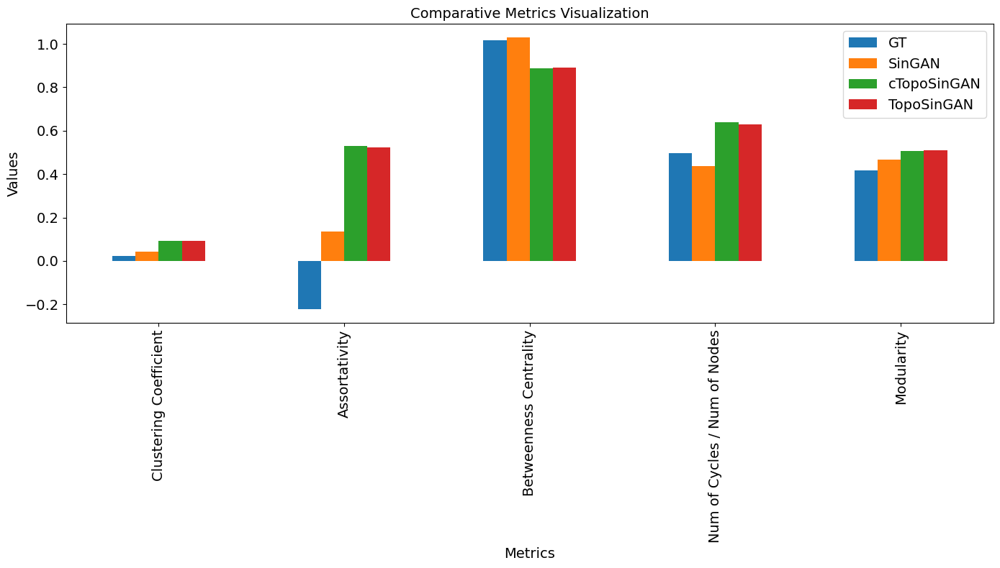

In [12]:


df_concat = pd.concat([pd.DataFrame([calculate_metrics(Gl1[0])]), res_df_list[0], 
                       res_df_list[1], res_df_list[2]], keys=['GT', 'SinGAN', 'cTopoSinGAN', 'TopoSinGAN'])

df_concat = df_concat[["Number of Components" ,"Number of Cycles","Number of Nodes with Degree 0",
                       "Number of Nodes with Degree > 1" ,"Number of Nodes with Degree 1" , "Normalized # of Cycles", 
                       "Closeness Centrality", "Clustering Coefficient" ,"Assortativity", "Betweenness Centrality",
                       "Num of Cycles / Num of Nodes","Modularity", "fiedler_value", "spectral_gap"]]
           
# Plotting
ax = df_concat.iloc[:,7:-2].T.plot(kind='bar', figsize=(14, 8), fontsize=14)

# Set titles and labels
plt.title('Comparative Metrics Visualization', fontsize=14)
plt.ylabel('Values', fontsize=14)
plt.xlabel('Metrics', fontsize=14)
plt.xticks(rotation=90)

# Customize legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, ['GT', 'SinGAN', 'cTopoSinGAN', 'TopoSinGAN'], fontsize=14)

plt.tight_layout()
plt.show()


In [240]:
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity


similarity_matrix = cosine_similarity(df_concat.iloc[:,7:-2])
similarity_to_first_row = similarity_matrix[0, 1:]  # Similarity of second and third rows to the first row

print(f"Similarity score of the second row to the first row: {similarity_to_first_row[0]}")
print(f"Similarity score of the third row to the first row: {similarity_to_first_row[1]}")


Similarity score of the second row to the first row: 0.9970131518715051
Similarity score of the third row to the first row: 0.9996582690962553


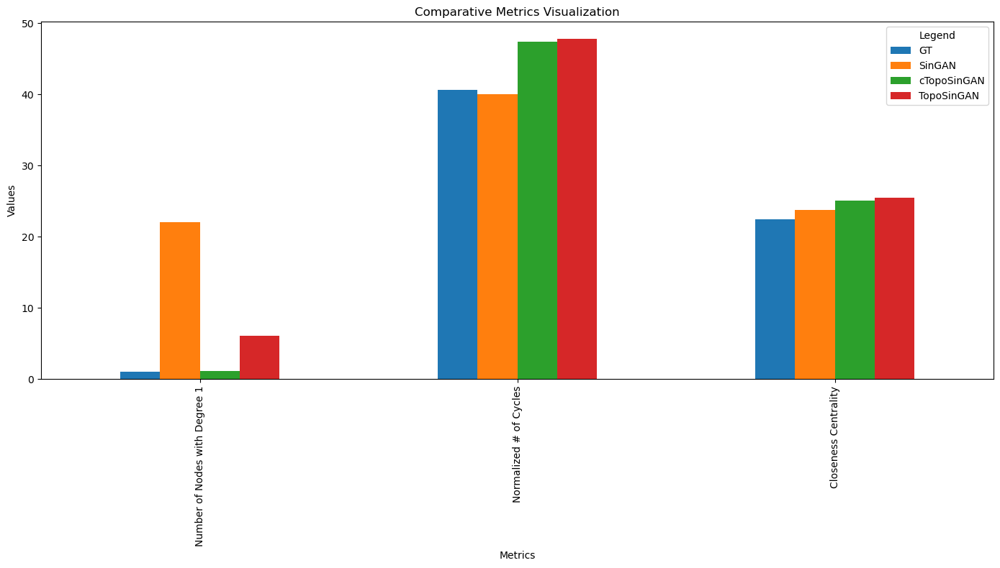

In [13]:

ax = df_concat.iloc[:,4:7].T.plot(kind='bar', figsize=(14, 8))

# Set titles and labels
plt.title('Comparative Metrics Visualization')
plt.ylabel('Values')
plt.xlabel('Metrics')
plt.xticks(rotation=90)

# Customize legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, ['GT', 'SinGAN', 'cTopoSinGAN', 'TopoSinGAN'], title='Legend')

plt.tight_layout()

# Show the plot
plt.show()


In [ ]:
#include "clang/Frontend/FrontendPluginRegistry.h"
#include "clang/AST/AST.h"
#include "clang/AST/ASTConsumer.h"
#include "clang/AST/RecursiveASTVisitor.h"
#include "clang/Frontend/CompilerInstance.h"
#include "clang/Lex/PreprocessorOptions.h"
#include "clang/Sema/SemaConsumer.h"
#include "llvm/Support/raw_ostream.h"
#include "clang/Basic/Version.h"
#include "clang/Basic/TargetInfo.h"


In [111]:
gdf = pd.DataFrame([calculate_metrics(Gl1[0])])
200*Gl1[0].number_of_edges()/(Gl1[0].number_of_nodes()*(Gl1[0].number_of_nodes()-1))


1.3196339080126158

In [110]:
gdf

,Number of Components,Number of Cycles,Normalized # of Cycles_old,Normalized # of Cycles,Cycle count/node count,Density,Clustering Coefficient,Number of Nodes with Degree 0,Number of Nodes with Degree 1,Number of Nodes with Degree > 1,Betweenness Centrality,Closeness Centrality,Assortativity,Modularity
0,1,361,0.654859,84.956745,1.121118,1.319634,0.263654,0,1,321,10.685923,27.92585,0.639536,0.668713


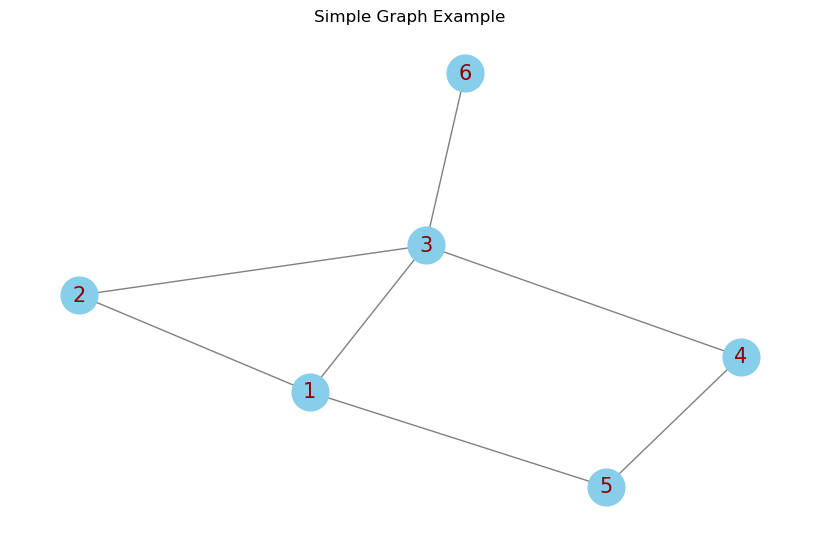

In [178]:
from pysal.lib import weights

import networkx as nx
import matplotlib.pyplot as plt

# Create a new graph
G = nx.Graph()

# Add nodes. Nodes can be any hashable object including integers and strings.
G.add_node(1)
G.add_node(2)
G.add_node(3)
G.add_node(4)
G.add_node(5)
G.add_node(6)

# Add edges. Edges are pairs of nodes specifying their connection.
G.add_edge(1, 2)
G.add_edge(1, 3)
G.add_edge(4, 5)
G.add_edge(3, 4)
G.add_edge(3, 6)
# You can also add multiple edges or nodes at once
G.add_edges_from([(2, 3), (1, 5)])

# Draw the graph
plt.figure(figsize=(8, 5))  # Set the size of the plot
nx.draw(G, with_labels=True, node_color='skyblue', edge_color='gray', node_size=700, font_size=15, font_color='darkred')
plt.title('Simple Graph Example')
plt.show()

# pos = nx.kamada_kawai_layout(G)

# nx.draw_networkx_nodes(G, pos, node_size=30)

W = weights.contiguity.Queen.from_networkx(G)
W.transform = 'R'

W

In [183]:
import networkx as nx
import geopandas as gpd
import libpysal
from shapely.geometry import Point

# Create a graph
G = nx.Graph()
# Add nodes with spatial data (e.g., coordinates)
G.add_node(1, pos=(0, 0))
G.add_node(2, pos=(1, 1))
G.add_node(3, pos=(1, 0))
G.add_node(4, pos=(0, 1))

# Add edges
G.add_edges_from([(1, 2), (1, 3), (2, 4), (3, 4), (1, 4)])

# Use libpysal to create a Queen contiguity weights object from a networkx graph
W = libpysal.weights.contiguity.Queen.from_networkx(G)

# Convert the graph to a GeoDataFrame
# Extracting the positions and creating a list of Point geometries
geometry = [Point(G.nodes[node]['pos']) for node in G.nodes()]
gdf = gpd.GeoDataFrame(geometry=geometry, index=G.nodes())

# Optionally, add more data columns
gdf['node_id'] = gdf.index
# Safely add neighbors if they exist in the weights object
gdf['weights'] = [list(W.neighbors[node]) if node in W.neighbors else [] for node in G.nodes()]

# Save the GeoDataFrame to a file (e.g., GeoJSON)
# gdf.to_file("nodes_geographic_file.geojson", driver='GeoJSON')

gdf


,geometry,node_id,weights
1,POINT (0.00000 0.00000),1,"[0, 3]"
2,POINT (1.00000 1.00000),2,"[0, 3]"
3,POINT (1.00000 0.00000),3,"[0, 1, 2]"
4,POINT (0.00000 1.00000),4,[]


In [185]:
W.weights

{0: [1, 1, 1], 1: [1, 1], 2: [1, 1], 3: [1, 1, 1]}

In [297]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from pysal.explore import esda
from pysal.lib import weights
import pickle
import pandas as pd


def localMoran(G, pos, values, plot=False):
    # Create a weights matrix based on adjacency (topological)
    W = weights.contiguity.Queen.from_networkx(G)
    W.transform = 'R'  # Row-standardize the weights
    #np.random.seed(1)
    local_moran = esda.moran.Moran_Local(values, W)
    if plot:
        fig, ax = plt.subplots()
        for node, value, p_val, quadrant in zip(G.nodes, values, local_moran.p_sim, local_moran.q):
            if p_val < 0.05:  
                if quadrant == 1:
                    node_color = 'red'    # HH
                elif quadrant == 2:
                    node_color = 'lightblue'   # LH
                elif quadrant == 3:
                    node_color = 'blue'  # LL
                elif quadrant == 4:
                    node_color = 'pink'   # HL
            else:
                node_color = 'grey'  # Not significant
            nx.draw_networkx_nodes(G, pos, nodelist=[node], node_color=node_color, node_size=30, ax=ax)
        nx.draw_networkx_edges(G, pos, ax=ax)
        red_patch = plt.Line2D([], [], color='red', marker='o', markersize=10, label='HH')
        blue_patch = plt.Line2D([], [], color='blue', marker='o', markersize=10, label='LL')
        lightblue_patch = plt.Line2D([], [], color='lightblue', marker='o', markersize=10, label='LH')
        pink_patch = plt.Line2D([], [], color='pink', marker='o', markersize=10, label='HL')
        grey_patch = plt.Line2D([], [], color='grey', marker='o', markersize=10, label='N/S')
        plt.legend(handles=[red_patch, blue_patch, lightblue_patch, pink_patch, grey_patch])
        plt.title('Local Moran\'s I Clustering')
        plt.axis('off') 
        plt.show()
        return pd.DataFrame(zip(G.nodes, values, local_moran.p_sim, local_moran.q), columns=['Node', 'Degree', 'p_sim', 'q'])
    else: 
        return pd.DataFrame(zip(G.nodes, values, local_moran.p_sim, local_moran.q), columns=['Node', 'Degree', 'p_sim', 'q'])

def distance_to_nearest_degree_one(G):
    degree_one_nodes = [node for node in G.nodes if G.degree(node) == 1]
    distances = {node: None for node in G.nodes()}
    if not degree_one_nodes:
        return distances
    queue = [(node, 0) for node in degree_one_nodes]
    visited = set()
    while queue:
        current_node, dist = queue.pop(0)
        if distances[current_node] is not None and distances[current_node] <= dist:
            continue
        distances[current_node] = dist
        for neighbor in G.neighbors(current_node):
            if neighbor not in visited or (distances[neighbor] is None or distances[neighbor] > dist + 1):
                queue.append((neighbor, dist + 1))
                visited.add(neighbor)
    return distances

def plot_graph_with_escape_dist_color(G, pos, plot=False, title=None):
    dist_val_list = []
    distances = distance_to_nearest_degree_one(G)
    dist_values = [dist for dist in distances.values() if dist is not None]
    avg_dist = np.mean(dist_values)
    print("Average Escape Distance: ", avg_dist)
    if not dist_values:  
        print("No nodes with degree 1 found. Cannot determine escape distances.")
        return
    dist_val_list.append(dist_values)
    if plot:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))  
        norm = plt.Normalize(vmin=min(dist_values), vmax=max(dist_values))
        cmap = plt.cm.coolwarm
        node_colors = [cmap(norm(dist if dist is not None else min(dist_values))) for dist in distances.values()] 
        nx.draw(G, pos, ax=ax1, node_color=node_colors, with_labels=False,
                node_size=30, edge_color='gray', linewidths=0.5, font_size=8)
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax1, orientation='vertical')
        cbar.set_label('Escape Distance')
        ax1.set_title(f"Graph Visualization by Escape Distance - {title}")
        ax2.hist(dist_values, bins='auto', color='blue', alpha=0.7)  # 'auto' lets matplotlib decide the number of bins
        ax2.set_title(f'Histogram of Escape Distances - {title}')
        ax2.set_xlabel('Escape Distance')
        ax2.set_ylabel('Frequency')
        plt.tight_layout()
        plt.show()
        return dist_val_list
    else:
        return dist_val_list

def lisa_quartile(G2, pos2):
    distances = distance_to_nearest_degree_one(G2)
    dist_values = [dist for dist in distances.values() if dist is not None]
    res = localMoran(G2, pos2, dist_values)
    dfff = (100*res[res['p_sim']<=0.05].groupby('q').count()/len(res)).reset_index().iloc[:,0:2]
    for i in [1,2,3,4]:
        if i not in list(dfff['q']):
            new_row = {'q':i, 'Node':0}
            dfff = dfff._append(new_row, ignore_index=True)
    replacement_map = {
            1: 'HH',
            2: 'LH',
            3: 'LL',
            4: 'HL'
        }
    dfff['q'] = dfff['q'].replace(replacement_map)
    return dfff
    
    

In [345]:
def prep_for_satscan(Gh, name, base, mode, save=True):
    """
    Creates input files for satscan
    """
    posd = nx.kamada_kawai_layout(Gh)
    if mode=='node_degree':
        node_degrees = Gh.degree()
        node_values = [degree for node, degree in node_degrees]
    elif mode=='escape_distance':
        distances = distance_to_nearest_degree_one(Gh)
        for key, value in distances.items():
            if value is None:
                distances[key] = 0
        node_values = [dist for dist in distances.values() if dist is not None]
    else:
        return 
    node_data = pd.DataFrame({
        'name': list(Gh.nodes()),
        'x': [posd[node][0] for node in Gh.nodes()],
        'y': [posd[node][1] for node in Gh.nodes()],
        'value': node_values
    })
    ss_path = f'satscan/{base}/{mode}/'
    # ss_path = f'{mode}'
    # ss_path = ''
    node_data['population'] = 1
    node_data['date'] = '2000-1-1'
    if save:
        node_data[['name', 'value', 'date']].to_csv(f"{ss_path+name}.cas", header=False, index=False, sep=" ")
        node_data[['name', 'date', 'population']].to_csv(f"{ss_path+name}.pop", header=False, index=False, sep=" ")
        node_data[['name', 'y', 'x']].to_csv(f"{ss_path+name}.geo", index=False, header=False, sep=" ")
        return node_data
    else:
        return node_data

# for base in ['padded_dirty_simple', 'padded_dirty_topo', 'padded_cleaned_topo']:
#     root_p = f'graphs/{base}/graph/'
#     for g in os.listdir(root_p):
#         print(g)
#         with open(root_p+g, 'rb') as f:
#             Gh, pos = pickle.load(f)
#         box = [Gh, pos]
#         gh = add_node0(box[0], box[1], Random=True)
#         md = ['escape_distance', 'node_degree']
#         for mdi in md:
#             node_data = prep_for_satscan(gh[0], name=g[:-7], base=base, mode=mdi)
    

Average Escape Distance:  12.06530612244898


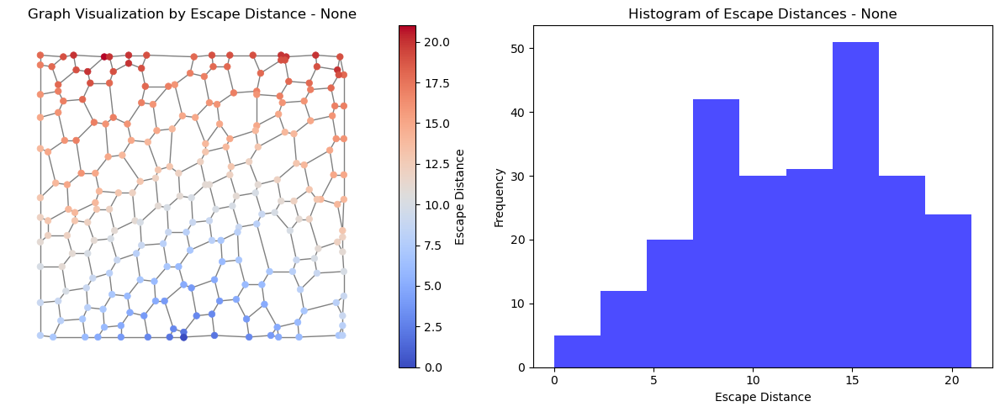

In [307]:
with open('dendro_skel.pickle', 'rb') as f:
    Gh, pos = pickle.load(f)
box = [Gh, pos]
gh = add_node0(box[0], box[1], random=False)
j = plot_graph_with_escape_dist_color(gh[0], gh[1], plot=True)



Average Escape Distance:  9.63265306122449


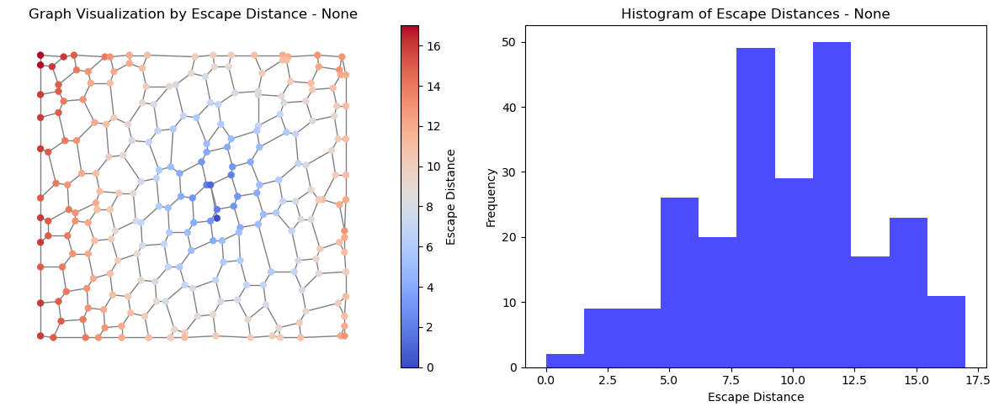

In [327]:
import random
def _add_node0(G1, pos1, Random=False):
    #random.seed(40)
    G1p = G1.copy()
    pos1p = pos1.copy()
    if Random:
        existing_node = random.choice(list(G1p.nodes()))
        if isinstance(existing_node, tuple):
            new_node_id = (existing_node[0], existing_node[1] + 1) 
        else:
            new_node_id = existing_node + 1 
        G1p.add_node(new_node_id)
        G1p.add_edge(new_node_id, existing_node)
        new_node_position = (pos1p[existing_node][0]+5, pos1p[existing_node][1] - 20.3)
        pos1p[new_node_id] = new_node_position
    else:
        existing_node = list(G1p.nodes())[-1]
        new_node_id = (existing_node[0], existing_node[1] + 1)
        G1p.add_node(new_node_id)
        G1p.add_edge(new_node_id, existing_node)
        new_node_position = (pos1p[existing_node][0], pos1p[existing_node][1] - 0.3)
        pos1p[new_node_id] = new_node_position
    return [G1p, pos1p]
    
with open('dendro_skel.pickle', 'rb') as f:
    Gh, pos = pickle.load(f)
box = [Gh, pos]
gh = add_node0(box[0], box[1], Random=True)
j = plot_graph_with_escape_dist_color(gh[0], gh[1], plot=True)



In [344]:

with open('dendro_skel.pickle', 'rb') as f:
    Gh, pos = pickle.load(f)
box = [Gh, pos]
gh = add_node0(box[0], box[1], Random=True)
node_data = prep_for_satscan(gh[0], name='dendro_skel', base ='rr', mode='escape_distance')

node_data

,name,x,y,value,population,date
0,"(1, 1)",1.000000,0.042379,17,1,2000-1-1
1,"(2, 19)",0.949498,0.139238,16,1,2000-1-1
2,"(7, 1)",0.984294,-0.065027,17,1,2000-1-1
3,"(1, 27)",0.871968,0.209297,15,1,2000-1-1
4,"(2, 51)",0.780926,0.249266,14,1,2000-1-1
...,...,...,...,...,...,...
240,"(172, 181)",-0.671072,-0.346924,10,1,2000-1-1
241,"(173, 187)",-0.741762,-0.310444,10,1,2000-1-1
242,"(173, 102)",-0.318811,-0.611805,10,1,2000-1-1
243,"(173, 113)",-0.429797,-0.565733,11,1,2000-1-1


In [34]:


# def plot_graph_with_escape_dist_color(G, pos, plot=False):
#     dist_val_list = []
#     distances = distance_to_nearest_degree_one(G)
#     dist_values = [dist for dist in distances.values() if dist is not None]
#     avg_dist = np.mean(dist_values)
#     # print("Average Escape Distance: ", avg_dist)
#     if not dist_values:  
#         print("No nodes with degree 1 found. Cannot determine escape distances.")
#         return
#     dist_val_list.append(dist_values)
#     if plot:
#         fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))  
#         norm = plt.Normalize(vmin=min(dist_values), vmax=max(dist_values))
#         cmap = plt.cm.coolwarm
#         node_colors = [cmap(norm(dist if dist is not None else min(dist_values))) for dist in distances.values()] 
#         nx.draw(G, pos, ax=ax1, node_color=node_colors, with_labels=False,
#                 node_size=30, edge_color='gray', linewidths=0.5, font_size=8)
#         sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
#         sm.set_array([])
#         cbar = plt.colorbar(sm, ax=ax1, orientation='vertical')
#         cbar.set_label('Escape Distance')
#         ax1.set_title("Graph Visualization by Escape Distance")
#         ax2.hist(dist_values, bins='auto', color='blue', alpha=0.7)  # 'auto' lets matplotlib decide the number of bins
#         ax2.set_title('Histogram of Escape Distances')
#         ax2.set_xlabel('Escape Distance')
#         ax2.set_ylabel('Frequency')
#         plt.tight_layout()
#         plt.show()
#         return dist_val_list
#     else:
#         return dist_val_list


dist_v_l = []
for gl in [[G1, pos1], [G2, pos2], [G3, pos3], [G4, pos4]]:
    g = add_node0(gl[0], gl[1])
    lm = lisa_quartile(g[0], g[1])
    # print(lm)
    posd = nx.kamada_kawai_layout(g[0])
    out = plot_graph_with_escape_dist_color(g[0], posd, plot=False)
    if out != None:
        dist_v_l.append(out[0])



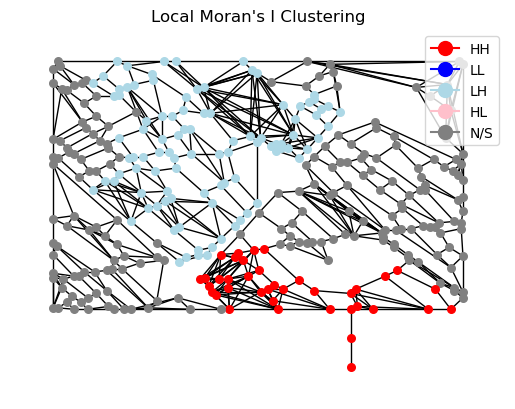

Results for Graph 1:
              0         1    2    3
q            HH        LH   LL   HL
Node  11.764706  30.03096  0.0  0.0


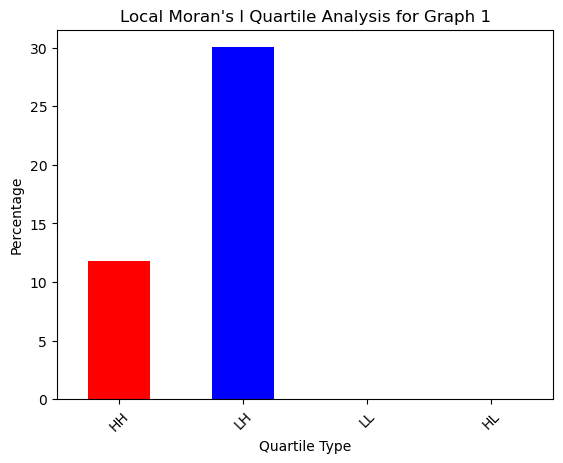

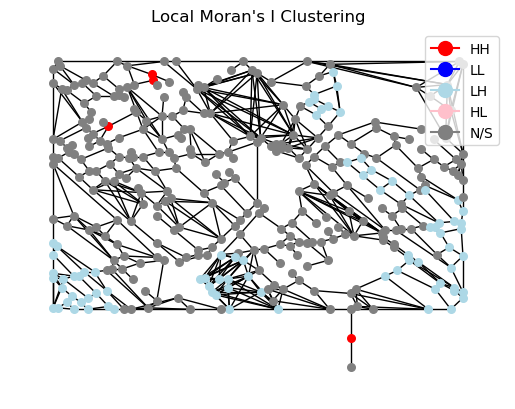

Results for Graph 2:
             0         1    2    3
q           HH        LH   LL   HL
Node  1.101928  22.31405  0.0  0.0


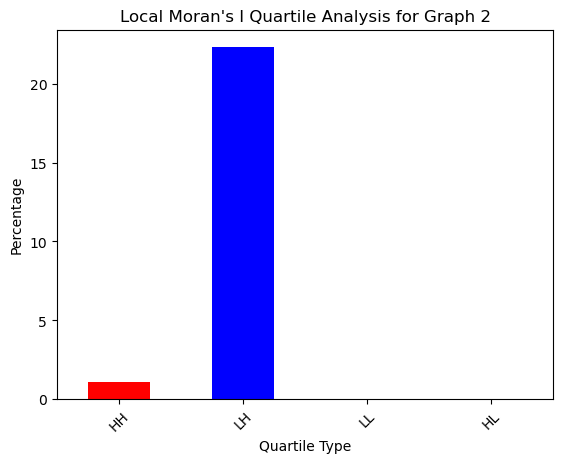

/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)


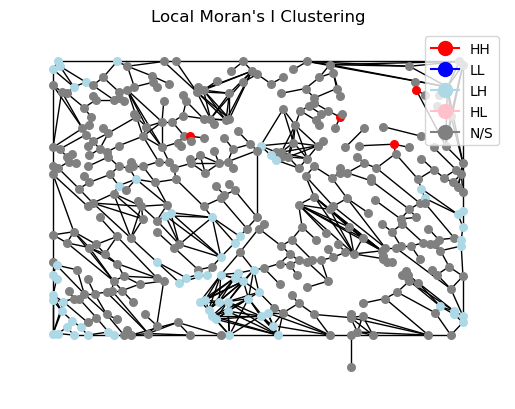

Results for Graph 3:
             0          1    2    3
q           HH         LH   LL   HL
Node  1.005025  17.839196  0.0  0.0


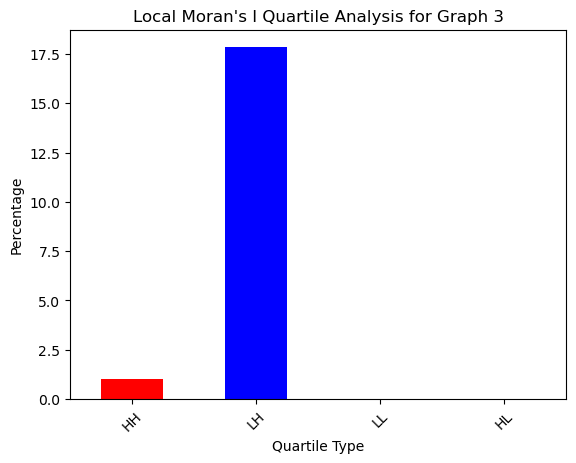

/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 6 disconnected components.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)


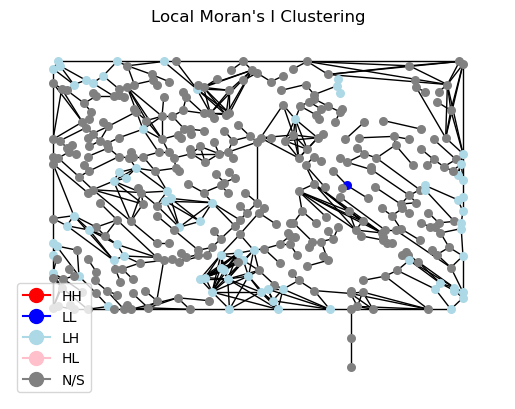

Results for Graph 4:
             0          1    2    3
q           LL         LH   HH   HL
Node  0.247525  18.564356  0.0  0.0


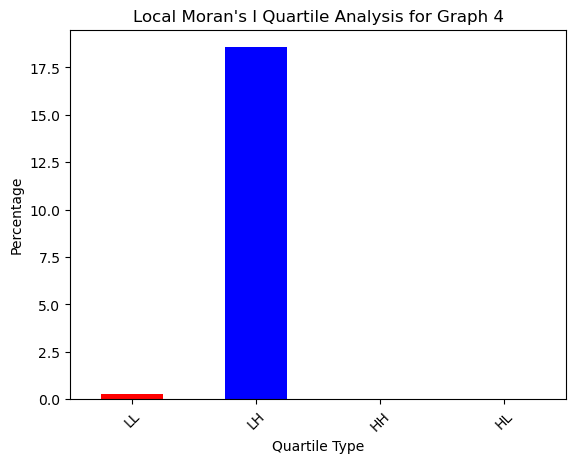

In [142]:
import numpy as np
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

# Assuming localMoran and distance_to_nearest_degree_one are defined elsewhere
# Ensure you've defined pos1, pos2, pos3, pos4 corresponding to G1, G2, G3, G4 respectively
# positions = [pos2, pos3, pos4]  # Make sure to define these before using them

# Gs = [G2, G3, G4]  # The graphs you want to analyze
Gs = [[G1, pos1], [G2, pos2], [G3, pos3], [G4, pos4]]

for idx, GG in enumerate(Gs):
    g = add_node0(GG[0], GG[1])
    pos = g[1]
    G = g[0]
    distances = distance_to_nearest_degree_one(G)
    values = np.array(list(distances.values()))
    values = 1/(values+1)

    res = localMoran(G, pos, values, plot=True)
    dfff_p = (100 * res[res['p_sim'] <= 0.05].groupby('q').count() / len(res)).reset_index().iloc[:, 0:2]

    for i in [1, 2, 3, 4]:
        if i not in list(dfff_p['q']):
            new_row = pd.DataFrame({'q': [i], 'Node': [0]})
            dfff_p = pd.concat([dfff_p, new_row], ignore_index=True)

    replacement_map = {
        1: 'HH',
        2: 'LL',
        3: 'LH',
        4: 'HL'
    }
    dfff_p['q'] = dfff_p['q'].replace(replacement_map)
    
    print(f"Results for Graph {idx + 1}:")
    print(dfff_p.T)

    plt.figure()
    dfff_p.set_index('q')['Node'].plot(kind='bar', color=['red', 'blue', 'green', 'purple'])
    plt.title(f'Local Moran\'s I Quartile Analysis for Graph {idx + 1}')
    plt.ylabel('Percentage')
    plt.xlabel('Quartile Type')
    plt.xticks(rotation=45)
    plt.show()




In [328]:

def lisa_aggr(pdir, mode='escape_distance'):
    results_df = pd.DataFrame(columns=['HH', 'LH', 'LL', 'HL'])
    for peg in os.listdir(pdir):
        if peg.endswith('.pickle'):
            try:
                with open(pdir+peg, 'rb') as f:
                    G, pos = pickle.load(f)
                g = add_node0(G, pos, Random=True)
                pos = g[1]
                G = g[0]
                if mode=='escape_distance':
                    distances = distance_to_nearest_degree_one(G)
                    values = np.array(list(distances.values()))
                elif mode=='node_degree':
                    node_degrees = G.degree()
                    values = [degree for node, degree in node_degrees]
                    
                # values = 1 / (values + 1)
                res = localMoran(G, pos, values, plot=False)
                # Cluster Percentages
                dfff_p = (100 * res[res['p_sim'] <= 0.05].groupby('q').count() / len(res)).reset_index().iloc[:, 0:2]
                for i in [1, 2, 3, 4]:
                    if i not in list(dfff_p['q']):
                        new_row = pd.DataFrame({'q': [i], 'Node': [0]})
                        dfff_p = pd.concat([dfff_p, new_row], ignore_index=True)
                replacement_map = {
                    1: 'HH',
                    2: 'LH',
                    3: 'LL',
                    4: 'HL'
                }
                dfff_p['q'] = dfff_p['q'].replace(replacement_map)
                dfff_p.set_index('q', inplace=True)
                results_df = results_df._append(dfff_p.transpose())
            except:
                pass
    results_df.reset_index(drop=True, inplace=True)
    return results_df



/tmp/ipykernel_2952004/2524152200.py:29: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df_gt = results_df_gt._append(dfff_p.transpose())


,HH,LH,LL,HL
Node,95.102041,1.632653,0.0,2.857143


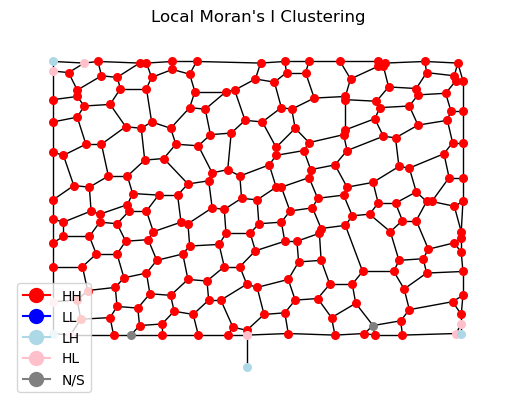

              0         1         2    3
q            HH        LH        HL   LL
Node  95.102041  1.632653  2.857143  0.0


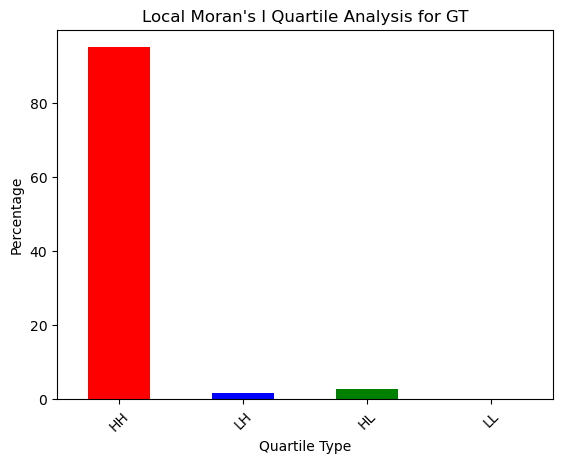

In [113]:

# distances = distance_to_nearest_degree_one(G)
# values = np.array(list(distances.values()))
# values = 1/(values+1)

node_degrees = G.degree()
values = [degree for node, degree in node_degrees]

res = localMoran(G, pos, values, plot=True)
dfff_p = (100 * res[res['p_sim'] <= 0.05].groupby('q').count() / len(res)).reset_index().iloc[:, 0:2]

for i in [1, 2, 3, 4]:
    if i not in list(dfff_p['q']):
        new_row = pd.DataFrame({'q': [i], 'Node': [0]})
        dfff_p = pd.concat([dfff_p, new_row], ignore_index=True)

replacement_map = {
    1: 'HH',
    3: 'LL',
    2: 'LH',
    4: 'HL'
}
dfff_p['q'] = dfff_p['q'].replace(replacement_map)

# print(f"Results for Graph {idx + 1}:")
print(dfff_p.T)

plt.figure()
dfff_p.set_index('q')['Node'].plot(kind='bar', color=['red', 'blue', 'green', 'purple'])
plt.title(f'Local Moran\'s I Quartile Analysis for GT')
plt.ylabel('Percentage')
plt.xlabel('Quartile Type')
plt.xticks(rotation=45)
plt.show()

             0         1        2    3
q           HH        LH       LL   HL
Node  9.311741  2.834008  2.42915  0.0


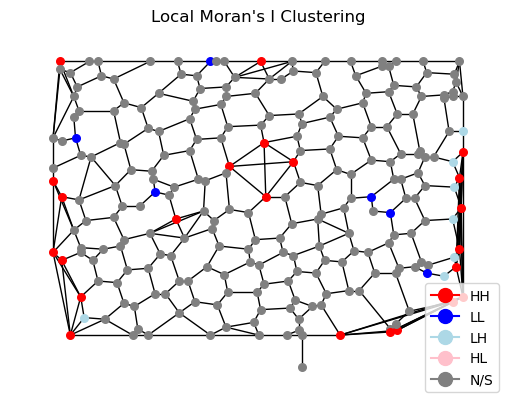

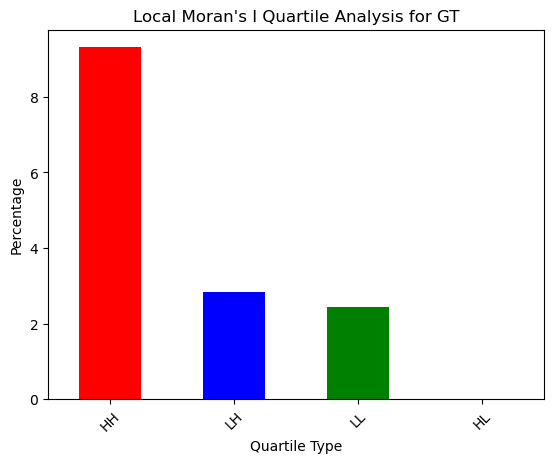

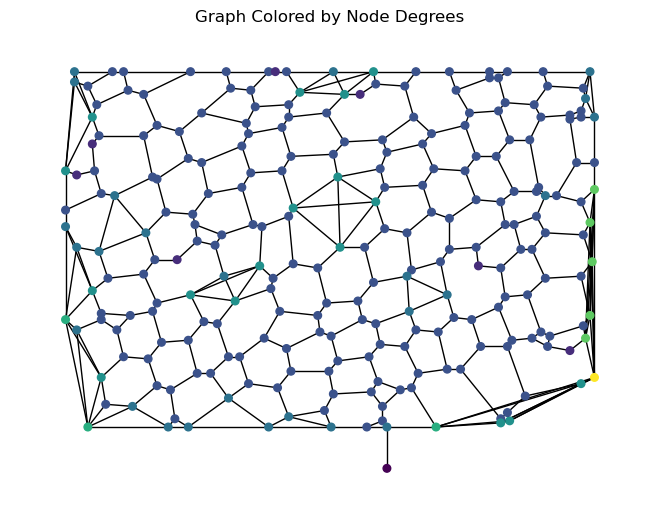

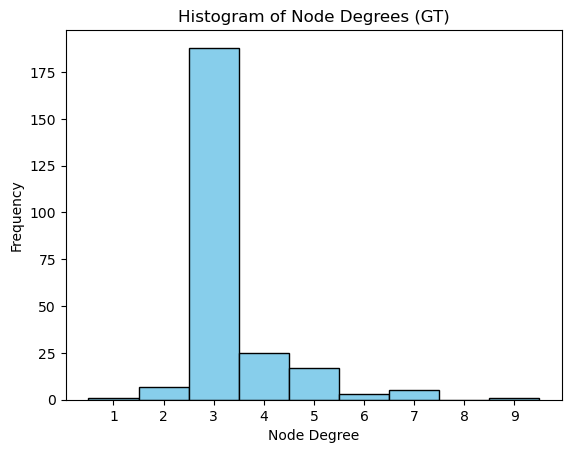

In [160]:
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd
# Assuming G and pos are already defined graph and positions, respectively
# If not, you would need to create or load your graph and positions

# Calculate node degrees
node_degrees = G.degree()
values = [degree for node, degree in node_degrees]

# Perform local Moran's I analysis jish
# Assuming localMoran function returns a DataFrame similar to Moran_Local
res = localMoran(G, pos, values, plot=False)  # Make sure localMoran is defined or use Moran_Local

W = weights.contiguity.Queen.from_networkx(G)
W.transform = 'R'  # Row-standardize the weights
#np.random.seed(1)
local_moran = esda.moran.Moran_Local(values, W)

# Calculate percentage of nodes in each quartile with p_sim <= 0.05
dfff_p = (100 * res[res['p_sim'] <= 0.05].groupby('q').count() / len(res)).reset_index().iloc[:, 0:2]

# Ensure all quartiles are represented
for i in [1, 2, 3, 4]:
    if i not in list(dfff_p['q']):
        new_row = pd.DataFrame({'q': [i], 'Node': [0]})
        dfff_p = pd.concat([dfff_p, new_row], ignore_index=True)

# Map quartile numbers to labels
replacement_map = {
    1: 'HH',
    3: 'LL',
    2: 'LH',
    4: 'HL'
}
dfff_p['q'] = dfff_p['q'].replace(replacement_map)

# Print the results
print(dfff_p.T)

# plt.figure()

fig, ax = plt.subplots()
for node, value, p_val, quadrant in zip(G.nodes, values, local_moran.p_sim, local_moran.q):
    if p_val < 0.05:  
        if quadrant == 1:
            node_color = 'red'    # HH
        elif quadrant == 2:
            node_color = 'lightblue'   # LH
        elif quadrant == 3:
            node_color = 'blue'  # LL
        elif quadrant == 4:
            node_color = 'pink'   # HL
    else:
        node_color = 'grey'  # Not significant
    nx.draw_networkx_nodes(G, pos, nodelist=[node], node_color=node_color, node_size=30, ax=ax)
    
nx.draw_networkx_edges(G, pos, ax=ax)
red_patch = plt.Line2D([], [], color='red', marker='o', markersize=10, label='HH')
blue_patch = plt.Line2D([], [], color='blue', marker='o', markersize=10, label='LL')
lightblue_patch = plt.Line2D([], [], color='lightblue', marker='o', markersize=10, label='LH')
pink_patch = plt.Line2D([], [], color='pink', marker='o', markersize=10, label='HL')
grey_patch = plt.Line2D([], [], color='grey', marker='o', markersize=10, label='N/S')
plt.legend(handles=[red_patch, blue_patch, lightblue_patch, pink_patch, grey_patch])
plt.title('Local Moran\'s I Clustering')
plt.axis('off') 
plt.show()


dfff_p.set_index('q')['Node'].plot(kind='bar', color=['red', 'blue', 'green', 'purple'])
plt.title('Local Moran\'s I Quartile Analysis for GT')
plt.ylabel('Percentage')
plt.xlabel('Quartile Type')
plt.xticks(rotation=45)
plt.show()

node_colors = [degree for node, degree in G.degree()]
nx.draw(G, pos, node_color=node_colors, with_labels=False, node_size=30, cmap=plt.cm.viridis)
plt.title('Graph Colored by Node Degrees')
plt.show()

plt.hist(values, bins=range(min(values), max(values)+2), align='left', color='skyblue', edgecolor='black')
plt.title('Histogram of Node Degrees (GT)')
plt.xlabel('Node Degree')
plt.ylabel('Frequency')
plt.xticks(range(min(values), max(values)+1))
plt.show()


              0          1    2    3
q            HH         LL   LH   HL
Node  17.886179  17.479675  0.0  0.0


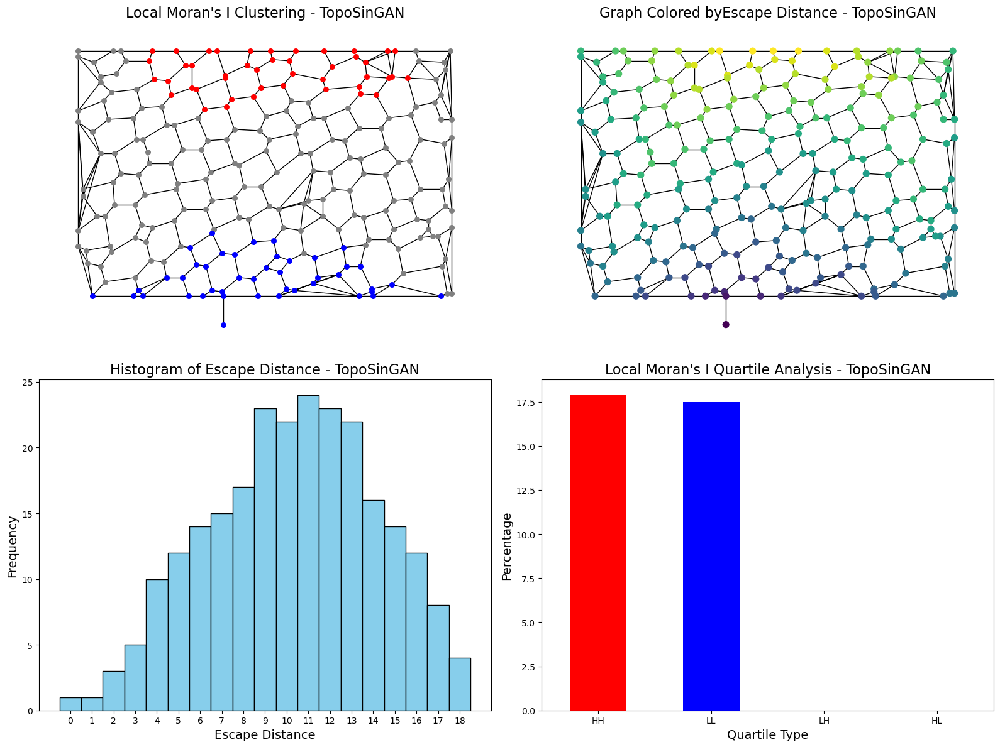

In [176]:
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd
import numpy as np
import esda
import libpysal as lps  # Assume necessary for weights

# 'dendro_skel.pickle'

with open('graphs/padded_cleaned_topo/graph/2_m.pickle', 'rb') as f:
    G, pos = pickle.load(f)
g = add_node0(G, pos)
pos = g[1]
G = g[0]

distances = distance_to_nearest_degree_one(G)
values = np.array(list(distances.values()))

# node_degrees = G.degree()
# values = [degree for node, degree in node_degrees]

# Assuming localMoran function and Moran_Local are defined
res = localMoran(G, pos, values, plot=False)

# Setting weights and calculating local Moran's I
W = lps.weights.contiguity.Queen.from_networkx(G)
W.transform = 'R'
#np.random.seed(1)
local_moran = esda.moran.Moran_Local(values, W)

# Calculate percentage of nodes in each quartile with p_sim <= 0.05
dfff_p = (100 * res[res['p_sim'] <= 0.05].groupby('q').count() / len(res)).reset_index().iloc[:, 0:2]
for i in [1, 2, 3, 4]:
    if i not in list(dfff_p['q']):
        new_row = pd.DataFrame({'q': [i], 'Node': [0]})
        dfff_p = pd.concat([dfff_p, new_row], ignore_index=True)
replacement_map = {1: 'HH', 3: 'LL', 2: 'LH', 4: 'HL'}
dfff_p['q'] = dfff_p['q'].replace(replacement_map)

# Print the results
print(dfff_p.T)

# Set up the plot grid
fig, axs = plt.subplots(2, 2, figsize=(16, 12))  # Adjust the size as needed

# Plot 1: Local Moran's I Clustering
for node, value, p_val, quadrant in zip(G.nodes, values, local_moran.p_sim, local_moran.q):
    node_color = 'grey'  # Default color for not significant
    if p_val < 0.05:
        color_map = {1: 'red', 2: 'lightblue', 3: 'blue', 4: 'pink'}
        node_color = color_map.get(quadrant, 'grey')
    nx.draw_networkx_nodes(G, pos, nodelist=[node], node_color=node_color, node_size=30, ax=axs[0, 0])
nx.draw_networkx_edges(G, pos, ax=axs[0, 0])
axs[0, 0].set_title('Local Moran\'s I Clustering - TopoSinGAN', fontsize=16)
axs[0, 0].axis('off')

# Plot 2: Histogram of Node Degrees
axs[1, 0].hist(values, bins=range(min(values), max(values)+2), align='left', color='skyblue', edgecolor='black')
axs[1, 0].set_title('Histogram of Escape Distance - TopoSinGAN', fontsize=16)
axs[1, 0].set_xlabel('Escape Distance', fontsize=14)
axs[1, 0].set_ylabel('Frequency', fontsize=14)
axs[1, 0].set_xticks(range(min(values), max(values)+1))

nx.draw(G, pos, node_color=values, with_labels=False, node_size=50, cmap=plt.cm.viridis, ax=axs[0, 1])
axs[0, 1].set_title('Graph Colored byEscape Distance - TopoSinGAN', fontsize=16)

# Plot 3: Local Moran's I Quartile Analysis
dfff_p.set_index('q')['Node'].plot(kind='bar', color=['red', 'blue', 'green', 'purple'], ax=axs[1, 1])
axs[1, 1].set_title("Local Moran's I Quartile Analysis - TopoSinGAN", fontsize=16)
axs[1, 1].set_ylabel('Percentage', fontsize=14)
axs[1, 1].set_xlabel('Quartile Type', fontsize=14)
axs[1, 1].tick_params(axis='x', rotation=0)

# Plot 4: Graph Colored by Node Degrees
plt.tight_layout()
plt.show()


In [331]:
results_df_gt = pd.DataFrame(columns=['HH', 'LH', 'LL', 'HL'])

with open('dendro_skel.pickle', 'rb') as f:
    G, pos = pickle.load(f)
g = add_node0(G, pos, Random=True)
pos = g[1]
G = g[0]
distances = distance_to_nearest_degree_one(G)
values = np.array(list(distances.values()))

# node_degrees = G.degree()
# values = [degree for node, degree in node_degrees]

# values = 1 / (values + 1)
res = localMoran(G, pos, values, plot=False)
dfff_p = (100 * res[res['p_sim'] <= 0.05].groupby('q').count() / len(res)).reset_index().iloc[:, 0:2] # Cluster Percentages
for i in [1, 2, 3, 4]:
    if i not in list(dfff_p['q']):
        new_row = pd.DataFrame({'q': [i], 'Node': [0]})
        dfff_p = pd.concat([dfff_p, new_row], ignore_index=True)
replacement_map = {
    1: 'HH',
    2: 'LH',
    3: 'LL',
    4: 'HL'
}
dfff_p['q'] = dfff_p['q'].replace(replacement_map)
dfff_p.set_index('q', inplace=True)
results_df_gt = results_df_gt._append(dfff_p.transpose())


pdir = 'graphs/padded_dirty_simple/graph/'
dirt_simpdf = lisa_aggr(pdir, mode='escape_distance')

pdir = 'graphs/padded_cleaned_topo/graph/'
cle_topodf = lisa_aggr(pdir, mode='escape_distance')

pdir = 'graphs/padded_dirty_topo/graph/'
dirt_topodf = lisa_aggr(pdir, mode='escape_distance')


/tmp/ipykernel_2952004/4239786697.py:29: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df_gt = results_df_gt._append(dfff_p.transpose())
/tmp/ipykernel_2952004/1010402499.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = results_df._append(dfff_p.transpose())
/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  w 

('WARNING: ', 267, ' is an island (no neighbors)')
('WARNING: ', 245, ' is an island (no neighbors)')


/tmp/ipykernel_2952004/1010402499.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = results_df._append(dfff_p.transpose())
/tmp/ipykernel_2952004/1010402499.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = results_df._append(dfff_p.transpose())


In [332]:
import pandas as pd
dirt_simpdf_summary = dirt_simpdf.describe().iloc[1:3, :]
cle_topodf_summary = cle_topodf.describe().iloc[1:3, :]
dirt_topodf_summary = dirt_topodf.describe().iloc[1:3, :]

dirt_simpdf_summary.index = pd.MultiIndex.from_product([['SinGAN'], dirt_simpdf_summary.index])
cle_topodf_summary.index = pd.MultiIndex.from_product([['TopoSinGAN'], cle_topodf_summary.index])
# dirt_topodf_summary.index = pd.MultiIndex.from_product([['dirt_topodf'], dirt_topodf_summary.index])
results_df_gt.index = pd.MultiIndex.from_product([['GT'], results_df_gt.index])

combined_summary = pd.concat([results_df_gt, dirt_simpdf_summary, cle_topodf_summary])

combined_summary.T.round(2)


GT SinGAN       TopoSinGAN      
     Node   mean   std       mean   std
HH  15.10  13.82  2.85      20.77  1.99
LH   0.00   0.00  0.00       0.00  0.00
LL  16.33   7.06  3.18      19.04  2.10
HL   0.00   0.00  0.00       0.00  0.00

In [169]:
combined_summary.T.round(2)

GT SinGAN        TopoSinGAN       
     Node   mean    std       mean    std
HH  95.10   8.28  12.86       8.33   2.20
LH   1.63   4.37   4.33       4.23   1.42
LL   0.00   0.01   0.06       4.99  12.54
HL   2.86   3.88   3.00       0.20   0.26

In [156]:
import pandas as pd

# Data for TopoSinGAN
topo_data = {
    'HH': {'mean': 9.894466, 'std': 2.198028},
    'HL': {'mean': 0.0, 'std': 0.0},
    'LL': {'mean': 0.0, 'std': 0.0},
    'LH': {'mean': 25.149649, 'std': 2.292459}
}

# Data for SinGAN
singan_data = {
    'HH': {'mean': 1.836701, 'std': 1.277372},
    'HL': {'mean': 0.0, 'std': 0.0},
    'LL': {'mean': 0.0, 'std': 0.0},
    'LH': {'mean': 19.622133, 'std': 2.515953}
}

# Create DataFrames
topo_df = pd.DataFrame(topo_data).T
singan_df = pd.DataFrame(singan_data).T

# Assign MultiIndex to columns (using 'TopoSinGAN' and 'SinGAN' as the top level)
combined_df = pd.concat([topo_df, singan_df], axis=1, keys=['TopoSinGAN', 'SinGAN'])

combined_df


TopoSinGAN               SinGAN          
         mean       std       mean       std
HH   9.894466  2.198028   1.836701  1.277372
HL   0.000000  0.000000   0.000000  0.000000
LL   0.000000  0.000000   0.000000  0.000000
LH  25.149649  2.292459  19.622133  2.515953

In [144]:
import pandas as pd
import numpy as np
import networkx as nx


results_df = pd.DataFrame(columns=['HH', 'HL', 'LL', 'LH'])

Gs = [[G1, pos1], [G2, pos2], [G3, pos3], [G4, pos4]]

for idx, GG in enumerate(Gs):
    g = add_node0(GG[0], GG[1])
    pos = g[1]
    G = g[0]
    distances = distance_to_nearest_degree_one(G)
    values = np.array(list(distances.values()))
    values = 1 / (values + 1)

    res = localMoran(G, pos, values, plot=False)
    dfff_p = (100 * res[res['p_sim'] <= 0.05].groupby('q').count() / len(res)).reset_index().iloc[:, 0:2]

    for i in [1, 2, 3, 4]:
        if i not in list(dfff_p['q']):
            new_row = pd.DataFrame({'q': [i], 'Node': [0]})
            dfff_p = pd.concat([dfff_p, new_row], ignore_index=True)

    replacement_map = {
        1: 'HH',
        2: 'LL',
        3: 'LH',
        4: 'HL'
    }
    dfff_p['q'] = dfff_p['q'].replace(replacement_map)
    dfff_p.set_index('q', inplace=True)
    
    # Append to the main DataFrame
    results_df = results_df._append(dfff_p.transpose())

results_df.reset_index(drop=True, inplace=True)
results_df


/tmp/ipykernel_1781090/377656830.py:36: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = results_df._append(dfff_p.transpose())
/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)
/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 6 disconnected components.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)


,HH,HL,LL,LH
0,11.764706,0.0,0.000000,30.030960
1,1.101928,0.0,0.000000,22.314050
2,1.005025,0.0,0.000000,17.839196
3,0.000000,0.0,0.247525,18.564356


In [138]:
import numpy as np
from scipy.stats import wasserstein_distance

def normalize_histogram(hist):
    return hist / np.sum(hist)

overall_min = min(min(sublist) for sublist in dist_v_l if sublist)
overall_max = max(max(sublist) for sublist in dist_v_l if sublist)
bins = range(overall_min, overall_max + 2)

for i, l1 in enumerate(dist_v_l):
    for j in range(i + 1, len(dist_v_l)):  # Start j from i+1
        l2 = dist_v_l[j]
        
        hist1, _ = np.histogram(l1, bins=bins) 
        hist2, _ = np.histogram(l2, bins=bins)

        # Normalize histograms
        hist1_normalized = normalize_histogram(hist1)
        hist2_normalized = normalize_histogram(hist2)

        # Display i and j (1-based indexing for display)
        print('i, j = ', i+1, j+1)
        
        # Calculate Earth Mover's Distance
        emd = wasserstein_distance(hist1_normalized, hist2_normalized)
        print("Earth Mover's Distance:", emd)

        # Calculate Euclidean Distance
        euclidean_distance = np.linalg.norm(hist1_normalized - hist2_normalized)
        print("Euclidean Distance:", euclidean_distance)

i, j =  1 2
Earth Mover's Distance: 0.03983900360202077
Euclidean Distance: 0.44445334688528804
i, j =  1 3
Earth Mover's Distance: 0.05143882467030716
Euclidean Distance: 0.5157358946594698
i, j =  1 4
Earth Mover's Distance: 0.05449056902594284
Euclidean Distance: 0.5534624613950975
i, j =  2 3
Earth Mover's Distance: 0.01533897679397907
Euclidean Distance: 0.19244327010714601
i, j =  2 4
Earth Mover's Distance: 0.019540022184036585
Euclidean Distance: 0.31103275172885725
i, j =  3 4
Earth Mover's Distance: 0.011286838482843264
Euclidean Distance: 0.1353476143394122


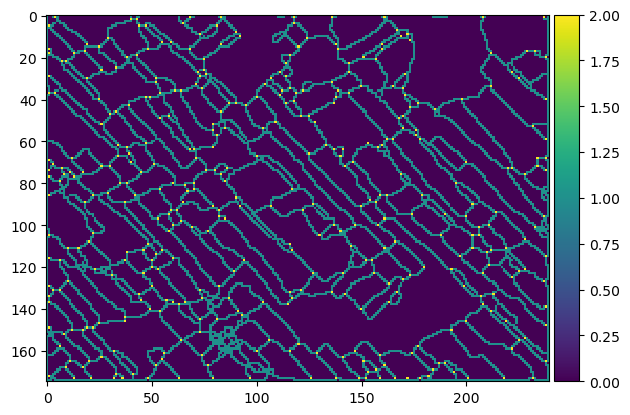

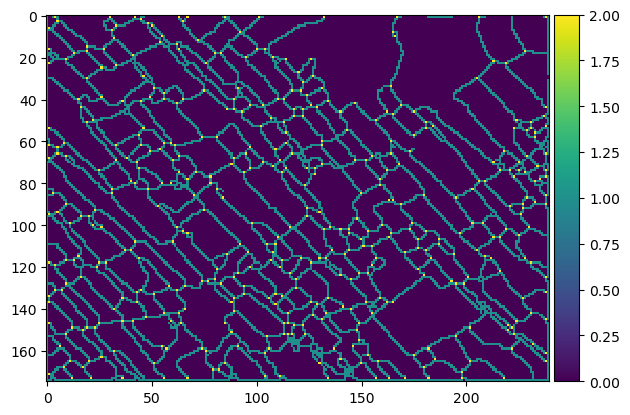

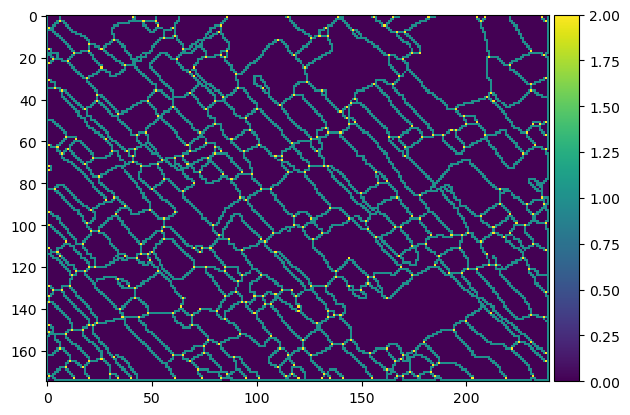

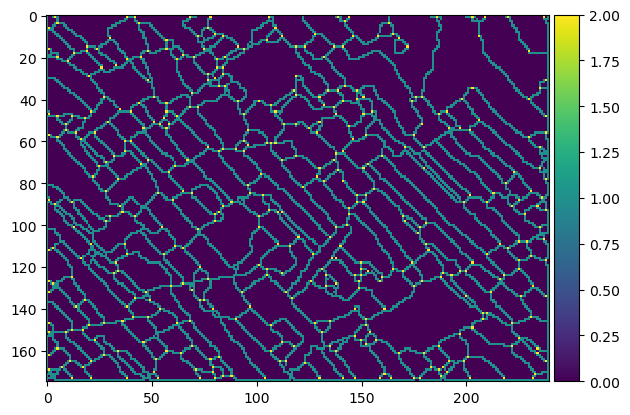

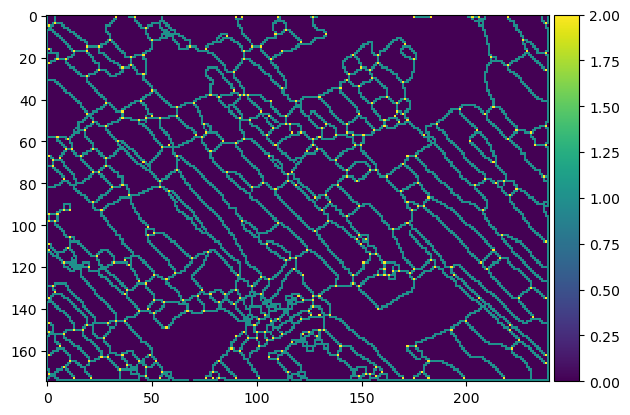

...

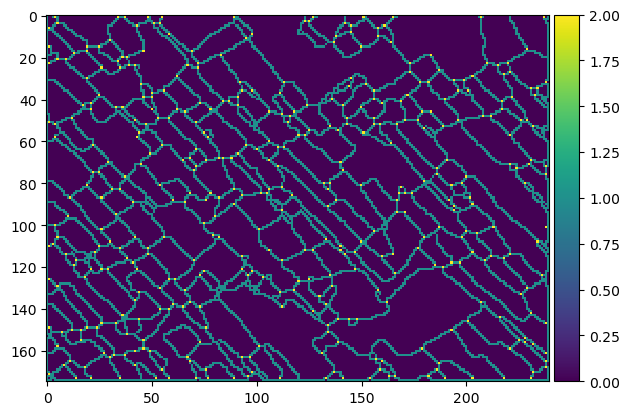

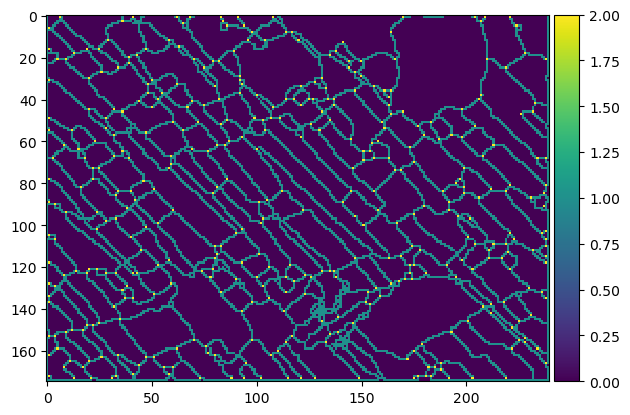

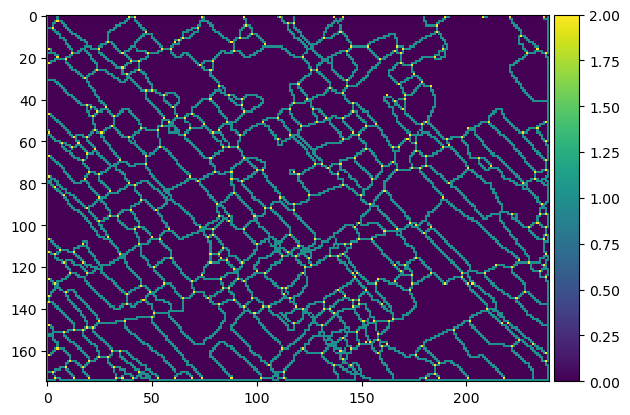

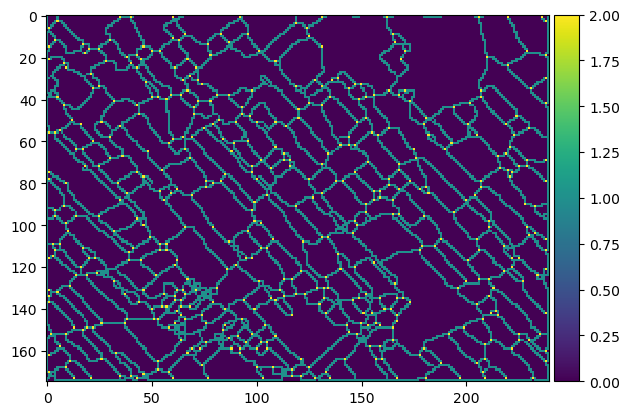

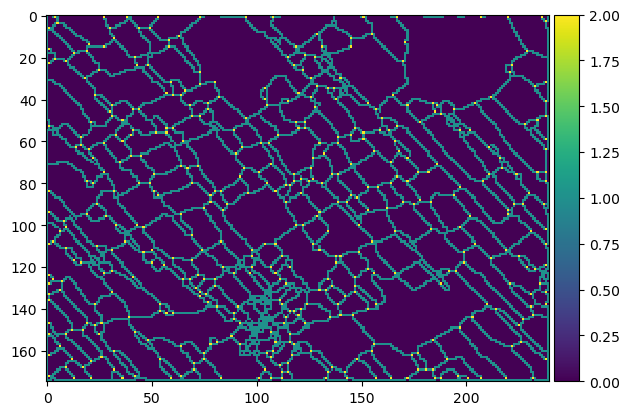

In [165]:
from skimage.io import imshow
dirs = ['graphs/padded_dirty_simple/mask/', 'graphs/padded_cleaned_topo/mask/']
root_p = dirs[1]
for g in os.listdir(root_p):
    if not g.startswith('.'):
        imshow(root_p+g)
        plt.show()
    # with open(root_p+g, 'rb') as f:
    #     Gh, pos = pickle.load(f)



In [170]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from esda.moran import Moran_Local
from libpysal.weights import W
from libpysal.weights.util import from_adjlist

# def create_graph_and_weights():
    # Create a NetworkX graph
G = nx.Graph()
G.add_nodes_from([(1, {"value": 20}), (2, {"value": 30}), (3, {"value": 40}),
                  (4, {"value": 25}), (5, {"value": 45}), (6, {"value": 35})])
G.add_edges_from([(1, 2), (1, 3), (2, 3), (2, 4), (3, 5), (4, 5), (4, 6), (5, 6)])

# Create adjacency list
adjlist = [(node, neighbor) for node in G.nodes for neighbor in G[node]]

# Create weights from adjacency list
weights = from_adjlist(adjlist)

ImportError: cannot import name 'from_adjlist' from 'libpysal.weights.util' (/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/util.py)

In [80]:
import pickle
import networkx as nx
# pg = 'graphs/padded_dirty_topo/graph/31_m.pickle'
pg1 = 'gt_graph/padded_clover175x240.pickle'
pg2 = 'disconnected_clover.pickle'
pg3 = 'disconnected_clover2.pickle'
pg4 = 'disconnected_clover4.pickle'
# pg3 = 'disconnected_clover33.pickle'
with open(pg1, 'rb') as f:
    G1, pos1 = pickle.load(f)

with open(pg2, 'rb') as f:
    G2, pos2 = pickle.load(f)

with open(pg3, 'rb') as f:
    G3, pos3 = pickle.load(f)

with open(pg4, 'rb') as f:
    G4, pos4 = pickle.load(f)
# nx.draw(G, pos, with_labels=False, node_color='skyblue', node_size=50, edge_color='k')
mode = 'escape_distance'
# mode = 'node_degree'
G1_l = add_node0(G1, pos1)
G1 = G1_l[0]
posd1 = nx.kamada_kawai_layout(G1)
if mode=='node_degree':
    node_degrees = G1.degree()
    node_values = [degree for node, degree in node_degrees]
if mode=='escape_distance':
    distances = distance_to_nearest_degree_one(G1)
    for key, value in distances.items():
        if value is None:
            distances[key] = 0
    node_values = [dist for dist in distances.values() if dist is not None]

node_data = pd.DataFrame({
    'name': list(G1.nodes()),
    'x': [posd1[node][0] for node in G1.nodes()],
    'y': [posd1[node][1] for node in G1.nodes()],
    'value': node_values
})

node_data['population'] = 1
node_data['date'] = '2000-1-1'
# node_data[['name', 'value', 'date']].to_csv("G1n.cas", header=False, index=False, sep=" ")
# node_data[['name', 'date', 'population']].to_csv("G1n.pop", header=False, index=False, sep=" ")
# node_data[['name', 'y', 'x']].to_csv("G1n.geo", index=False, header=False, sep=" ")


In [172]:
# import pandas as pd

# node_data['population'] = 1
# node_data['date'] = '2000-1-1'
# case_file_path = "cases_G3.cas"
# node_data[['name', 'value', 'date']].to_csv("G3.cas", header=False, index=False, sep=" ")
# node_data[['name', 'date', 'population']].to_csv("G3.pop", header=False, index=False, sep=" ")
# node_data[['name', 'y', 'x']].to_csv("G3.geo", index=False, header=False, sep=" ")

# satscan64 --CaseFile 0_m.cas --PopulationFile 0_m.pop --CoordinatesFile 0_m.geo --CoordinatesType 0 --AnalysisType 1 --ModelType 0 --ScanAreas 1 --ClusterSignificanceByPvalue y --IncludeClusterLocationsKML y --CompressKMLtoKMZ y --ResultsFile 0_m.out
# satscan64 --CaseFile G1n.cas --PopulationFile G1n.pop --CoordinatesFile G1n.geo --CoordinatesType 0 --AnalysisType 1 --ModelType 0 --ScanAreas 1 --ClusterSignificanceByPvalue y --IncludeClusterLocationsKML y --CompressKMLtoKMZ y --ResultsFile G1n.out
# satscan64 --CaseFile G1e.cas --PopulationFile G1e.pop --CoordinatesFile G1e.geo --CoordinatesType 0 --AnalysisType 1 --ModelType 0 --ScanAreas 1 --ClusterSignificanceByPvalue y --IncludeClusterLocationsKML y --CompressKMLtoKMZ y --ResultsFile G1e.out




In [85]:


df = satscan_res_to_df2('G1e.out')
df.describe()


,Cluster ID,Numberofcases,Expectedcases,Annualcases_100000,Observed_expected,Relativerisk,Loglikelihoodratio,node_count,Radius
count,1.0,1.0,1.00,1.0,1.00,1.0,1.000000,1.0,1.00
mean,1.0,2653.0,1956.69,1730398.1,1.36,2.0,237.992382,283.0,0.83
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.0,2653.0,1956.69,1730398.1,1.36,2.0,237.992382,283.0,0.83
25%,1.0,2653.0,1956.69,1730398.1,1.36,2.0,237.992382,283.0,0.83
50%,1.0,2653.0,1956.69,1730398.1,1.36,2.0,237.992382,283.0,0.83
75%,1.0,2653.0,1956.69,1730398.1,1.36,2.0,237.992382,283.0,0.83
max,1.0,2653.0,1956.69,1730398.1,1.36,2.0,237.992382,283.0,0.83


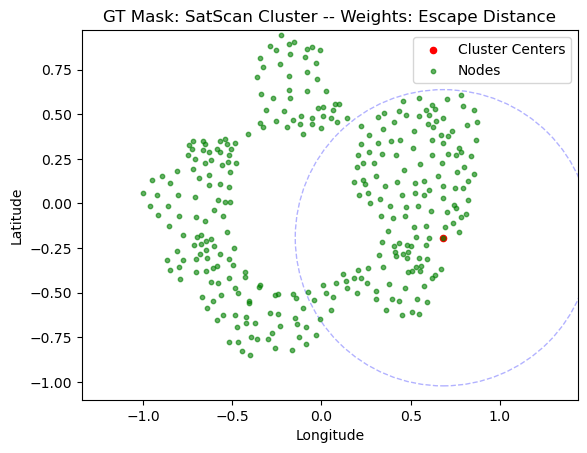

In [82]:
import matplotlib.pyplot as plt
import pandas as pd
fig, ax = plt.subplots()
df[['Longitude', 'Latitude']] = df['Coordinates'].str.split(',', expand=True).astype(float)
df['Radius'] = df['Radius'].astype(float)
for _, row in df.iterrows():
    circle = plt.Circle((row['Longitude'], row['Latitude']), row['Radius'], color='blue', fill=False, alpha=0.3, linestyle='dashed')
    ax.add_artist(circle)
ax.scatter(df['Longitude'], df['Latitude'], color='red', s=20, label='Cluster Centers')
ax.scatter(node_data['y'], node_data['x'], color='green', s=10, alpha=0.6, label='Nodes')
buffer = 0.1
all_longitudes = pd.concat([df['Longitude'], node_data['x']])
all_latitudes = pd.concat([df['Latitude'], node_data['y']])
ax.set_xlim(all_longitudes.min() - buffer, all_longitudes.max() + buffer)
ax.set_ylim(all_latitudes.min() - buffer, all_latitudes.max() + buffer)
ax.set_aspect('equal', adjustable='datalim')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('GT Mask: SatScan Cluster -- Weights: Escape Distance')
ax.legend()
plt.show()


In [346]:
import pandas as pd
import re

def satscan_res_to_df(file_path):
    with open(file_path, 'r') as file:
        content = file.read()
    pattern = re.compile(r"(\d+)\.Location IDs included\.: ([\s\S]+?)P-value...............: (\d+\.\d+)")
    matches = pattern.findall(content)
    cluster_id = []
    location_ids = []
    p_values = []
    for match in matches:
        id = int(match[0])
        loc_ids = match[1].strip().replace('\n', '').replace(' ', '')
        p_value = float(match[2])
        cluster_id.append(id)
        location_ids.append(loc_ids)
        p_values.append(p_value)
    df_clusters = pd.DataFrame({
        'Cluster ID': cluster_id,
        'Location IDs': location_ids,
        'P-value': p_values
    })
    df = df_clusters[df_clusters['P-value']<=0.05].copy()
    df[['IDs', 'Overlapwithclusters', 'Coordinates_radius', 'GiniCluster', 'Population', 'Numberofcases', 'Expectedcases', 'Annualcases_100000', 'Observed_expected', 'Relativerisk', 'Loglikelihoodratio']] = df['Location IDs'].str.split('Overlapwithclusters.:|Coordinates/radius..:|GiniCluster..........:|Population............:|Numberofcases.......:|Expectedcases........:|Annualcases/100000.:|Observed/expected...:|Relativerisk.........:|Loglikelihoodratio..:', expand=True)
    df['IDs'] = df['IDs'].str.extract('(\(.*\))')[0].str.split(',')
    df['Coordinates_radius'] = df['Coordinates_radius'].str.extract('(\(.*\)/\d+.\d+)')[0]
    df['node_count'] = (df['Population'].astype(int)).astype(int)
    df['Numberofcases'] = df['Numberofcases'].astype(int)
    df['Expectedcases'] = df['Expectedcases'].astype(float)
    df['Annualcases_100000'] = df['Annualcases_100000'].astype(float)
    df['Observed_expected'] = df['Observed_expected'].astype(float)
    df['Relativerisk'] = df['Relativerisk'].astype(float)
    df['Loglikelihoodratio'] = df['Loglikelihoodratio'].astype(float)
    df[['Coordinates', 'Radius']] = df['Coordinates_radius'].str.extract(r'\(([^)]+)\)/(\d+\.\d+)')
    df.drop(columns=['Coordinates_radius'], inplace=True)
    df.drop(columns=['Location IDs'], inplace=True)
    df.drop(columns=['Population'], inplace=True)
    return df

def satscan_res_to_df2(file_path):
    with open(file_path, 'r') as file:
        text = file.read()
    cluster_pattern = r'(\d+)\.Location IDs included\.: \(([\s\S]+?)\n\s+Overlap with clusters\.: ([\s\S]+?)\n\s+Coordinates / radius\..: \(([\s\S]+?)\) / ([\s\S]+?)\n\s+Gini Cluster\..........: ([\s\S]+?)\n\s+Population\............: (\d+)\n\s+Number of cases\.......: (\d+)\n\s+Expected cases\........: ([\s\S]+?)\n\s+Annual cases / 100000\.: ([\s\S]+?)\n\s+Observed / expected\...: ([\s\S]+?)\n\s+Relative risk\.........: ([\s\S]+?)\n\s+Log likelihood ratio\..: ([\s\S]+?)\n\s+P-value\...............: ([\s\S]+?)\n'
    clusters = re.findall(cluster_pattern, text, re.DOTALL)
    data = []
    for cluster in clusters:
        cluster_id = int(cluster[0])
        locations = cluster[1].replace('\n                          ', '').split(', ')
        locations = [loc.replace('(', '').replace(')', '') for loc in locations]
        overlap_with_clusters = cluster[2].strip()
        coordinates, radius = cluster[3].strip(), float(cluster[4].strip())
        gini_cluster = cluster[5].strip() == 'Yes'
        population = int(cluster[6])
        number_of_cases = int(cluster[7])
        expected_cases = float(cluster[8])
        annual_cases_100000 = float(cluster[9])
        observed_expected = float(cluster[10])
        relative_risk = float(cluster[11])
        log_likelihood_ratio = float(cluster[12])
        p_value = cluster[13].strip()
        data.append({
            'Cluster ID': cluster_id,
            'P-value': p_value,
            'IDs': locations,
            'Overlapwithclusters': 'NoOverlap' if overlap_with_clusters == 'None' else 'Overlap',
            'GiniCluster': gini_cluster,
            'Numberofcases': number_of_cases,
            'Expectedcases': expected_cases,
            'Annualcases_100000': annual_cases_100000,
            'Observed_expected': observed_expected,
            'Relativerisk': relative_risk,
            'Loglikelihoodratio': log_likelihood_ratio,
            'node_count': len(locations),
            'Coordinates': coordinates,
            'Radius': radius
        })
    df = pd.DataFrame(data)
    return df

cat = ['padded_dirty_simple', 'padded_cleaned_topo', 'padded_dirty_topo']
mode = ['escape_distance', 'node_degree']
for c in cat:
    for m in mode:
        ss_path = f'satscan/{c}/{m}/'
        for f in os.listdir(ss_path):
            if f.endswith('.out'):
                try:
                    df = satscan_res_to_df2(ss_path+f)
                    df.to_csv(f"{ss_path+f[:-4]}.csv", index=False, header=True)
                except:
                    # try:
                    #     df = satscan_res_to_df2(ss_path+f)
                    #     df.to_csv(f"{ss_path+f[:-4]}.csv", index=False, header=True)
                    # except:
                    print(ss_path+f)



<>:26: SyntaxWarning: invalid escape sequence '\('
<>:27: SyntaxWarning: invalid escape sequence '\('
<>:26: SyntaxWarning: invalid escape sequence '\('
<>:27: SyntaxWarning: invalid escape sequence '\('
/tmp/ipykernel_2952004/1017872763.py:26: SyntaxWarning: invalid escape sequence '\('
  df['IDs'] = df['IDs'].str.extract('(\(.*\))')[0].str.split(',')
/tmp/ipykernel_2952004/1017872763.py:27: SyntaxWarning: invalid escape sequence '\('
  df['Coordinates_radius'] = df['Coordinates_radius'].str.extract('(\(.*\)/\d+.\d+)')[0]


TopoSinGAN
count    132.000000
mean     102.318182
std       69.708150
min       21.000000
25%       51.000000
50%       67.500000
75%      163.250000
max      250.000000
Name: node_count, dtype: float64
SinGAN
count    184.000000
mean      40.918478
std       34.838878
min        8.000000
25%       23.000000
50%       30.000000
75%       45.000000
max      228.000000
Name: node_count, dtype: float64


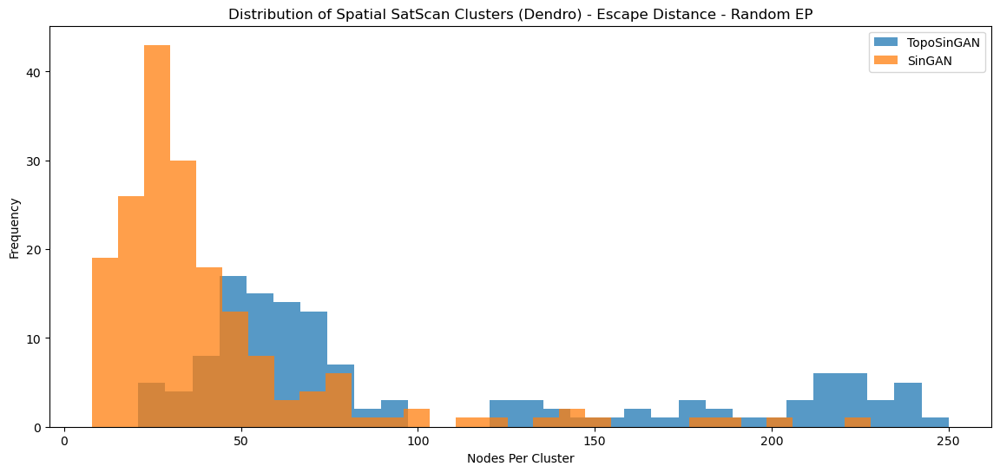

In [349]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# mode = ['escape_distance', 'node_degree']
mode = ['escape_distance']
cat = ['padded_cleaned_topo', 'padded_dirty_simple']
# cat = ['padded_cleaned_topo', 'padded_dirty_simple', 'padded_dirty_topo']
custom_names = {
    'padded_cleaned_topo': 'TopoSinGAN',
    'padded_dirty_simple': 'SinGAN',
    'node_degree': 'Node Degree',
    'escape_distance': 'Escape Distance'
}

base_path = 'satscan/'

# Collect node counts from two directories
def collect_node_counts(directory):
    node_counts = []
    for i in range(50):
        filename = os.path.join(directory, f'{i}_m.csv')
        if os.path.exists(filename):
            df = pd.read_csv(filename)
            if 'node_count' in df.columns:
                node_counts.append(df['node_count'])
            else:
                print(f"'node_count' column not found in {filename}")
        else:
            print(f"File not found: {filename}")
    return node_counts

# Plotting function
def plot_histogram(node_counts, title):
    all_node_counts = pd.concat(node_counts, ignore_index=True)
    print(title)
    print(all_node_counts.describe())
    plt.hist(all_node_counts, bins=30, alpha=0.75, label=title)

# Setup figure for histograms
plt.figure(figsize=(14, 6))

# Process each category and mode
for c in cat:
    for m in mode:
        directory = os.path.join(base_path, c, m)
        node_counts = collect_node_counts(directory)
        plot_histogram(node_counts, f'{custom_names[c]}')

plt.title('Distribution of Spatial SatScan Clusters (Dendro) - Escape Distance - Random EP')
plt.xlabel('Nodes Per Cluster')
plt.ylabel('Frequency')
plt.legend()
plt.show()


In [348]:

directory = 'node_degreedendro_skel.out'
node_counts = collect_node_counts(directory)
plot_histogram(node_counts, f'{custom_names[c]}')

plt.title('Distribution of Spatial SatScan Clusters - Escape Distance')
plt.xlabel('Nodes Per Cluster')
plt.ylabel('Frequency')
plt.legend()
plt.show()

File not found: node_degreedendro_skel.out/0_m.csv
File not found: node_degreedendro_skel.out/1_m.csv
File not found: node_degreedendro_skel.out/2_m.csv
File not found: node_degreedendro_skel.out/3_m.csv
File not found: node_degreedendro_skel.out/4_m.csv
File not found: node_degreedendro_skel.out/5_m.csv
File not found: node_degreedendro_skel.out/6_m.csv
File not found: node_degreedendro_skel.out/7_m.csv
File not found: node_degreedendro_skel.out/8_m.csv
File not found: node_degreedendro_skel.out/9_m.csv
File not found: node_degreedendro_skel.out/10_m.csv
File not found: node_degreedendro_skel.out/11_m.csv
File not found: node_degreedendro_skel.out/12_m.csv
File not found: node_degreedendro_skel.out/13_m.csv
File not found: node_degreedendro_skel.out/14_m.csv
File not found: node_degreedendro_skel.out/15_m.csv
File not found: node_degreedendro_skel.out/16_m.csv
File not found: node_degreedendro_skel.out/17_m.csv
File not found: node_degreedendro_skel.out/18_m.csv
File not found: node_d

ValueError: No objects to concatenate

TopoSinGAN
count    67.000000
mean     14.223881
std       7.012588
min       8.000000
25%      10.000000
50%      12.000000
75%      14.000000
max      39.000000
Name: node_count, dtype: float64
SinGAN
count     50.000000
mean      22.720000
std       43.570276
min        2.000000
25%        8.000000
50%        8.000000
75%       10.000000
max      207.000000
Name: node_count, dtype: float64


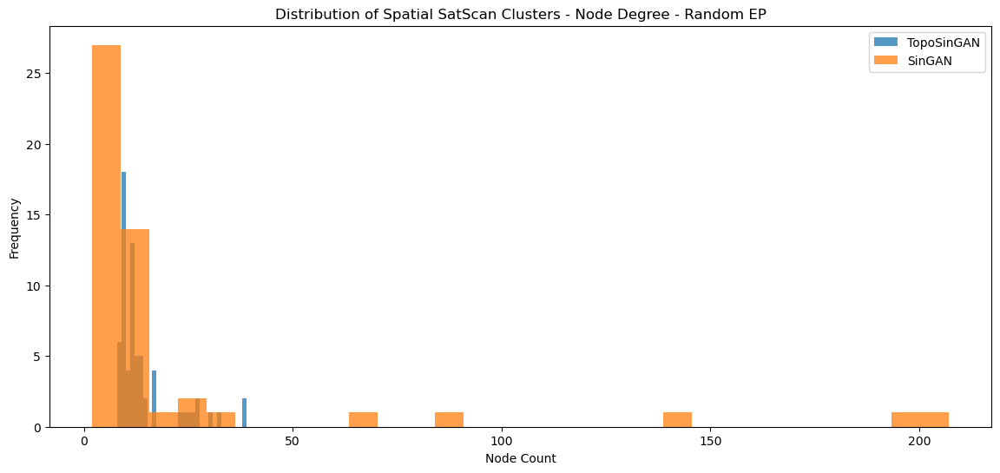

In [350]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# mode = ['escape_distance', 'node_degree']
mode = ['node_degree']

custom_names = {
    'padded_cleaned_topo': 'TopoSinGAN',
    'padded_dirty_simple': 'SinGAN',
    'node_degree': 'Node Degree',
    'escape_distance': 'Escape Distance'
}
base_path = 'satscan/'

# Setup figure for histograms
plt.figure(figsize=(14, 6))

# Process each category and mode
for c in cat:
    for m in mode:
        directory = os.path.join(base_path, c, m)
        node_counts = collect_node_counts(directory)
        # plot_histogram(node_counts, f'{c} - {m}')
        plot_histogram(node_counts, f'{custom_names[c]}')

plt.title('Distribution of Spatial SatScan Clusters - Node Degree - Random EP')
plt.xlabel('Node Count')
plt.ylabel('Frequency')
plt.legend()
plt.show()


In [355]:
df

,Cluster ID,P-value,IDs,Overlapwithclusters,GiniCluster,Numberofcases,Expectedcases,Annualcases_100000,Observed_expected,Relativerisk,Loglikelihoodratio,node_count,Coordinates,Radius
0,1,1.00,"[167, 186]",Overlap,False,4,2.99,399172.1,1.34,1.34,0.155546,2,"-0.243736,-0.693333",0.0


In [354]:
df = satscan_res_to_df2('node_degreedendro_skel.out')

df.describe()

,Cluster ID,Numberofcases,Expectedcases,Annualcases_100000,Observed_expected,Relativerisk,Loglikelihoodratio,node_count,Radius
count,1.0,1.0,1.00,1.0,1.00,1.00,1.000000,1.0,1.0
mean,1.0,4.0,2.99,399172.1,1.34,1.34,0.155546,2.0,0.0
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.0,4.0,2.99,399172.1,1.34,1.34,0.155546,2.0,0.0
25%,1.0,4.0,2.99,399172.1,1.34,1.34,0.155546,2.0,0.0
50%,1.0,4.0,2.99,399172.1,1.34,1.34,0.155546,2.0,0.0
75%,1.0,4.0,2.99,399172.1,1.34,1.34,0.155546,2.0,0.0
max,1.0,4.0,2.99,399172.1,1.34,1.34,0.155546,2.0,0.0


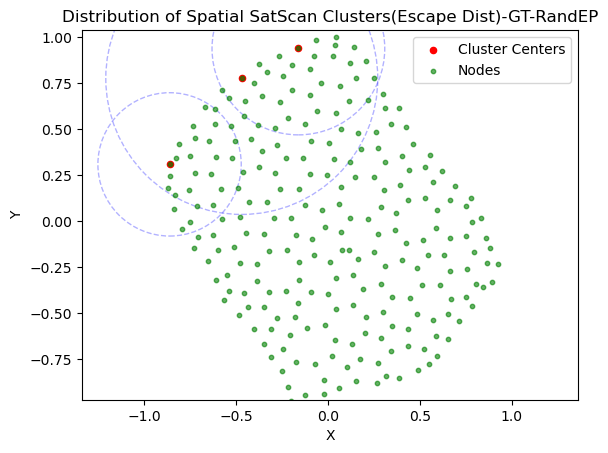

In [353]:
import matplotlib.pyplot as plt
import pandas as pd

fig, ax = plt.subplots()
df[['Longitude', 'Latitude']] = df['Coordinates'].str.split(',', expand=True).astype(float)
df['Radius'] = df['Radius'].astype(float)
for _, row in df.iterrows():
    circle = plt.Circle((row['Longitude'], row['Latitude']), row['Radius'], color='blue', fill=False, alpha=0.3, linestyle='dashed')
    ax.add_artist(circle)
ax.scatter(df['Longitude'], df['Latitude'], color='red', s=20, label='Cluster Centers')
ax.scatter(node_data['y'], node_data['x'], color='green', s=10, alpha=0.6, label='Nodes')
buffer = 0.1
all_longitudes = pd.concat([df['Longitude'], node_data['x']])
all_latitudes = pd.concat([df['Latitude'], node_data['y']])
ax.set_xlim(all_longitudes.min() - buffer, all_longitudes.max() + buffer)
ax.set_ylim(all_latitudes.min() - buffer, all_latitudes.max() + buffer)
ax.set_aspect('equal', adjustable='datalim')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('Distribution of Spatial SatScan Clusters(Escape Dist)-GT-RandEP')
ax.legend()
plt.show()


In [246]:
# pp = '/mmfs1/home/jacks.local/mohsen.ahmadkhani/imageprocessing/GRAPH/satscan/padded_dirty_simple/escape_distance/24_m.cas'
# df = satscan_res_to_df(pp)
# df

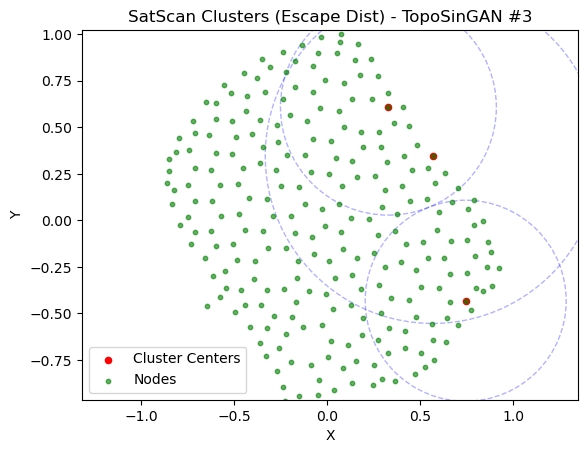

In [303]:
import matplotlib.pyplot as plt
import pandas as pd
# koskesh
# pp = '/mmfs1/home/jacks.local/mohsen.ahmadkhani/imageprocessing/GRAPH/satscan/padded_dirty_simple/escape_distance/24_m.out'

# df = satscan_res_to_df2('satscan/padded_dirty_simple/escape_distance/3_m.out')
gname = 'dendro_skel.pickle'
sname = 'escape_distancedendro_skel.out'
# gname = 'graphs/padded_cleaned_topo/graph/3_m.pickle'
# sname = 'satscan/padded_cleaned_topo/escape_distance/3_m.out'

# gpick = 'graphs/'+name
# name = 'node_degreedendro_skel'
with open(gname, 'rb') as f:
    Gh, posh = pickle.load(f)
Gh_l = add_node0(Gh, posh)
Gh = Gh_l[0]
posh = Gh_l[1]
#kir
df = satscan_res_to_df2(sname)
node_data = prep_for_satscan(Gh, name, mode='escape_distance', save=False)

# df = satscan_res_to_df2('node_degreedendro_skel.out')
fig, ax = plt.subplots()
df[['Longitude', 'Latitude']] = df['Coordinates'].str.split(',', expand=True).astype(float)
df['Radius'] = df['Radius'].astype(float)
for _, row in df.iterrows():
    circle = plt.Circle((row['Longitude'], row['Latitude']), row['Radius'], color='blue', fill=False, alpha=0.3, linestyle='dashed')
    ax.add_artist(circle)
ax.scatter(df['Longitude'], df['Latitude'], color='red', s=20, label='Cluster Centers')
ax.scatter(node_data['y'], node_data['x'], color='green', s=10, alpha=0.6, label='Nodes')
buffer = 0.1
all_longitudes = pd.concat([df['Longitude'], node_data['x']])
all_latitudes = pd.concat([df['Latitude'], node_data['y']])
ax.set_xlim(all_longitudes.min() - buffer, all_longitudes.max() + buffer)
ax.set_ylim(all_latitudes.min() - buffer, all_latitudes.max() + buffer)
ax.set_aspect('equal', adjustable='datalim')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('SatScan Clusters (Escape Dist) - TopoSinGAN #3')
ax.legend()
plt.show()


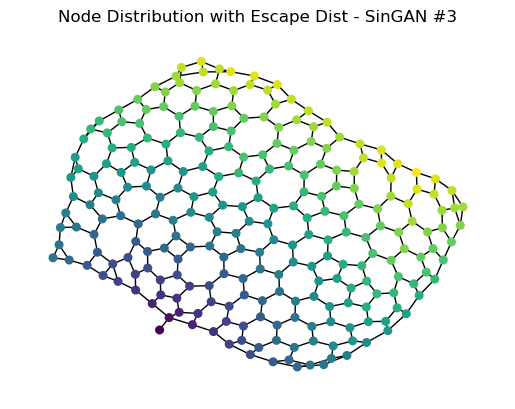

In [304]:

# name = 'node_degreedendro_skel'
# with open('dendro_skel.pickle', 'rb') as f:
with open(gname, 'rb') as f:    
    Gh, posh = pickle.load(f)
    Gh_l = add_node0(Gh, posh)
G1 = Gh_l[0]
distances = distance_to_nearest_degree_one(G1)
for key, value in distances.items():
    if value is None:
        distances[key] = 0
node_colors = [dist for dist in distances.values() if dist is not None]


    
# node_colors = [degree for node, degree in Gh.degree()]
fig, ax = plt.subplots()  # Create a figure and axes
nx.draw(G1, nx.kamada_kawai_layout(G1), ax=ax, node_color=node_colors, with_labels=False, node_size=30, cmap=plt.cm.viridis)
ax.set_title('Node Distribution with Escape Dist - SinGAN #3')
plt.show() 

Average Escape Distance:  12.06530612244898


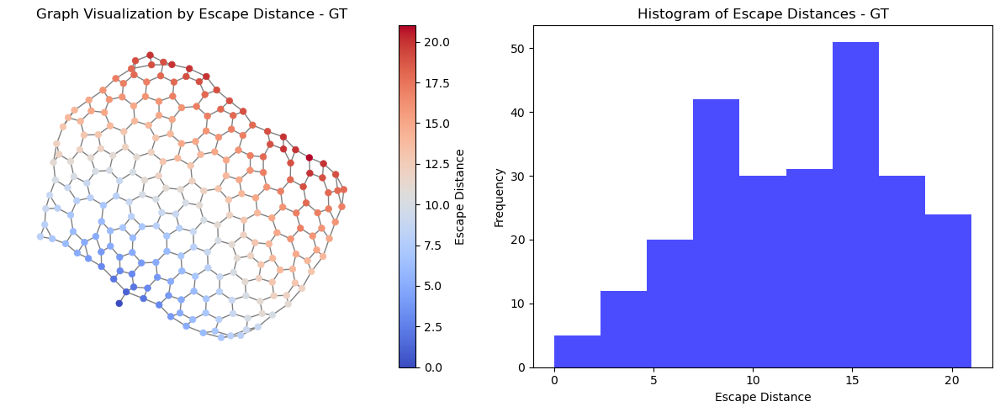

In [305]:
# Gh_l[1]
dg = plot_graph_with_escape_dist_color(Gh_l[0], nx.kamada_kawai_layout(Gh_l[0]), plot=True, title='GT')


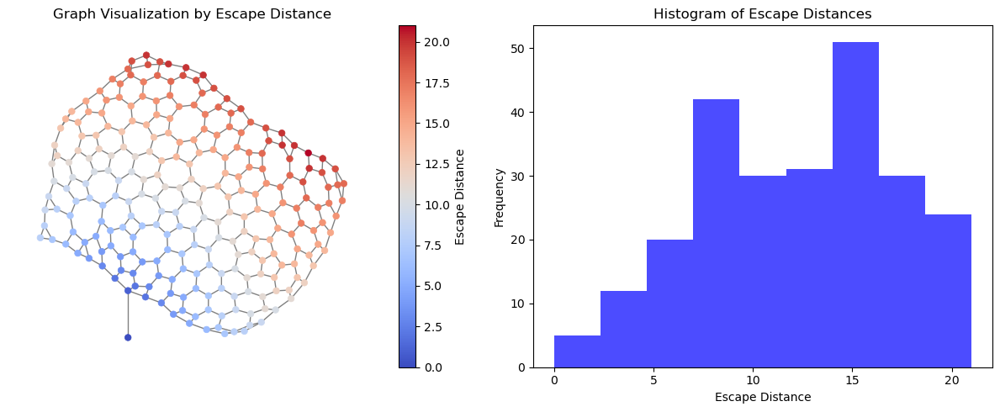

[[18,
  19,
  17,
  20,
  21,
  19,
  20,
  19,
  20,
  20,
  18,
  19,
  19,
  19,
  18,
  19,
  18,
  20,
  18,
  20,
  19,
  20,
  19,
  19,
  18,
  20,
  19,
  17,
  19,
  20,
  18,
  18,
  16,
  18,
  17,
  17,
  18,
  18,
  19,
  19,
  18,
  16,
  17,
  18,
  17,
  16,
  17,
  18,
  17,
  17,
  17,
  17,
  15,
  17,
  16,
  17,
  16,
  17,
  16,
  16,
  15,
  15,
  16,
  17,
  16,
  15,
  16,
  15,
  15,
  15,
  15,
  16,
  16,
  16,
  14,
  14,
  16,
  14,
  16,
  14,
  14,
  17,
  15,
  15,
  15,
  14,
  13,
  14,
  13,
  13,
  14,
  15,
  15,
  15,
  16,
  14,
  13,
  13,
  13,
  12,
  13,
  14,
  15,
  14,
  12,
  13,
  15,
  12,
  11,
  11,
  12,
  13,
  12,
  12,
  15,
  14,
  11,
  11,
  11,
  14,
  14,
  11,
  11,
  12,
  14,
  10,
  10,
  10,
  13,
  12,
  13,
  14,
  12,
  11,
  9,
  10,
  10,
  12,
  9,
  12,
  14,
  13,
  10,
  11,
  13,
  14,
  10,
  9,
  9,
  13,
  12,
  11,
  9,
  13,
  10,
  8,
  11,
  11,
  12,
  12,
  8,
  11,
  9,
  8,
  7,
  8,
  10,
  9,
  12

In [265]:
Gh_l = add_node0(Gh, nx.kamada_kawai_layout(Gh))#kiri
plot_graph_with_escape_dist_color(Gh_l[0], Gh_l[1], plot=True)

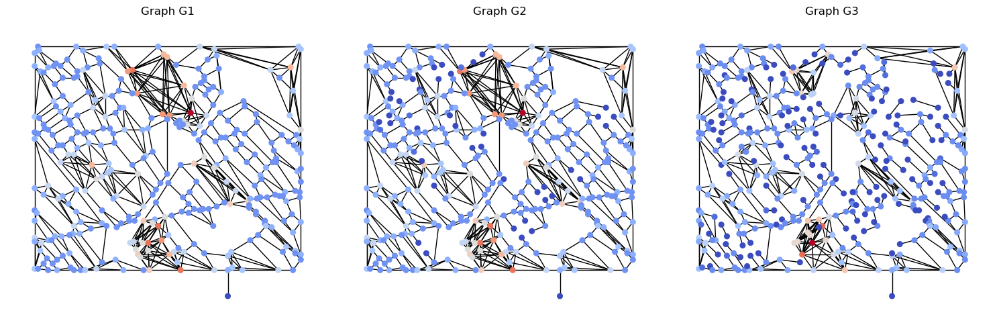

In [105]:
import pickle
import networkx as nx
import matplotlib.pyplot as plt

# Load and process the graphs
graphs = ['gt_graph/padded_clover175x240.pickle', 'disconnected_clover.pickle', 'disconnected_clover4.pickle']
Gs = []
poss = []


for graph in graphs:
    with open(graph, 'rb') as f:
        G, pos = pickle.load(f)
        G, pos = add_node0(G, pos)
        Gs.append(G)
        poss.append(pos)

# Setup the matplotlib subplot configuration
fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 3 subplots in a row

# Plot each graph
titles = ['Graph G1', 'Graph G2', 'Graph G3']
for i, (G, pos) in enumerate(zip(Gs, poss)):
    degrees = [G.degree[n] for n in G.nodes()]
    nx.draw(G, pos, ax=axs[i], node_size=30, nodelist=G.nodes(), node_color=degrees, 
            with_labels=False, cmap=plt.cm.coolwarm, vmin=min(degrees), vmax=max(degrees))
    axs[i].set_title(titles[i])

plt.tight_layout()
plt.show()


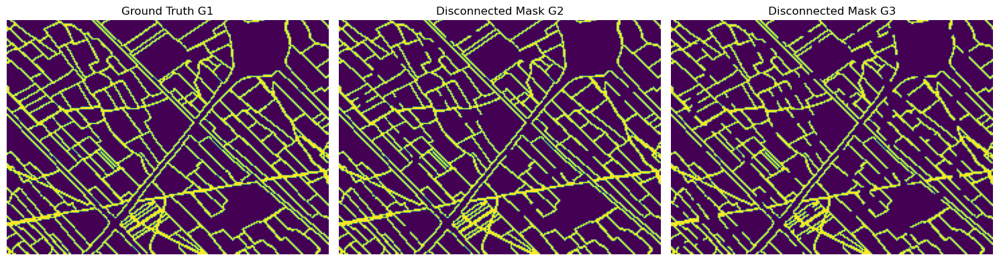

In [110]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# List of image paths
image_paths = ['clover175x240.png', 'disconnected_clover.png', 'disconnected_clover3.png']
titles = ['Ground Truth G1', 'Disconnected Mask G2', 'Disconnected Mask G3']

# Setup the matplotlib subplot configuration
fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 3 subplots in a row

# Load and display each image
for ax, img_path, title in zip(axs, image_paths, titles):
    img = mpimg.imread(img_path)
    if len(img.shape)>2:
        ax.imshow(img[:,:,-1])
    else:
        ax.imshow(img)
    ax.set_title(title)
    ax.axis('off')  # Hide axes ticks

plt.tight_layout()
plt.show()


In [90]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from pysal.lib import weights
from pysal.explore import esda
import random

def globalMoran(G, values):
    W = weights.contiguity.Queen.from_networkx(G)
    W.transform = 'R' 
    moran_global = esda.moran.Moran(values, W)
    return moran_global
    
mode = 'node_degree'
Gsp = [[G1, pos1], [G2, pos2], [G4, pos4]]
for gl in Gsp:
    gl = add_node0(gl[0], gl[1])
    g = gl[0]
    if mode=='escpe_distance':
        distances = distance_to_nearest_degree_one(g)
        dist_values = np.array([dist for dist in distances.values() if dist is not None])
    elif mode == 'node_degree':
        node_degrees = g.degree()
        dist_values = [degree for node, degree in node_degrees]
    moran_global = globalMoran(g, dist_values)
    print(f"Global Moran's I: {moran_global.I}")
    # print(f"Expected I (H0): {moran_global.EI}")
    print(f"P-value of the observed index: {moran_global.p_sim} \n")



Global Moran's I: 0.6638226570294813
P-value of the observed index: 0.001 

Global Moran's I: 0.5455861499909631
P-value of the observed index: 0.001 

Global Moran's I: 0.4587830313385953
P-value of the observed index: 0.001 



In [111]:
import pickle
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from pysal.lib import weights
from pysal.explore import esda
import random

def globalMoran(G, values):
    W = weights.contiguity.Queen.from_networkx(G)
    W.transform = 'R' 
    moran_global = esda.moran.Moran(values, W)
    return moran_global


for i in os.listdir('graphs/padded_dirty_simple/graph'):
    pg = 'graphs/padded_dirty_simple/graph/'+i
    with open(pg, 'rb') as f:
        G, pos = pickle.load(f)
    mode = 'node_degree'
    gl = add_node0(G, pos)
    g = gl[0]
    if mode=='escpe_distance':
        distances = distance_to_nearest_degree_one(g)
        dist_values = np.array([dist for dist in distances.values() if dist is not None])
    elif mode == 'node_degree':
        node_degrees = g.degree()
        dist_values = [degree for node, degree in node_degrees]
    moran_global = globalMoran(g, dist_values)
    print(f"Global Moran's I: {moran_global.I}")
    print(f"P-value of the observed index: {moran_global.p_sim} \n")



/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)
/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 5 disconnected components.
 There is 1 island with id: 398.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)
/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 4 disconnected components.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)


Global Moran's I: 0.7416191507556272
P-value of the observed index: 0.001 

('WARNING: ', 398, ' is an island (no neighbors)')
Global Moran's I: 0.5983735899435028
P-value of the observed index: 0.001 

Global Moran's I: 0.6900463890543297
P-value of the observed index: 0.001 

Global Moran's I: 0.5257264067019961
P-value of the observed index: 0.001 

Global Moran's I: 0.47618671465011886
P-value of the observed index: 0.001 

Global Moran's I: 0.48746585896693406
P-value of the observed index: 0.001 

Global Moran's I: 0.47474804031354995
P-value of the observed index: 0.001 

Global Moran's I: 0.7744115944085399
P-value of the observed index: 0.001 

Global Moran's I: 0.4840602487139671
P-value of the observed index: 0.001 

Global Moran's I: 0.5918874685803137
P-value of the observed index: 0.001 

Global Moran's I: 0.47541862648457917
P-value of the observed index: 0.001 

Global Moran's I: 0.5050156885495622
P-value of the observed index: 0.001 



/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 5 disconnected components.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)


Global Moran's I: 0.505510888307476
P-value of the observed index: 0.001 

Global Moran's I: 0.5343708268476699
P-value of the observed index: 0.001 

Global Moran's I: 0.5974131891101104
P-value of the observed index: 0.001 

Global Moran's I: 0.4965480569752074
P-value of the observed index: 0.001 

Global Moran's I: 0.5184894886959361
P-value of the observed index: 0.001 

('WARNING: ', 400, ' is an island (no neighbors)')
('WARNING: ', 401, ' is an island (no neighbors)')
('WARNING: ', 402, ' is an island (no neighbors)')
('WARNING: ', 403, ' is an island (no neighbors)')
Global Moran's I: 0.5251496579406884
P-value of the observed index: 0.001 

Global Moran's I: 0.38102962553523406
P-value of the observed index: 0.001 



/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 8 disconnected components.
 There are 4 islands with ids: 400, 401, 402, 403.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)


Global Moran's I: 0.5091416521954849
P-value of the observed index: 0.001 

Global Moran's I: 0.38327910776741986
P-value of the observed index: 0.001 

Global Moran's I: 0.26111718088704805
P-value of the observed index: 0.001 

Global Moran's I: 0.5282031280507421
P-value of the observed index: 0.001 

Global Moran's I: 0.37219731603513334
P-value of the observed index: 0.001 

Global Moran's I: 0.4489017387123959
P-value of the observed index: 0.001 

Global Moran's I: 0.42729350028579577
P-value of the observed index: 0.001 

Global Moran's I: 0.42451838312042717
P-value of the observed index: 0.001 

Global Moran's I: 0.5509763134817177
P-value of the observed index: 0.001 

Global Moran's I: 0.33239905006261644
P-value of the observed index: 0.001 

Global Moran's I: 0.43858876750627374
P-value of the observed index: 0.001 

Global Moran's I: 0.29111439784389415
P-value of the observed index: 0.001 

Global Moran's I: 0.6179721504191379
P-value of the observed index: 0.001 

Glob

In [121]:
import os
import pickle
import networkx as nx
import numpy as np
import pandas as pd
from pysal.lib import weights
from pysal.explore import esda

def globalMoran(G, values):
    W = weights.contiguity.Queen.from_networkx(G)
    W.transform = 'R'
    moran_global = esda.moran.Moran(values, W)
    return moran_global

df_results = pd.DataFrame(columns=['name', 'Morans_I', 'p_value'])

directory = 'graphs/padded_dirty_simple/graph/'
for i in os.listdir(directory):
    try:
        pg = directory+i
        with open(pg, 'rb') as f:
            G, pos = pickle.load(f)
        mode = 'escpe_distance'
        gl = add_node0(G, pos)
        g = gl[0]
        
        if mode=='escpe_distance':
            distances = distance_to_nearest_degree_one(g)
            dist_values = np.array([dist for dist in distances.values() if dist is not None])
        elif mode == 'node_degree':
            node_degrees = g.degree()
            dist_values = [degree for node, degree in node_degrees]
    
        moran_global = globalMoran(g, dist_values)
        
        # Append results to DataFrame
        df_results = df_results._append({
            'name': i,
            'Morans_I': moran_global.I,
            'p_value': moran_global.p_sim
        }, ignore_index=True)
    except:
        print(i)

df_results


/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)
/tmp/ipykernel_1781090/1775876348.py:37: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_results = df_results._append({
/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 5 disconnected components.
 There is 1 island with id: 398.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)
/mmfs1/cm/shared/apps_local/python/3

('WARNING: ', 398, ' is an island (no neighbors)')
27_m.pickle


/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)
/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 5 disconnected components.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)
/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 4 disconnected components.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)
/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not full

('WARNING: ', 400, ' is an island (no neighbors)')
('WARNING: ', 401, ' is an island (no neighbors)')
('WARNING: ', 402, ' is an island (no neighbors)')
('WARNING: ', 403, ' is an island (no neighbors)')
40_m.pickle
30_m.pickle


/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)
/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 4 disconnected components.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)
/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)
/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not full

,name,Morans_I,p_value
0,22_m.pickle,0.917830,0.001
1,45_m.pickle,0.804064,0.001
2,32_m.pickle,0.791482,0.001
3,21_m.pickle,0.764268,0.001
4,36_m.pickle,0.773721,0.001
5,19_m.pickle,0.796514,0.001
6,14_m.pickle,0.825518,0.001
7,31_m.pickle,0.818875,0.001
8,17_m.pickle,0.854002,0.001
9,4_m.pickle,0.809819,0.001


In [122]:
df_results.describe()

,Morans_I,p_value
count,47.000000,4.700000e+01
mean,0.811307,1.000000e-03
std,0.039272,2.191847e-19
min,0.729971,1.000000e-03
25%,0.786682,1.000000e-03
50%,0.809819,1.000000e-03
75%,0.836902,1.000000e-03
max,0.917830,1.000000e-03


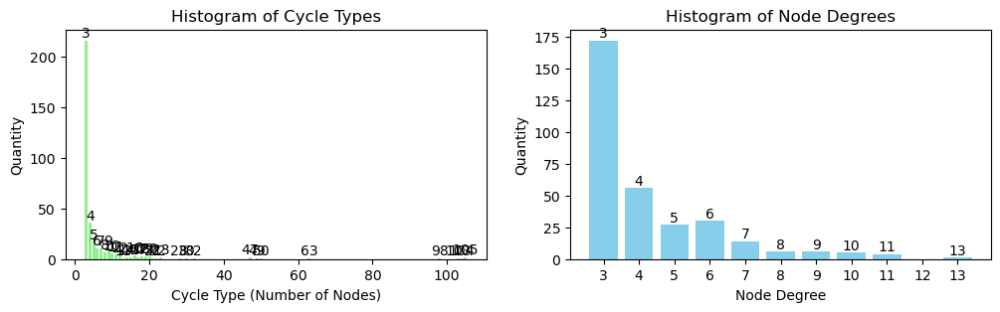

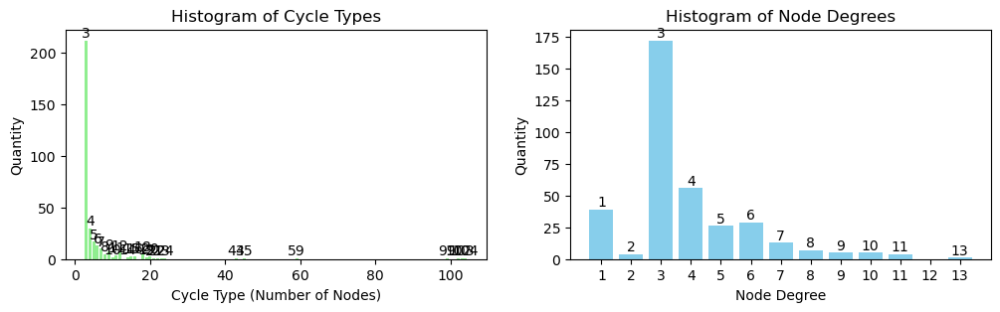

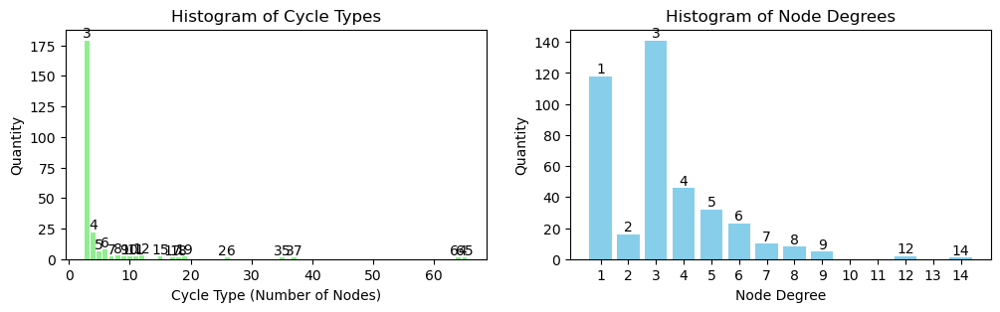

In [88]:
import networkx as nx
import matplotlib.pyplot as plt
from collections import Counter

def cycle_types_and_quantity(G):
    cycles = nx.cycle_basis(G)
    cycle_node_counts = [len(cycle) for cycle in cycles]
    cycle_type_quantity = Counter(cycle_node_counts)
    return cycle_type_quantity

# Function to plot histogram of node degrees
def plot_degree_histogram(G):
    degrees = [degree for _, degree in G.degree()]
    degree_counts = Counter(degrees)
    
    plt.bar(degree_counts.keys(), degree_counts.values(), color='skyblue')
    plt.xlabel('Node Degree')
    plt.ylabel('Quantity')
    plt.title('Histogram of Node Degrees')
    
    # Set x-ticks to cover all possible degrees
    plt.xticks(range(min(degree_counts.keys()), max(degree_counts.keys()) + 1))
    
    # Labeling all bars
    for degree, count in degree_counts.items():
        plt.text(degree, count, str(degree), ha='center', va='bottom')  # Now showing the degree
    plt.show()

# Assuming Gs is a list of NetworkX graphs
Gs = [G1, G2, G4]  # Replace G1, G2, G3, G4 with actual graph objects

for G in Gs:
    plt.figure(figsize=(12, 3))
    
    # Plot histogram of cycle types
    plt.subplot(1, 2, 1)
    cycle_types_quantity = cycle_types_and_quantity(G)
    plt.bar(cycle_types_quantity.keys(), cycle_types_quantity.values(), color='lightgreen')
    plt.xlabel('Cycle Type (Number of Nodes)')
    plt.ylabel('Quantity')
    plt.title('Histogram of Cycle Types')
    
    # Labeling each green bar with its cycle type
    for cyc, count in cycle_types_quantity.items():
        plt.text(cyc, count, str(cyc), ha='center', va='bottom')  # Showing cycle type on each bar
    
    # Plot histogram of node degrees
    plt.subplot(1, 2, 2)
    plot_degree_histogram(G)


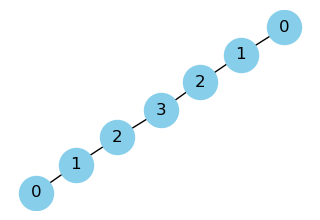

In [60]:
import networkx as nx
import matplotlib.pyplot as plt

def create_graph():
    G = nx.Graph()
    G.add_edges_from([(1, 2), (2, 3), (3, 4), (4, 5), (5, 6), (6, 7)])#, (7, 8), (8, 9), (1, 10)])
    return G

def distance_to_nearest_degree_one(G):
    degree_one_nodes = [node for node in G.nodes if G.degree(node) == 1]
    distances = {node: None for node in G.nodes()}
    if not degree_one_nodes:
        return distances
    queue = [(node, 0) for node in degree_one_nodes] 
    visited = set()
    while queue:
        current_node, dist = queue.pop(0)
        if distances[current_node] is not None and distances[current_node] <= dist:
            continue
        distances[current_node] = dist
        for neighbor in G.neighbors(current_node):
            if neighbor not in visited or (distances[neighbor] is None or distances[neighbor] > dist + 1):
                queue.append((neighbor, dist + 1))
                visited.add(neighbor)
    return distances

G = create_graph()
distances = distance_to_nearest_degree_one(G)
plt.figure(figsize=(3,2))
pos = nx.kamada_kawai_layout(G) 
nx.draw(G, pos, with_labels=False, node_color='skyblue', edge_color='k', node_size=600)
distance_labels = {node: f"{dist}" for node, dist in distances.items()}
nx.draw_networkx_labels(G, pos, labels=distance_labels, font_size=12)
plt.show()


In [46]:
import math

def max_cycles_count(n):
    cys = 0
    for i in range(3,n+1,1):
        cys += math.factorial(n)/(math.factorial(n-i)*math.factorial(i))
    return cys

n = 300
max_cycles = max_cycles_count(n)
print(f"Maximum number of cycles in a complete graph with {n} nodes: {max_cycles}")


Maximum number of cycles in a complete graph with 300 nodes: 2.037035976334486e+90


/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/ripser/ripser.py:247: UserWarning: The input matrix is square, but the distance_matrix flag is off.  Did you mean to indicate that this was a distance matrix?
  warnings.warn(
/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/ripser/ripser.py:247: UserWarning: The input matrix is square, but the distance_matrix flag is off.  Did you mean to indicate that this was a distance matrix?
  warnings.warn(


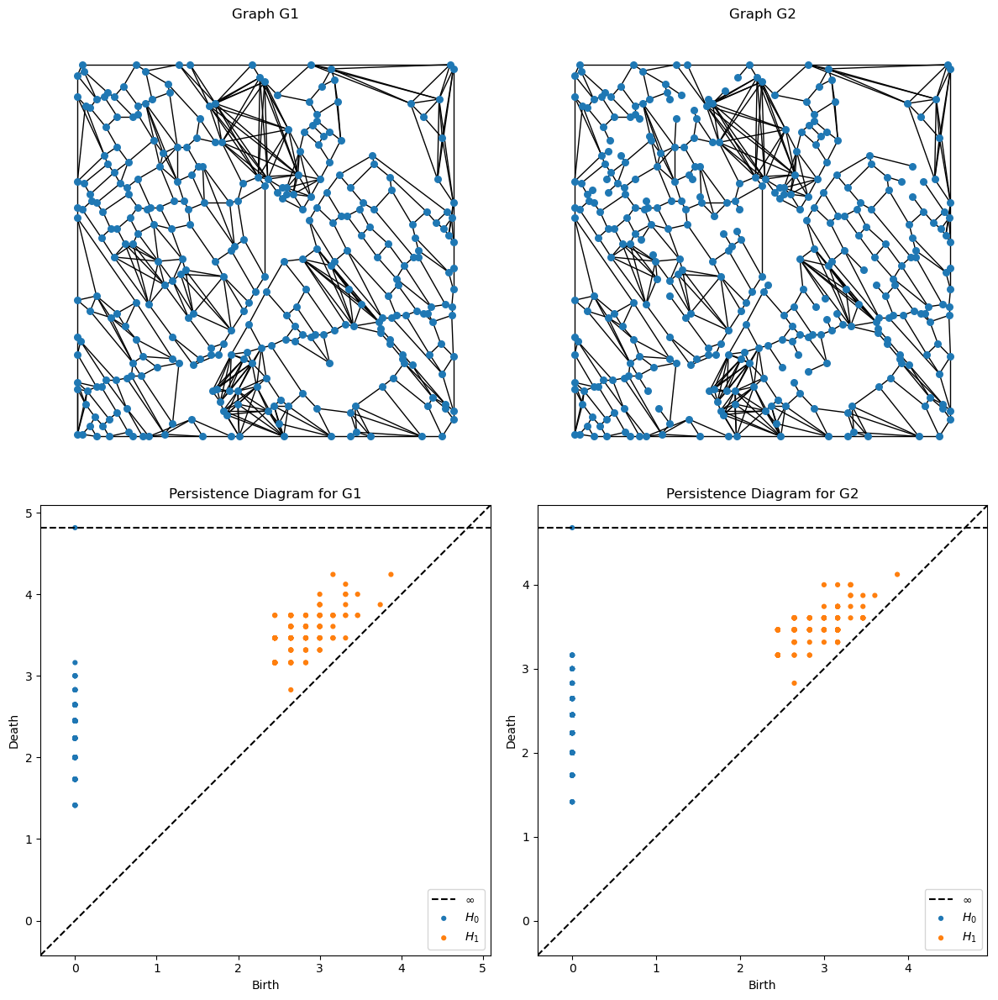

In [37]:
import numpy as np
import networkx as nx
from ripser import ripser
from persim import plot_diagrams
import matplotlib.pyplot as plt

def plot_graph_persistence_and_graphs(G1, G2):
    plt.rcParams["text.usetex"] = False

    def compute_persistence_diagram(G):
        # Convert graph to adjacency matrix
        adj_matrix = nx.adjacency_matrix(G).toarray()
        
        # Convert adjacency matrix to distance matrix for Ripser
        distance_matrix = np.where(adj_matrix == 0, 2, 1)
        np.fill_diagonal(distance_matrix, 0)  # No self-loops, hence distance is zero

        # Calculate the persistence diagram
        return ripser(distance_matrix, maxdim=1)['dgms']

    # Compute persistence diagrams for both graphs
    diagrams1 = compute_persistence_diagram(G1)
    diagrams2 = compute_persistence_diagram(G2)

    # Create figure and subplots
    fig, ax = plt.subplots(2, 2, figsize=(12, 12))  # Adjust the size as needed

    # Plot the graphs
    plt.sca(ax[0, 0])
    nx.draw(G1, pos1, node_size=30, with_labels=False)
    ax[0, 0].set_title('Graph G1')

    plt.sca(ax[0, 1])
    nx.draw(G2, pos2, node_size=30, with_labels=False)
    ax[0, 1].set_title('Graph G2')

    # Plot persistence diagrams
    plt.sca(ax[1, 0])
    plot_diagrams(diagrams1, show=False)
    ax[1, 0].set_title('Persistence Diagram for G1')

    plt.sca(ax[1, 1])
    plot_diagrams(diagrams2, show=False)
    ax[1, 1].set_title('Persistence Diagram for G2')

    # Show the plots
    plt.tight_layout()
    plt.show()

# Example usage with two graphs
# G1 = nx.random_geometric_graph(100, 0.125)
# G2 = nx.watts_strogatz_graph(30, 6, 0.2)
plot_graph_persistence_and_graphs(G1, G2)


In [ ]:
distance_matrix

In [ ]:
import networkx as nx
import numpy as np
import pickle

def calculate_topological_score(G, alpha=1, beta=1, gamma=1):
    global fiedler_value 
    global spectral_gap 
    global degenerate_nodes
    # Compute the Laplacian matrix and its eigenvalues
    L = nx.laplacian_matrix(G).astype(float)
    eigenvalues = np.linalg.eigvalsh(L.A)
    eigenvalues.sort()

    # Calculate metrics
    zero_eigenvalues = np.count_nonzero(eigenvalues == 0)
    if zero_eigenvalues < len(eigenvalues) - 1:
        fiedler_value = eigenvalues[zero_eigenvalues + 1]
        spectral_gap = eigenvalues[zero_eigenvalues + 2] - fiedler_value
    else:
        fiedler_value = 0
        spectral_gap = 0

    # Calculate count of degenerate nodes
    degree_sequence = [deg for node, deg in G.degree()]
    degenerate_nodes = degree_sequence.count(1) + degree_sequence.count(0)

    # Calculate topological score
    topological_score = alpha * fiedler_value + beta * spectral_gap - gamma * degenerate_nodes
    terms = [fiedler_value, spectral_gap, degenerate_nodes]
    return topological_score, terms

def graph_eigen(pdir):
    coeff = []
    mets = []
    for peg in os.listdir(pdir):
        if peg.endswith('.pickle'):
            with open(pdir+peg, 'rb') as f:
                G, pos = pickle.load(f)
            score, terms = calculate_topological_score(G, alpha=100, beta=100, gamma=0)
            mets.append(score)
            coeff.append(terms)
    return mets, coeff



In [ ]:
pdir_gt = 'gt_graph/'
pc_gt = graph_eigen(pdir_gt)
print(pc_gt)

In [ ]:
res = {}
for fol in os.listdir('graphs'):
    if not fol.startswith('.'):
        pdir = f'graphs/{fol}/graph/'
        pc_topo, coeffs = graph_eigen(pdir)
        np_matrix = np.array(coeffs)
        coeff_averages = np.mean(np_matrix, axis=0)
        res[fol] = {'Value': np.average(pc_topo), 'Terms': coeff_averages}
        # res.update({fol : {{'T_Score': np.average(pc_topo)}, {'Terms': coeff_averages}}})

# pdir_gt = 'gt_graph/'
# pc_gt = graph_eigen(pdir_gt)
# print(pc_gt)
res

In [ ]:
rows = []
for key, val in res.items():
    row = {'Category': key, 'Value': val['Value']}
    # Split 'Terms' array into separate columns
    for idx, term in enumerate(val['Terms']):
        row[f'Term_{idx+1}'] = term
    rows.append(row)

df = pd.DataFrame(rows)
df = df.sort_values('Value').reset_index(drop=True)

newn = {'Term_1': 'fiedler_value', 'Term_2': 'spectral_gap' , 'Term_3': 'degenerate_nodes'}



In [ ]:
df.rename(columns=newn)

# [1.5270051978523322], [[0.008379381238792725, 0.006890670739730598, 0]
                       

In [ ]:

#                         Value       fiedler_value  spectral_gap 	degenerate_nodes
# padded_dirty_simple 	1.244681 	0.004589 	0.007858 	40.34
# padded_cleaned_topo 	2.845249 	0.012604 	0.015848 	0.50
# gt                      2.154423    0.010852    0.010692    0 

import matplotlib.pyplot as plt
import numpy as np

# Data
categories = ['padded_dirty_simple', 'padded_cleaned_topo', 'gt']
values = {
    'Value': [1.244681, 2.845249, 2.154423],
    'fiedler_value': [0.004589, 0.012604, 0.010852],
    'spectral_gap': [0.007858, 0.015848, 0.010692],
    # 'degenerate_nodes': [40.34, 0.50, 0]
}

x = np.arange(len(categories))
width = 0.2

# Plotting
fig, ax = plt.subplots()
bars = []

for i, (label, data) in enumerate(values.items()):
    bar = ax.bar(x + i * width, data, width, label=label)

# Adding labels
ax.set_xlabel('Categories')
ax.set_ylabel('Values')
ax.set_title('Comparison of Values by Category')
ax.set_xticks(x + width * (len(values) - 1) / 2)
ax.set_xticklabels(categories)
ax.legend()

plt.show()


In [ ]:
# -0.010852*100 + 2.154423

1.069223/100

In [ ]:

np_matrix = np.array([[1,2,3], [4,5,6], [6,7,8]])
column_averages = np.mean(np_matrix, axis=0)
column_averages

In [ ]:

df = pd.DataFrame(list(res.items()), columns=['Category', 'Value'])
df.sort_values('Value')

In [ ]:
pdir_gt = 'gt_graph/'
pc_gt = graph_eigen(pdir_gt)
print(pc_gt)

                        0.015270051978523323
 'padded_cleaned_topo': 0.02845248794945373
 'padded_dirty_simple': 0.012446814876268414


In [ ]:
print(fiedler_value) 
print(spectral_gap) 
print(degenerate_nodes)

In [ ]:
print(fiedler_value) 
print(spectral_gap) 
print(degenerate_nodes)

In [ ]:
# pdir = 'graphs/dirty_topo/graph/'
# pc_tood = graph_eigen(pdir)
# pdir_gt = 'gt_graph/'
# pc_gup = graph_eigen(pdir_gt)
# pc_topo
# pc_gt
# np.average(pc_simple)
# np.average(pc_topo)

print('gt paded = ', np.average(pc_gp))
print('gt unpad = ', np.average(pc_gup))

print('dirty topo = ', np.average(pc_tood))
print('cleaned topo = ', np.average(pc_ct))

print('dirty simple = ', np.average(pc_ds))
print('cleaned simple = ', np.average(pc_cs))

print('padded cleaned topo = ', np.average(pc_topo))
print('padded dirty topo = ', np.average(pc_topod))

print('padded cleaned simple = ', np.average(pc_pcsimple))
print('padded dirty simple = ', np.average(pc_simple))


In [ ]:
pdir_gt = 'gt_graph/'
pc_gp = graph_eigen(pdir_gt)

In [ ]:
import networkx as nx
import pandas as pd
import numpy as np

def compute_graph_metrics(G):
    # Calculating different metrics
    cyclomatic_number = G.number_of_edges() - G.number_of_nodes() + nx.number_connected_components(G)
    density = nx.density(G)
    avg_clustering_coefficient = nx.average_clustering(G)
    global_efficiency = nx.global_efficiency(G)

    # Algebraic connectivity
    L = nx.laplacian_matrix(G).astype(float)  # Get Laplacian matrix of G
    eigenvalues = np.linalg.eigvals(L.A)  # Compute eigenvalues of the Laplacian matrix
    eigenvalues.sort()  # The eigenvalues are returned in no particular order
    algebraic_connectivity = eigenvalues[1]  # Fiedler value is the second-smallest eigenvalue

    # Create a dictionary of the metrics
    metrics = {
        'Cyclomatic Number': cyclomatic_number,
        'Density': density,
        'Average Clustering Coefficient': avg_clustering_coefficient,
        'Global Efficiency': global_efficiency,
        'Algebraic Connectivity': algebraic_connectivity
    }

    # Convert dictionary to pandas DataFrame
    metrics_df = pd.DataFrame([metrics])
    
    return metrics_df

pg = 'gt_graph/padded_clover175x240.pickle'
with open(pg, 'rb') as f:
    G, pos = pickle.load(f)
    
df_metrics = compute_graph_metrics(G)
df_metrics


In [ ]:
pg = 'gt_graph/clover175x240.pickle'
with open(pg, 'rb') as f:
    G, pos = pickle.load(f)
    
df_metrics = compute_graph_metrics(G)
df_metrics

In [ ]:
import pickle
import networkx as nx
def graph_cyclomatic(pdir):
    c = 0
    for peg in os.listdir(pdir):
        
        if peg.endswith('.pickle'):
            with open(pdir+peg, 'rb') as f:
                G, pos = pickle.load(f)
            if c==0:
                dfs = compute_graph_metrics(G)
            else:
                dfs = pd.concat([dfs, compute_graph_metrics(G)], ignore_index=True)
            c+=1
    return dfs
    
pdir = 'graphs/padded_cleaned_topo/graph/'
pc_topo = graph_cyclomatic(pdir)

pdir_s = 'graphs/padded_dirty_simple/graph/'
pc_simple = graph_cyclomatic(pdir_s)

pdir_gt = 'gt_graph/'
pc_gt = graph_cyclomatic(pdir_gt)


In [ ]:
pc_gt.mean()

In [ ]:
pc_simple.mean()

In [ ]:
pc_topo.mean()

pc_gt.mean()

Cyclomatic Number                 361.000000
Density                             0.013259
Average Clustering Coefficient      0.264994
Global Efficiency                   0.128150
Algebraic Connectivity              0.008379
dtype: float64

pc_simple.mean()

Cyclomatic Number                 357.700000+  0.000000j
Density                             0.009708+  0.000000j
Average Clustering Coefficient      0.257584+  0.000000j
Global Efficiency                   0.124624+  0.000000j
Algebraic Connectivity              0.003786-  0.000000j
dtype: complex128

pc_topo.mean()

Cyclomatic Number                 483.600000
Density                             0.009262
Average Clustering Coefficient      0.269055
Global Efficiency                   0.121142
Algebraic Connectivity              0.012314
dtype: float64



The provided results from your graph analysis for three different sets of masks—the ground truth (gt), 50 simple fake masks (simple), and 50 topologically improved fake masks (topo)—offer insightful data points regarding the structural differences and similarities among these groups. Here’s an interpretation of each metric and what it indicates about the masks:

### Cyclomatic Number
- **Ground Truth (GT):** A cyclomatic number of 361 suggests a relatively high complexity and number of cycles in the network.
- **Simple Fake Masks:** A cyclomatic number slightly lower at 357.7 suggests these masks are somewhat less complex in terms of cycles and paths compared to the GT.
- **Topologically Improved Masks:** Shows a significant increase to 483.6, indicating a higher complexity and more loop structures than both the GT and simple masks. This suggests effective improvement in introducing more cycles, possibly making these masks structurally closer to complex biological structures.

### Density
- **GT:** A density of 0.013259 indicates a moderate level of overall connectivity relative to the number of possible connections.
- **Simple:** Lower density (0.009708) suggests sparser connectivity, which aligns with the generally lower complexity and possibly fewer meaningful connections.
- **Topo:** Also shows a slightly lower density than GT at 0.009262, though this isn't much different from the simple masks. Despite more cycles, the total possible connections compared to GT are fewer, likely due to more localized connections.

### Average Clustering Coefficient
- **GT:** An average clustering coefficient of 0.264994 suggests a moderate degree of nodes clustering together.
- **Simple:** Slightly lower at 0.257584, indicating less clustering or local neighborhood connectivity.
- **Topo:** Shows an improvement to 0.269055, which is higher than both GT and simple masks, suggesting enhanced local connectivity and node clustering.

### Global Efficiency
- **GT:** Global efficiency at 0.128150 points to a moderate efficiency in information or signal flow across the network.
- **Simple:** A decrease to 0.124624 indicates less efficient overall connectivity.
- **Topo:** The lowest efficiency at 0.121142, despite the increase in cycles and clustering, which might suggest that while there are more loops, the overall network structure might not facilitate as efficient global communication.

### Algebraic Connectivity
- **GT:** At 0.008379, indicates that the network is fairly robust but could be susceptible to disconnection.
- **Simple:** Much lower at 0.003786, suggesting these masks are less robust and more vulnerable to being split into disconnected parts.
- **Topo:** Shows a significant improvement to 0.012314, higher than both GT and simple masks, indicating a more robust and better-connected graph.

### Additional Notes
- **Complex Numbers:** It's noteworthy that the results for the simple masks have complex number components. This usually occurs when computing metrics that involve eigenvalues (like algebraic connectivity), which could result in complex numbers if the graph's Laplacian matrix isn't properly handled or due to numerical issues.

### Summary
Overall, while the topologically improved masks have lower global efficiency, they demonstrate significant improvements in cyclomatic number and algebraic connectivity, pointing to a structure that is both more complex and robust, with better local connectivity (clustering). The slightly lower density and global efficiency might be trade-offs for achieving more meaningful structural features such as cycles and robust connectivity, which are often more biologically relevant in certain applications like modeling biological tissues or networks.



In [ ]:
import pickle
import networkx as nx
# pg = 'graphs/padded_dirty_topo/graph/31_m.pickle'
pg1 = 'gt_graph/padded_clover175x240.pickle'
pg2 = 'disconnected_clover.pickle'
pg3 = 'disconnected_clover2.pickle'
pg4 = 'disconnected_clover4.pickle'
# pg3 = 'disconnected_clover33.pickle'
with open(pg1, 'rb') as f:
    G1, pos1 = pickle.load(f)

with open(pg2, 'rb') as f:
    G2, pos2 = pickle.load(f)

with open(pg3, 'rb') as f:
    G3, pos3 = pickle.load(f)

with open(pg4, 'rb') as f:
    G4, pos4 = pickle.load(f)
# nx.draw(G, pos, with_labels=False, node_color='skyblue', node_size=50, edge_color='k')



In [ ]:
import networkx as nx



# Function to calculate the local clustering coefficient for each node
def local_clustering_coefficients(G):
    return nx.clustering(G)

# Function to calculate the average clustering coefficient
def average_clustering_coefficient(G):
    return nx.average_clustering(G)

# Function to calculate transitivity
def transitivity(G):
    return nx.transitivity(G)

# Display the local clustering coefficients
print("Local Clustering Coefficients:")
for node, coeff in local_clustering_coefficients(G).items():
    print(f"Node {node}: {coeff}")

# Display the average clustering coefficient
print("\nAverage Clustering Coefficient:")
print(average_clustering_coefficient(G))

# Display the transitivity
print("\nTransitivity:")
print(transitivity(G))


/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/spaghetti/network.py:42: FutureWarning: The next major release of pysal/spaghetti (2.0.0) will drop support for all ``libpysal.cg`` geometries. This change is a first step in refactoring ``spaghetti`` that is expected to result in dramatically reduced runtimes for network instantiation and operations. Users currently requiring network and point pattern input as ``libpysal.cg`` geometries should prepare for this simply by converting to ``shapely`` geometries.
  warnings.warn(dep_msg, FutureWarning, stacklevel=1)
/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [50]:
import pickle
import networkx as nx
pg = 'gt_graph/padded_clover175x240.pickle'

with open(pg, 'rb') as f:
    G, pos = pickle.load(f)
node_degrees = G.degree()
values = np.array([degree for node, degree in node_degrees])
res, lm = localMoran(G, pos, values, plot=False)
dfff = (100*res[res['p_sim']<=0.05].groupby('q').count()/len(res)).reset_index().iloc[:,0:2]
print(dfff.q)
for i in [1,2,3,4]:
    if i not in list(dfff['q']):
        new_row = {'q':i, 'Node':0}
        dfff = dfff._append(new_row, ignore_index=True)
replacement_map = {
                    1: 'HH',
                    3: 'LH',
                    2: 'LL',
                    4: 'HL'
                }
dfff['q'] = dfff['q'].replace(replacement_map)
dfff

ValueError: too many values to unpack (expected 2)

In [ ]:
import pickle
import numpy as np
import networkx as nx
# pg = 'gt_graph/padded_clover175x240.pickle'
pg = 'graphs/dirty_simple/graph/1_m.pickle'

c=1
for i in os.listdir('graphs/padded_dirty_simple/graph'):
    pg = 'graphs/padded_dirty_simple/graph/'+i
    with open(pg, 'rb') as f:
        G, pos = pickle.load(f)
    
    eigenvector_centralities = nx.eigenvector_centrality_numpy(G, max_iter=1000)
    values = np.array([eigenvector_centralities[node] for node in G.nodes()])
    
    res, lm = localMoran(G, pos, values, plot=False)
    dfff_p = (100*res[res['p_sim']<=0.05].groupby('q').count()/len(res)).reset_index().iloc[:,0:2]
    print(dfff_p.q)
    for i in [1,2,3,4]:
        if i not in list(dfff_p['q'].astype('int')):
            new_row = {'q':i, 'Node':0}
            dfff_p = dfff_p._append(new_row, ignore_index=True)
    replacement_map = {
                        1: 'HH',
                        3: 'LH',
                        2: 'LL',
                        4: 'HL'
                    }
    dfff_p['q'] = dfff_p['q'].replace(replacement_map)
    print(dfff_p.T)
    
    # if c>4:
    #     break
    c+=1

In [ ]:
type(lm.q[0])

In [ ]:
dfff_p['q'].astype('int')

In [ ]:
import pickle
import numpy as np
import networkx as nx
# pg = 'gt_graph/padded_clover175x240.pickle'
# pg = 'graphs/dirty_simple/graph/7_m.pickle'
c=0
for i in os.listdir('graphs/padded_dirty_simple/graph'):
    pg = 'graphs/padded_dirty_simple/graph/'+i
    with open(pg, 'rb') as f:
        G, pos = pickle.load(f)
    
    eigenvector_centralities = nx.eigenvector_centrality_numpy(G, max_iter=1000)
    values = np.array([eigenvector_centralities[node] for node in G.nodes()])
    
    res = localMoran(G, pos, values, plot=False)
    dfff_p = (100*res[res['p_sim']<=0.05].groupby('q').count()/len(res)).reset_index().iloc[:,0:2]
    for i in [1,2,3,4]:
        if i not in list(dfff_p['q'].astype('int')):
            new_row = {'q':i, 'Node':0}
            dfff_p = dfff_p._append(new_row, ignore_index=True)
    replacement_map = {
                        1: 'HH',
                        3: 'LH',
                        2: 'LL',
                        4: 'HL'
                    }
    dfff_p['q'] = dfff_p['q'].replace(replacement_map)
    print(c)
    c+=1
    # print(dfff_p.T['LL'])
    print(float(dfff_p[dfff_p['q']=='LL']['Node']))


In [ ]:
float(dfff_p[dfff_p['q']=='LL']['Node'])

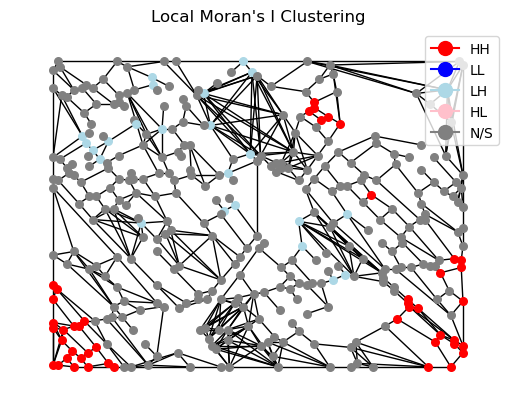

,0,1,2,3
q,HH,LH,LL,HL
Node,12.742382,6.371191,0.0,0.0


In [60]:
import pickle
import numpy as np
import networkx as nx
pg = 'gt_graph/padded_clover175x240.pickle'

with open(pg, 'rb') as f:
    G, pos = pickle.load(f)


def distance_to_nearest_degree_one(G):
    degree_one_nodes = [node for node in G.nodes if G.degree(node) == 1]
    distances = {node: None for node in G.nodes()}
    if not degree_one_nodes:
        return distances
    queue = [(node, 0) for node in degree_one_nodes]
    visited = set()
    while queue:
        current_node, dist = queue.pop(0)
        if distances[current_node] is not None and distances[current_node] <= dist:
            continue
        distances[current_node] = dist
        for neighbor in G.neighbors(current_node):
            if neighbor not in visited or (distances[neighbor] is None or distances[neighbor] > dist + 1):
                queue.append((neighbor, dist + 1))
                visited.add(neighbor)
    return distances

distances = distance_to_nearest_degree_one(G2)
values = np.array(list(distances.values()))

# eigenvector_centralities = nx.eigenvector_centrality_numpy(G, max_iter=1000)
# values = np.array([eigenvector_centralities[node] for node in G.nodes()])

res = localMoran(G2, pos2, values, plot=True)
dfff_p = (100*res[res['p_sim']<=0.05].groupby('q').count()/len(res)).reset_index().iloc[:,0:2]
for i in [1,2,3,4]:
    if i not in list(dfff_p['q']):
        new_row = {'q':i, 'Node':0}
        dfff_p = dfff_p._append(new_row, ignore_index=True)
replacement_map = {
                    1: 'HH',
                    3: 'LH',
                    2: 'LL',
                    4: 'HL'
                }
dfff_p['q'] = dfff_p['q'].replace(replacement_map)
dfff_p.T


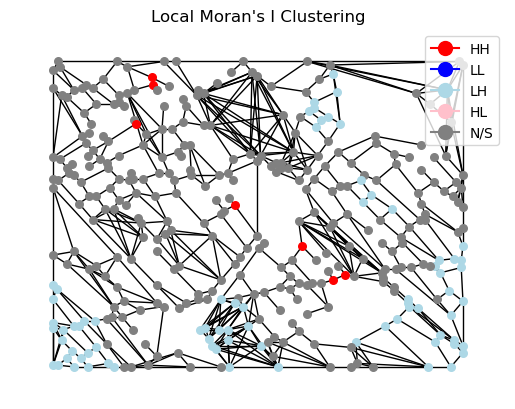

Results for Graph 1:
             0          1    2    3
q           HH         LH   LL   HL
Node  2.216066  21.052632  0.0  0.0


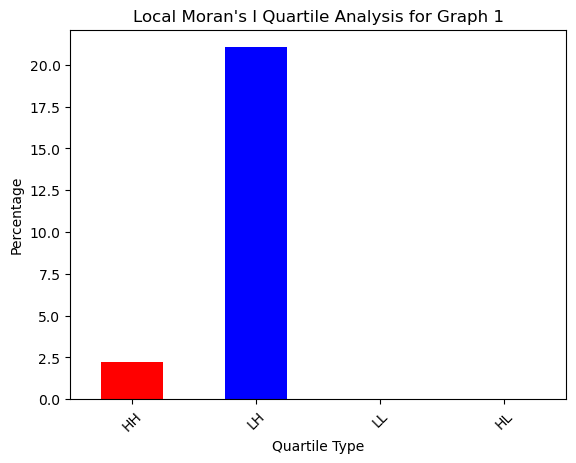

/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)


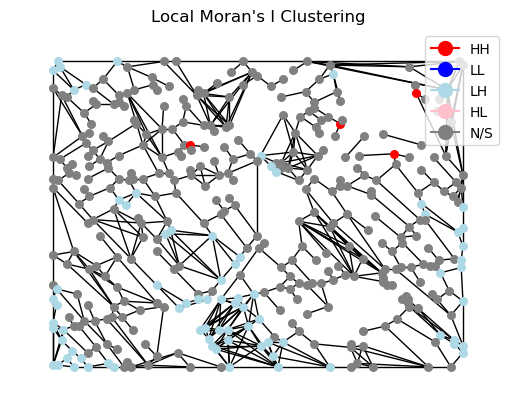

Results for Graph 2:
             0          1    2    3
q           HH         LH   LL   HL
Node  1.007557  19.395466  0.0  0.0


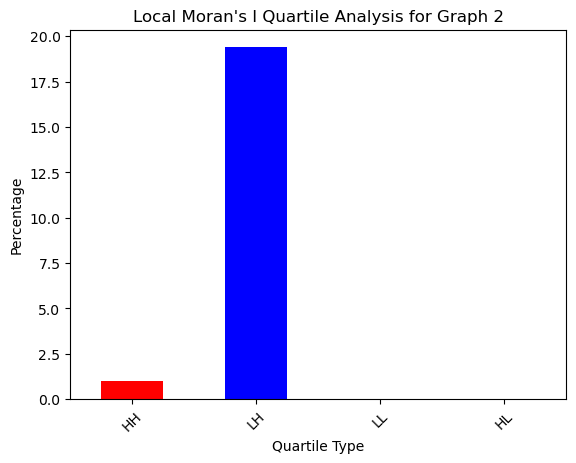

/mmfs1/cm/shared/apps_local/python/3.11/envs/torch2.2/lib/python3.12/site-packages/libpysal/weights/weights.py:1685: UserWarning: The weights matrix is not fully connected: 
 There are 6 disconnected components.
  w = W(neighbors, weights, ids, silence_warnings=silence_warnings)


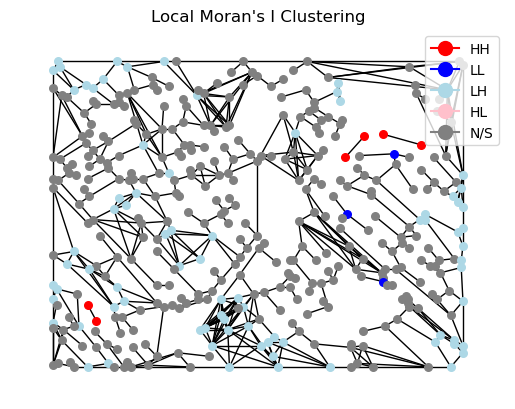

Results for Graph 3:
             0         1          2    3
q           HH        LL         LH   HL
Node  1.492537  0.746269  19.651741  0.0


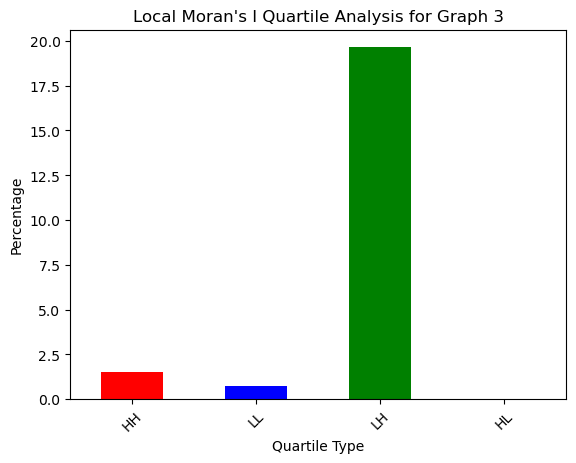

In [70]:
# import numpy as np
# import networkx as nx
# import pandas as pd
# import matplotlib.pyplot as plt

# # Assuming localMoran and distance_to_nearest_degree_one are defined elsewhere
# # Ensure you've defined pos1, pos2, pos3, pos4 corresponding to G1, G2, G3, G4 respectively
# positions = [pos2, pos3, pos4]  # Make sure to define these before using them

# Gs = [G2, G3, G4]  # The graphs you want to analyze

# for idx, G in enumerate(Gs):
#     pos = positions[idx]
#     # distances = distance_to_nearest_degree_one(G)
#     distances = distance_to_nearest_degree_one(G)
#     values = np.array(list(distances.values()))
#     values = 1/(values+1)

#     # Assuming localMoran is adapted to handle positions and values
#     res = localMoran(G, pos, values, plot=True)
#     dfff_p = (100 * res[res['p_sim'] <= 0.05].groupby('q').count() / len(res)).reset_index().iloc[:, 0:2]

#     # Ensure that all quartiles are represented
#     for i in [1, 2, 3, 4]:
#         if i not in list(dfff_p['q']):
#             new_row = pd.DataFrame({'q': [i], 'Node': [0]})
#             dfff_p = pd.concat([dfff_p, new_row], ignore_index=True)

#     replacement_map = {
#         1: 'HH',
#         2: 'LL',
#         3: 'LH',
#         4: 'HL'
#     }
#     dfff_p['q'] = dfff_p['q'].replace(replacement_map)
    
#     print(f"Results for Graph {idx + 1}:")
#     print(dfff_p.T)  # Transpose for better readability

#     # Optional: Plotting the result as bar chart for visual comparison
#     plt.figure()
#     dfff_p.set_index('q')['Node'].plot(kind='bar', color=['red', 'blue', 'green', 'purple'])
#     plt.title(f'Local Moran\'s I Quartile Analysis for Graph {idx + 1}')
#     plt.ylabel('Percentage')
#     plt.xlabel('Quartile Type')
#     plt.xticks(rotation=45)
#     plt.show()


In [76]:
import numpy as np
from scipy.stats import wasserstein_distance

def normalize_histogram(hist):
    return hist / np.sum(hist)

overall_min = min(min(sublist) for sublist in dist_v_l if sublist)
overall_max = max(max(sublist) for sublist in dist_v_l if sublist)
bins = range(overall_min, overall_max + 2)

for i, l1 in enumerate(dist_v_l):
    for j in range(i + 1, len(dist_v_l)):  # Start j from i+1
        l2 = dist_v_l[j]
        
        hist1, _ = np.histogram(l1, bins=bins) 
        hist2, _ = np.histogram(l2, bins=bins)

        # Normalize histograms
        hist1_normalized = normalize_histogram(hist1)
        hist2_normalized = normalize_histogram(hist2)

        # Display i and j (1-based indexing for display)
        print('i, j = ', i+1, j+1)
        
        # Calculate Earth Mover's Distance
        emd = wasserstein_distance(hist1_normalized, hist2_normalized)
        print("Earth Mover's Distance:", emd)

        # Calculate Euclidean Distance
        euclidean_distance = np.linalg.norm(hist1_normalized - hist2_normalized)
        print("Euclidean Distance:", euclidean_distance)
        

i, j =  1 2
Earth Mover's Distance: 0.040051075587683255
Euclidean Distance: 0.19457838728806834
i, j =  1 3
Earth Mover's Distance: 0.05178325056772157
Euclidean Distance: 0.31413073910877914
i, j =  2 3
Earth Mover's Distance: 0.029538843704789788
Euclidean Distance: 0.1374957916124687


In [82]:
import numpy as np
from pprint import pprint
import scipy.stats as stats
import matplotlib.pyplot as plt

# Function to compute metrics
def compute_statistics(data):
    metrics = {}
    metrics['mean'] = np.mean(data)
    metrics['median'] = np.median(data)
    metrics['variance'] = np.var(data)
    metrics['standard_deviation'] = np.std(data)
    metrics['min'] = np.min(data)
    metrics['max'] = np.max(data)
    metrics['skewness'] = stats.skew(data)
    metrics['kurtosis'] = stats.kurtosis(data)
    metrics['25th_percentile'] = np.percentile(data, 25)
    metrics['50th_percentile'] = np.percentile(data, 50)  # same as median
    metrics['75th_percentile'] = np.percentile(data, 75)
    return metrics

def plot_histogram(data, title="Histogram"):
    plt.figure()
    plt.hist(data, bins=range(int(min(data)), int(max(data))+2), edgecolor='black')
    plt.title(title)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

for list1 in dist_v_l:
    stats_list1 = compute_statistics(list1)
    pprint(stats_list1)
    print('\n')
    # plot_histogram(list1, "Histogram for List 1")


{'25th_percentile': 2.0,
 '50th_percentile': 3.0,
 '75th_percentile': 4.0,
 'kurtosis': 0.25420181974346034,
 'max': 8,
 'mean': 2.858725761772853,
 'median': 3.0,
 'min': 0,
 'skewness': 0.5480136866180004,
 'standard_deviation': 1.8215355412721144,
 'variance': 3.317991728117495}


{'25th_percentile': 1.0,
 '50th_percentile': 2.0,
 '75th_percentile': 3.0,
 'kurtosis': -0.8817478247919435,
 'max': 5,
 'mean': 1.778337531486146,
 'median': 2.0,
 'min': 0,
 'skewness': 0.12140679438901081,
 'standard_deviation': 1.2622135835131032,
 'variance': 1.5931831304049895}


{'25th_percentile': 0.0,
 '50th_percentile': 1.0,
 '75th_percentile': 2.0,
 'kurtosis': -0.6612754963883791,
 'max': 5,
 'mean': 1.3507462686567164,
 'median': 1.0,
 'min': 0,
 'skewness': 0.3604158629759147,
 'standard_deviation': 1.1169708237875082,
 'variance': 1.2476238211925448}




In [ ]:
eigenvector_centralities = nx.eigenvector_centrality_numpy(G, max_iter=1000)
values = np.array([eigenvector_centralities[node] for node in G.nodes()])

In [ ]:
import os
stats_total2 = []
for popo in os.listdir('graphs'):
    if not popo.startswith('.'):
        pg = f'graphs/{popo}/graph/'
        stats = []
        for f in os.listdir(pg):
        # pg = 'graphs/dirty_topo/graph/31_m.pickle'
            if f.endswith('.pickle'):
                with open(pg + f, 'rb') as f:
                    G, pos = pickle.load(f)
                # node_degrees = G.degree()
                # values = np.array([degree for node, degree in node_degrees])
                
                # clustering_coefficients = nx.clustering(G)
                # values = np.array([clustering_coefficients[node] for node in G.nodes])
    
                eigenvector_centralities = nx.eigenvector_centrality_numpy(G, max_iter=1000)
                values = np.array([eigenvector_centralities[node] for node in G.nodes()])
    
                res = localMoran(G, pos, values)
                # l = [list(res[res['p_sim']<=0.05].groupby('q').count().iloc[:,0]), len(res), popo]
                dfff = (100*res[res['p_sim']<=0.05].groupby('q').count()/len(res)).reset_index().iloc[:,0:2]
                for i in [1,2,3,4]:
                    if i not in list(dfff['q'].astype('int')):
                        new_row = {'q':i, 'Node':0}
                        dfff = dfff._append(new_row, ignore_index=True)
                replacement_map = {
                            1: 'HH',
                            3: 'LH',
                            2: 'LL',
                            4: 'HL'
                        }
                dfff['q'] = dfff['q'].replace(replacement_map)
                l = [dfff, popo]
                stats.append(l)
    stats_total2.append(stats)

In [ ]:
stats_total2

In [ ]:
tot_avg_c2 = []
for j in range(len(stats_total2)):
    c = 0
    vv = stats_total2[0][0][0]['Node'].copy() * 0
    for i in range(len(stats_total2[0])):
        vv = vv + stats_total2[j][i][0]['Node']
        c+=1
    tot_avg_c2.append([list(vv/c), stats_total2[j][0][1]])
    
structured_data_c2 = [entry[0] + [entry[1]] for entry in tot_avg_c2]

avg_df_c2 = pd.DataFrame(structured_data_c2, columns=['HH', 'LH', 'LL', 'HL', 'Type'])
avg_df_c2

# 7.165109 	37.383178 	0.0 	0.0

In [ ]:
tot_avg_c2 = []
for j in range(len(stats_total2)):
    c = 0
    vv = stats_total2[0][0][0]['Node'].copy() * 0
    for i in range(len(stats_total2[0])):
        vv = vv + stats_total2[j][i][0]['Node']
        c+=1
    tot_avg_c2.append([list(vv/c), stats_total2[j][0][1]])
    
structured_data_c2 = [entry[0] + [entry[1]] for entry in tot_avg_c2]

avg_df_c2 = pd.DataFrame(structured_data_c2, columns=['HH', 'LH', 'LL', 'HL', 'Type'])
avg_df_c2

# 7.165109 	37.383178 	0.0 	0.0

In [ ]:
tot_avg_c2 = []
for j in range(len(stats_total2)):
    c = 0
    vv = stats_total2[0][0][0]['Node'].copy() * 0
    for i in range(len(stats_total2[0])):
        vv = vv + stats_total2[j][i][0]['Node']
        c+=1
    tot_avg_c2.append([list(vv/c), stats_total2[j][0][1]])
    
structured_data_c2 = [entry[0] + [entry[1]] for entry in tot_avg_c2]

avg_df_c2 = pd.DataFrame(structured_data_c2, columns=['HH', 'LH', 'LL', 'HL', 'Type'])
avg_df_c2

# 7.165109 	37.383178 	0.0 	0.0

In [ ]:
import pandas as pd

data = {
    'HH': [7.165109, 5.486433, 5.666264],
    'LH': [37.383178, 34.869942, 18.855943],
    'LL': [0.0, 1.489086, 13.515887],
    'HL': [0.0, 0.0, 0.0]
}

index = ['GT', 'TopoSinGAN', 'SinGAN']

df = pd.DataFrame(data, index=index)
df

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data
categories = ['Ground Truth', 'TopoSinGAN', 'SinGAN']
values = {
    'HH': [7.165109, 5.486433, 5.666264],
    'LH': [37.383178, 34.869942, 18.855943],
    'LL': [0.0, 1.489086, 13.515887],
    'HL': [0.0, 0.0, 0.0]
}

x = np.arange(len(categories))
width = 0.2

# Plotting
fig, ax = plt.subplots()
bars = []

for i, (label, data) in enumerate(values.items()):
    bar = ax.bar(x + i * width, data, width, label=label)

# Adding labels
# ax.set_xlabel('Categories')
ax.set_ylabel('Counts')
ax.set_title('Comparison of Local Moran\'s I Based on Eigenvector Centrality')
ax.set_xticks(x + width * (len(values) - 1) / 2)
ax.set_xticklabels(categories)
ax.legend()

plt.show()


In [ ]:
import os
stats_total = []
for popo in os.listdir('graphs'):
    if not popo.startswith('.'):
        pg = f'graphs/{popo}/graph/'
        stats = []
        for f in os.listdir(pg):
        # pg = 'graphs/dirty_topo/graph/31_m.pickle'
            with open(pg + f, 'rb') as f:
                G, pos = pickle.load(f)
            node_degrees = G.degree()
            values = np.array([degree for node, degree in node_degrees])
            # clustering_coefficients = nx.clustering(G)
            # values = np.array([clustering_coefficients[node] for node in G.nodes])

            res = localMoran(G, pos, values)
            # l = [list(res[res['p_sim']<=0.05].groupby('q').count().iloc[:,0]), len(res), popo]
            dfff = (100*res[res['p_sim']<=0.05].groupby('q').count()/len(res)).reset_index().iloc[:,0:2]
            for i in [1,2,3,4]:
                if i not in list(dfff['q']):
                    new_row = {'q':i, 'Node':0}
                    dfff = dfff._append(new_row, ignore_index=True)
            replacement_map = {
                    1: 'HH',
                    3: 'LH',
                    2: 'LL',
                    4: 'HL'
                }
            dfff['q'] = dfff['q'].replace(replacement_map)
            l = [dfff, popo]
            stats.append(l)
    stats_total.append(stats)

In [ ]:
import pickle
import numpy as np
import networkx as nx
pg = 'gt_graph/padded_clover175x240.pickle'

with open(pg, 'rb') as f:
    G, pos = pickle.load(f)

# eigenvector_centralities = nx.eigenvector_centrality_numpy(G, max_iter=1000)
# values = np.array([eigenvector_centralities[node] for node in G.nodes()])
# clustering_coefficients = nx.clustering(G)
# values = np.array([clustering_coefficients[node] for node in G.nodes])

node_degrees = G.degree()
values = np.array([degree for node, degree in node_degrees])
res = localMoran(G, pos, values, plot=True)
dfff_p = (100*res[res['p_sim']<=0.05].groupby('q').count()/len(res)).reset_index().iloc[:,0:2]
for i in [1,2,3,4]:
    if i not in list(dfff_p['q']):
        new_row = {'q':i, 'Node':0}
        dfff_p = dfff_p._append(new_row, ignore_index=True)
replacement_map = {
                    1: 'HH',
                    3: 'LH',
                    2: 'LL',
                    4: 'HL'
                }
dfff_p['q'] = dfff_p['q'].replace(replacement_map)
dfff_p.T


In [ ]:
tot_avg_c = []
for j in range(len(stats_total)):
    c = 0
    vv = stats_total[0][0][0]['Node'].copy() * 0
    for i in range(len(stats_total[0])):
        vv = vv + stats_total[j][i][0]['Node']
        c+=1
    tot_avg_c.append([list(vv/c), stats_total[j][0][1]])
    
structured_data_c = [entry[0] + [entry[1]] for entry in tot_avg_c]

avg_df_c = pd.DataFrame(structured_data_c, columns=['HH', 'LH', 'LL', 'HL', 'Type'])
avg_df_c

In [ ]:
HH 	LH 	LL 	HL 	Type
12.898229 	2.223314 	5.842334 	0.243058 	padded_cleaned_topo
13.522738 	2.402101 	2.628390 	0.156955 	padded_cleaned_simple
13.105187 	2.073778 	4.575146 	0.210046 	padded_dirty_topo
14.085310 	2.375630 	1.058938 	0.211568 	padded_dirty_simple
16.510903  	0.0 	    1.869159    0.0         padded_gt

In [ ]:
avg_df_c.sort_values('HH')

HH 	LH 	LL 	HL 	Type
14.924962 	2.416932 	2.342643 	0.0 	padded_dirty_simple
15.209479 	3.204583 	1.416031 	0.0 	padded_cleaned_simple
15.824950 	3.310806 	4.176195 	0.0 	padded_cleaned_topo
15.939498 	2.969830 	2.636713 	0.0 	padded_dirty_topo
22.429907   0           0           0.0     padded_gt


In [ ]:
import pandas as pd

# Data in a list of lists, each inner list corresponds to a row
data = [
    [14.924962, 2.416932, 2.342643, 0.0, 'padded_dirty_simple'],
    [15.209479, 3.204583, 1.416031, 0.0, 'padded_cleaned_simple'],
    [15.824950, 3.310806, 4.176195, 0.0, 'padded_cleaned_topo'],
    [15.939498, 2.969830, 2.636713, 0.0, 'padded_dirty_topo'],
    [22.429907, 0.0,      0.0,      0.0, 'padded_gt']
]

# Column names
columns = ['HH', 'LH', 'LL', 'HL', 'Type']

# Create DataFrame
df = pd.DataFrame(data, columns=columns)

# Display the DataFrame
df


In [ ]:
import pandas as pd

# Data in a list of lists, each inner list corresponds to a row
data = [
    [12.898229, 2.223314, 5.842334, 0.243058, 'padded_cleaned_topo'],
    [13.522738, 2.402101, 2.628390, 0.156955, 'padded_cleaned_simple'],
    [13.105187, 2.073778, 4.575146, 0.210046, 'padded_dirty_topo'],
    [14.085310, 2.375630, 1.058938, 0.211568, 'padded_dirty_simple'],
    [16.510903, 0.0,      1.869159, 0.0,      'padded_gt']
]

# Column names
columns = ['HH', 'LH', 'LL', 'HL', 'Type']

# Create DataFrame
df = pd.DataFrame(data, columns=columns)

# Display the DataFrame
df


In [ ]:
pg = f'gt_graph/'
stats = []
for f in os.listdir(pg):
# pg = 'graphs/dirty_topo/graph/31_m.pickle'
    if not f.startswith('.'):
        with open(pg + f, 'rb') as f:
            G, pos = pickle.load(f)
        # node_degrees = G.degree()
        # values = np.array([degree for node, degree in node_degrees])
        clustering_coefficients = nx.clustering(G)
        values = np.array([clustering_coefficients[node] for node in G.nodes])
    
        res = localMoran(G, pos, values)
        # l = [list(res[res['p_sim']<=0.05].groupby('q').count().iloc[:,0]), len(res), popo]
        dfff = (100*res[res['p_sim']<=0.05].groupby('q').count()/len(res)).reset_index().iloc[:,0:2]
        for i in [1,2,3,4]:
            if i not in list(dfff['q']):
                new_row = {'q':i, 'Node':0}
                dfff = dfff._append(new_row, ignore_index=True)
        replacement_map = {
                1: 'HH',
                3: 'LH',
                2: 'LL',
                4: 'HL'
            }
        dfff['q'] = dfff['q'].replace(replacement_map)

In [ ]:
dfff

In [ ]:
tot_avg

# 'HH, LH, LL, HL'
structured_data = [entry[0] + [entry[1]] for entry in tot_avg]

avg_df = pd.DataFrame(structured_data, columns=['HH', 'LH', 'LL', 'HL', 'Type'])
avg_df

In [ ]:
node_degrees = G_simp.degree()
values = np.array([degree for node, degree in node_degrees])

localMoran(G_simp, pos_simp, values)

In [ ]:
def count_nodes_by_degree(G):
    # Count nodes with degrees 0, 1, and greater than 1
    degree_counts = {
        'degree_0': sum(1 for node, degree in G.degree() if degree == 0),
        'degree_1': sum(1 for node, degree in G.degree() if degree == 1),
        'degree_gt_1': sum(1 for node, degree in G.degree() if degree > 1)
    }
    return degree_counts


node_counts = count_nodes_by_degree(G)

# Print the results
print("Number of nodes with degree 0:", node_counts['degree_0'])
print("Number of nodes with degree 1:", node_counts['degree_1'])
print("Number of nodes with degree greater than 1:", node_counts['degree_gt_1'])

In [ ]:
import numpy as np
def analyze_graph(G):
    # Basic info
    # print("Number of nodes:", G.number_of_nodes())
    # print("Number of edges:", G.number_of_edges())

    # Degree statistics
    degrees = [deg for _, deg in G.degree()]
    # print("Average degree:", np.mean(degrees))
    # print("Maximum degree:", np.max(degrees))
    # print("Minimum degree:", np.min(degrees))

    # Connectivity
    if nx.is_connected(G):
        # print("Graph is connected")
        diameter = nx.diameter(G)
        # print("Diameter of the graph (longest shortest path):", diameter)
    else:
        # print("Graph is not connected")
        components = list(nx.connected_components(G))
        # print("Number of connected components:", len(components))

    # Clustering
    clustering_coeffs = nx.clustering(G)
    average_clustering = sum(clustering_coeffs.values()) / len(clustering_coeffs)
    # print("Average clustering coefficient:", average_clustering)

    # Path analysis
    if nx.is_connected(G):
        avg_path_length = nx.average_shortest_path_length(G)
        # print("Average shortest path length:", avg_path_length)

    # Centrality measures
    degree_centrality = nx.degree_centrality(G)
    # print("Average degree centrality:", np.mean(list(degree_centrality.values())))

    comp = len(components) if not nx.is_connected(G) else 1
    dim = diameter if nx.is_connected(G) else None
    
    # stat = np.array([G.number_of_nodes(), G.number_of_edges(), np.mean(degrees),np.max(degrees), np.min(degrees), comp, dim, ])
    return {
        "number_of_nodes": G.number_of_nodes(),
        "number_of_edges": G.number_of_edges(),
        "average_degree": np.mean(degrees),
        "max_degree": np.max(degrees),
        "min_degree": np.min(degrees),
        # "connected": nx.is_connected(G),
        "number_of_components": comp,
        # "diameter": dim,
        "average_clustering": average_clustering,
        # "average_path_length": avg_path_length if nx.is_connected(G) else None,
        # "degree_centrality": degree_centrality
    }

g_stat = analyze_graph(G)


In [ ]:
os.listdir('graphs')

In [ ]:
import pandas as pd
import os
import pickle
import networkx as nx

def dfmaker(graph_dir):
    fs = os.listdir(graph_dir)
    data_list = []
    for g in fs: 
        if not g.startswith('.'):
            gp = f'graphs/padded_dirty_simple/graph/{g}'
            with open(gp, 'rb') as f:
                G, pos = pickle.load(f)
            g_stat = analyze_graph(G)
            data_list.append(g_stat.copy())
    df = pd.DataFrame(data_list)  
    return df

for d in os.listdir('graphs'):
    if not d.startswith('.'):
        graph_dir = f'graphs/{d}/graph'
        df = dfmaker(graph_dir)
        df.to_csv(d + '.csv', index=False)


In [ ]:
df.to_csv('test.csv')

In [ ]:
from scipy.sparse.csgraph import laplacian

def graph_statistics(G):
    stats = {
        'number_of_nodes': G.number_of_nodes(),
        'number_of_edges': G.number_of_edges(),
        'average_clustering': nx.average_clustering(G),
        'transitivity': nx.transitivity(G),
        'average_degree': np.mean([d for n, d in G.degree()]),
        'degree_centrality': nx.degree_centrality(G),
        'closeness_centrality': nx.closeness_centrality(G),
        'betweenness_centrality': nx.betweenness_centrality(G),
        'eigenvector_centrality': nx.eigenvector_centrality_numpy(G, max_iter=1000)
    }
    # Laplacian matrix and eigenvalues for spectral analysis
    L = laplacian(nx.adjacency_matrix(G).toarray(), normed=True)
    eigenvalues = np.linalg.eigvals(L)
    stats['laplacian_eigenvalues'] = np.sort(eigenvalues)
    return stats

def compare_graphs(G1, G2):
    stats1 = graph_statistics(G1)
    stats2 = graph_statistics(G2)

    # Example comparison: number of nodes and edges
    print("Graph 1 nodes:", stats1['number_of_nodes'])
    print("Graph 2 nodes:", stats2['number_of_nodes'])
    print("Graph 1 edges:", stats1['number_of_edges'])
    print("Graph 2 edges:", stats2['number_of_edges'])

    # Check isomorphism
    print("Are G1 and G2 isomorphic?", nx.is_isomorphic(G1, G2))

    # Graph edit distance (approximate due to computational complexity)
    try:
        ged = nx.graph_edit_distance(G1, G2)
        print("Graph edit distance:", ged)
    except Exception as e:
        print("Error computing graph edit distance:", str(e))

    # Compare laplacian eigenvalues for spectral similarity
    eigenvalue_distance = np.linalg.norm(stats1['laplacian_eigenvalues'] - stats2['laplacian_eigenvalues'])
    print("Laplacian eigenvalue distance:", eigenvalue_distance)

# Create example graphs
# G1 = nx.erdos_renyi_graph(5, 0.5)
# G2 = nx.erdos_renyi_graph(5, 0.5)

compare_graphs(G, s_G)


In [ ]:
import networkx as nx
import numpy as np

def analyze_graph_with_loops(G):
    # Basic properties
    info = {
        'number_of_nodes': G.number_of_nodes(),
        'number_of_edges': G.number_of_edges(),
        'average_clustering': nx.average_clustering(G),
        'transitivity': nx.transitivity(G) if not G.is_directed() else None
    }

    # Centralities
    info['degree_centrality'] = nx.degree_centrality(G)
    info['closeness_centrality'] = nx.closeness_centrality(G)
    info['betweenness_centrality'] = nx.betweenness_centrality(G)

    # Cycles (loops)
    if G.is_directed():
        cycles = list(nx.simple_cycles(G))
    else:
        cycles = []
        try:
            cycles = list(nx.find_cycle(G, orientation='ignore'))
        except nx.NetworkXNoCycle:
            print("No cycles found.")
    info['number_of_cycles'] = len(cycles)
    info['cycles'] = cycles

    # Graph isomorphism and spectral properties
    # Adjust Laplacian calculation for directed/undirected graphs
    if G.is_directed():
        L = nx.directed_laplacian_matrix(G)
    else:
        L = nx.laplacian_matrix(G)

    eigenvalues = np.linalg.eigvals(L.toarray())
    info['laplacian_eigenvalues'] = np.sort(np.real(eigenvalues))

    return info

def compare_graphs(G1, G2):
    stats1 = analyze_graph_with_loops(G1)
    stats2 = analyze_graph_with_loops(G2)

    print("Graph 1 info:", stats1)
    print("Graph 2 info:", stats2)

    # Comparison based on number of cycles
    print("Graph 1 has", stats1['number_of_cycles'], "cycles.")
    print("Graph 2 has", stats2['number_of_cycles'], "cycles.")

    # Spectral comparison using Laplacian eigenvalues
#     eigenvalue_distance = np.linalg.norm(stats1['laplacian_eigenvalues'] - stats2['laplacian_eigenvalues'])
#     print("Laplacian eigenvalue distance:", eigenvalue_distance)

    # Checking if graphs are topologically similar based on available metrics
    print("Are the graphs isomorphic (structurally identical)?", nx.is_isomorphic(G1, G2))

compare_graphs(G, s_G)

In [ ]:
from scipy.stats import wasserstein_distance

def compare_using_emd(G1, G2):
    L1 = nx.laplacian_matrix(G1).toarray()
    L2 = nx.laplacian_matrix(G2).toarray()
    eigenvalues1 = np.linalg.eigvals(L1)
    eigenvalues2 = np.linalg.eigvals(L2)
    
    # Calculate Earth Mover's Distance between eigenvalue distributions
    distance = wasserstein_distance(eigenvalues1, eigenvalues2)
    return distance

compare_using_emd(G, s_G)

In [ ]:
def calculate_metrics_old(G):
    # Basic metrics
    cycles = list(nx.cycle_basis(G))
    density = nx.density(G)
    normalized_cycles = len(cycles) / (G.number_of_nodes() * density) if density > 0 else 0
    
    path_length = nx.average_shortest_path_length(G) if nx.is_connected(G) else float('inf')
    clustering_coeff = nx.average_clustering(G)
    degree_counts = nx.degree_histogram(G)
    num_degree_0 = degree_counts[0] if len(degree_counts) > 0 else 0
    num_degree_1 = degree_counts[1] if len(degree_counts) > 1 else 0
    num_degree_greater_than_1 = sum(degree_counts[2:]) if len(degree_counts) > 2 else 0
    terminal_percentage = 100*((num_degree_0 + num_degree_1) / G.number_of_nodes())
    num_components = nx.number_connected_components(G)
    
    # Centrality measures
    betweenness = nx.betweenness_centrality(G)
    closeness = nx.closeness_centrality(G)
    # eigenvector = nx.eigenvector_centrality(G, max_iter=1000)
    
    # Additional metrics
    network_diameter = nx.diameter(G) if nx.is_connected(G) else float('inf')
    assortativity = nx.degree_assortativity_coefficient(G)
    modularity = nx.algorithms.community.modularity(G, nx.algorithms.community.label_propagation_communities(G))

    L = nx.laplacian_matrix(G).astype(float)
    eigenvalues = np.linalg.eigvalsh(L.A)
    eigenvalues.sort()
    zero_eigenvalues = np.count_nonzero(eigenvalues == 0)
    if zero_eigenvalues < len(eigenvalues) - 1:
        fiedler_value = eigenvalues[zero_eigenvalues + 1]
        spectral_gap = eigenvalues[zero_eigenvalues + 2] - fiedler_value
    else:
        fiedler_value = 0
        spectral_gap = 0

    return pd.DataFrame({
        "Number of Components": [num_components],
        # "Number of Cycles": [len(cycles)],
        # "Normalized # of Cycles_old": [10000 * len(cycles) / max_cycles3_count(G.number_of_nodes())],
        # "Normalized # of Cycles": [normalized_cycles],
        "Num of Cycles / Num of Nodes": [len(cycles) / G.number_of_nodes()] ,
        "Density": [100*density], # Density = 2 x # of Edges/((# of nodes)x(# of nodes -1))
        # "Average Path Length": path_length,
        "Clustering Coefficient": [clustering_coeff * 100],
        # "Number of Nodes with Degree 0": num_degree_0,
        # "Number of Nodes with Degree 1": [num_degree_1],
        # "Number of Nodes with Degree > 1": [num_degree_greater_than_1],
        "Terminal Node Percentage": terminal_percentage,
        "Betweenness Centrality": [sum(betweenness.values())/10],
        "Closeness Centrality": [(sum(nx.closeness_centrality(G).values()))],
        # "Closeness Centrality": np.average(list(cl_cn(G).values())), #/G.number_of_nodes(),
        # "Closeness Centrality": average_harmonic_centrality(G),
        # "Eigenvector Centrality": sum(eigenvector.values()),
        # "Network Diameter": network_diameter,
        "Assortativity": [assortativity],
        "Modularity": [modularity],
        "fiedler_value": [fiedler_value*100],
        "spectral_gap": [spectral_gap*100],
        # "Smallest Laplacian Eigenvalue": min(laplacian_spectrum)
    })
